#### tasks






**[[check]]** [[# Law students from Moscow and non law students from Russia]] -- can compare with rest of the sample to see salient patterns

**[[check]]** [[Make a logical order]] look for ordering in plotly

**[[check]]** [[# rnaseq like plot]]

**[[check]]** [[ figures in response to questions]]

**[[check]]** [[# describing, range of participants, summarise patterns for each item]]

**[[check]]** [[group comparisons of the representatives]]

**[[check]]** [[formulate the questions and tailor analyses

finding a narrative and building on that

what are the key questions of the paper -- how people view genetics in relation to genetic rights and how they should be regulated -- further

key strength - sample of young law students - who are future 

**[[check]]** find a way to weave confidence - are there correlations -- [need gk variables]

**[[check]]** corr - gk ~ confidence 

[[ are confident people differing in judgement ]]

supplement with graph routines

**[[check]]** have as much summary of genetic rights


Others: 

**[[check]]** question 25, 27

**[[check]]** make plots for 29 and 30


# New large df

### Loadings (no show)

In [1]:

# region wise analysis imports
import folium
from folium.plugins import MarkerCluster

# sklearn imports
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.cluster import AffinityPropagation
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.decomposition import NMF

# topic analysis imports and word cloud imports
import pandas as pd 
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.corpus import wordnet
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import gensim
import gensim.corpora as corpora
import re
import numpy as np
from pprint import pprint
import pyLDAvis
import pyLDAvis.gensim
pyLDAvis.enable_notebook()

import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

from wordcloud import WordCloud

# sns plots

from collections import Counter
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# network visualization

from itertools import combinations
import networkx as nx
from nxviz import CircosPlot

# imports for survey analyses

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
color = sns.color_palette()
%matplotlib inline

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

pd.options.mode.chained_assignment = None
pd.options.display.max_columns = 999

import datetime

import pytz

import ast

# detailed summaries

import sweetviz as sv

/home/mrinalmanu/miniconda3/envs/lda/lib/python3.10/site-packages/nxviz/__init__.py:18: UserWarning: 
nxviz has a new API! Version 0.7.3 onwards, the old class-based API is being
deprecated in favour of a new API focused on advancing a grammar of network
graphics. If your plotting code depends on the old API, please consider
pinning nxviz at version 0.7.3, as the new API will break your old code.

To check out the new API, please head over to the docs at
https://ericmjl.github.io/nxviz/ to learn more. We hope you enjoy using it!

(This deprecation message will go away in version 1.0.)

  warnings.warn(


### previous large df (no show)

In [2]:
mcr_df = pd.read_csv("/home/mrinalmanu/Documents/iglas_le/iGLAS-LE For Mrinal - value names.csv", low_memory=False)
metadata = pd.read_csv("/home/mrinalmanu/Documents/iglas_le/metadata.csv", sep=':', low_memory=False)
col_dg = ['Progress', 'UserLanguage', 'Collection']
col_all = metadata['Variable']
# annotation dataframe
mcr_df_ann = mcr_df[mcr_df.columns & col_dg]
# all variable
mcr_df_all = mcr_df[mcr_df.columns & col_all]
# all annotated
mcr_df_all_n = pd.concat([mcr_df_ann, mcr_df_all], axis=1)
mcr_df_all_n["id"] = mcr_df_all_n.index
ncol_dg = ['id', 'Progress', 'UserLanguage', 'Collection']
dfx = pd.melt(mcr_df_all_n, id_vars=list(ncol_dg))
dfx["Variable"] = dfx["variable"]
del dfx["variable"]
t_all = pd.merge(dfx, metadata, on='Variable')
values_t_all = t_all
mcr_df = pd.read_csv("/home/mrinalmanu/Documents/iglas_le/iGLAS-LE.csv", low_memory=False)
# all variable
mcr_df_all = mcr_df[mcr_df.columns & col_all]
# all annotated
mcr_df_all_n = pd.concat([mcr_df_ann, mcr_df_all], axis=1)
mcr_df_all_n["id"] = mcr_df_all_n.index
ncol_dg = ['id', 'Progress', 'UserLanguage', 'Collection']
dfx = pd.melt(mcr_df_all_n, id_vars=list(ncol_dg))
dfx["Variable"] = dfx["variable"]
del dfx["variable"]
t_all = pd.merge(dfx, metadata, on='Variable')
codes_t_all = t_all
# all composites
gr_df = codes_t_all
comp_df = gr_df
#filter all empty strings from values
comp_df["value"] = comp_df["value"].map(str)
filter = comp_df["value"] != ' '
ndf = comp_df[filter]
filter = ndf["Composite"] == 'Yes'
new_df = ndf[filter]
new_df['Group'].unique()
# delete datframe rows that do not contain a number string
new_df = new_df[new_df['value'].apply(lambda x: str(x).isdigit())]
new_df['value'].unique()
ndf = new_df
### 37
filter = ndf["Group"] == 37
ndf_37 = ndf[filter]
ndf_37['value'].replace('1','Not applicable',inplace=True)
ndf_37['value'].replace('2','Charity sector',inplace=True)
ndf_37['value'].replace('3','Construction and maintenance',inplace=True)
ndf_37['value'].replace('4','Education',inplace=True)
ndf_37['value'].replace('5','Engineering Computing and ICT',inplace=True)
ndf_37['value'].replace('6','Communication Advertising and Marketing',inplace=True)
ndf_37['value'].replace('7','Farming and agricultural',inplace=True)
ndf_37['value'].replace('17','Genetics',inplace=True)
ndf_37['value'].replace('8','Governmental employee',inplace=True)
ndf_37['value'].replace('9','Housing and accommodation',inplace=True)
ndf_37['value'].replace('10','Law',inplace=True)
ndf_37['value'].replace('11','Management',inplace=True)
ndf_37['value'].replace('12','Medicine',inplace=True)
ndf_37['value'].replace('13','Retired',inplace=True)
ndf_37['value'].replace('14','Sales and office work',inplace=True)
ndf_37['value'].replace('15','Science and research',inplace=True)
ndf_37['value'].replace('16','Other',inplace=True)
#### 23
filter = ndf["Group"] == 23
ndf_23 = ndf[filter]
ndf_23['Option'] = ndf_23['Option']
### 25
filter = ndf["Group"] == 25
ndf_25 = ndf[filter]
ndf_25['value'].replace('1','Yes1',inplace=True)
ndf_25['value'].replace('2','No1',inplace=True)
ndf_25['value'].replace('3','Do not know1',inplace=True)
### 20
filter = ndf["Group"] == 20
ndf_20 = ndf[filter]
ndf_20['value'].replace('1','General Research',inplace=True)
ndf_20['value'].replace('2','Agronomist',inplace=True)
ndf_20['value'].replace('3','Counselling',inplace=True)
ndf_20['value'].replace('4','Law',inplace=True)
ndf_20['value'].replace('5','Medical',inplace=True)
ndf_20['value'].replace('6','Behavioural',inplace=True)
ndf_20['value'].replace('7','Educational',inplace=True)
ndf_20['value'].replace('8','Other',inplace=True)
### 2
filter = ndf["Group"] == 2
ndf_2 = ndf[filter]
ndf_2['value'].replace('1','Yes2',inplace=True)
ndf_2['value'].replace('2','No2',inplace=True)
ndf_2['value'].replace('3','Do not know2',inplace=True)
### 4
filter = ndf["Group"] == 4
ndf_4 = ndf[filter]
ndf_4['value'].replace('1','Yes3',inplace=True)
ndf_4['value'].replace('2','No3',inplace=True)
ndf_4['value'].replace('3','Do not know3',inplace=True)
### 5
filter = ndf["Group"] == 5
ndf_5 = ndf[filter]
ndf_5['value'].replace('1','Yes4',inplace=True)
ndf_5['value'].replace('2','No4',inplace=True)
ndf_5['value'].replace('3','Do not know4',inplace=True)
### 7
filter = ndf["Group"] == 7
ndf_7 = ndf[filter]
ndf_7['value'].replace('1','Yes5',inplace=True)
ndf_7['value'].replace('2','No5',inplace=True)
ndf_7['value'].replace('3','Do not know5',inplace=True)
### 10
filter = ndf["Group"] == 10
ndf_10 = ndf[filter]
ndf_10['value'].replace('1','Increases the risk of discrimination',inplace=True)
ndf_10['value'].replace('2','Reduces the risk of discrimination',inplace=True)
ndf_10['value'].replace('3','Makes no difference to the risk of discrimination',inplace=True)
ndf_10['value'].replace('4','Both increases and decreases the risk of discrimination depending on how genetics data are regulated',inplace=True)
ndf_10['value'].replace('5','Do not know6',inplace=True)
### 11
filter = ndf["Group"] == 11
ndf_11 = ndf[filter]
ndf_11['value'].replace('1','Benefits outweigh the risks',inplace=True)
ndf_11['value'].replace('2','Risk outweighs the benefits',inplace=True)
ndf_11['value'].replace('3','Risks and benefits balance each-other out',inplace=True)
ndf_11['value'].replace('4','Do not know7',inplace=True)
### 12
filter = ndf["Group"] == 12
ndf_12 = ndf[filter]
ndf_12['value'].replace('1','Always voluntary',inplace=True)
ndf_12['value'].replace('2','Compulsory but under certain circumstances',inplace=True)
ndf_12['value'].replace('3','Do not know8',inplace=True)
### 14
filter = ndf["Group"] == 14
ndf_14 = ndf[filter]
ndf_14['value'].replace('1','Yes9',inplace=True)
ndf_14['value'].replace('2','No9',inplace=True)
ndf_14['value'].replace('3','Not applicable9',inplace=True)
ndf_14['value'].replace('4','Do not know9',inplace=True)
### 15
filter = ndf["Group"] == 15
ndf_15 = ndf[filter]
ndf_15['value'].replace('1','Sufficient10',inplace=True)
ndf_15['value'].replace('2','Insufficient10',inplace=True)
ndf_15['value'].replace('3','Do not know10',inplace=True)
### 33
filter = ndf["Group"] == 33
ndf_33 = ndf[filter]
ndf_33['value'].replace('1','Pre-GCSE school leavers certificates',inplace=True)
ndf_33['value'].replace('2','GCSE or equivalent school leavers certificates',inplace=True)
ndf_33['value'].replace('3','A-level or equivalent',inplace=True)
ndf_33['value'].replace('4','Undergraduate',inplace=True)
ndf_33['value'].replace('5','Of Master',inplace=True)
ndf_33['value'].replace('6','Doctoral degree',inplace=True)
ndf_33['value'].replace('7','Post-doctoral qualification',inplace=True)
### 34
filter = ndf["Group"] == 34
ndf_34 = ndf[filter]
ndf_34['value'].replace('1','Yes11',inplace=True)
ndf_34['value'].replace('2','No11',inplace=True)
### 35
filter = ndf["Group"] == 35
ndf_35 = ndf[filter]
ndf_35['value'].replace('1','Art and Design',inplace=True)
ndf_35['value'].replace('2','Ancient History and Archaeology',inplace=True)
ndf_35['value'].replace('3','Biology',inplace=True)
ndf_35['value'].replace('4','Chemistry',inplace=True)
ndf_35['value'].replace('5','Classics',inplace=True)
ndf_35['value'].replace('6','Communication Advertising and Marketing',inplace=True)
ndf_35['value'].replace('7','Economics and Business Studies',inplace=True)
ndf_35['value'].replace('8','Education',inplace=True)
ndf_35['value'].replace('9','Electronics Engineering Computing and ICT',inplace=True)
ndf_35['value'].replace('10','English',inplace=True)
ndf_35['value'].replace('11','Environmental Sciences',inplace=True)
ndf_35['value'].replace('12','Genetics',inplace=True)
ndf_35['value'].replace('13','Geology',inplace=True)
ndf_35['value'].replace('14','Geography',inplace=True)
ndf_35['value'].replace('15','Government and Politics',inplace=True)
ndf_35['value'].replace('16','Health and Social Care',inplace=True)
ndf_35['value'].replace('17','History',inplace=True)
ndf_35['value'].replace('18','Languages',inplace=True)
ndf_35['value'].replace('19','Law',inplace=True)
ndf_35['value'].replace('20','Mathematics',inplace=True)
ndf_35['value'].replace('21','Media Studies',inplace=True)
ndf_35['value'].replace('22','Medicine',inplace=True)
ndf_35['value'].replace('23','Music',inplace=True)
ndf_35['value'].replace('24','Performance and Theatrical Arts',inplace=True)
ndf_35['value'].replace('25','Philosophy Religion and Ethics',inplace=True)
ndf_35['value'].replace('26','Physics',inplace=True)
ndf_35['value'].replace('27','Psychology',inplace=True)
ndf_35['value'].replace('28','Sociology',inplace=True)
ndf_35['value'].replace('29','Sports and Exercise Science',inplace=True)
ndf_35['value'].replace('30','Statistics and research methods',inplace=True)
ndf_35['value'].replace('31','Travel and Tourism',inplace=True)
ndf_35['value'].replace('32','Other',inplace=True)
### 39
filter = ndf["Group"] == 39
ndf_39 = ndf[filter]
ndf_39['Composite'] = 'Text'
### 44
filter = ndf["Group"] == 44
ndf_44 = ndf[filter]
ndf_44['value'].replace('1','Primary school',inplace=True)
ndf_44['value'].replace('2','Secondary school',inplace=True)
ndf_44['value'].replace('3','University',inplace=True)
### 46
filter = ndf["Group"] == 46
ndf_46 = ndf[filter]
ndf_46['value'].replace('1','Less than 1 year',inplace=True)
ndf_46['value'].replace('2','1 to 4 years',inplace=True)
ndf_46['value'].replace('3','5 to 10 years',inplace=True)
ndf_46['value'].replace('4','11 to 20 years',inplace=True)
ndf_46['value'].replace('5','21 or more years',inplace=True)
### 47
filter = ndf["Group"] == 47
ndf_47 = ndf[filter]
ndf_47['Option'] = ndf_47['value']
### 48
filter = ndf["Group"] == 48
ndf_48 = ndf[filter]
ndf_48['value'].replace('1','Teacher',inplace=True)
ndf_48['value'].replace('2','Head teacher',inplace=True)
ndf_48['value'].replace('3','Teaching assistant',inplace=True)
ndf_48['value'].replace('4','Office and admin',inplace=True)
### 49
filter = ndf["Group"] == 49
ndf_49 = ndf[filter]
ndf_49['value'].replace('1','English',inplace=True)
ndf_49['value'].replace('2','Maths',inplace=True)
ndf_49['value'].replace('3','Science',inplace=True)
ndf_49['value'].replace('4','Languages',inplace=True)
ndf_49['value'].replace('5','History',inplace=True)
ndf_49['value'].replace('6','Geography',inplace=True)
ndf_49['value'].replace('7','Physical Education',inplace=True)
ndf_49['value'].replace('8','Art and Design',inplace=True)
ndf_49['value'].replace('9','Music',inplace=True)
ndf_49['value'].replace('10','ICT',inplace=True)
ndf_49['value'].replace('11','Drama',inplace=True)
ndf_49['value'].replace('12','Other',inplace=True)
### 51
filter = ndf["Group"] == 51
ndf_51 = ndf[filter]
ndf_51['value'].replace('1','Academic - Lecturer',inplace=True)
ndf_51['value'].replace('2','Non-Academic - Administration',inplace=True)
### 52
filter = ndf["Group"] == 52
ndf_52 = ndf[filter]
ndf_52['value'].replace('1','Art and Design',inplace=True)
ndf_52['value'].replace('2','Ancient History and Archaeology',inplace=True)
ndf_52['value'].replace('3','Biology',inplace=True)
ndf_52['value'].replace('4','Chemistry',inplace=True)
ndf_52['value'].replace('5','Classics',inplace=True)
ndf_52['value'].replace('6','Communication Advertising and Marketing',inplace=True)
ndf_52['value'].replace('7','Economics and Business Studies',inplace=True)
ndf_52['value'].replace('8','Education',inplace=True)
ndf_52['value'].replace('9','Electronics Engineering Computing and ICT',inplace=True)
ndf_52['value'].replace('10','English',inplace=True)
ndf_52['value'].replace('11','Environmental Sciences',inplace=True)
ndf_52['value'].replace('12','Genetics',inplace=True)
ndf_52['value'].replace('13','Geology',inplace=True)
ndf_52['value'].replace('14','Geography',inplace=True)
ndf_52['value'].replace('15','Government and Politics',inplace=True)
ndf_52['value'].replace('16','Health and Social Care',inplace=True)
ndf_52['value'].replace('17','History',inplace=True)
ndf_52['value'].replace('18','Languages',inplace=True)
ndf_52['value'].replace('19','Law',inplace=True)
ndf_52['value'].replace('20','Mathematics',inplace=True)
ndf_52['value'].replace('21','Media Studies',inplace=True)
ndf_52['value'].replace('22','Medicine',inplace=True)
ndf_52['value'].replace('23','Music',inplace=True)
ndf_52['value'].replace('24','Performance and Theatrical Arts',inplace=True)
ndf_52['value'].replace('25','Philosophy Religion and Ethics',inplace=True)
ndf_52['value'].replace('26','Physics',inplace=True)
ndf_52['value'].replace('27','Psychology',inplace=True)
ndf_52['value'].replace('28','Sociology',inplace=True)
ndf_52['value'].replace('29','Sports and Exercise Science',inplace=True)
ndf_52['value'].replace('30','Statistics and research methods',inplace=True)
ndf_52['value'].replace('31','Travel and Tourism',inplace=True)
ndf_52['value'].replace('32','Other',inplace=True)
### 55
filter = ndf["Group"] == 55
ndf_55 = ndf[filter]
ndf_55['value'].replace('1','Afghanistan',inplace=True)
ndf_55['value'].replace('2','Albania',inplace=True)
ndf_55['value'].replace('3','Algeria',inplace=True)
ndf_55['value'].replace('4','Andorra',inplace=True)
ndf_55['value'].replace('5','Angola',inplace=True)
ndf_55['value'].replace('6','Antigua and Barbuda',inplace=True)
ndf_55['value'].replace('7','Argentina',inplace=True)
ndf_55['value'].replace('8','Armenia',inplace=True)
ndf_55['value'].replace('9','Australia',inplace=True)
ndf_55['value'].replace('10','Austria',inplace=True)
ndf_55['value'].replace('11','Azerbaijan',inplace=True)
ndf_55['value'].replace('12','Bahamas',inplace=True)
ndf_55['value'].replace('13','Bahrain',inplace=True)
ndf_55['value'].replace('14','Bangladesh',inplace=True)
ndf_55['value'].replace('15','Barbados',inplace=True)
ndf_55['value'].replace('16','Belarus',inplace=True)
ndf_55['value'].replace('17','Belgium',inplace=True)
ndf_55['value'].replace('18','Belize',inplace=True)
ndf_55['value'].replace('19','Benin',inplace=True)
ndf_55['value'].replace('20','Bhutan',inplace=True)
ndf_55['value'].replace('21','Bolivia',inplace=True)
ndf_55['value'].replace('22','Bosnia and Herzegovina',inplace=True)
ndf_55['value'].replace('23','Botswana',inplace=True)
ndf_55['value'].replace('24','Brazil',inplace=True)
ndf_55['value'].replace('25','Brunei',inplace=True)
ndf_55['value'].replace('26','Bulgaria',inplace=True)
ndf_55['value'].replace('27','Burkina Faso',inplace=True)
ndf_55['value'].replace('28','Burundi',inplace=True)
ndf_55['value'].replace('29','Cabo Verde',inplace=True)
ndf_55['value'].replace('30','Cambodia',inplace=True)
ndf_55['value'].replace('31','Cameroon',inplace=True)
ndf_55['value'].replace('32','Canada',inplace=True)
ndf_55['value'].replace('33','Central African Republic',inplace=True)
ndf_55['value'].replace('34','Chad',inplace=True)
ndf_55['value'].replace('35','Chile',inplace=True)
ndf_55['value'].replace('36','People s Republic of China',inplace=True)
ndf_55['value'].replace('37','Colombia',inplace=True)
ndf_55['value'].replace('38','Comoros',inplace=True)
ndf_55['value'].replace('39','Congo, Republic of the',inplace=True)
ndf_55['value'].replace('40','Costa Rica',inplace=True)
ndf_55['value'].replace('41','Cote de Ivoire',inplace=True)
ndf_55['value'].replace('42','Croatia',inplace=True)
ndf_55['value'].replace('43','Cuba',inplace=True)
ndf_55['value'].replace('44','Curacao',inplace=True)
ndf_55['value'].replace('45','Cyprus',inplace=True)
ndf_55['value'].replace('46','Czech Republic',inplace=True)
ndf_55['value'].replace('47','Democratic Republic of congo',inplace=True)
ndf_55['value'].replace('48','Denmark',inplace=True)
ndf_55['value'].replace('49','Djibouti',inplace=True)
ndf_55['value'].replace('50','Dominica',inplace=True)
ndf_55['value'].replace('51','Dominican Republic',inplace=True)
ndf_55['value'].replace('52','Ecuador',inplace=True)
ndf_55['value'].replace('53','Egypt',inplace=True)
ndf_55['value'].replace('54','El Salvador',inplace=True)
ndf_55['value'].replace('55','Equatorial Guinea',inplace=True)
ndf_55['value'].replace('56','Eritrea',inplace=True)
ndf_55['value'].replace('57','Estonia',inplace=True)
ndf_55['value'].replace('58','Ethiopia',inplace=True)
ndf_55['value'].replace('59','Fiji',inplace=True)
ndf_55['value'].replace('60','Finland',inplace=True)
ndf_55['value'].replace('61','France',inplace=True)
ndf_55['value'].replace('62','Gabon',inplace=True)
ndf_55['value'].replace('63','Gambia, The',inplace=True)
ndf_55['value'].replace('64','Georgia',inplace=True)
ndf_55['value'].replace('65','Germany',inplace=True)
ndf_55['value'].replace('66','Ghana',inplace=True)
ndf_55['value'].replace('67','Greece',inplace=True)
ndf_55['value'].replace('68','Grenada',inplace=True)
ndf_55['value'].replace('69','Guatemala',inplace=True)
ndf_55['value'].replace('70','Guinea',inplace=True)
ndf_55['value'].replace('71','Guinea-Bissau',inplace=True)
ndf_55['value'].replace('72','Guyana',inplace=True)
ndf_55['value'].replace('73','Haiti',inplace=True)
ndf_55['value'].replace('74','Honduras',inplace=True)
ndf_55['value'].replace('75','Hong Kong',inplace=True)
ndf_55['value'].replace('76','Hungary',inplace=True)
ndf_55['value'].replace('77','Iceland',inplace=True)
ndf_55['value'].replace('78','India',inplace=True)
ndf_55['value'].replace('79','Indonesia',inplace=True)
ndf_55['value'].replace('80','Iran',inplace=True)
ndf_55['value'].replace('81','Iraq',inplace=True)
ndf_55['value'].replace('82','Ireland',inplace=True)
ndf_55['value'].replace('83','Israel',inplace=True)
ndf_55['value'].replace('84','Italy',inplace=True)
ndf_55['value'].replace('85','Jamaica',inplace=True)
ndf_55['value'].replace('86','Japan',inplace=True)
ndf_55['value'].replace('87','Jordan',inplace=True)
ndf_55['value'].replace('88','Kazakhstan',inplace=True)
ndf_55['value'].replace('89','Kenya',inplace=True)
ndf_55['value'].replace('90','Kiribati',inplace=True)
ndf_55['value'].replace('91','Kuwait',inplace=True)
ndf_55['value'].replace('92','Kyrgyzstan',inplace=True)
ndf_55['value'].replace('93','Laos',inplace=True)
ndf_55['value'].replace('94','Latvia',inplace=True)
ndf_55['value'].replace('95','Lebanon',inplace=True)
ndf_55['value'].replace('96','Lesotho',inplace=True)
ndf_55['value'].replace('97','Liberia',inplace=True)
ndf_55['value'].replace('98','Libya',inplace=True)
ndf_55['value'].replace('99','Liechtenstein',inplace=True)
ndf_55['value'].replace('100','Lithuania',inplace=True)
ndf_55['value'].replace('101','Luxembourg',inplace=True)
ndf_55['value'].replace('102','Madagascar',inplace=True)
ndf_55['value'].replace('103','Malawi',inplace=True)
ndf_55['value'].replace('104','Malaysia',inplace=True)
ndf_55['value'].replace('105','Maldives',inplace=True)
ndf_55['value'].replace('106','Mali',inplace=True)
ndf_55['value'].replace('107','Malta',inplace=True)
ndf_55['value'].replace('108','Marshall Islands',inplace=True)
ndf_55['value'].replace('109','Mauritania',inplace=True)
ndf_55['value'].replace('110','Mauritius',inplace=True)
ndf_55['value'].replace('111','Mexico',inplace=True)
ndf_55['value'].replace('112','Micronesia, Federated States of',inplace=True)
ndf_55['value'].replace('113','Monaco',inplace=True)
ndf_55['value'].replace('114','Mongolia',inplace=True)
ndf_55['value'].replace('115','Montenegro',inplace=True)
ndf_55['value'].replace('116','Morocco',inplace=True)
ndf_55['value'].replace('117','Mozambique',inplace=True)
ndf_55['value'].replace('118','Myanmar',inplace=True)
ndf_55['value'].replace('119','Namibia',inplace=True)
ndf_55['value'].replace('120','Nauru',inplace=True)
ndf_55['value'].replace('121','Nepal',inplace=True)
ndf_55['value'].replace('122','Netherlands',inplace=True)
ndf_55['value'].replace('123','New Zealand',inplace=True)
ndf_55['value'].replace('124','Nicaragua',inplace=True)
ndf_55['value'].replace('125','Niger',inplace=True)
ndf_55['value'].replace('126','Nigeria',inplace=True)
ndf_55['value'].replace('127','Norway',inplace=True)
ndf_55['value'].replace('128','Oman',inplace=True)
ndf_55['value'].replace('129','Pakistan',inplace=True)
ndf_55['value'].replace('130','Palau',inplace=True)
ndf_55['value'].replace('131','Panama',inplace=True)
ndf_55['value'].replace('132','Papua New Guinea',inplace=True)
ndf_55['value'].replace('133','Paraguay',inplace=True)
ndf_55['value'].replace('134','Peru',inplace=True)
ndf_55['value'].replace('135','Philippines',inplace=True)
ndf_55['value'].replace('136','Poland',inplace=True)
ndf_55['value'].replace('137','Portugal',inplace=True)
ndf_55['value'].replace('138','Qatar',inplace=True)
ndf_55['value'].replace('139','Republic of Korea',inplace=True)
ndf_55['value'].replace('140','Republic of Moldova',inplace=True)
ndf_55['value'].replace('141','Romania',inplace=True)
ndf_55['value'].replace('142','Russia',inplace=True)
ndf_55['value'].replace('143','Rwanda',inplace=True)
ndf_55['value'].replace('144','Saint Kitts and Nevis',inplace=True)
ndf_55['value'].replace('145','Saint Lucia',inplace=True)
ndf_55['value'].replace('146','Saint Vincent and the Grenadines',inplace=True)
ndf_55['value'].replace('147','Samoa',inplace=True)
ndf_55['value'].replace('148','San Marino',inplace=True)
ndf_55['value'].replace('149','Sao Tome and Principe',inplace=True)
ndf_55['value'].replace('150','Saudi Arabia',inplace=True)
ndf_55['value'].replace('151','Senegal',inplace=True)
ndf_55['value'].replace('152','Serbia',inplace=True)
ndf_55['value'].replace('153','Seychelles',inplace=True)
ndf_55['value'].replace('154','Sierra Leone',inplace=True)
ndf_55['value'].replace('155','Singapore',inplace=True)
ndf_55['value'].replace('156','Slovakia',inplace=True)
ndf_55['value'].replace('157','Slovenia',inplace=True)
ndf_55['value'].replace('158','Solomon Islands',inplace=True)
ndf_55['value'].replace('159','Somalia',inplace=True)
ndf_55['value'].replace('160','South Africa',inplace=True)
ndf_55['value'].replace('161','Spain',inplace=True)
ndf_55['value'].replace('162','Sri Lanka',inplace=True)
ndf_55['value'].replace('163','Sudan',inplace=True)
ndf_55['value'].replace('164','Suriname',inplace=True)
ndf_55['value'].replace('165','Swaziland',inplace=True)
ndf_55['value'].replace('166','Sweden',inplace=True)
ndf_55['value'].replace('167','Switzerland',inplace=True)
ndf_55['value'].replace('168','Syria',inplace=True)
ndf_55['value'].replace('169','Tajikistan',inplace=True)
ndf_55['value'].replace('170','Thailand',inplace=True)
ndf_55['value'].replace('171','Macedonia',inplace=True)
ndf_55['value'].replace('172','Timor-Leste',inplace=True)
ndf_55['value'].replace('173','Togo',inplace=True)
ndf_55['value'].replace('174','Tonga',inplace=True)
ndf_55['value'].replace('175','Trinidad and Tobago',inplace=True)
ndf_55['value'].replace('176','Tunisia',inplace=True)
ndf_55['value'].replace('177','Turkey',inplace=True)
ndf_55['value'].replace('178','Turkmenistan',inplace=True)
ndf_55['value'].replace('179','Tuvalu',inplace=True)
ndf_55['value'].replace('180','Uganda',inplace=True)
ndf_55['value'].replace('181','Ukraine',inplace=True)
ndf_55['value'].replace('182','United Arab Emirates',inplace=True)
ndf_55['value'].replace('183','United Kingdom',inplace=True)
ndf_55['value'].replace('184','Tanzania',inplace=True)
ndf_55['value'].replace('185','United States',inplace=True)
ndf_55['value'].replace('186','Uruguay',inplace=True)
ndf_55['value'].replace('187','Uzbekistan',inplace=True)
ndf_55['value'].replace('188','Vanuatu',inplace=True)
ndf_55['value'].replace('189','Venezuela',inplace=True)
ndf_55['value'].replace('190','Vietnam',inplace=True)
ndf_55['value'].replace('191','Yemen',inplace=True)
ndf_55['value'].replace('192','Zambia',inplace=True)
ndf_55['value'].replace('193','Zimbabwe',inplace=True)
### 56
filter = ndf["Group"] == 56
ndf_56 = ndf[filter]
ndf_56['value'].replace('1','Afghanistan',inplace=True)
ndf_56['value'].replace('2','Albania',inplace=True)
ndf_56['value'].replace('3','Algeria',inplace=True)
ndf_56['value'].replace('4','Andorra',inplace=True)
ndf_56['value'].replace('5','Angola',inplace=True)
ndf_56['value'].replace('6','Antigua and Barbuda',inplace=True)
ndf_56['value'].replace('7','Argentina',inplace=True)
ndf_56['value'].replace('8','Armenia',inplace=True)
ndf_56['value'].replace('9','Australia',inplace=True)
ndf_56['value'].replace('10','Austria',inplace=True)
ndf_56['value'].replace('11','Azerbaijan',inplace=True)
ndf_56['value'].replace('12','Bahamas',inplace=True)
ndf_56['value'].replace('13','Bahrain',inplace=True)
ndf_56['value'].replace('14','Bangladesh',inplace=True)
ndf_56['value'].replace('15','Barbados',inplace=True)
ndf_56['value'].replace('16','Belarus',inplace=True)
ndf_56['value'].replace('17','Belgium',inplace=True)
ndf_56['value'].replace('18','Belize',inplace=True)
ndf_56['value'].replace('19','Benin',inplace=True)
ndf_56['value'].replace('20','Bhutan',inplace=True)
ndf_56['value'].replace('21','Bolivia',inplace=True)
ndf_56['value'].replace('22','Bosnia and Herzegovina',inplace=True)
ndf_56['value'].replace('23','Botswana',inplace=True)
ndf_56['value'].replace('24','Brazil',inplace=True)
ndf_56['value'].replace('25','Brunei',inplace=True)
ndf_56['value'].replace('26','Bulgaria',inplace=True)
ndf_56['value'].replace('27','Burkina Faso',inplace=True)
ndf_56['value'].replace('28','Burundi',inplace=True)
ndf_56['value'].replace('29','Cabo Verde',inplace=True)
ndf_56['value'].replace('30','Cambodia',inplace=True)
ndf_56['value'].replace('31','Cameroon',inplace=True)
ndf_56['value'].replace('32','Canada',inplace=True)
ndf_56['value'].replace('33','Central African Republic',inplace=True)
ndf_56['value'].replace('34','Chad',inplace=True)
ndf_56['value'].replace('35','Chile',inplace=True)
ndf_56['value'].replace('36','People s Republic of China',inplace=True)
ndf_56['value'].replace('37','Colombia',inplace=True)
ndf_56['value'].replace('38','Comoros',inplace=True)
ndf_56['value'].replace('39','Congo, Republic of the',inplace=True)
ndf_56['value'].replace('40','Costa Rica',inplace=True)
ndf_56['value'].replace('41','Cote de Ivoire',inplace=True)
ndf_56['value'].replace('42','Croatia',inplace=True)
ndf_56['value'].replace('43','Cuba',inplace=True)
ndf_56['value'].replace('44','Curacao',inplace=True)
ndf_56['value'].replace('45','Cyprus',inplace=True)
ndf_56['value'].replace('46','Czech Republic',inplace=True)
ndf_56['value'].replace('47','Democratic Republic of congo',inplace=True)
ndf_56['value'].replace('48','Denmark',inplace=True)
ndf_56['value'].replace('49','Djibouti',inplace=True)
ndf_56['value'].replace('50','Dominica',inplace=True)
ndf_56['value'].replace('51','Dominican Republic',inplace=True)
ndf_56['value'].replace('52','Ecuador',inplace=True)
ndf_56['value'].replace('53','Egypt',inplace=True)
ndf_56['value'].replace('54','El Salvador',inplace=True)
ndf_56['value'].replace('55','Equatorial Guinea',inplace=True)
ndf_56['value'].replace('56','Eritrea',inplace=True)
ndf_56['value'].replace('57','Estonia',inplace=True)
ndf_56['value'].replace('58','Ethiopia',inplace=True)
ndf_56['value'].replace('59','Fiji',inplace=True)
ndf_56['value'].replace('60','Finland',inplace=True)
ndf_56['value'].replace('61','France',inplace=True)
ndf_56['value'].replace('62','Gabon',inplace=True)
ndf_56['value'].replace('63','Gambia, The',inplace=True)
ndf_56['value'].replace('64','Georgia',inplace=True)
ndf_56['value'].replace('65','Germany',inplace=True)
ndf_56['value'].replace('66','Ghana',inplace=True)
ndf_56['value'].replace('67','Greece',inplace=True)
ndf_56['value'].replace('68','Grenada',inplace=True)
ndf_56['value'].replace('69','Guatemala',inplace=True)
ndf_56['value'].replace('70','Guinea',inplace=True)
ndf_56['value'].replace('71','Guinea-Bissau',inplace=True)
ndf_56['value'].replace('72','Guyana',inplace=True)
ndf_56['value'].replace('73','Haiti',inplace=True)
ndf_56['value'].replace('74','Honduras',inplace=True)
ndf_56['value'].replace('75','Hong Kong',inplace=True)
ndf_56['value'].replace('76','Hungary',inplace=True)
ndf_56['value'].replace('77','Iceland',inplace=True)
ndf_56['value'].replace('78','India',inplace=True)
ndf_56['value'].replace('79','Indonesia',inplace=True)
ndf_56['value'].replace('80','Iran',inplace=True)
ndf_56['value'].replace('81','Iraq',inplace=True)
ndf_56['value'].replace('82','Ireland',inplace=True)
ndf_56['value'].replace('83','Israel',inplace=True)
ndf_56['value'].replace('84','Italy',inplace=True)
ndf_56['value'].replace('85','Jamaica',inplace=True)
ndf_56['value'].replace('86','Japan',inplace=True)
ndf_56['value'].replace('87','Jordan',inplace=True)
ndf_56['value'].replace('88','Kazakhstan',inplace=True)
ndf_56['value'].replace('89','Kenya',inplace=True)
ndf_56['value'].replace('90','Kiribati',inplace=True)
ndf_56['value'].replace('91','Kuwait',inplace=True)
ndf_56['value'].replace('92','Kyrgyzstan',inplace=True)
ndf_56['value'].replace('93','Laos',inplace=True)
ndf_56['value'].replace('94','Latvia',inplace=True)
ndf_56['value'].replace('95','Lebanon',inplace=True)
ndf_56['value'].replace('96','Lesotho',inplace=True)
ndf_56['value'].replace('97','Liberia',inplace=True)
ndf_56['value'].replace('98','Libya',inplace=True)
ndf_56['value'].replace('99','Liechtenstein',inplace=True)
ndf_56['value'].replace('100','Lithuania',inplace=True)
ndf_56['value'].replace('101','Luxembourg',inplace=True)
ndf_56['value'].replace('102','Madagascar',inplace=True)
ndf_56['value'].replace('103','Malawi',inplace=True)
ndf_56['value'].replace('104','Malaysia',inplace=True)
ndf_56['value'].replace('105','Maldives',inplace=True)
ndf_56['value'].replace('106','Mali',inplace=True)
ndf_56['value'].replace('107','Malta',inplace=True)
ndf_56['value'].replace('108','Marshall Islands',inplace=True)
ndf_56['value'].replace('109','Mauritania',inplace=True)
ndf_56['value'].replace('110','Mauritius',inplace=True)
ndf_56['value'].replace('111','Mexico',inplace=True)
ndf_56['value'].replace('112','Micronesia, Federated States of',inplace=True)
ndf_56['value'].replace('113','Monaco',inplace=True)
ndf_56['value'].replace('114','Mongolia',inplace=True)
ndf_56['value'].replace('115','Montenegro',inplace=True)
ndf_56['value'].replace('116','Morocco',inplace=True)
ndf_56['value'].replace('117','Mozambique',inplace=True)
ndf_56['value'].replace('118','Myanmar',inplace=True)
ndf_56['value'].replace('119','Namibia',inplace=True)
ndf_56['value'].replace('120','Nauru',inplace=True)
ndf_56['value'].replace('121','Nepal',inplace=True)
ndf_56['value'].replace('122','Netherlands',inplace=True)
ndf_56['value'].replace('123','New Zealand',inplace=True)
ndf_56['value'].replace('124','Nicaragua',inplace=True)
ndf_56['value'].replace('125','Niger',inplace=True)
ndf_56['value'].replace('126','Nigeria',inplace=True)
ndf_56['value'].replace('127','Norway',inplace=True)
ndf_56['value'].replace('128','Oman',inplace=True)
ndf_56['value'].replace('129','Pakistan',inplace=True)
ndf_56['value'].replace('130','Palau',inplace=True)
ndf_56['value'].replace('131','Panama',inplace=True)
ndf_56['value'].replace('132','Papua New Guinea',inplace=True)
ndf_56['value'].replace('133','Paraguay',inplace=True)
ndf_56['value'].replace('134','Peru',inplace=True)
ndf_56['value'].replace('135','Philippines',inplace=True)
ndf_56['value'].replace('136','Poland',inplace=True)
ndf_56['value'].replace('137','Portugal',inplace=True)
ndf_56['value'].replace('138','Qatar',inplace=True)
ndf_56['value'].replace('139','Republic of Korea',inplace=True)
ndf_56['value'].replace('140','Republic of Moldova',inplace=True)
ndf_56['value'].replace('141','Romania',inplace=True)
ndf_56['value'].replace('142','Russia',inplace=True)
ndf_56['value'].replace('143','Rwanda',inplace=True)
ndf_56['value'].replace('144','Saint Kitts and Nevis',inplace=True)
ndf_56['value'].replace('145','Saint Lucia',inplace=True)
ndf_56['value'].replace('146','Saint Vincent and the Grenadines',inplace=True)
ndf_56['value'].replace('147','Samoa',inplace=True)
ndf_56['value'].replace('148','San Marino',inplace=True)
ndf_56['value'].replace('149','Sao Tome and Principe',inplace=True)
ndf_56['value'].replace('150','Saudi Arabia',inplace=True)
ndf_56['value'].replace('151','Senegal',inplace=True)
ndf_56['value'].replace('152','Serbia',inplace=True)
ndf_56['value'].replace('153','Seychelles',inplace=True)
ndf_56['value'].replace('154','Sierra Leone',inplace=True)
ndf_56['value'].replace('155','Singapore',inplace=True)
ndf_56['value'].replace('156','Slovakia',inplace=True)
ndf_56['value'].replace('157','Slovenia',inplace=True)
ndf_56['value'].replace('158','Solomon Islands',inplace=True)
ndf_56['value'].replace('159','Somalia',inplace=True)
ndf_56['value'].replace('160','South Africa',inplace=True)
ndf_56['value'].replace('161','Spain',inplace=True)
ndf_56['value'].replace('162','Sri Lanka',inplace=True)
ndf_56['value'].replace('163','Sudan',inplace=True)
ndf_56['value'].replace('164','Suriname',inplace=True)
ndf_56['value'].replace('165','Swaziland',inplace=True)
ndf_56['value'].replace('166','Sweden',inplace=True)
ndf_56['value'].replace('167','Switzerland',inplace=True)
ndf_56['value'].replace('168','Syria',inplace=True)
ndf_56['value'].replace('169','Tajikistan',inplace=True)
ndf_56['value'].replace('170','Thailand',inplace=True)
ndf_56['value'].replace('171','Macedonia',inplace=True)
ndf_56['value'].replace('172','Timor-Leste',inplace=True)
ndf_56['value'].replace('173','Togo',inplace=True)
ndf_56['value'].replace('174','Tonga',inplace=True)
ndf_56['value'].replace('175','Trinidad and Tobago',inplace=True)
ndf_56['value'].replace('176','Tunisia',inplace=True)
ndf_56['value'].replace('177','Turkey',inplace=True)
ndf_56['value'].replace('178','Turkmenistan',inplace=True)
ndf_56['value'].replace('179','Tuvalu',inplace=True)
ndf_56['value'].replace('180','Uganda',inplace=True)
ndf_56['value'].replace('181','Ukraine',inplace=True)
ndf_56['value'].replace('182','United Arab Emirates',inplace=True)
ndf_56['value'].replace('183','United Kingdom',inplace=True)
ndf_56['value'].replace('184','Tanzania',inplace=True)
ndf_56['value'].replace('185','United States',inplace=True)
ndf_56['value'].replace('186','Uruguay',inplace=True)
ndf_56['value'].replace('187','Uzbekistan',inplace=True)
ndf_56['value'].replace('188','Vanuatu',inplace=True)
ndf_56['value'].replace('189','Venezuela',inplace=True)
ndf_56['value'].replace('190','Vietnam',inplace=True)
ndf_56['value'].replace('191','Yemen',inplace=True)
ndf_56['value'].replace('192','Zambia',inplace=True)
ndf_56['value'].replace('193','Zimbabwe',inplace=True)

### 30
filter = ndf["Group"] == 30
ndf_30 = ndf[filter]
ndf_30['value'].replace('1','23andMe', inplace=True)
ndf_30['value'].replace('2','23mofang', inplace=True)
ndf_30['value'].replace('3','24 genetics', inplace=True)
ndf_30['value'].replace('4','African Ancestry', inplace=True)
ndf_30['value'].replace('5','AncestryDNA', inplace=True)
ndf_30['value'].replace('6','Atlas', inplace=True)
ndf_30['value'].replace('7','Centrillion Biosciences', inplace=True)
ndf_30['value'].replace('8','Dante Labs', inplace=True)
ndf_30['value'].replace('9','DNA Ancestry and Family Origin', inplace=True)
ndf_30['value'].replace('10','DNA Worldwide', inplace=True)
ndf_30['value'].replace('11','Family Tree DNA', inplace=True)
ndf_30['value'].replace('12','Full Genomes Corporation', inplace=True)
ndf_30['value'].replace('13','Gene by Gene', inplace=True)
ndf_30['value'].replace('14','Genebase', inplace=True)
ndf_30['value'].replace('15','Genera', inplace=True)
ndf_30['value'].replace('16','GenoTek', inplace=True)
ndf_30['value'].replace('17','Genographic Project', inplace=True)
ndf_30['value'].replace('18','Genos Research Inc', inplace=True)
ndf_30['value'].replace('19','Helix', inplace=True)
ndf_30['value'].replace('20','iGENEA', inplace=True)
ndf_30['value'].replace('21','Living DNA', inplace=True)
ndf_30['value'].replace('22','MyHeritage', inplace=True)
ndf_30['value'].replace('23','Oxford Ancestors', inplace=True)
ndf_30['value'].replace('24','Roots for Real', inplace=True)
ndf_30['value'].replace('25','Sano Genetics', inplace=True)
ndf_30['value'].replace('26','Sorenson Genomics', inplace=True)
ndf_30['value'].replace('27','TribeCode', inplace=True)
ndf_30['value'].replace('28','Veritas Genetics', inplace=True)
ndf_30['value'].replace('29','Veritas Intercontinental', inplace=True)
ndf_30['value'].replace('30','WeGene', inplace=True)
ndf_30['value'].replace('31','YSEQ', inplace=True)
ndf_30['value'].replace('32','Yoogene', inplace=True)
ndf_30['value'].replace('33','Other', inplace=True)
ndf_30['value'].replace('34','Other as Text', inplace=True)

### 36
filter = ndf["Group"] == 36
ndf_36 = ndf[filter]
ndf_36['value'].replace('1','1 year',inplace=True)
ndf_36['value'].replace('2','2 years',inplace=True)
ndf_36['value'].replace('3','3 years',inplace=True)
ndf_36['value'].replace('4','4 years',inplace=True)
ndf_36['value'].replace('5','5 years',inplace=True)
ndf_36['value'].replace('6','6+ years',inplace=True)
### 60
filter = ndf["Group"] == 60
ndf_60 = ndf[filter]
ndf_60['value'].replace('1','Male',inplace=True)
ndf_60['value'].replace('2','Female',inplace=True)
ndf_60['value'].replace('3','Gender non-binary',inplace=True)
ndf_60['value'].replace('4','Prefer not to say',inplace=True)
### 20
filter = ndf["Group"] == 22
ndf_22 = ndf[filter]
ndf_22['value'].replace('1','75 percent',inplace=True)
ndf_22['value'].replace('2','Correct - 50 percent',inplace=True)
ndf_22['value'].replace('3','0.01 percent',inplace=True)
ndf_22['value'].replace('4','99.9 percent',inplace=True)
mndf = pd.concat([ndf_22, ndf_33, ndf_34, ndf_35, ndf_36, 
                  ndf_60, ndf_37, ndf_39, ndf_20, ndf_44, 
                  ndf_46, ndf_47, ndf_48, ndf_49, ndf_51, 
                  ndf_52, ndf_55, ndf_56, ndf_2, ndf_4, 
                  ndf_5, ndf_7, ndf_23, ndf_10, ndf_11, 
                  ndf_12, ndf_14, ndf_15, ndf_25, ndf_30]).reset_index()
# for line charts, gender annotations
general_metadata = metadata[metadata['Tag'] == 'General']
gendf = mndf
gendf['Group'] = gendf['Group'].map(str)
filter = gendf["Group"] == '60'
ngendf = gendf[filter]
gendfx = ngendf[['id', 'Option']].copy()
#filter all empty strings from values
mndf["value"] = mndf["value"].map(str)
mndf['value'].replace(' ', np.nan, inplace=True)
mndf= mndf.dropna(subset=['value'])
mndf['Option'] = mndf["value"] # assign option to value
# all non composites
gr_df = pd.read_csv("/home/mrinalmanu/Documents/iglas_le/T_ALL_THIS_ONE.csv", low_memory=False)
non_comp_df = gr_df
#filter all empty strings from values
non_comp_df["value"] = non_comp_df["value"].map(str)
filter = non_comp_df["value"] != ' '
ndf = non_comp_df[filter]
filter = ndf["Composite"] == 'No'
new_df = ndf[filter]
new_df['Composite'].unique()
nndf = new_df
nndf['value'].replace(' ', np.nan, inplace=True)
nndf= nndf.dropna(subset=['value'])
# All continuous
gr_df = pd.read_csv("/home/mrinalmanu/Documents/iglas_le/T_ALL_THIS_ONE.csv", low_memory=False)
non_comp_df = gr_df
#filter all empty strings from values
non_comp_df["value"] = non_comp_df["value"].map(str)
filter = non_comp_df["value"] != ' '
ndf = non_comp_df[filter]
filter = ndf["Composite"] == 'Continuous'
new_df = ndf[filter]
new_df['Composite'].unique()
cmndf = new_df
#filter all empty strings from values
cmndf["value"] = cmndf["value"].map(str)
cmndf['value'].replace(' ', np.nan, inplace=True)
cmndf= cmndf.dropna(subset=['value'])
cmndf['Option'] = cmndf["value"] # assign option to value
# all specials
gr_df = pd.read_csv("/home/mrinalmanu/Documents/iglas_le/T_ALL_THIS_ONE.csv", low_memory=False)
non_comp_df = gr_df
#filter all empty strings from values
non_comp_df["value"] = non_comp_df["value"].map(str)
filter = non_comp_df["value"] != ' '
ndf = non_comp_df[filter]
filter = ndf["Composite"] == 'Special'
new_df = ndf[filter]
new_df['Composite'].unique()
specialdf = new_df
specialdf['value'].replace('+','Positive',inplace=True)
specialdf['value'].replace('-','Negative',inplace=True)
specialdf['Option'] = specialdf['value']

/tmp/ipykernel_2972/1357697131.py:6: FutureWarning:

Index.__and__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__and__.  Use index.intersection(other) instead.

/tmp/ipykernel_2972/1357697131.py:8: FutureWarning:

Index.__and__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__and__.  Use index.intersection(other) instead.

/tmp/ipykernel_2972/1357697131.py:20: FutureWarning:

Index.__and__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__and__.  Use index.intersection(other) instead.



In [3]:
## All together
large_df = pd.concat([mndf, nndf, cmndf, specialdf]).reset_index()

In [4]:
### 29
ndf_29 = ndf[ndf['Group'] == 29]
ndf_29['Option'] = ndf_29['Option'].map(str)
ndf_29['Option'].replace('Medical testing as Selfasinitiated','Medical testing - Self-initiated', inplace=True)
ndf_29['Option'].replace('Medical testing as Recommended for example by doctor','Medical testing - Recommended by doctor', inplace=True)
ndf_29['Option'].replace('Medical testing as Compulsory for example by a court or law enforcement','Medical testing - Compulsory by a court or law enforcement', inplace=True)
ndf_29['Option'].replace('Paternity testing as Selfasinitiated','Paternity testing - Self-initiated', inplace=True)
ndf_29['Option'].replace('Paternity testing as Recommended for example by doctor','Paternity testing - Recommended by doctor', inplace=True)
ndf_29['Option'].replace('Paternity testing as Compulsory for example by a court or law enforcement','Paternity testing - Compulsory by a court or law enforcement', inplace=True)
ndf_29['Option'].replace('Ancestry testing as Selfasinitiated','Ancestry testing - Self-initiated', inplace=True)
ndf_29['Option'].replace('Ancestry testing as Recommended for example by doctor','Ancestry testing - Recommended by doctor', inplace=True)
ndf_29['Option'].replace('Ancestry testing as Compulsory for example by a court or law enforcement','Ancestry testing - Compulsory by a court or law enforcement', inplace=True)
ndf_29['Option'].replace('General interest as Selfasinitiated','General interest - Self-initiated', inplace=True)
ndf_29['Option'].replace('General interest as Recommended for example by doctor','General interest - Recommended by doctor', inplace=True)
ndf_29['Option'].replace('General interest as Compulsory for example by a court or law enforcement','General interest - Compulsory by a court or law enforcement', inplace=True)
ndf_29['Option'].replace('Health and diet as Selfasinitiated','Health and diet - Self-initiated', inplace=True)
ndf_29['Option'].replace('Health and diet as Recommended for example by doctor','Health and diet - Recommended by doctor', inplace=True)
ndf_29['Option'].replace('Health and diet as Compulsory for example by a court or law enforcement','Health and diet - Compulsory by a court or law enforcement', inplace=True)
ndf_29['Option'].replace('As part of a research project as Selfasinitiated','Research project - Self-initiated', inplace=True)
ndf_29['Option'].replace('As part of a research project as Recommended for example by doctor','Research project - Recommended by doctor', inplace=True)
ndf_29['Option'].replace('18','Research project - Compulsory by a court or law enforcement', inplace=True)
ndf_29['Option'].replace('Other as Selfinitiated','Other - Self-initiated', inplace=True)
ndf_29['Option'].replace('Other as Recommended for example by doctor','Other - Recommended by doctor', inplace=True)
ndf_29['Option'].replace('Other as Compulsory for example by a court or law enforcement','Other - Compulsory by a court or law enforcement', inplace=True)
ndf_29['Option'].replace('Other as Text','Other', inplace=True)
ndf29x = ndf_29

## New large df (no show)

### Likert items


In [5]:
large_df.shape

(81486, 13)

In [6]:
# all likert items
l_df = codes_t_all
non_comp_df = l_df
#filter all empty strings from values
non_comp_df["Composite"] = non_comp_df["Composite"].map(str)
filter = non_comp_df["Composite"] == 'Likert'
ndf = non_comp_df[filter]
ndf["value"] = ndf["value"].map(str)
filter = ndf["value"] != ' '
ndf = ndf[filter]


In [7]:
### all likert
ndf['value'].replace('1','Strongly disagree',inplace=True)
ndf['value'].replace('2','Disagree',inplace=True)
ndf['value'].replace('3','Neutral',inplace=True)
ndf['value'].replace('4','Agree',inplace=True)
ndf['value'].replace('5','Strongly agree',inplace=True)
ndf['Option'] = ndf['value']
ndf["value"] = ndf["value"].map(str)
filter = ndf["value"] != ' '
l_df = ndf

### GK items

In [8]:
codes_t_all.Tag.unique()

array(['General', 'GR', 'HR', 'GK'], dtype=object)

In [9]:
# all likert items
gk_df = codes_t_all
non_comp_df = gk_df
#filter all empty strings from values
non_comp_df["Tag"] = non_comp_df["Tag"].map(str)
filter = non_comp_df["Tag"] == 'GK'
ndf = non_comp_df[filter]
ndf["value"] = ndf["value"].map(str)
filter = ndf["value"] != ' '

In [10]:
ndf.Group.unique()

array([58, 60, 22, 59, 61, 62, 63, 64])

In [11]:
### item 58

filter = ndf["Group"] == 58
ndf_58 = ndf[filter]
ndf_58['value'].replace('1','A sex chromosome',inplace=True)
ndf_58['value'].replace('2','Correct - The entire sequence of DNA of an individual',inplace=True)
ndf_58['value'].replace('3','All the genes in the DNA',inplace=True)
ndf_58['value'].replace('4','Gene expression',inplace=True)
ndf_58['Option'] = ndf_58['value']

### item 60

filter = ndf["Group"] == 60
ndf_60 = ndf[filter]
ndf_60['value'].replace('1','GPHO',inplace=True)
ndf_60['value'].replace('2','HTPR',inplace=True)
ndf_60['value'].replace('3','Correct - GCTA',inplace=True)
ndf_60['value'].replace('4','LFWE',inplace=True)
ndf_60['Option'] = ndf_60['value']

### item 59
filter = ndf["Group"] == 59
ndf_59 = ndf[filter]
ndf_59['value'].replace('1','Less than 50 percent',inplace=True)
ndf_59['value'].replace('2','75 percent',inplace=True)
ndf_59['value'].replace('3','90 percent',inplace=True)
ndf_59['value'].replace('4','Correct – More than 99 percent',inplace=True)
ndf_59['Option'] = ndf_59['value']

### item 61
filter = ndf["Group"] == 61
ndf_61 = ndf[filter]
ndf_61['value'].replace('1','One gene',inplace=True)
ndf_61['value'].replace('2','Correct – Many genes',inplace=True)
ndf_61['Option'] = ndf_61['value']

### item 62
filter = ndf["Group"] == 62
ndf_62 = ndf[filter]
ndf_62['value'].replace('1','Entirely different',inplace=True)
ndf_62['value'].replace('2','About 50 percent the same',inplace=True)
ndf_62['value'].replace('3','More than 90 percent the same',inplace=True)
ndf_62['value'].replace('4','Correct – One hundred percent identical',inplace=True)
ndf_62['Option'] = ndf_62['value']


### item 63
filter = ndf["Group"] == 63
ndf_63 = ndf[filter]
ndf_63['value'].replace('1','Correct - True',inplace=True)
ndf_63['value'].replace('2','False',inplace=True)
ndf_63['Option'] = ndf_63['value']

### item 64
filter = ndf["Group"] == 64
ndf_64 = ndf[filter]
ndf_64['value'].replace('1','If someone has insomnia this is approximately this is approximately thirty percent due to their genes',inplace=True)
ndf_64['value'].replace('2','Approximately thirty percent of people will experience insomnia at some point in their lives',inplace=True)
ndf_64['value'].replace('3','Correct – Genetic influences account for approximately thirty percent of differences between people in insomnia',inplace=True)
ndf_64['value'].replace('4','There is an approximately 30 percent chance that someone will pass insomnia onto their children',inplace=True)
ndf_64['Option'] = ndf_64['value']

In [12]:
gk_df = pd.concat([ndf_58, ndf_60, ndf_59, ndf_61, ndf_62, ndf_63, ndf_64]).reset_index()

In [13]:
## All together
gk_df["Option"] = gk_df["Option"].map(str)
filter = gk_df["Option"] != ' '
gk_df = gk_df[filter]


In [14]:
new_large_df = pd.concat([mndf, nndf, cmndf, specialdf, l_df, gk_df]).reset_index()

In [15]:
new_large_df

,level_0,index,id,Progress,UserLanguage,Collection,value,Variable,Description,Option,Group,Composite,Tag
0,0,465831.0,0,100,RU,Pilot,99.9 percent,LE5.015,People differ in the amount of DNA they share....,99.9 percent,22,Yes,GK
1,1,465832.0,1,100,RU,Pilot,75 percent,LE5.015,People differ in the amount of DNA they share....,75 percent,22,Yes,GK
2,2,465834.0,3,100,RU,Pilot,99.9 percent,LE5.015,People differ in the amount of DNA they share....,99.9 percent,22,Yes,GK
3,3,465836.0,5,100,RU,Pilot,Correct - 50 percent,LE5.015,People differ in the amount of DNA they share....,Correct - 50 percent,22,Yes,GK
4,4,465837.0,6,100,ES-ES,Pilot,99.9 percent,LE5.015,People differ in the amount of DNA they share....,99.9 percent,22,Yes,GK
...,...,...,...,...,...,...,...,...,...,...,...,...,...
93946,13402,477316.0,1900,100,ES-ES,Spanish Collection,Approximately thirty percent of people will ex...,LE5.031,If a report states ‘the heritability of insomn...,Approximately thirty percent of people will ex...,64,Yes,GK
93947,13403,477317.0,1901,100,ES-ES,Spanish Collection,There is an approximately 30 percent chance th...,LE5.031,If a report states ‘the heritability of insomn...,There is an approximately 30 percent chance th...,64,Yes,GK
93948,13405,477319.0,1903,85,ES-ES,Spanish Collection,There is an approximately 30 percent chance th...,LE5.031,If a report states ‘the heritability of insomn...,There is an approximately 30 percent chance th...,64,Yes,GK
93949,13407,477321.0,1905,100,ES-ES,Spanish Collection,There is an approximately 30 percent chance th...,LE5.031,If a report states ‘the heritability of insomn...,There is an approximately 30 percent chance th...,64,Yes,GK


# Likert items (show)

In [16]:
ndf = l_df
cdf = ndf.groupby(["Group", "Description", "Composite", "Tag", "Variable"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
cdf['rating'] = nx.iloc[:,2]
wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 6]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

    
vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)
del ndfx['Option']


hr = pd.read_csv("/home/mrinalmanu/Documents/iglas_le/metadata.csv", sep=':', low_memory=False)
del hr["Description"]
del hr["Group"]
del hr["Composite"]
del hr["Tag"]
t_hr = pd.merge(ndfx, hr, on='Variable')
del t_hr["rating"]
del t_hr["Option"]

lex = t_hr.set_index(['Group','Description', 'Composite', 'Tag', 'Variable']).stack().reset_index()
# rename columns 2 and 3


lex["Option"] = lex['level_5']
lex["Count"] = lex[0]

del lex['level_5']
del lex[0]


xn = lex.groupby(['Group','Description', 'Variable', 'Option'])['Count'].mean().round(2).reset_index()
x = lex.groupby(['Group','Description', 'Variable', 'Option'])['Count'].mean().round(2)
xf = x.groupby(level=[0, 1]).apply(lambda g: g / g.sum()).round(2).reset_index()

import plotly.graph_objects as go

top_labels = ['Strongly<br>agree', 'Agree', 'Neutral', 'Dis<br>agree',
              'Strongly<br>dis<br>agree']

colors = ['rgba(38, 24, 74, 0.8)', 'rgba(71, 58, 131, 0.8)',
          'rgba(122, 120, 168, 0.8)', 'rgba(164, 163, 204, 0.85)',
          'rgba(190, 192, 213, 1)']

x_data = [[35, 43, 10, 5, 7],
 [34, 41, 12, 5, 7],
 [34, 44, 12, 4, 6]]

y_data = ['Dissemination of genetic <br> knowledge to <br>the general public', 
       'Policymaking – Contributing <br> to working groups <br> concerning the regulation <br> of genetic data', 
       'Revising and updating <br> ethical guidelines <br> concerning genetic <br> research and use <br> of genetic data']


fig = go.Figure()

for i in range(0, len(x_data[0])):
    for xd, yd in zip(x_data, y_data):
        fig.add_trace(go.Bar(
            x=[xd[i]], y=[yd],
            orientation='h',
            marker=dict(
                color=colors[i],
                line=dict(color='rgb(248, 248, 249)', width=1)
            )
        ))

        
fig.update_layout(
    xaxis=dict(
        showgrid=False,
        showline=False,
        showticklabels=False,
        zeroline=False,
        domain=[0.15, 1]
    ),
    yaxis=dict(
        showgrid=False,
        showline=False,
        showticklabels=False,
        zeroline=False,
    ),
    barmode='stack',
    paper_bgcolor='rgb(248, 248, 255)',
    plot_bgcolor='rgb(248, 248, 255)',
    margin=dict(l=120, r=10, t=140, b=80),
    showlegend=False,
)

annotations = []

for yd, xd in zip(y_data, x_data):
    # labeling the y-axis
    annotations.append(dict(xref='paper', yref='y',
                            x=0.14, y=yd,
                            xanchor='right',
                            text=str(yd),
                            font=dict(family='Arial', size=12,
                                      color='rgb(67, 67, 67)'),
                            showarrow=False, align='right'))
    # labeling the first percentage of each bar (x_axis)
    annotations.append(dict(xref='x', yref='y',
                            x=xd[0] / 2, y=yd,
                            text=str(xd[0]) + '%',
                            font=dict(family='Arial', size=12,
                                      color='rgb(248, 248, 255)'),
                            showarrow=False))
    # labeling the first Likert scale (on the top)
    if yd == y_data[-1]:
        annotations.append(dict(xref='x', yref='paper',
                                x=xd[0] / 2, y=1.1,
                                text=top_labels[0],
                                font=dict(family='Arial', size=12,
                                          color='rgb(67, 67, 67)'),
                                showarrow=False))
    space = xd[0]
    for i in range(1, len(xd)):
            # labeling the rest of percentages for each bar (x_axis)
            annotations.append(dict(xref='x', yref='y',
                                    x=space + (xd[i]/2), y=yd,
                                    text=str(xd[i]) + '%',
                                    font=dict(family='Arial', size=12,
                                              color='rgb(248, 248, 255)'),
                                    showarrow=False))
            # labeling the Likert scale
            if yd == y_data[-1]:
                annotations.append(dict(xref='x', yref='paper',
                                        x=space + (xd[i]/2), y=1.1,
                                        text=top_labels[i],
                                        font=dict(family='Arial', size=12,
                                                  color='rgb(67, 67, 67)'),
                                        showarrow=False))
            space += xd[i]

fig.update_layout(annotations=annotations)


In [17]:
fig.show()

# GK items (show)

In [18]:
gk_df

,index,id,Progress,UserLanguage,Collection,value,Variable,Description,Option,Group,Composite,Tag
0,461997,0,100,RU,Pilot,All the genes in the DNA,LE5.012,What is a genome?,All the genes in the DNA,58,Yes,GK
1,461998,1,100,RU,Pilot,Correct - The entire sequence of DNA of an ind...,LE5.012,What is a genome?,Correct - The entire sequence of DNA of an ind...,58,Yes,GK
3,462000,3,100,RU,Pilot,All the genes in the DNA,LE5.012,What is a genome?,All the genes in the DNA,58,Yes,GK
5,462002,5,100,RU,Pilot,All the genes in the DNA,LE5.012,What is a genome?,All the genes in the DNA,58,Yes,GK
6,462003,6,100,ES-ES,Pilot,Correct - The entire sequence of DNA of an ind...,LE5.012,What is a genome?,Correct - The entire sequence of DNA of an ind...,58,Yes,GK
...,...,...,...,...,...,...,...,...,...,...,...,...
13402,477316,1900,100,ES-ES,Spanish Collection,Approximately thirty percent of people will ex...,LE5.031,If a report states ‘the heritability of insomn...,Approximately thirty percent of people will ex...,64,Yes,GK
13403,477317,1901,100,ES-ES,Spanish Collection,There is an approximately 30 percent chance th...,LE5.031,If a report states ‘the heritability of insomn...,There is an approximately 30 percent chance th...,64,Yes,GK
13405,477319,1903,85,ES-ES,Spanish Collection,There is an approximately 30 percent chance th...,LE5.031,If a report states ‘the heritability of insomn...,There is an approximately 30 percent chance th...,64,Yes,GK
13407,477321,1905,100,ES-ES,Spanish Collection,There is an approximately 30 percent chance th...,LE5.031,If a report states ‘the heritability of insomn...,There is an approximately 30 percent chance th...,64,Yes,GK


### correct and incorrect (show)

In [19]:

ndf = gk_df[gk_df['UserLanguage'] =='RU']
cdf = ndf.groupby(["Group", "Description", "Composite", "Tag", "Variable"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
cdf['rating'] = nx.iloc[:,2]
wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 6]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

    
vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)
del ndfx['Option']


hr = pd.read_csv("/home/mrinalmanu/Documents/iglas_le/metadata.csv", sep=':', low_memory=False)
del hr["Description"]
del hr["Group"]
del hr["Composite"]
del hr["Tag"]
t_hr = pd.merge(ndfx, hr, on='Variable')
del t_hr["rating"]
del t_hr["Option"]

lex = t_hr.set_index(['Group','Description', 'Composite', 'Tag', 'Variable']).stack().reset_index()
# rename columns 2 and 3


lex["Option"] = lex['level_5']
lex["Count"] = lex[0]

del lex['level_5']
del lex[0]


xn = lex.groupby(['Group','Description', 'Variable', 'Option'])['Count'].mean().round(2).reset_index()
x = lex.groupby(['Group','Description', 'Variable', 'Option'])['Count'].mean().round(2)
xf = x.groupby(level=[0, 1]).apply(lambda g: g / g.sum()).round(2).reset_index()


In [411]:
list(xn.Option)

['Ancestry',
 'Health',
 'I do not know',
 'Other',
 'Personal traits aka for example extroversion',
 'Potential to succeed in different domains aka for example sports',
 'Equal access to education',
 'Right to a fair trial',
 'Right to health and medical care',
 'Right to marriage',
 'Right to move freely choose a place of stay or residence',
 'Right to private property',
 'Right to security including privacy',
 'Right to work',
 'Commercial organisations',
 'Do not know',
 'I do',
 'Medical facilities',
 'Other',
 'Research organisations',
 'The State',
 'Negative',
 'None',
 'Positive',
 'Negative',
 'None',
 'Positive',
 'Commercial benefit',
 'Crime prevention',
 'Do no know',
 'Ensuring national security',
 'Healthcare development',
 'Other',
 'Scientific and technological progress',
 'Should not be done',
 'Analysis',
 'Do not know',
 'None of the above',
 'Other',
 'Sharing',
 'Storage',
 'Tests',
 'Transferring across borders',
 'Administrative aka dismissal',
 'Disciplinary',

In [21]:
xf['Valid'] = xf['Option']
xf['Valid'] = ['Incorrect',
 'Incorrect',
 'Correct',
 'Incorrect',
 'Incorrect',
 'Incorrect',
 'Correct',
 'Incorrect',
 'Correct',
 'Incorrect',
 'Incorrect',
 'Incorrect',
 'Correct',
 'Incorrect',
 'Incorrect',
 'Correct',
 'Incorrect',
 'Incorrect',
 'Correct',
 'Incorrect',
 'Incorrect',
 'Correct',
 'Incorrect',
 'Incorrect']

In [22]:

import plotly.express as px
fig = px.bar(xf, x="Group", color="Valid",
             y='Count',
             title="A Grouped Bar Chart Of GK Items",
             barmode='group',
             height=1080,
             text = "Option"
            )
fig.update_layout(
    title="GK responses",
    xaxis_title="Item",
    yaxis_title="Proportion of response",
    legend_title="Options",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="RebeccaPurple"
    ),
barmode="stack",
)

fig.update_traces(showlegend=False)
fig.update_traces(marker_showscale=False)

fig.update_xaxes(
    showgrid=True,
    ticks="outside",
    tickson="boundaries",
    ticklen=1,
    tickmode='linear'
)



In [23]:
fig.show()

## igk stats

### dividing participants into high versus low scoring groups, mean GK score = 45, setting high score at 70 (show)

In [24]:
# assign a score 1 if correct option was selected
gk_df['Valid'] = gk_df['Option'].apply(lambda x: int('Correct' in x) if isinstance('Correct', str) else 0)

In [25]:
gk_df.columns

Index(['index', 'id', 'Progress', 'UserLanguage', 'Collection', 'value',
       'Variable', 'Description', 'Option', 'Group', 'Composite', 'Tag',
       'Valid'],
      dtype='object')

In [26]:
# get composite scores
new_df = gk_df.groupby(['id'])["Valid"].mean().round(2).reset_index()

In [27]:
# progress distribution
cnt_srs = new_df['Valid'].value_counts()

trace = go.Bar(
    x=cnt_srs.index,
    y=cnt_srs.values,
    marker=dict(
        #color = np.random.randn(500), #set color equal to a variable
        #color = cnt_srs.values,
        showscale=True
    ),
)


layout = go.Layout(
    title='Composite GK Score Distribution across {} participants'.format(len(new_df))
)
data = [trace]
fig = go.Figure(data=data, layout=layout)

fig.add_vline(x=new_df['Valid'].mean(), opacity=.5, annotation_text="Mean {}".format(new_df['Valid'].mean().round(2)))
fig.update_traces(showlegend=False)
fig.update_traces(marker_showscale=False)

fig.update_xaxes(
        tickangle = 0,
        title_text = "Scaled Gk Score",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Number of participants",
        title_standoff = 25)


In [28]:
py.iplot(fig)

In [29]:
new_df['Valid'].quantile(.70) # 70 percent participants are below this number

0.57

At 57 we divide between high scorers and low scorers.

In [30]:
new_df.loc[new_df['Valid'] < 0.57, 'Scoring_profile'] = 'Low'

In [31]:
new_df['Scoring_profile'].fillna('High', inplace=True)

In [32]:
new_df.head(n=3)

,id,Valid,Scoring_profile
0,0,0.17,Low
1,1,0.60,High
2,3,0.57,High


### dividing participants into male and female genders

In [33]:
xdf = new_large_df
## Filters no null values for options, and group is 60 i.e. gender
xdf["value"] = xdf["value"].map(str)
#filter = xdf["Option"] != ' '
#xdf = xdf[filter]
xdf["Group"] = xdf["Group"].map(str)
filter = xdf["Group"] == '60'
xdf = xdf[filter]
# multi-filter for gender male and female
select = ['Male', 'Female']
xdf = xdf[xdf['value'].isin(select)]
gen_df = xdf

In [34]:
gen_df['gender'] = xdf['value']
gen_df = gen_df[['id', 'Option', 'gender']].reset_index(level=0, drop=True)
gen_df

,id,Option,gender
0,0,Female,Female
1,1,Female,Female
2,2,Female,Female
3,3,Male,Male
4,4,Male,Male
...,...,...,...
2180,1872,Male,Male
2181,1887,Female,Female
2182,1895,Female,Female
2183,1896,Female,Female


### dividing participants by age, mean was  31.86, setting old as 32

In [35]:
xdf = new_large_df
## Filters no null values for options, and group is 60 i.e. gender
xdf["value"] = xdf["value"].map(str)
#filter = xdf["Option"] != ' '
#xdf = xdf[filter]
xdf["Group"] = xdf["Group"].map(str)
filter = xdf["Group"] == '32'
xdf = xdf[filter]
age_df = xdf


In [410]:
statistics.median(age_df['Age'].astype(int))

21.0

In [36]:
age_df['value']= age_df['value'].map(int)
age_df.loc[age_df['value'] < 32, 'Age_profile'] = 'Younger'
age_df['Age_profile'].fillna('Older', inplace=True)
age_df = age_df[['id', 'Option', 'Age_profile']].reset_index(level=0, drop=True)
age_df.columns = ['id','Age', 'Age Profile']

In [37]:
age_df.head(n=3)

,id,Age,Age Profile
0,0,41,Older
1,1,22,Younger
2,3,24,Younger


### dividing participants by GK confidence, mean was  16.09, setting high confidence at 70% quantile

In [38]:
xdf = new_large_df
## Filters no null values for options, and group is 60 i.e. gender
xdf["value"] = xdf["value"].map(str)
#filter = xdf["Option"] != ' '
#xdf = xdf[filter]
xdf["Group"] = xdf["Group"].map(str)
filter = xdf["Group"] == '57'
xdf = xdf[filter]
conf_df = xdf
conf_df['value']= conf_df['value'].map(int)

In [39]:
# progress distribution
cnt_srs = conf_df['value'].value_counts()

trace = go.Bar(
    x=cnt_srs.index,
    y=cnt_srs.values,
    marker=dict(
        #color = np.random.randn(500), #set color equal to a variable
        #color = cnt_srs.values,
        showscale=True
    ),
)


layout = go.Layout(
    title='GK Confidence Score Distribution across {} participants'.format(len(conf_df))
)
data = [trace]
fig = go.Figure(data=data, layout=layout)

fig.add_vline(x=conf_df['value'].mean(), opacity=.5, annotation_text="Mean {}".format(conf_df['value'].mean().round(2)))
fig.update_traces(showlegend=False)
fig.update_traces(marker_showscale=False)

fig.update_xaxes(
        tickangle = 0,
        title_text = "Scaled Score of Confidence in GK",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Number of participants",
        title_standoff = 25)

In [40]:
py.iplot(fig)

In [41]:
conf_df['value'].quantile(0.70)

50.0

In [42]:
conf_df.loc[conf_df['value'] < 50, 'Conf_profile'] = 'Low confidence'
conf_df['Conf_profile'].fillna('High confident', inplace=True)
conf_df = conf_df[['id', 'Option', 'Conf_profile']].reset_index(level=0, drop=True)
conf_df.columns = ['id', 'Confidence', 'Confidence profile']
conf_df.head(n=3)

,id,Confidence,Confidence profile
0,0,10,Low confidence
1,1,0,Low confidence
2,3,80,High confident


### dividing participants as related to law versus not
Criteria: Anyone who studies, works or teaches law will be related to law, else not
Variables: Field of education (35th group), Field of work (37th group), SKIPPING group 41 about specifics of lawyers, 52 law teachers (But law option is missing from teachers' subject area)

There is also law in Group 20 (field of work genetics)

In [43]:
xdf = new_large_df
## Filters no null values for options and groups 35 and 37
xdf["Group"] = xdf["Group"].map(str)
filter = xdf["Group"] != ' '
xdf = xdf[filter]
select = ['35', '37', '52', '20']
xdf = xdf[xdf['Group'].isin(select)]

In [44]:
xdf.Option.unique()

array(['Education', 'Statistics and research methods', 'Medicine',
       'Classics', 'Psychology', 'Health and Social Care',
       'Electronics Engineering Computing and ICT', 'Biology',
       'Chemistry', 'Physics', 'Philosophy Religion and Ethics', 'Law',
       'History', 'Languages', 'Genetics', 'Other', 'Sociology',
       'Art and Design', 'Economics and Business Studies', 'Mathematics',
       'Media Studies', 'Geology', 'English',
       'Ancient History and Archaeology',
       'Communication Advertising and Marketing',
       'Government and Politics', 'Sports and Exercise Science',
       'Environmental Sciences', 'Travel and Tourism', 'Geography',
       'Not applicable', 'Science and research', 'Governmental employee',
       'Engineering Computing and ICT', 'Construction and maintenance',
       'Sales and office work', 'Retired', 'Management',
       'Farming and agricultural', 'Housing and accommodation',
       'Charity sector', 'Medical', 'Counselling'], dtype=obje

In [45]:
# assign a score 1 if Law was selected
xdf['Legal'] = xdf['Option'].apply(lambda x: int('Law' in x) if isinstance('Law', str) else 0)

In [46]:
xdf['Legal'] = xdf['Legal'].map(str)
xdf['Legal'] = xdf['Legal'].str.replace('0', 'Non law')
xdf['Legal'] = xdf['Legal'].str.replace('1', 'Law')
law_df = xdf


In [47]:
law_df = law_df[['id', 'Option', 'Legal']].reset_index(level=0, drop=True)

In [48]:
law_df = law_df.drop_duplicates(subset='id', keep="first")

In [49]:
law_df.head(n=3)

,id,Option,Legal
0,0,Education,Non law
1,1,Statistics and research methods,Non law
2,3,Medicine,Non law


### dividing the student group between student and non student (later)

2 conditions: university student as YES (34th group) and subject as LAW (Field of education (35th group)), but selection of 35 implies that 34th was selected as yes. Therefore, 35th is sufficient to classify the two groups. 34th is sufficient to further classify between students and non students.

In [50]:
xdf = new_large_df
## Filters no null values for options and groups 35 i.e. education if university student is selected
xdf["Group"] = xdf["Group"].map(str)
filter = xdf["Group"] != ' '
xdf = xdf[filter]
select = ['34']
xdf = xdf[xdf['Group'].isin(select)]
#####
nxdf = new_large_df
## Filters no null values for options and groups 35
nxdf["Group"] = nxdf["Group"].map(str)
filter = nxdf["Group"] != ' '
nxdf = nxdf[filter]
select = ['34']
nxdf = nxdf[nxdf['Group'].isin(select)]
# assign a score 1 if Law was selected, else 0
nxdf['student'] = xdf['Option'].apply(lambda x: int('Yes' in x) if isinstance('Yes', str) else 0)
nxdf['student'] = nxdf['student'].map(str)
nxdf['student'] = nxdf['student'].str.replace('1', 'Student')
nxdf['student'] = nxdf['student'].str.replace('0', 'Not student')
psnsdist = nxdf[['id', 'Option', 'student']].reset_index(level=0, drop=True)
psnsdist
#msnsdf = pd.merge(psnsdist, snsdist, on='id')
#msnsdf
xdf = psnsdist
xdf['student'] = xdf['student'].map(str)
xdf = xdf[filter]
select = ['Not student']
xdf = xdf[xdf['student'].isin(select)]
not_students = xdf

/tmp/ipykernel_2972/2420878566.py:27: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [51]:
not_students['branch'] = not_students['student']
not_students['branch'] = 'Not a student'
del not_students['student']
del not_students['Option']
not_students.head(n=3)

,id,branch
3,5,Not a student
4,6,Not a student
5,7,Not a student


### dividing between law and non law branches

In [52]:
xdf = new_large_df
## Filters no null values for options and groups 35 i.e. education if university branch is selected
xdf["Group"] = xdf["Group"].map(str)
filter = xdf["Group"] != ' '
xdf = xdf[filter]
select = ['35']
xdf = xdf[xdf['Group'].isin(select)]
#####
nxdf = new_large_df
## Filters no null values for options and groups 35
nxdf["Group"] = nxdf["Group"].map(str)
filter = nxdf["Group"] != ' '
nxdf = nxdf[filter]
select = ['35']
nxdf = nxdf[nxdf['Group'].isin(select)]
# assign a score 1 if Law was selected, else 0
nxdf['branch'] = xdf['Option'].apply(lambda x: int('Law' in x) if isinstance('Law', str) else 0)
nxdf['branch'] = nxdf['branch'].map(str)
nxdf['branch'] = nxdf['branch'].str.replace('1', 'Law branch')
nxdf['branch'] = nxdf['branch'].str.replace('0', 'Other branch')
snsdist = nxdf[['id', 'Option', 'branch']].reset_index(level=0, drop=True)
snsdist.head(n=3)
#msnsdf = pd.merge(psnsdist, snsdist, on='id')
#msnsdfa

,id,Option,branch
0,0,Education,Other branch
1,1,Statistics and research methods,Other branch
2,3,Medicine,Other branch


I have to combine this with not_students dataframe.

In [53]:
branch_df = pd.concat([snsdist, not_students])
del branch_df['Option']
branch_df.head(n=3)

,id,branch
0,0,Other branch
1,1,Other branch
2,3,Other branch


### dividing the participants into higly to medium to not very curious - item 24

Criteria: Would you be interested in finding out about genetic information

Future spouse or partner - for each 4 levels - most likely to never, therefore 0, 25, 50, 75, 100
Spouse or partner
Children
Siblings
Other relatives
Friends
Other
Other as Text

And 8 items, so at 6 I consider extremely curious, between 3-5 moderately, less than 3 mildly.

All scores scaled between 0 and 100

#### Double layered grouping - which is the most popular option (show)

In [54]:
xdf = new_large_df
## Filters no null values for options and groups 35 and 37
xdf["Group"] = xdf["Group"].map(str)
filter = xdf["Group"] != ' '
xdf = xdf[filter]
select = ['24']
xdf = xdf[xdf['Group'].isin(select)]

In [55]:
xdf.value.unique()

array(['Most Likely', 'Under certain circumstances', 'Definitely',
       'Never'], dtype=object)

In [56]:
ndf = xdf
cdf = ndf.groupby(["Group", "Description", "id", "Option"])["value"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['value'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series

cdf['rating'] = nx.iloc[:,2]
wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 5]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)
#del ndfx['Option']
ndfx

    
hr = pd.read_csv("/home/mrinalmanu/Documents/iglas_le/metadata.csv", sep=':', low_memory=False)
del hr["Description"]
del hr["Group"]
del hr["Composite"]
del hr["Tag"]
t_hr = pd.merge(ndfx, hr, on='Option')
del t_hr["rating"]
#del t_hr["Option"]
del t_hr['Variable']
del t_hr['id']
del t_hr['Definitely']
del t_hr['Under certain circumstances']
del t_hr['Most Likely']
del t_hr['Never']
t_hr

lex = t_hr.set_index(['Group','Description', 'Option'])["value"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['value'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series

t_hr['rating'] = """'"""+t_hr['value']+"""'"""

wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(t_hr.iloc[i, 4]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())
    
vc = pd.DataFrame(wo)
ndfx = pd.concat([t_hr, vc], axis=1)
#del ndfx['Option']

del ndfx['rating']

In [57]:
lex = ndfx.groupby(['Group','Description','Option', 'value']).count().reset_index()
#lex['heatmap'] = lex['Definitely']+lex['Under certain circumstances']+lex['Most Likely']+lex['Never']

In [58]:
df = pd.read_csv('/home/mrinalmanu/Documents/iglas_le/item_24', sep='\t')
df.index = df.Option
del df['Option']

df = df.apply(pd.to_numeric, errors='coerce')
df = df.apply(lambda g: g / g.sum()).round(2).reset_index()
df.index = df.Option
del df['Option']


In [59]:
fig = px.imshow(df, text_auto=True, aspect="auto")

fig.update_xaxes(
        tickangle = 45,
        title_text = "Selected Likert Option",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Proportion of Selected Option",
        title_standoff = 25)

In [60]:
fig.show()

#### Assigning values and getting curiosity scores (show)

In [61]:
ndf = xdf
cdf = ndf.groupby(["Group", "Description", "id", "Option"])["value"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['value'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series

cdf['rating'] = nx.iloc[:,2]
wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 5]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)
#del ndfx['Option']
ndfx

    
hr = pd.read_csv("/home/mrinalmanu/Documents/iglas_le/metadata.csv", sep=':', low_memory=False)
del hr["Description"]
del hr["Group"]
del hr["Composite"]
del hr["Tag"]
t_hr = pd.merge(ndfx, hr, on='Option')
del t_hr["rating"]
#del t_hr["Option"]
del t_hr['Variable']
#del t_hr['id']
del t_hr['Definitely']
del t_hr['Under certain circumstances']
del t_hr['Most Likely']
del t_hr['Never']
t_hr

lex = t_hr.set_index(['Group','Description', 'Option'])["value"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['value'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series

t_hr['rating'] = """'"""+t_hr['value']+"""'"""

wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(t_hr.iloc[i, 5]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())
    
vc = pd.DataFrame(wo)
ndfx = pd.concat([t_hr, vc], axis=1)
#del ndfx['Option']

del ndfx['rating']

In [62]:
ndfx = ndfx.fillna(0)
ndfx

,Group,Description,id,Option,value,Definitely,Under certain circumstances,Most Likely,Never
0,24,Would you be interested in finding out about g...,0,Children,Definitely,1.0,0.0,0.0,0.0
1,24,Would you be interested in finding out about g...,1,Children,Under certain circumstances,0.0,1.0,0.0,0.0
2,24,Would you be interested in finding out about g...,3,Children,Definitely,1.0,0.0,0.0,0.0
3,24,Would you be interested in finding out about g...,5,Children,Most Likely,0.0,0.0,1.0,0.0
4,24,Would you be interested in finding out about g...,6,Children,Most Likely,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...
11952,24,Would you be interested in finding out about g...,1903,Other,Never,0.0,0.0,0.0,0.0
11953,24,Would you be interested in finding out about g...,1903,Other,Never,0.0,0.0,0.0,0.0
11954,24,Would you be interested in finding out about g...,1903,Other,Never,0.0,0.0,0.0,0.0
11955,24,Would you be interested in finding out about g...,1903,Other,Never,0.0,0.0,0.0,0.0


In [63]:
ndfx['Definitely'] = ndfx['Definitely']*100
ndfx['Under certain circumstances'] = ndfx['Under certain circumstances']*33
ndfx['Most Likely'] = ndfx['Most Likely']*66
ndfx['Never'] = ndfx['Never']*0
ndfx

,Group,Description,id,Option,value,Definitely,Under certain circumstances,Most Likely,Never
0,24,Would you be interested in finding out about g...,0,Children,Definitely,100.0,0.0,0.0,0.0
1,24,Would you be interested in finding out about g...,1,Children,Under certain circumstances,0.0,33.0,0.0,0.0
2,24,Would you be interested in finding out about g...,3,Children,Definitely,100.0,0.0,0.0,0.0
3,24,Would you be interested in finding out about g...,5,Children,Most Likely,0.0,0.0,66.0,0.0
4,24,Would you be interested in finding out about g...,6,Children,Most Likely,0.0,0.0,66.0,0.0
...,...,...,...,...,...,...,...,...,...
11952,24,Would you be interested in finding out about g...,1903,Other,Never,0.0,0.0,0.0,0.0
11953,24,Would you be interested in finding out about g...,1903,Other,Never,0.0,0.0,0.0,0.0
11954,24,Would you be interested in finding out about g...,1903,Other,Never,0.0,0.0,0.0,0.0
11955,24,Would you be interested in finding out about g...,1903,Other,Never,0.0,0.0,0.0,0.0


In [64]:
lex = ndfx.groupby(["id"]).sum().reset_index()

In [65]:
# get row sum
lex['curious_score'] = lex.iloc[:, 1:5].sum(axis=1)

In [66]:
lex

,id,Definitely,Under certain circumstances,Most Likely,Never,curious_score
0,0,300.0,33.0,132.0,0.0,465.0
1,1,0.0,99.0,0.0,0.0,99.0
2,3,500.0,0.0,66.0,0.0,566.0
3,5,0.0,99.0,132.0,0.0,231.0
4,6,0.0,33.0,66.0,0.0,99.0
...,...,...,...,...,...,...
1345,1901,0.0,132.0,0.0,0.0,132.0
1346,1903,0.0,0.0,0.0,0.0,0.0
1347,1905,0.0,165.0,0.0,0.0,165.0
1348,1906,200.0,33.0,198.0,0.0,431.0


In [67]:
# scale the datframe from 1 to 100
# scaling the original grade column at 0 to 1
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler(feature_range=(0,100))

lex['curious_score_scaled'] =  scaler.fit_transform(lex[["curious_score"]])
lex

,id,Definitely,Under certain circumstances,Most Likely,Never,curious_score,curious_score_scaled
0,0,300.0,33.0,132.0,0.0,465.0,24.068323
1,1,0.0,99.0,0.0,0.0,99.0,5.124224
2,3,500.0,0.0,66.0,0.0,566.0,29.296066
3,5,0.0,99.0,132.0,0.0,231.0,11.956522
4,6,0.0,33.0,66.0,0.0,99.0,5.124224
...,...,...,...,...,...,...,...
1345,1901,0.0,132.0,0.0,0.0,132.0,6.832298
1346,1903,0.0,0.0,0.0,0.0,0.0,0.000000
1347,1905,0.0,165.0,0.0,0.0,165.0,8.540373
1348,1906,200.0,33.0,198.0,0.0,431.0,22.308489


In [68]:
# progress distribution
cnt_srs = lex['curious_score_scaled'].value_counts()

trace = go.Bar(
    x=cnt_srs.index,
    y=cnt_srs.values,
    marker=dict(
        #color = np.random.randn(500), #set color equal to a variable
        #color = cnt_srs.values,
        showscale=True
    ),
)


layout = go.Layout(
    title='Composite Scaled Curiosity Score Distribution across {} participants'.format(len(lex))
)
data = [trace]
fig = go.Figure(data=data, layout=layout)

fig.add_vline(x=lex['curious_score_scaled'].mean(), opacity=.5, annotation_text="Mean {}".format(lex['curious_score_scaled'].mean().round(2)))
fig.update_traces(showlegend=False)
fig.update_traces(marker_showscale=False)

fig.update_xaxes(
        tickangle = 0,
        title_text = "Composite Scaled Curiosity Score",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Number of participants",
        title_standoff = 25)

In [69]:
py.iplot(fig)

Higly biased, needs to be filtered at 31.

In [70]:
max(lex.curious_score_scaled) 

100.0

In [71]:
lex = lex[lex['curious_score_scaled'] < 31]
lex

,id,Definitely,Under certain circumstances,Most Likely,Never,curious_score,curious_score_scaled
0,0,300.0,33.0,132.0,0.0,465.0,24.068323
1,1,0.0,99.0,0.0,0.0,99.0,5.124224
2,3,500.0,0.0,66.0,0.0,566.0,29.296066
3,5,0.0,99.0,132.0,0.0,231.0,11.956522
4,6,0.0,33.0,66.0,0.0,99.0,5.124224
...,...,...,...,...,...,...,...
1345,1901,0.0,132.0,0.0,0.0,132.0,6.832298
1346,1903,0.0,0.0,0.0,0.0,0.0,0.000000
1347,1905,0.0,165.0,0.0,0.0,165.0,8.540373
1348,1906,200.0,33.0,198.0,0.0,431.0,22.308489


In [72]:
# not very curious
lex['curious_score_scaled'].quantile(0.33) # 20 percent

8.540372670807454

In [73]:
# moderately curious
lex['curious_score_scaled'].quantile(0.66) # 20 percent

15.424430641821948

Highly curious should be greater than 17.

In [74]:
cond = [lex['curious_score_scaled'] < 12, lex['curious_score_scaled'].between(12, 18), lex['curious_score_scaled'] >= 18]
choice = ['Low', 'Medium', 'High']
lex['curiosity'] = np.select(cond, choice)

In [75]:
nlex = lex
del nlex['Definitely']
del nlex['Under certain circumstances']
del nlex['Most Likely']
del nlex['Never']
curious_df = nlex.reset_index()
curious_df

,index,id,curious_score,curious_score_scaled,curiosity
0,0,0,465.0,24.068323,High
1,1,1,99.0,5.124224,Low
2,2,3,566.0,29.296066,High
3,3,5,231.0,11.956522,Low
4,4,6,99.0,5.124224,Low
...,...,...,...,...,...
1319,1345,1901,132.0,6.832298,Low
1320,1346,1903,0.0,0.000000,Low
1321,1347,1905,165.0,8.540373,Low
1322,1348,1906,431.0,22.308489,High


In [76]:
# progress distribution
cnt_srs = lex['curious_score_scaled'].value_counts()

trace = go.Bar(
    x=cnt_srs.index,
    y=cnt_srs.values,
    marker=dict(
        #color = np.random.randn(500), #set color equal to a variable
        #color = cnt_srs.values,
        showscale=True
    ),
)


layout = go.Layout(
    title='Composite Scaled Curiosity Score Distribution across {} participants'.format(len(lex))
)
data = [trace]
fig = go.Figure(data=data, layout=layout)

fig.add_vline(x=lex['curious_score_scaled'].mean(), opacity=.5, annotation_text="Mean {}".format(lex['curious_score_scaled'].mean().round(2)))
fig.update_traces(showlegend=False)
fig.update_traces(marker_showscale=False)

fig.update_xaxes(
        tickangle = 0,
        title_text = "Composite Scaled Curiosity Score (filtered at 31)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Number of participants",
        title_standoff = 25)

In [77]:
py.iplot(fig)

### concerned participants - extremely, moderately, to mildly concerned - item 27

Criteria:

What concerns do participants have in relation to genetic testing

Do not know who will have access to that information
Do not know whether the data will be stored securely
I would rather not know of any potential debilitating diseases that I may develop in the future
I am not interested
I am worried that I might find out something about myself I would rather not know
I would not want to be labelled as having any deficiency
I am worried some information about my physical or mental health could be used against me for example employment; legal matters; obtaining insurance
I am concerned my data will be used for other purposes without my knowledge
Other
Other as Text

10 items, at 7 extrememly concerned, between 3-7 moderate, less than 3 mildly concerned.

All scores scaled between 0 and 100

In [78]:
xdf = new_large_df
## Filters no null values for options and groups 35 and 37
xdf["Group"] = xdf["Group"].map(str)
filter = xdf["Group"] != ' '
xdf = xdf[filter]
select = ['27']
xdf = xdf[xdf['Group'].isin(select)]

ndf = xdf
cdf = ndf.groupby(["Group", "Description", "id", "Option"])["value"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['value'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series

cdf['rating'] = nx.iloc[:,2]
wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 5]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)
#del ndfx['Option']
ndfx


,Group,Description,id,Option,value,rating,Other,I don’t know whether the data will be stored securely,I don’t know who will have access to that information,I’m worried that I might find out something about myself I would rather not know,I am concerned my data will be used for other purposes without my knowledge,I’m worried some information about my physical or mental health could be used against me (e.g. employment; legal matters; obtaining insurance),I would not want to be labeled as having any deficiency,I would rather not know of any potential debilitating diseases that I may develop in the future,I’m not interested
0,27,What concerns do participants have in relation...,0,Other,Other,'Other',1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,27,What concerns do participants have in relation...,1,Do not know whether the data will be stored se...,I don’t know whether the data will be stored s...,'I don’t know whether the data will be stored ...,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,27,What concerns do participants have in relation...,1,Do not know who will have access to that infor...,I don’t know who will have access to that info...,'I don’t know who will have access to that inf...,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
3,27,What concerns do participants have in relation...,1,I am worried that I might find out something a...,I’m worried that I might find out something ab...,'I’m worried that I might find out something a...,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
4,27,What concerns do participants have in relation...,3,Do not know whether the data will be stored se...,I don’t know whether the data will be stored s...,'I don’t know whether the data will be stored ...,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3892,27,What concerns do participants have in relation...,1915,I would not want to be labelled as having any ...,I would not want to be labeled as having any d...,'I would not want to be labeled as having any ...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN
3893,27,What concerns do participants have in relation...,1916,Do not know whether the data will be stored se...,I don’t know whether the data will be stored s...,'I don’t know whether the data will be stored ...,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3894,27,What concerns do participants have in relation...,1916,Do not know who will have access to that infor...,I don’t know who will have access to that info...,'I don’t know who will have access to that inf...,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
3895,27,What concerns do participants have in relation...,1916,I am concerned my data will be used for other ...,I am concerned my data will be used for other ...,'I am concerned my data will be used for other...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN


In [79]:
del ndfx['Group']
del ndfx['Description']
del ndfx['value']
del ndfx['rating']


In [80]:
del ndfx["""I’m not interested"""] #i'm not interested column is being deleted here
ndfx

,id,Option,Other,I don’t know whether the data will be stored securely,I don’t know who will have access to that information,I’m worried that I might find out something about myself I would rather not know,I am concerned my data will be used for other purposes without my knowledge,I’m worried some information about my physical or mental health could be used against me (e.g. employment; legal matters; obtaining insurance),I would not want to be labeled as having any deficiency,I would rather not know of any potential debilitating diseases that I may develop in the future
0,0,Other,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,Do not know whether the data will be stored se...,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
2,1,Do not know who will have access to that infor...,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
3,1,I am worried that I might find out something a...,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
4,3,Do not know whether the data will be stored se...,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
3892,1915,I would not want to be labelled as having any ...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN
3893,1916,Do not know whether the data will be stored se...,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
3894,1916,Do not know who will have access to that infor...,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
3895,1916,I am concerned my data will be used for other ...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN


In [81]:

lex = ndfx.groupby(['id']).count().reset_index()
#lex['heatmap'] = lex['Definitely']+lex['Under certain circumstances']+lex['Most Likely']+lex['Never']

In [82]:
lex['concern_score'] = lex['Option']
glex = lex[['concern_score', 'id']]
glex

,concern_score,id
0,1,0
1,3,1
2,3,3
3,2,5
4,2,6
...,...,...
1504,1,1910
1505,3,1911
1506,1,1912
1507,3,1915


In [83]:
# scale the datframe from 1 to 100
# scaling the original grade column at 0 to 1
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler(feature_range=(0,100))
glex['concern_score_scaled'] =  scaler.fit_transform(lex[["concern_score"]])
glex


,concern_score,id,concern_score_scaled
0,1,0,0.000000
1,3,1,28.571429
2,3,3,28.571429
3,2,5,14.285714
4,2,6,14.285714
...,...,...,...
1504,1,1910,0.000000
1505,3,1911,28.571429
1506,1,1912,0.000000
1507,3,1915,28.571429


In [84]:
# progress distribution
cnt_srs = glex['concern_score_scaled'].value_counts()

trace = go.Bar(
    x=cnt_srs.index,
    y=cnt_srs.values,
    marker=dict(
        #color = np.random.randn(500), #set color equal to a variable
        #color = cnt_srs.values,
        showscale=True
    ),
)


layout = go.Layout(
    title='Composite Scaled Concern Score Distribution across {} participants'.format(len(glex))
)
data = [trace]
fig = go.Figure(data=data, layout=layout)

fig.add_vline(x=glex['concern_score_scaled'].mean(), opacity=.5, annotation_text="Mean {}".format(glex['concern_score_scaled'].mean().round(2)))
fig.update_traces(showlegend=False)
fig.update_traces(marker_showscale=False)



fig.update_xaxes(
        tickangle = 0,
        title_text = "Composite Scaled Concern Score",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Number of participants",
        title_standoff = 25)

In [85]:
py.iplot(fig)

In [86]:
glex['concern_score_scaled'].quantile(.7)

28.571428571428577

At 28 we have highly concerned individuals, every below is low.

In [87]:
glex['concern_score_scaled'].quantile(.33)

14.285714285714286

In [88]:
glex['concern'] = glex['concern_score_scaled']

In [89]:
cond = [glex['concern'] < 14, glex['concern'].between(14, 29), glex['concern'] >= 29]
choice = ['Low', 'Medium', 'High']

In [90]:
glex['concern'] = np.select(cond, choice)

In [91]:
glex

,concern_score,id,concern_score_scaled,concern
0,1,0,0.000000,Low
1,3,1,28.571429,Medium
2,3,3,28.571429,Medium
3,2,5,14.285714,Medium
4,2,6,14.285714,Medium
...,...,...,...,...
1504,1,1910,0.000000,Low
1505,3,1911,28.571429,Medium
1506,1,1912,0.000000,Low
1507,3,1915,28.571429,Medium


In [92]:
concern_df = glex.reset_index()

## combining annotations: here combining all the above on the same id to get the demographics about a participant

In [93]:
from functools import reduce


In [94]:
dfs = [new_df, gen_df, age_df, conf_df, law_df, psnsdist, branch_df, concern_df, curious_df]
df_final = reduce(lambda left,right: pd.merge(left,right,on='id'), dfs)
#df_final['id'] = df_final.index
#df_final = df_final.reset_index()
cadf = df_final.drop_duplicates(subset='id', keep="last")
cadf.head(n=2)

,id,Valid,Scoring_profile,Option_x,gender,Age,Age Profile,Confidence,Confidence profile,Option_y,Legal,Option,student,branch,index_x,concern_score,concern_score_scaled,concern,index_y,curious_score,curious_score_scaled,curiosity
0,0,0.17,Low,Female,Female,41,Older,10,Low confidence,Education,Non law,Yes11,Student,Other branch,0,1,0.000000,Low,0,465.0,24.068323,High
1,1,0.60,High,Female,Female,22,Younger,0,Low confidence,Statistics and research methods,Non law,Yes11,Student,Other branch,1,3,28.571429,Medium,1,99.0,5.124224,Low


In [95]:
del cadf['Option_x']
del cadf['Option_y']
del cadf['index_x']
del cadf['index_y']
del cadf['Option']
cadf.head(n=2)

,id,Valid,Scoring_profile,gender,Age,Age Profile,Confidence,Confidence profile,Legal,student,branch,concern_score,concern_score_scaled,concern,curious_score,curious_score_scaled,curiosity
0,0,0.17,Low,Female,41,Older,10,Low confidence,Non law,Student,Other branch,1,0.000000,Low,465.0,24.068323,High
1,1,0.60,High,Female,22,Younger,0,Low confidence,Non law,Student,Other branch,3,28.571429,Medium,99.0,5.124224,Low


### cross verification after filters on original dataset

Assuming that at mean progress of 75, all demographic information is conserved. If I apply the relevant fiter, I should have a similar length dataset.

In [96]:
xdf = new_large_df
xdf['Progress']= xdf['Progress'].map(int)
filter = xdf["Progress"] > 75
xdf = xdf[filter]
len(xdf.id.unique())

1225

In [97]:
len(cadf)

1024

In [98]:
# merging with new_large_df

annotated_df = pd.merge(cadf, xdf, on='id')
del annotated_df['level_0']
del annotated_df['index']
annotated_df.head(n=5)

,id,Valid,Scoring_profile,gender,Age,Age Profile,Confidence,Confidence profile,Legal,student,branch,concern_score,concern_score_scaled,concern,curious_score,curious_score_scaled,curiosity,Progress,UserLanguage,Collection,value,Variable,Description,Option,Group,Composite,Tag
0,0,0.17,Low,Female,41,Older,10,Low confidence,Non law,Student,Other branch,1,0.0,Low,465.0,24.068323,High,100,RU,Pilot,99.9 percent,LE5.015,People differ in the amount of DNA they share....,99.9 percent,22,Yes,GK
1,0,0.17,Low,Female,41,Older,10,Low confidence,Non law,Student,Other branch,1,0.0,Low,465.0,24.068323,High,100,RU,Pilot,Of Master,LE2.059,Education,Of Master,33,Yes,General
2,0,0.17,Low,Female,41,Older,10,Low confidence,Non law,Student,Other branch,1,0.0,Low,465.0,24.068323,High,100,RU,Pilot,Yes11,LE2.060,University student,Yes11,34,Yes,General
3,0,0.17,Low,Female,41,Older,10,Low confidence,Non law,Student,Other branch,1,0.0,Low,465.0,24.068323,High,100,RU,Pilot,Education,LE2.061,Field of education,Education,35,Yes,General
4,0,0.17,Low,Female,41,Older,10,Low confidence,Non law,Student,Other branch,1,0.0,Low,465.0,24.068323,High,100,RU,Pilot,1 year,LE2.062,Year of education,1 year,36,Yes,General


In [99]:
annotated_df.columns

Index(['id', 'Valid', 'Scoring_profile', 'gender', 'Age', 'Age Profile',
       'Confidence', 'Confidence profile', 'Legal', 'student', 'branch',
       'concern_score', 'concern_score_scaled', 'concern', 'curious_score',
       'curious_score_scaled', 'curiosity', 'Progress', 'UserLanguage',
       'Collection', 'value', 'Variable', 'Description', 'Option', 'Group',
       'Composite', 'Tag'],
      dtype='object')

# correlations (show)

### filtering annotated df

Selecting Russian language group. Selecting only student group, as student group was the most dominated one (67% of the dataset). Further to compare between non law versus law students.

In [100]:
annotated_df['UserLanguage'] = annotated_df['UserLanguage'].map(str)
filter = annotated_df['UserLanguage'] == 'RU'
filtered_annotated_df = annotated_df[filter]


### correlation between numeric variables (show)

In [101]:
import matplotlib.pyplot as plt

Variables to take: Confidence, Valid (gk score), Age, concern score scaled, curious score scaled.

In [102]:
filtered_annotated_df.columns

Index(['id', 'Valid', 'Scoring_profile', 'gender', 'Age', 'Age Profile',
       'Confidence', 'Confidence profile', 'Legal', 'student', 'branch',
       'concern_score', 'concern_score_scaled', 'concern', 'curious_score',
       'curious_score_scaled', 'curiosity', 'Progress', 'UserLanguage',
       'Collection', 'value', 'Variable', 'Description', 'Option', 'Group',
       'Composite', 'Tag'],
      dtype='object')

In [103]:
filtered_annotated_df.head(n=2)

,id,Valid,Scoring_profile,gender,Age,Age Profile,Confidence,Confidence profile,Legal,student,branch,concern_score,concern_score_scaled,concern,curious_score,curious_score_scaled,curiosity,Progress,UserLanguage,Collection,value,Variable,Description,Option,Group,Composite,Tag
0,0,0.17,Low,Female,41,Older,10,Low confidence,Non law,Student,Other branch,1,0.0,Low,465.0,24.068323,High,100,RU,Pilot,99.9 percent,LE5.015,People differ in the amount of DNA they share....,99.9 percent,22,Yes,GK
1,0,0.17,Low,Female,41,Older,10,Low confidence,Non law,Student,Other branch,1,0.0,Low,465.0,24.068323,High,100,RU,Pilot,Of Master,LE2.059,Education,Of Master,33,Yes,General


In [104]:
corr_df = filtered_annotated_df[['id', 'Age', 'Confidence', 'Valid','concern_score_scaled', 'curious_score_scaled']]
corr_df.columns = ['id', 'Age', 'Confidence', 'Gk Score', 'Concern Score', 'Curiosity']
corr_df = corr_df.drop_duplicates(subset='id')
corr_df.index = corr_df.id
del corr_df['id']
corr_df

,Age,Confidence,Gk Score,Concern Score,Curiosity
id,,,,,
0,41,10,0.17,0.000000,24.068323
1,22,0,0.60,28.571429,5.124224
3,24,80,0.57,28.571429,29.296066
5,42,80,0.43,14.285714,11.956522
14,20,40,0.43,42.857143,10.248447
...,...,...,...,...,...
1875,54,20,0.71,0.000000,8.540373
1885,40,9,0.29,14.285714,13.664596
1886,58,49,0.71,28.571429,17.184265


In [105]:
corr_df['Age'] = corr_df['Age'].map(int)
corr_df['Confidence'] = corr_df['Confidence'].map(int)
corrs = corr_df.corr()
corrs = corrs.round(2)
corrs

,Age,Confidence,Gk Score,Concern Score,Curiosity
Age,1.00,0.07,0.09,-0.04,-0.20
Confidence,0.07,1.00,0.28,0.01,0.10
Gk Score,0.09,0.28,1.00,0.10,0.01
Concern Score,-0.04,0.01,0.10,1.00,-0.02
Curiosity,-0.20,0.10,0.01,-0.02,1.00


In [106]:
# All correlations
corrs.style.background_gradient(cmap='coolwarm')

,Age,Confidence,Gk Score,Concern Score,Curiosity
Age,1.000000,0.070000,0.090000,-0.040000,-0.200000
Confidence,0.070000,1.000000,0.280000,0.010000,0.100000
Gk Score,0.090000,0.280000,1.000000,0.100000,0.010000
Concern Score,-0.040000,0.010000,0.100000,1.000000,-0.020000
Curiosity,-0.200000,0.100000,0.010000,-0.020000,1.000000


Curiosity is negatively related to concern but the correlation is too little. Gk score and confidence has a small but positive correlation.

### Theil's U for Categorical variables

In [107]:
from dython.nominal import associations

In [108]:
dfx = filtered_annotated_df.iloc[:,0:17]
dfx = dfx.drop_duplicates(subset='id')
del dfx['id']
dfx.head(2)

,Valid,Scoring_profile,gender,Age,Age Profile,Confidence,Confidence profile,Legal,student,branch,concern_score,concern_score_scaled,concern,curious_score,curious_score_scaled,curiosity
0,0.17,Low,Female,41,Older,10,Low confidence,Non law,Student,Other branch,1,0.000000,Low,465.0,24.068323,High
77,0.60,High,Female,22,Younger,0,Low confidence,Non law,Student,Other branch,3,28.571429,Medium,99.0,5.124224,Low


In [109]:
dfx = dfx[['Scoring_profile', 'Age Profile', 'Confidence profile', 'Legal', 'student', 'branch', 'concern', 'curiosity']]

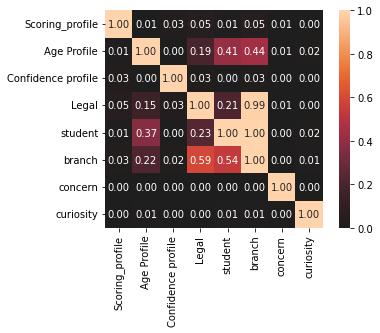

{'corr':                     Scoring_profile  Age Profile  Confidence profile  \
 Scoring_profile            1.000000     0.006727            0.030426   
 Age Profile                0.008231     1.000000            0.001875   
 Confidence profile         0.031353     0.001579            1.000000   
 Legal                      0.049987     0.154636            0.027055   
 student                    0.013509     0.373349            0.000918   
 branch                     0.029387     0.215161            0.017015   
 concern                    0.003082     0.002655            0.000861   
 curiosity                  0.000351     0.011969            0.002032   
 
                        Legal   student    branch   concern  curiosity  
 Scoring_profile     0.049569  0.012163  0.049089  0.005047   0.000561  
 Age Profile         0.187611  0.411267  0.439729  0.005319   0.023434  
 Confidence profile  0.027646  0.000851  0.029287  0.001453   0.003351  
 Legal               1.000000  0.210737  

In [110]:
associations(dfx, nom_nom_assoc = 'theil' ,nan_strategy='replace', annot=True)

### Assumptions

In [111]:
import pandas as pd
from scipy import stats

In [112]:
# Scipy normaltest
df = pd.DataFrame(corr_df) # dataset (100x21)
k2, p = stats.normaltest(df)
print (p.round(5))

[0.     0.     0.5586 0.     0.    ]


Except for Gk Score no variables are normally distributed.

### Regression (not recommended)

I want to see if I can predict Gk Score, using Age, Confidence, Concern, and Curiosity.

In [113]:
import seaborn as sns
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)

In [114]:
ad_data = corr_df

In [115]:
ad_data.head(n=2)

,Age,Confidence,Gk Score,Concern Score,Curiosity
id,,,,,
0,41,10,0.17,0.000000,24.068323
1,22,0,0.60,28.571429,5.124224


In [116]:
ad_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 773 entries, 0 to 1888
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Age            773 non-null    int64  
 1   Confidence     773 non-null    int64  
 2   Gk Score       773 non-null    float64
 3   Concern Score  773 non-null    float64
 4   Curiosity      773 non-null    float64
dtypes: float64(3), int64(2)
memory usage: 36.2 KB


In [117]:
ad_data.describe().round(3)

,Age,Confidence,Gk Score,Concern Score,Curiosity
count,773.000,773.000,773.000,773.000,773.000
mean,26.056,35.387,0.432,24.302,12.784
std,11.944,24.324,0.202,20.527,6.976
min,18.000,0.000,0.000,0.000,0.000
25%,19.000,15.000,0.290,0.000,6.832
50%,20.000,30.000,0.430,28.571,12.008
75%,29.000,50.000,0.570,42.857,17.184
max,79.000,100.000,1.000,100.000,29.296


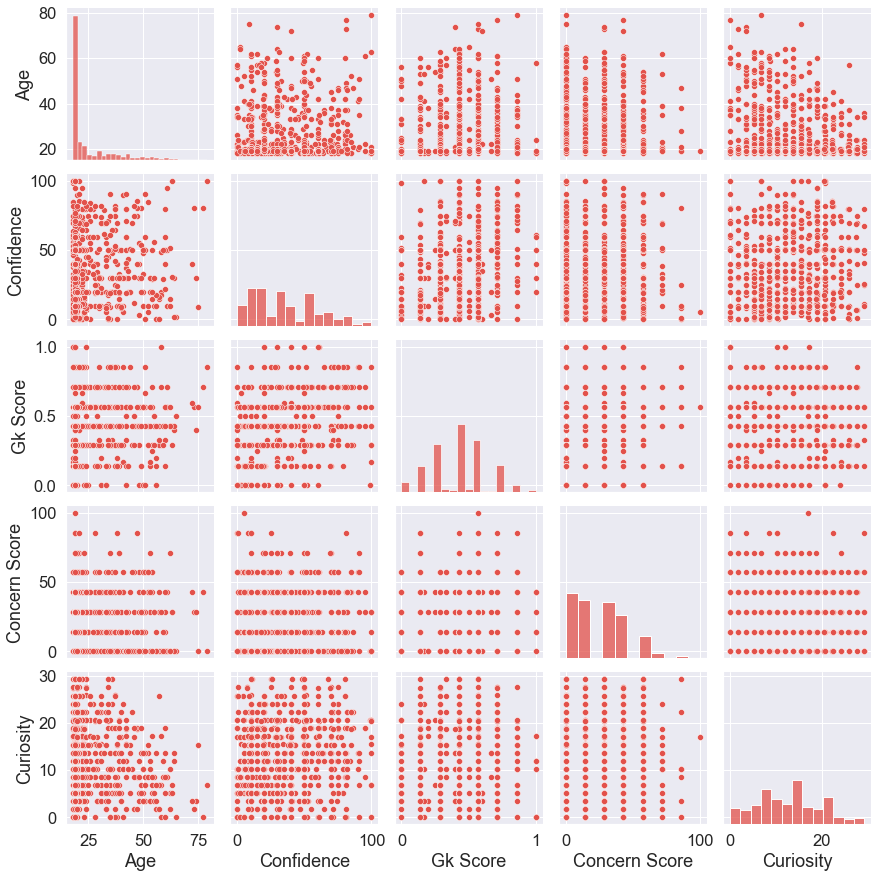

In [118]:
p = sns.pairplot(ad_data)

/home/mrinalmanu/miniconda3/envs/lda/lib/python3.10/site-packages/seaborn/axisgrid.py:2076: UserWarning:

The `size` parameter has been renamed to `height`; please update your code.



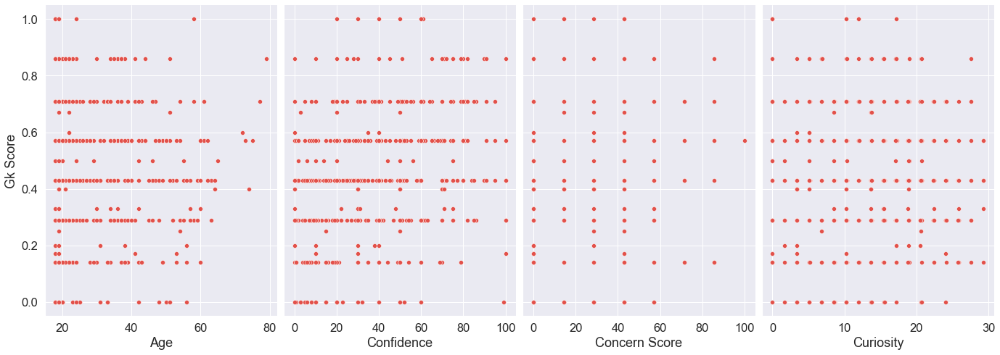

In [119]:
# visualize the relationship between the features and the response using scatterplots
p = sns.pairplot(ad_data, x_vars=['Age','Confidence', 'Concern Score', 'Curiosity'], y_vars='Gk Score', size=7, aspect=0.7)

Should not apply linear regression!

In [120]:
x = ad_data[['Concern Score', 'Curiosity', 'Age', 'Confidence']].copy()
y = ad_data['Gk Score']
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X = sc.fit_transform(x)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y,random_state = 0,test_size=0.25)
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn import linear_model

regr = linear_model.LinearRegression()
regr.fit(X_train,y_train)
y_pred = regr.predict(X_train)
print("R squared: {}".format(r2_score(y_true=y_train,y_pred=y_pred)))

R squared: 0.08192229873229995


0.08% variance is being explained. 

In [121]:
residuals = y_train.values-y_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {}".format(mean_residuals))

Mean of Residuals -1.6873855987394435e-17


/home/mrinalmanu/miniconda3/envs/lda/lib/python3.10/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/home/mrinalmanu/miniconda3/envs/lda/lib/python3.10/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



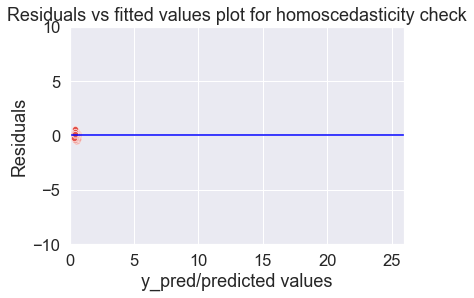

In [122]:
# homoscedasticity
p = sns.scatterplot(y_pred,residuals)
plt.xlabel('y_pred/predicted values')
plt.ylabel('Residuals')
plt.ylim(-10,10)
plt.xlim(0,26)
p = sns.lineplot([0,26],[0,0],color='blue')
p = plt.title('Residuals vs fitted values plot for homoscedasticity check')

In [123]:
import statsmodels.stats.api as sms
from statsmodels.compat import lzip
name = ['F statistic', 'p-value']
test = sms.het_goldfeldquandt(residuals, X_train)
lzip(name, test)

/home/mrinalmanu/miniconda3/envs/lda/lib/python3.10/site-packages/statsmodels/compat/pandas.py:65: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.



[('F statistic', 1.2188484150338144), ('p-value', 0.04752618099843922)]

Not homoscedastic.

/home/mrinalmanu/miniconda3/envs/lda/lib/python3.10/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



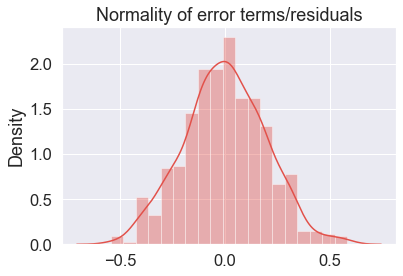

In [124]:
p = sns.distplot(residuals,kde=True)
p = plt.title('Normality of error terms/residuals')

/home/mrinalmanu/miniconda3/envs/lda/lib/python3.10/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/home/mrinalmanu/miniconda3/envs/lda/lib/python3.10/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



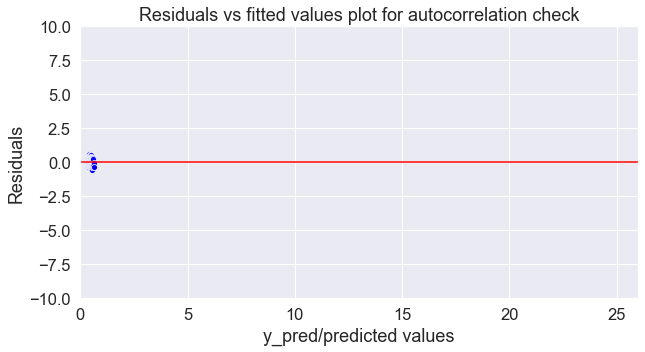

In [125]:
plt.figure(figsize=(10,5))
p = sns.lineplot(y_pred,residuals,marker='o',color='blue')
plt.xlabel('y_pred/predicted values')
plt.ylabel('Residuals')
plt.ylim(-10,10)
plt.xlim(0,26)
p = sns.lineplot([0,26],[0,0],color='red')
p = plt.title('Residuals vs fitted values plot for autocorrelation check')

#### correlations (show)

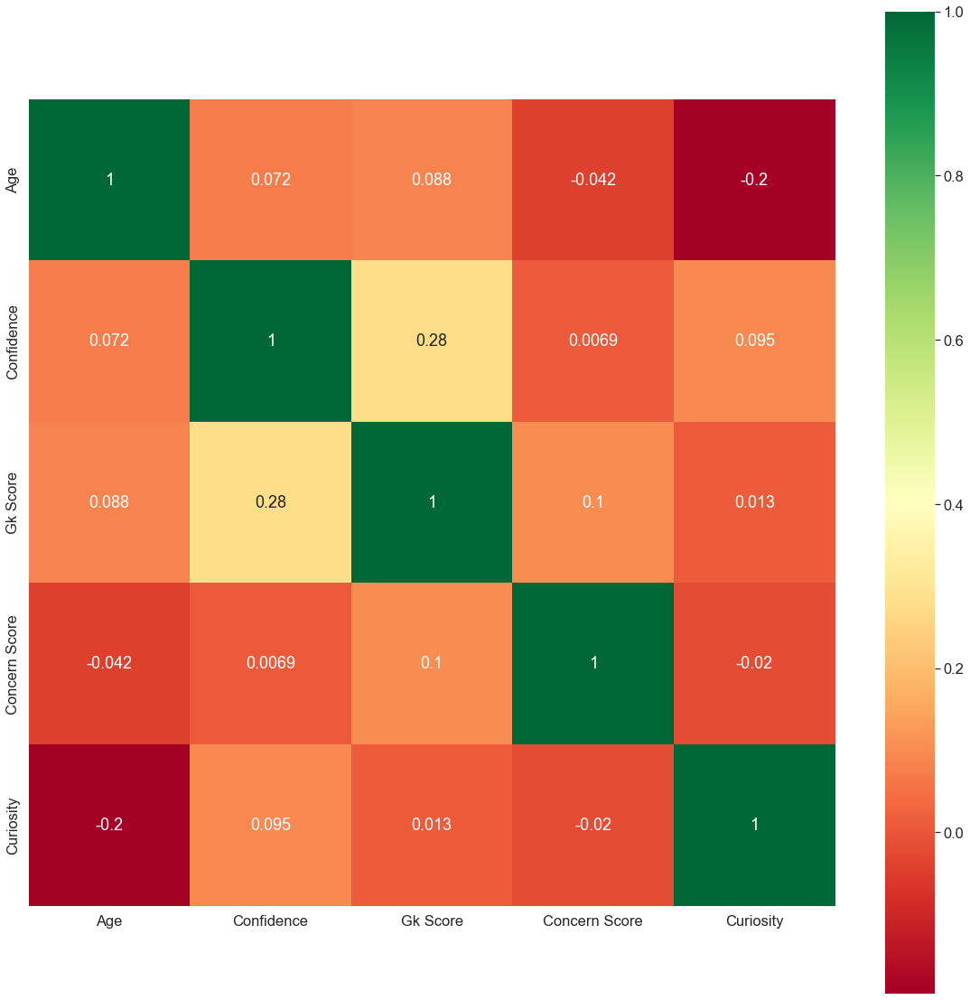

In [126]:
plt.figure(figsize=(20,20))  # on this line I just set the size of figure to 12 by 10.
p=sns.heatmap(ad_data.corr(), annot=True,cmap='RdYlGn',square=True)  # seaborn has very simple solution for heatmap

# Comparisions 

#### plans for comparison

In [127]:
from numpy import mean
from numpy import std
from scipy.stats import mannwhitneyu
from scipy.stats import ttest_ind
from scipy.stats import f_oneway
from scipy import stats
import scikit_posthocs as sp

In [128]:
dfx = filtered_annotated_df
dfx.head(n=2)

,id,Valid,Scoring_profile,gender,Age,Age Profile,Confidence,Confidence profile,Legal,student,branch,concern_score,concern_score_scaled,concern,curious_score,curious_score_scaled,curiosity,Progress,UserLanguage,Collection,value,Variable,Description,Option,Group,Composite,Tag
0,0,0.17,Low,Female,41,Older,10,Low confidence,Non law,Student,Other branch,1,0.0,Low,465.0,24.068323,High,100,RU,Pilot,99.9 percent,LE5.015,People differ in the amount of DNA they share....,99.9 percent,22,Yes,GK
1,0,0.17,Low,Female,41,Older,10,Low confidence,Non law,Student,Other branch,1,0.0,Low,465.0,24.068323,High,100,RU,Pilot,Of Master,LE2.059,Education,Of Master,33,Yes,General


Comparisons planned:
    
    gender - gk
    gender - confidence
    gender - curiosity
    gender - concern
    
    age - gk
    age - confidence
    age - curiosity
    age - concern
    
    legal - gk
    legal - confidence
    legal - curiosity
    legal - concern
    
    student - gk
    student - confidence
    student - curiosity
    student - concern
    
    branch - gk
    branch - confidence
    branch - curiosity
    branch - concern
    
    scoring_profile - confidence
    scoring_profile - curiosity
    scoring_profile - concern
    
    confidence_profile - gk
    confidence_profile - curiosity
    confidence_profile - concern
    
    concern_profile - gk
    concern_profile - confidence
    concern_profile - curiosity
    

In [129]:
import statistics

def add_p_value_annotation(fig, array_columns, subplot=None, _format=dict(interline=0.07, text_height=1.07, color='black')):
    ''' Adds notations giving the p-value between two box plot data (t-test two-sided comparison)
    
    Parameters:
    ----------
    fig: figure
        plotly boxplot figure
    array_columns: np.array
        array of which columns to compare 
        e.g.: [[0,1], [1,2]] compares column 0 with 1 and 1 with 2
    subplot: None or int
        specifies if the figures has subplots and what subplot to add the notation to
    _format: dict
        format characteristics for the lines

    Returns:
    -------
    fig: figure
        figure with the added notation
    '''
    # Specify in what y_range to plot for each pair of columns
    y_range = np.zeros([len(array_columns), 2])
    for i in range(len(array_columns)):
        y_range[i] = [1.01+i*_format['interline'], 1.02+i*_format['interline']]

    # Get values from figure
    fig_dict = fig.to_dict()

    # Get indices if working with subplots
    if subplot:
        if subplot == 1:
            subplot_str = ''
        else:
            subplot_str =str(subplot)
        indices = [] #Change the box index to the indices of the data for that subplot
        for index, data in enumerate(fig_dict['data']):
            #print(index, data['xaxis'], 'x' + subplot_str)
            if data['xaxis'] == 'x' + subplot_str:
                indices = np.append(indices, index)
        indices = [int(i) for i in indices]
        print((indices))
    else:
        subplot_str = ''

    # Print the p-values
    for index, column_pair in enumerate(array_columns):
        if subplot:
            data_pair = [indices[column_pair[0]], indices[column_pair[1]]]
        else:
            data_pair = column_pair

        # Mare sure it is selecting the data and subplot you want
        #print('0:', fig_dict['data'][data_pair[0]]['name'], fig_dict['data'][data_pair[0]]['xaxis'])
        #print('1:', fig_dict['data'][data_pair[1]]['name'], fig_dict['data'][data_pair[1]]['xaxis'])

        # Get the p-value
        pvalue = mannwhitneyu(
            fig_dict['data'][0]['y'],
            fig_dict['data'][1]['y'],
        )[1]
        
        annot_1 = [fig_dict['data'][0]['name'], round(fig_dict['data'][0]['y'].mean(), 3), 
                   round(statistics.stdev(fig_dict['data'][0]['y']), 3)]
        annot_2 = [fig_dict['data'][1]['name'], round(fig_dict['data'][1]['y'].mean(), 3), 
                   round(statistics.stdev(fig_dict['data'][1]['y']), 3)]

        if pvalue >= 0.05:
            symbol = 'ns {} {}'.format(annot_1, annot_2)
        elif pvalue >= 0.01: 
            symbol = '* {} {}'.format(annot_1, annot_2)
        elif pvalue >= 0.001:
            symbol = '** {} {}'.format(annot_1, annot_2)
        else:
            symbol = '*** {} {}'.format(annot_1, annot_2)
        # Vertical line
        fig.add_shape(type="line",
            xref="x"+subplot_str, yref="y"+subplot_str+" domain",
            x0=column_pair[0], y0=y_range[index][0], 
            x1=column_pair[0], y1=y_range[index][1],
            line=dict(color=_format['color'], width=2,)
        )
        # Horizontal line
        fig.add_shape(type="line",
            xref="x"+subplot_str, yref="y"+subplot_str+" domain",
            x0=column_pair[0], y0=y_range[index][1], 
            x1=column_pair[1], y1=y_range[index][1],
            line=dict(color=_format['color'], width=2,)
        )
        # Vertical line
        fig.add_shape(type="line",
            xref="x"+subplot_str, yref="y"+subplot_str+" domain",
            x0=column_pair[1], y0=y_range[index][0], 
            x1=column_pair[1], y1=y_range[index][1],
            line=dict(color=_format['color'], width=2,)
        )
        ## add text at the correct x, y coordinates
        ## for bars, there is a direct mapping from the bar number to 0, 1, 2...
        fig.add_annotation(dict(font=dict(color=_format['color'],size=14),
            x=(column_pair[0] + column_pair[1])/2,
            y=y_range[index][1]*_format['text_height'],
            showarrow=False,
            text=symbol,
            textangle=0,
            xref="x"+subplot_str,
            yref="y"+subplot_str+" domain"
        ))
    return fig

#### by gender - GK [t test because normal] 

In [130]:
xdf = dfx[['id', 'gender', 'Valid']]
xdf = xdf.drop_duplicates(subset='id')

In [131]:
xdf['gender'] = xdf.gender.map(str)
xdf['Valid'] = xdf.Valid.map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['gender'] == 'Female']['Valid'],
    name = 'Female',
    marker = dict(
        color = 'rgb(214, 12, 140)'
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['gender'] == 'Male']['Valid'],
    name = 'Male',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
data = [trace0, trace1]
layout = go.Layout(
    title = "Gender differences in GK scores in {} participants".format(len(xdf))
)

fig = go.Figure(data=data,layout=layout)


data1 = xdf.loc[xdf['gender'] == 'Female']['Valid']
data2 = xdf.loc[xdf['gender'] == 'Male']['Valid']

# summarize
print('GK Females: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('GK Males: mean=%.3f stdv=%.3f,N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = mannwhitneyu(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')
    
## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Genders (Male, Female)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "GK Score (0-1)",
        title_standoff = 25)

fig = add_p_value_annotation(fig, [[0,1]])
fig.update_layout(showlegend=False)

fig.show()

GK Females: mean=0.434 stdv=0.203, N=497.000
GK Males: mean=0.430 stdv=0.202,N=276.000
Statistics=68571.000, p=0.996
Same distribution (fail to reject H0)


In [132]:
py.iplot(fig)
# summarize
print('GK Females: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('GK Males: mean=%.3f stdv=%.3f,N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = mannwhitneyu(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')
    


GK Females: mean=0.434 stdv=0.203, N=497.000
GK Males: mean=0.430 stdv=0.202,N=276.000
Statistics=68571.000, p=0.996
Same distribution (fail to reject H0)


There is no difference in GK by gender.

#### by gender - confidence [Mann-Whitney]

In [133]:
xdf = dfx[['id', 'gender', 'Confidence']]
xdf = xdf.drop_duplicates(subset='id')

In [134]:
xdf['gender'] = xdf.gender.map(str)
xdf['Confidence'] = xdf.Confidence.map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['gender'] == 'Female']['Confidence'],
    name = 'Female',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['gender'] == 'Male']['Confidence'],
    name = 'Males',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
data = [trace0, trace1]
layout = go.Layout(
    title = "Genders differences in Confidence Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)
## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Genders (Male, Female)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Confidence Score (0-100)",
        title_standoff = 25)

fig = add_p_value_annotation(fig, [[0,1]])
fig.update_layout(showlegend=False)

fig.show()

In [135]:
py.iplot(fig)

data1 = xdf.loc[xdf['gender'] == 'Female']['Confidence']
data2 = xdf.loc[xdf['gender'] == 'Male']['Confidence']

# summarize
print('Confidence Females: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('Confidence Males: mean=%.3f stdv=%.3f,N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = mannwhitneyu(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

Confidence Females: mean=35.161 stdv=23.455, N=497.000
Confidence Males: mean=35.793 stdv=25.768,N=276.000
Statistics=69016.000, p=0.885
Same distribution (fail to reject H0)


No difference in confidence by gender.

#### by gender - curiosity [Mann-Whitney] 

In [136]:
xdf = dfx[['id', 'gender', 'curious_score_scaled']]
xdf = xdf.drop_duplicates(subset='id')


xdf['gender'] = xdf.gender.map(str)
xdf['curious_score_scaled'] = xdf.curious_score_scaled.map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['gender'] == 'Female']['curious_score_scaled'],
    name = 'Female',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['gender'] == 'Male']['curious_score_scaled'],
    name = 'Male',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
data = [trace0, trace1]
layout = go.Layout(
    title = "Genders differences in Curiosity Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)


## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Genders (Male, Female)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Scaled Curiosity Score (0-100)",
        title_standoff = 25)

fig = add_p_value_annotation(fig, [[0,1]])
fig.update_layout(showlegend=False)

fig.show()


In [137]:
py.iplot(fig)

data1 = xdf.loc[xdf['gender'] == 'Female']['curious_score_scaled']
data2 = xdf.loc[xdf['gender'] == 'Male']['curious_score_scaled']

# summarize
print('Curiosity Females: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('Curiosity Males: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = mannwhitneyu(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

Curiosity Females: mean=13.304 stdv=6.796, N=497.000
Curiosity Males: mean=11.849 stdv=7.183, N=276.000
Statistics=76718.000, p=0.006
Different distribution (reject H0)


No difference in curiosity by gender.

#### by gender - concern [Mann-Whitney]

In [138]:
xdf = dfx[['id', 'gender', 'concern_score_scaled']]
xdf = xdf.drop_duplicates(subset='id')

xdf['gender'] = xdf.gender.map(str)
xdf['concern_score_scaled'] = xdf.concern_score_scaled.map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['gender'] == 'Female']['concern_score_scaled'],
    name = 'Female',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['gender'] == 'Male']['concern_score_scaled'],
    name = 'Male',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
data = [trace0, trace1]
layout = go.Layout(
    title = "Gender differences in Scaled Concern Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)


## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Genders (Male, Female)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Scaled Confidence Score (0-100)",
        title_standoff = 25)

fig = add_p_value_annotation(fig, [[0,1]])
fig.update_layout(showlegend=False)

fig.show()

In [139]:
py.iplot(fig)


data1 = xdf.loc[xdf['gender'] == 'Female']['concern_score_scaled']
data2 = xdf.loc[xdf['gender'] == 'Male']['concern_score_scaled']

# summarize
print('Concern Females: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('Concern Males: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = mannwhitneyu(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

Concern Females: mean=24.231 stdv=20.537, N=497.000
Concern Males: mean=24.431 stdv=20.472, N=276.000
Statistics=68325.000, p=0.929
Same distribution (fail to reject H0)


No difference in concern by gender.

#### age - gk

In [140]:
xdf = dfx[['id', 'Age Profile', 'Valid']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['Age Profile'] = xdf['Age Profile'].map(str) 
xdf['Valid'] = xdf['Valid'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['Age Profile'] == 'Older']['Valid'],
    name = 'Older',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['Age Profile'] == 'Younger']['Valid'],
    name = 'Younger',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
data = [trace0, trace1]
layout = go.Layout(
    title = "Age differences in GK Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)

## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Age (Older, Younger)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Scaled GK Score (0-1)",
        title_standoff = 25)

fig = add_p_value_annotation(fig, [[0,1]])
fig.update_layout(showlegend=False)

fig.show()

In [141]:
py.iplot(fig)


data1 = xdf.loc[xdf['Age Profile'] == 'Older']['Valid']
data2 = xdf.loc[xdf['Age Profile'] == 'Younger']['Valid']

# summarize
print('Gk Scores Older: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('Gk Scores Younger: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = ttest_ind(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

Gk Scores Older: mean=0.461 stdv=0.215, N=174.000
Gk Scores Younger: mean=0.424 stdv=0.198, N=599.000
Statistics=2.164, p=0.031
Different distribution (reject H0)


#### age - confidence

In [142]:
xdf = dfx[['id', 'Age Profile', 'Confidence']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['Age Profile'] = xdf['Age Profile'].map(str) 
xdf['Confidence'] = xdf['Confidence'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['Age Profile'] == 'Older']['Confidence'],
    name = 'Older',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['Age Profile'] == 'Younger']['Confidence'],
    name = 'Younger',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
data = [trace0, trace1]
layout = go.Layout(
    title = "Age differences in Confidence Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)


## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Age (Older, Younger)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Scaled Confidence Score (0-100)",
        title_standoff = 25)

fig = add_p_value_annotation(fig, [[0,1]])
fig.update_layout(showlegend=False)

fig.show()


In [143]:
py.iplot(fig)


data1 = xdf.loc[xdf['Age Profile'] == 'Older']['Confidence']
data2 = xdf.loc[xdf['Age Profile'] == 'Younger']['Confidence']

# summarize
print('Confidence  Older: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('Confidence  Younger: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = mannwhitneyu(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

Confidence  Older: mean=38.385 stdv=26.268, N=174.000
Confidence  Younger: mean=34.516 stdv=23.637, N=599.000
Statistics=55985.500, p=0.135
Same distribution (fail to reject H0)


#### age - curiosity

In [144]:
xdf = dfx[['id', 'Age Profile', 'curious_score_scaled']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['Age Profile'] = xdf['Age Profile'].map(str) 
xdf['curious_score_scaled'] = xdf['curious_score_scaled'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['Age Profile'] == 'Older']['curious_score_scaled'],
    name = 'Older',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['Age Profile'] == 'Younger']['curious_score_scaled'],
    name = 'Younger',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
data = [trace0, trace1]
layout = go.Layout(
    title = "Age differences in Curiosity Scores {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)

## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Age (Older, Younger)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Scaled Curiosity Score (0-100)",
        title_standoff = 25)

fig = add_p_value_annotation(fig, [[0,1]])
fig.update_layout(showlegend=False)

fig.show()


In [145]:
py.iplot(fig)


data1 = xdf.loc[xdf['Age Profile'] == 'Older']['curious_score_scaled']
data2 = xdf.loc[xdf['Age Profile'] == 'Younger']['curious_score_scaled']

# summarize
print('Curious Score Older: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('Curious Score Younger: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = mannwhitneyu(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

Curious Score Older: mean=10.600 stdv=6.968, N=174.000
Curious Score Younger: mean=13.419 stdv=6.843, N=599.000
Statistics=39613.000, p=0.000
Different distribution (reject H0)


#### age - concern

In [146]:
xdf = dfx[['id', 'Age Profile', 'concern_score_scaled']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['Age Profile'] = xdf['Age Profile'].map(str) 
xdf['concern_score_scaled'] = xdf['concern_score_scaled'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['Age Profile'] == 'Older']['concern_score_scaled'],
    name = 'Older',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['Age Profile'] == 'Younger']['concern_score_scaled'],
    name = 'Younger',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
data = [trace0, trace1]
layout = go.Layout(
    title = "Age differences in Scaled Concern Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)

## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Age (Older, Younger)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Scaled Concern Score (0-100)",
        title_standoff = 25)

fig = add_p_value_annotation(fig, [[0,1]])
fig.update_layout(showlegend=False)

fig.show()


In [147]:
py.iplot(fig)


data1 = xdf.loc[xdf['Age Profile'] == 'Older']['concern_score_scaled']
data2 = xdf.loc[xdf['Age Profile'] == 'Younger']['concern_score_scaled']

# summarize
print('Concern Score Older: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('Concern Score Younger: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = mannwhitneyu(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

Concern Score Older: mean=22.906 stdv=21.268, N=174.000
Concern Score Younger: mean=24.708 stdv=20.272, N=599.000
Statistics=48868.500, p=0.200
Same distribution (fail to reject H0)


#### legal - gk [difference]

In [148]:
xdf = dfx[['id', 'Legal', 'Valid']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['Legal'] = xdf['Legal'].map(str) 
xdf['Valid'] = xdf['Valid'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['Legal'] == 'Non law']['Valid'],
    name = 'Non law',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['Legal'] == 'Law']['Valid'],
    name = 'Law',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
data = [trace0, trace1]
layout = go.Layout(
    title = "Non law/Law related differences in GK Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)

## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Legal (Non law, Law)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Scaled GK Score (0-1)",
        title_standoff = 25)

fig = add_p_value_annotation(fig, [[0,1]])
fig.update_layout(showlegend=False)

fig.show()


In [149]:
py.iplot(fig)


data1 = xdf.loc[xdf['Legal'] == 'Non law']['Valid']
data2 = xdf.loc[xdf['Legal'] == 'Law']['Valid']

# summarize
print('Gk Scores - Not related to law: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('Gk Scores - Related to law: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = ttest_ind(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

Gk Scores - Not related to law: mean=0.470 stdv=0.202, N=503.000
Gk Scores - Related to law: mean=0.361 stdv=0.183, N=270.000
Statistics=7.377, p=0.000
Different distribution (reject H0)


#### legal - curiosity

In [150]:
xdf = dfx[['id', 'Legal', 'curious_score_scaled']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['Legal'] = xdf['Legal'].map(str) 
xdf['curious_score_scaled'] = xdf['curious_score_scaled'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['Legal'] == 'Non law']['curious_score_scaled'],
    name = 'Non law',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['Legal'] == 'Law']['curious_score_scaled'],
    name = 'Law',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
data = [trace0, trace1]
layout = go.Layout(
    title = "Non law/ Law differences in Scaled Curiosity Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)

## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Legal (Non law, Law)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Scaled Curiosity Score (0-100)",
        title_standoff = 25)

fig = add_p_value_annotation(fig, [[0,1]])
fig.update_layout(showlegend=False)

fig.show()


In [151]:
py.iplot(fig)


data1 = xdf.loc[xdf['Legal'] == 'Non law']['curious_score_scaled']
data2 = xdf.loc[xdf['Legal'] == 'Law']['curious_score_scaled']

# summarize
print('Curious - Not related to law: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('Curious - Related to law: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = mannwhitneyu(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

Curious - Not related to law: mean=12.698 stdv=7.030, N=503.000
Curious - Related to law: mean=12.946 stdv=6.858, N=270.000
Statistics=66481.000, p=0.630
Same distribution (fail to reject H0)


#### legal - concern

In [152]:
xdf = dfx[['id', 'Legal', 'concern_score_scaled']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['Legal'] = xdf['Legal'].map(str) 
xdf['concern_score_scaled'] = xdf['concern_score_scaled'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['Legal'] == 'Non law']['concern_score_scaled'],
    name = 'Non law',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['Legal'] == 'Law']['concern_score_scaled'],
    name = 'Law',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
data = [trace0, trace1]
layout = go.Layout(
    title = "Non law/ law differences in Scaled Concern Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)

## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Legal (Non law, Law)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Scaled Concern Score (0-100)",
        title_standoff = 25)

fig = add_p_value_annotation(fig, [[0,1]])
fig.update_layout(showlegend=False)

fig.show()


In [153]:
py.iplot(fig)


data1 = xdf.loc[xdf['Legal'] == 'Non law']['concern_score_scaled']
data2 = xdf.loc[xdf['Legal'] == 'Law']['concern_score_scaled']

# summarize
print('Concern Scores - Not related to law: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('Concern Scores - Related to law: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = mannwhitneyu(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

Concern Scores - Not related to law: mean=23.544 stdv=20.410, N=503.000
Concern Scores - Related to law: mean=25.714 stdv=20.632, N=270.000
Statistics=63942.500, p=0.170
Same distribution (fail to reject H0)


**legal - confidence**

In [154]:
xdf = dfx[['id', 'Legal', 'Confidence']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['Legal'] = xdf['Legal'].map(str) 
xdf['Confidence'] = xdf['Confidence'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['Legal'] == 'Non law']['Confidence'],
    name = 'Non law',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['Legal'] == 'Law']['Confidence'],
    name = 'Law',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
data = [trace0, trace1]
layout = go.Layout(
    title = "Non law/ law differences in Confidence Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)

## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Legal (Non law, Law)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Confidence Score (0-100)",
        title_standoff = 25)

fig = add_p_value_annotation(fig, [[0,1]])
fig.update_layout(showlegend=False)

fig.show()


In [155]:
py.iplot(fig)


data1 = xdf.loc[xdf['Legal'] == 'Non law']['Confidence']
data2 = xdf.loc[xdf['Legal'] == 'Law']['Confidence']

# summarize
print('Confidence - Not related to law: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('Confidence - Related to law: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = mannwhitneyu(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

Confidence - Not related to law: mean=39.847 stdv=24.982, N=503.000
Confidence - Related to law: mean=27.078 stdv=20.563, N=270.000
Statistics=88543.500, p=0.000
Different distribution (reject H0)


#### student - gk

In [156]:
xdf = dfx[['id', 'student', 'Valid']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['student'] = xdf['student'].map(str) 
xdf['Valid'] = xdf['Valid'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['student'] == 'Student']['Valid'],
    name = 'Student',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['student'] == 'Not student']['Valid'],
    name = 'Non Student',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
data = [trace0, trace1]
layout = go.Layout(
    title = "Student/ Non student differences in Scaled GK Scores {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)


## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Student (Student, Non Student)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Scaled GK Score (0-1)",
        title_standoff = 25)

fig = add_p_value_annotation(fig, [[0,1]])
fig.update_layout(showlegend=False)

fig.show()

In [157]:
py.iplot(fig)


data1 = xdf.loc[xdf['student'] == 'Student']['Valid']
data2 = xdf.loc[xdf['student'] == 'Not student']['Valid']

# summarize
print('Gk Scores - Student: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('Gk Scores - Not student: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = ttest_ind(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

Gk Scores - Student: mean=0.416 stdv=0.195, N=561.000
Gk Scores - Not student: mean=0.476 stdv=0.215, N=212.000
Statistics=-3.737, p=0.000
Different distribution (reject H0)


#### student - confidence [difference]

In [158]:
xdf = dfx[['id', 'student', 'Confidence']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['student'] = xdf['student'].map(str) 
xdf['Confidence'] = xdf['Confidence'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['student'] == 'Student']['Confidence'],
    name = 'Student',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['student'] == 'Not student']['Confidence'],
    name = 'Non Student',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
data = [trace0, trace1]
layout = go.Layout(
    title = "Student/ non student differences in Scaled Confidence Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)


## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Student (Student, Non Student)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Confidence Score (0-100)",
        title_standoff = 25)

fig = add_p_value_annotation(fig, [[0,1]])
fig.update_layout(showlegend=False)

fig.show()

In [159]:
py.iplot(fig)


data1 = xdf.loc[xdf['student'] == 'Student']['Confidence']
data2 = xdf.loc[xdf['student'] == 'Not student']['Confidence']

# summarize
print('Confidence - Student: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('Confidence - Non student: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = ttest_ind(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

Confidence - Student: mean=34.194 stdv=23.949, N=561.000
Confidence - Non student: mean=38.542 stdv=24.959, N=212.000
Statistics=-2.223, p=0.027
Different distribution (reject H0)


#### student - curiosity [difference]

In [160]:
xdf = dfx[['id', 'student', 'curious_score_scaled']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['student'] = xdf['student'].map(str) 
xdf['curious_score_scaled'] = xdf['curious_score_scaled'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['student'] == 'Student']['curious_score_scaled'],
    name = 'Student',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['student'] == 'Not student']['curious_score_scaled'],
    name = 'Non Student',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
data = [trace0, trace1]
layout = go.Layout(
    title = "Student/ Non student differences in Scaled Curiosity Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)


## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Student (Student, Non Student)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Scaled Curiosity Score (0-100)",
        title_standoff = 25)

fig = add_p_value_annotation(fig, [[0,1]])
fig.update_layout(showlegend=False)

fig.show()

In [161]:
py.iplot(fig)


data1 = xdf.loc[xdf['student'] == 'Student']['curious_score_scaled']
data2 = xdf.loc[xdf['student'] == 'Not student']['curious_score_scaled']

# summarize
print('curious_score_scaled - Student: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('curious_score_scaled - Not student: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = ttest_ind(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

curious_score_scaled - Student: mean=13.402 stdv=6.933, N=561.000
curious_score_scaled - Not student: mean=11.149 stdv=6.807, N=212.000
Statistics=4.047, p=0.000
Different distribution (reject H0)


#### student - concern

In [162]:
xdf = dfx[['id', 'student', 'concern_score_scaled']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['student'] = xdf['student'].map(str) 
xdf['concern_score_scaled'] = xdf['concern_score_scaled'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['student'] == 'Student']['concern_score_scaled'],
    name = 'Student',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['student'] == 'Not student']['concern_score_scaled'],
    name = 'Non Student',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
data = [trace0, trace1]
layout = go.Layout(
    title = "Student/ Non Student differences in Scaled Concern Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)


## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Student (Student, Non Student)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Scaled Concern Score (0-100)",
        title_standoff = 25)

fig = add_p_value_annotation(fig, [[0,1]])
fig.update_layout(showlegend=False)

fig.show()

In [163]:
py.iplot(fig)


data1 = xdf.loc[xdf['student'] == 'Student']['concern_score_scaled']
data2 = xdf.loc[xdf['student'] == 'Not student']['concern_score_scaled']

# summarize
print('concern_score_scaled - Student: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('concern_score_scaled - Not student: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = ttest_ind(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

concern_score_scaled - Student: mean=23.988 stdv=20.474, N=561.000
concern_score_scaled - Not student: mean=25.135 stdv=20.598, N=212.000
Statistics=-0.693, p=0.489
Same distribution (fail to reject H0)


#### branch - gk [difference] onewayaov

In [164]:
import statistics

def multiple_add_p_value_annotation(fig, array_columns, subplot=None, _format=dict(interline=0.07, text_height=1.07, color='black')):
    ''' Adds notations giving the p-value between two box plot data (t-test two-sided comparison)
    
    Parameters:
    ----------
    fig: figure
        plotly boxplot figure
    array_columns: np.array
        array of which columns to compare 
        e.g.: [[0,1], [1,2]] compares column 0 with 1 and 1 with 2
    subplot: None or int
        specifies if the figures has subplots and what subplot to add the notation to
    _format: dict
        format characteristics for the lines

    Returns:
    -------
    fig: figure
        figure with the added notation
    '''
    # Specify in what y_range to plot for each pair of columns
    y_range = np.zeros([len(array_columns), 2])
    for i in range(len(array_columns)):
        y_range[i] = [1.01+i*_format['interline'], 1.02+i*_format['interline']]

    # Get values from figure
    fig_dict = fig.to_dict()

    # Get indices if working with subplots
    if subplot:
        if subplot == 1:
            subplot_str = ''
        else:
            subplot_str =str(subplot)
        indices = [] #Change the box index to the indices of the data for that subplot
        for index, data in enumerate(fig_dict['data']):
            #print(index, data['xaxis'], 'x' + subplot_str)
            if data['xaxis'] == 'x' + subplot_str:
                indices = np.append(indices, index)
        indices = [int(i) for i in indices]
        print((indices))
    else:
        subplot_str = ''

    # Print the p-values
    for index, column_pair in enumerate(array_columns):
        if subplot:
            data_pair = [indices[column_pair[0]], indices[column_pair[1]]]
        else:
            data_pair = column_pair

        # Mare sure it is selecting the data and subplot you want
        #print('0:', fig_dict['data'][data_pair[0]]['name'], fig_dict['data'][data_pair[0]]['xaxis'])
        #print('1:', fig_dict['data'][data_pair[1]]['name'], fig_dict['data'][data_pair[1]]['xaxis'])

        # Get the p-value
        pvalue = stats.kruskal(
            fig_dict['data'][0]['y'],
            fig_dict['data'][1]['y'],
            fig_dict['data'][2]['y']
        )[1]
        
        annot_1 = [fig_dict['data'][0]['name'], round(fig_dict['data'][0]['y'].mean(), 3), 
                   round(statistics.stdev(fig_dict['data'][0]['y']), 3)]
        annot_2 = [fig_dict['data'][1]['name'], round(fig_dict['data'][1]['y'].mean(), 3), 
                   round(statistics.stdev(fig_dict['data'][1]['y']), 3)]
        annot_3 = [fig_dict['data'][2]['name'], round(fig_dict['data'][2]['y'].mean(), 3), 
                   round(statistics.stdev(fig_dict['data'][2]['y']), 3)]

        if pvalue >= 0.05:
            symbol = 'ns {} {} {}'.format(annot_1, annot_2, annot_3)
        elif pvalue >= 0.01: 
            symbol = '* {} {} {}'.format(annot_1, annot_2, annot_3)
        elif pvalue >= 0.001:
            symbol = '** {} {} {}'.format(annot_1, annot_2, annot_3)
        else:
            symbol = '*** {} {} {}'.format(annot_1, annot_2, annot_3)
        # Vertical line
        fig.add_shape(type="line",
            xref="x"+subplot_str, yref="y"+subplot_str+" domain",
            x0=column_pair[0], y0=y_range[index][0], 
            x1=column_pair[0], y1=y_range[index][1],
            line=dict(color=_format['color'], width=2,)
        )
        # Horizontal line
        fig.add_shape(type="line",
            xref="x"+subplot_str, yref="y"+subplot_str+" domain",
            x0=column_pair[0], y0=y_range[index][1], 
            x1=column_pair[1], y1=y_range[index][1],
            line=dict(color=_format['color'], width=2,)
        )
        # Vertical line
        fig.add_shape(type="line",
            xref="x"+subplot_str, yref="y"+subplot_str+" domain",
            x0=column_pair[1], y0=y_range[index][0], 
            x1=column_pair[1], y1=y_range[index][1],
            line=dict(color=_format['color'], width=2,)
        )
        ## add text at the correct x, y coordinates
        ## for bars, there is a direct mapping from the bar number to 0, 1, 2...
        fig.add_annotation(dict(font=dict(color=_format['color'],size=14),
            x=(column_pair[0] + column_pair[1])/2,
            y=y_range[index][1]*_format['text_height'],
            showarrow=False,
            text=symbol,
            textangle=0,
            xref="x"+subplot_str,
            yref="y"+subplot_str+" domain"
        ))
    return fig

In [165]:
xdf = dfx[['id', 'branch', 'Valid']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['branch'] = xdf['branch'].map(str) 
xdf['Valid'] = xdf['Valid'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['branch'] == 'Other branch']['Valid'],
    name = 'Other branch',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['branch'] == 'Law branch']['Valid'],
    name = 'Law branch',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
trace3 = go.Box(
    y=xdf.loc[xdf['branch'] == 'Not a student']['Valid'],
    name = 'Non Student',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
data = [trace0, trace1, trace3]
layout = go.Layout(
    title = "Branch-wise differences in GK Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)


## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Branches (Other, Law, Non Student)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Scaled GK Score (0-1)",
        title_standoff = 25)

fig = multiple_add_p_value_annotation(fig, [[0,2]])
fig.update_layout(showlegend=False)

fig.show()


In [166]:
py.iplot(fig)


data1 = xdf.loc[xdf['branch'] == 'Other branch']['Valid']
data2 = xdf.loc[xdf['branch'] == 'Law branch']['Valid']
data3 = xdf.loc[xdf['branch'] == 'Not a student']['Valid']

# summarize
print('Gk - Other branch: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('Gk - Law branch: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))
print('Gk - Not a student: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data3), std(data3), len(data3)))

## Mann-Whitney U test
# compare samples
stat, p = stats.kruskal(data1, data2, data3)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

Gk - Other branch: mean=0.465 stdv=0.192, N=292.000
Gk - Law branch: mean=0.362 stdv=0.182, N=269.000
Gk - Not a student: mean=0.476 stdv=0.215, N=212.000
Statistics=56.088, p=0.000
Different distribution (reject H0)


In [167]:
x = [list(data1), list(data2), list(data3)]
gdf = sp.posthoc_dunn(x, p_adjust = 'holm').round(3)
gdf.columns = ['Gk Other branch', 'Gk Law branch', 'Gk Not a student']
gdf.index = ['Gk Other branch', 'Gk Law branch', 'Gk Not a student']
gdf

,Gk Other branch,Gk Law branch,Gk Not a student
Gk Other branch,1.000,0.0,0.663
Gk Law branch,0.000,1.0,0.000
Gk Not a student,0.663,0.0,1.000


#### branch - confidence [difference] kruskal

In [168]:
xdf = dfx[['id', 'branch', 'Confidence']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['branch'] = xdf['branch'].map(str) 
xdf['Confidence'] = xdf['Confidence'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['branch'] == 'Other branch']['Confidence'],
    name = 'Other branch',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['branch'] == 'Law branch']['Confidence'],
    name = 'Law branch',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
trace3 = go.Box(
    y=xdf.loc[xdf['branch'] == 'Not a student']['Confidence'],
    name = 'Non Student',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
data = [trace0, trace1, trace3]
layout = go.Layout(
    title = "Branch-wise differences in Scaled Confidence Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)



## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Branches (Other, Law, Non Student)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Scaled Confidence Score (0-100)",
        title_standoff = 25)

fig = multiple_add_p_value_annotation(fig, [[0,2]])
fig.update_layout(showlegend=False)

fig.show()



In [169]:
py.iplot(fig)


data1 = xdf.loc[xdf['branch'] == 'Other branch']['Confidence']
data2 = xdf.loc[xdf['branch'] == 'Law branch']['Confidence']
data3 = xdf.loc[xdf['branch'] == 'Not a student']['Confidence']

# summarize
print('Confidence - Other branch: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('Confidence - Law branch: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))
print('Confidence - Not a student: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data3), std(data3), len(data3)))

## Mann-Whitney U test
# compare samples
stat, p = stats.kruskal(data1, data2, data3)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

Confidence - Other branch: mean=40.795 stdv=24.913, N=292.000
Confidence - Law branch: mean=27.030 stdv=20.587, N=269.000
Confidence - Not a student: mean=38.542 stdv=24.959, N=212.000
Statistics=50.593, p=0.000
Different distribution (reject H0)


In [170]:
x = [list(data1), list(data2), list(data3)]
gdf = sp.posthoc_dunn(x, p_adjust = 'holm').round(3)
gdf.columns = ['Conf Other branch', 'Conf Law branch', 'Conf Not a student']
gdf.index = ['Conf Other branch', 'Conf Law branch', 'Conf Not a student']
gdf

,Conf Other branch,Conf Law branch,Conf Not a student
Conf Other branch,1.000,0.0,0.257
Conf Law branch,0.000,1.0,0.000
Conf Not a student,0.257,0.0,1.000


#### branch - curiosity [difference]

In [171]:
xdf = dfx[['id', 'branch', 'curious_score_scaled']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['branch'] = xdf['branch'].map(str) 
xdf['curious_score_scaled'] = xdf['curious_score_scaled'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['branch'] == 'Other branch']['curious_score_scaled'],
    name = 'Other branch',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['branch'] == 'Law branch']['curious_score_scaled'],
    name = 'Law branch',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
trace3 = go.Box(
    y=xdf.loc[xdf['branch'] == 'Not a student']['curious_score_scaled'],
    name = 'Non Student',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
data = [trace0, trace1, trace3]
layout = go.Layout(
    title = "Branch-wise differences in Scaled Curiosity Score for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)


## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Branches (Other, Law, Non Student)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Scaled Curiosity Score (0-100)",
        title_standoff = 25)

fig = multiple_add_p_value_annotation(fig, [[0,2]])
fig.update_layout(showlegend=False)

fig.show()



In [172]:
py.iplot(fig)


data1 = xdf.loc[xdf['branch'] == 'Other branch']['curious_score_scaled']
data2 = xdf.loc[xdf['branch'] == 'Law branch']['curious_score_scaled']
data3 = xdf.loc[xdf['branch'] == 'Not a student']['curious_score_scaled']

# summarize
print('curious_SS - Other branch: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('curious_SS - Law branch: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))
print('curious_SS - Not a student: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data3), std(data3), len(data3)))

## Mann-Whitney U test
# compare samples
stat, p = stats.kruskal(data1, data2, data3)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

x = [list(data1), list(data2), list(data3)]
gdf = sp.posthoc_dunn(x, p_adjust = 'holm').round(3)
gdf.columns = ['Cur Other branch', 'Cur Law branch', 'Cur Not a student']
gdf.index = ['Cur Other branch', 'Cur Law branch', 'Cur Not a student']
gdf

curious_SS - Other branch: mean=13.814 stdv=6.966, N=292.000
curious_SS - Law branch: mean=12.956 stdv=6.869, N=269.000
curious_SS - Not a student: mean=11.149 stdv=6.807, N=212.000
Statistics=18.858, p=0.000
Different distribution (reject H0)


,Cur Other branch,Cur Law branch,Cur Not a student
Cur Other branch,1.000,0.137,0.000
Cur Law branch,0.137,1.000,0.008
Cur Not a student,0.000,0.008,1.000


#### branch - concern [no diff]

In [173]:
xdf = dfx[['id', 'branch', 'concern_score_scaled']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['branch'] = xdf['branch'].map(str) 
xdf['concern_score_scaled'] = xdf['concern_score_scaled'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['branch'] == 'Other branch']['concern_score_scaled'],
    name = 'Other branch',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['branch'] == 'Law branch']['concern_score_scaled'],
    name = 'Law branch',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
trace3 = go.Box(
    y=xdf.loc[xdf['branch'] == 'Not a student']['concern_score_scaled'],
    name = 'Non Student',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
data = [trace0, trace1, trace3]
layout = go.Layout(
    title = "Branch-wise differences in Scaled Concern Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)


## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Branches (Other, Law, Non Student)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Scaled Concern Score (0-100)",
        title_standoff = 25)

fig = multiple_add_p_value_annotation(fig, [[0,2]])
fig.update_layout(showlegend=False)

fig.show()



In [174]:
py.iplot(fig)


data1 = xdf.loc[xdf['branch'] == 'Other branch']['concern_score_scaled']
data2 = xdf.loc[xdf['branch'] == 'Law branch']['concern_score_scaled']
data3 = xdf.loc[xdf['branch'] == 'Not a student']['concern_score_scaled']

# summarize
print('concern_SS - Other branch: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('concern_SS - Law branch: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))
print('concern_SS - Not a student: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data3), std(data3), len(data3)))

## Mann-Whitney U test
# compare samples
stat, p = stats.kruskal(data1, data2, data3)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

x = [list(data1), list(data2), list(data3)]


concern_SS - Other branch: mean=22.358 stdv=20.164, N=292.000
concern_SS - Law branch: mean=25.757 stdv=20.659, N=269.000
concern_SS - Not a student: mean=25.135 stdv=20.598, N=212.000
Statistics=4.242, p=0.120
Same distribution (fail to reject H0)


#### scoring_profile - confidence [diff]

In [175]:
xdf = dfx[['id', 'Scoring_profile', 'Confidence']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['Scoring_profile'] = xdf['Scoring_profile'].map(str) 
xdf['Confidence'] = xdf['Confidence'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['Scoring_profile'] == 'Low']['Confidence'],
    name = 'Low GK',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['Scoring_profile'] == 'High']['Confidence'],
    name = 'High GK',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)

data = [trace0, trace1]
layout = go.Layout(
    title = "High/ Low Scoring profile differences in Confidence Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)


## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Scoring Profile (Low GK, High GK)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Confidence Score (0-100)",
        title_standoff = 25)

fig = add_p_value_annotation(fig, [[0,1]])
fig.update_layout(showlegend=False)

fig.show()



In [176]:
py.iplot(fig)


data1 = xdf.loc[xdf['Scoring_profile'] == 'Low']['Confidence']
data2 = xdf.loc[xdf['Scoring_profile'] == 'High']['Confidence']

# summarize
print('Confidence - Low Gk: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('Confidence - High Gk: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = mannwhitneyu(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

Confidence - Low Gk: mean=31.381 stdv=22.965, N=496.000
Confidence - High Gk: mean=42.560 stdv=24.987, N=277.000
Statistics=50347.500, p=0.000
Different distribution (reject H0)


#### scoring_profile - curiosity [no diff]

In [177]:
xdf = dfx[['id', 'Scoring_profile', 'curious_score_scaled']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['Scoring_profile'] = xdf['Scoring_profile'].map(str) 
xdf['curious_score_scaled'] = xdf['curious_score_scaled'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['Scoring_profile'] == 'Low']['curious_score_scaled'],
    name = 'Low GK',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['Scoring_profile'] == 'High']['curious_score_scaled'],
    name = 'High GK',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)

data = [trace0, trace1]
layout = go.Layout(
    title = "High/ Low Scoring profile differences in Scaled Curiosity Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)


## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Scoring Profile (Low GK, High GK)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Scaled Curiosity Score (0-100)",
        title_standoff = 25)

fig = add_p_value_annotation(fig, [[0,1]])
fig.update_layout(showlegend=False)

fig.show()


In [178]:
py.iplot(fig)


data1 = xdf.loc[xdf['Scoring_profile'] == 'Low']['curious_score_scaled']
data2 = xdf.loc[xdf['Scoring_profile'] == 'High']['curious_score_scaled']

# summarize
print('curious_SS - Low Gk: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('curious_SS- High Gk: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = mannwhitneyu(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')


curious_SS - Low Gk: mean=12.873 stdv=6.867, N=496.000
curious_SS- High Gk: mean=12.627 stdv=7.152, N=277.000
Statistics=69962.000, p=0.670
Same distribution (fail to reject H0)


#### scoring_profile - concern [diff]

In [179]:
xdf = dfx[['id', 'Scoring_profile', 'concern_score_scaled']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['Scoring_profile'] = xdf['Scoring_profile'].map(str) 
xdf['concern_score_scaled'] = xdf['concern_score_scaled'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['Scoring_profile'] == 'Low']['concern_score_scaled'],
    name = 'Low GK',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['Scoring_profile'] == 'High']['concern_score_scaled'],
    name = 'High GK',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)

data = [trace0, trace1]
layout = go.Layout(
    title = "High/ Low Scoring profile differences in Scaled Concern Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)


## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Scoring Profile (Low GK, High GK)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Scaled Concern Score (0-100)",
        title_standoff = 25)

fig = add_p_value_annotation(fig, [[0,1]])
fig.update_layout(showlegend=False)

fig.show()



In [180]:
py.iplot(fig)


data1 = xdf.loc[xdf['Scoring_profile'] == 'Low']['concern_score_scaled']
data2 = xdf.loc[xdf['Scoring_profile'] == 'High']['concern_score_scaled']

# summarize
print('concern_score_scaled - Low Gk: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('concern_score_scaled - High Gk: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = mannwhitneyu(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')


concern_score_scaled - Low Gk: mean=23.041 stdv=19.579, N=496.000
concern_score_scaled - High Gk: mean=26.560 stdv=21.909, N=277.000
Statistics=63039.000, p=0.052
Same distribution (fail to reject H0)


#### confidence_profile - gk ['Diff']

In [181]:
xdf = dfx[['id', 'Confidence profile', 'Valid']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['Confidence profile'] = xdf['Confidence profile'].map(str) 
xdf['Valid'] = xdf['Valid'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['Confidence profile'] == 'Low confidence']['Valid'],
    name = 'Low confidence',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['Confidence profile'] == 'High confident']['Valid'],
    name = 'High confident',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)

data = [trace0, trace1]
layout = go.Layout(
    title = "Low/ High Confidence profile differences in GK Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)


## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Confidence Profile (Low Confidence, High Confidence)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "GK Score (0-1)",
        title_standoff = 25)

fig = add_p_value_annotation(fig, [[0,1]])
fig.update_layout(showlegend=False)

fig.show()



In [182]:
py.iplot(fig)


data1 = xdf.loc[xdf['Confidence profile'] == 'Low confidence']['Valid']
data2 = xdf.loc[xdf['Confidence profile'] == 'High confident']['Valid']

# summarize
print('Valid - Low confidence Gk: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('Valid - High confident Gk: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = mannwhitneyu(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')


Valid - Low confidence Gk: mean=0.400 stdv=0.196, N=519.000
Valid - High confident Gk: mean=0.497 stdv=0.200, N=254.000
Statistics=48434.000, p=0.000
Different distribution (reject H0)


#### confidence_profile - curiosity ['Diff']

In [183]:
xdf = dfx[['id', 'Confidence profile', 'curious_score_scaled']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['Confidence profile'] = xdf['Confidence profile'].map(str) 
xdf['curious_score_scaled'] = xdf['curious_score_scaled'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['Confidence profile'] == 'Low confidence']['curious_score_scaled'],
    name = 'Low confidence',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['Confidence profile'] == 'High confident']['curious_score_scaled'],
    name = 'High confidence',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)

data = [trace0, trace1]
layout = go.Layout(
    title = "Low/ High Confidence profile differences in Scaled Curiosity Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)


## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Confidence Profile (Low Confidence, High Confidence)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Scaled Curiosity Score (0-100)",
        title_standoff = 25)

fig = add_p_value_annotation(fig, [[0,1]])
fig.update_layout(showlegend=False)

fig.show()



In [184]:
py.iplot(fig)


data1 = xdf.loc[xdf['Confidence profile'] == 'Low confidence']['curious_score_scaled']
data2 = xdf.loc[xdf['Confidence profile'] == 'High confident']['curious_score_scaled']

# summarize
print('curious_SS- Low confidence Gk: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('curious_SS - High confident Gk: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = mannwhitneyu(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')


curious_SS- Low confidence Gk: mean=12.365 stdv=7.025, N=519.000
curious_SS - High confident Gk: mean=13.642 stdv=6.780, N=254.000
Statistics=58796.500, p=0.015
Different distribution (reject H0)


#### confidence_profile - concern ['no diff']

In [185]:
xdf = dfx[['id', 'Confidence profile', 'concern_score_scaled']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['Confidence profile'] = xdf['Confidence profile'].map(str) 
xdf['concern_score_scaled'] = xdf['concern_score_scaled'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['Confidence profile'] == 'Low confidence']['concern_score_scaled'],
    name = 'Low confidence',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['Confidence profile'] == 'High confident']['concern_score_scaled'],
    name = 'High confidence',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)

data = [trace0, trace1]
layout = go.Layout(
    title = "Low/ High Confidence profile differences in Scaled Concern Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)


## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Confidence Profile (Low Confidence, High Confidence)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Scaled Concern Score (0-100)",
        title_standoff = 25)

fig = add_p_value_annotation(fig, [[0,1]])
fig.update_layout(showlegend=False)

fig.show()


In [186]:
py.iplot(fig)


data1 = xdf.loc[xdf['Confidence profile'] == 'Low confidence']['concern_score_scaled']
data2 = xdf.loc[xdf['Confidence profile'] == 'High confident']['concern_score_scaled']

# summarize
print('concern_SS - Low confidence Gk: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('concern_SS - High confidence Gk: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))

## Mann-Whitney U test
# compare samples
stat, p = mannwhitneyu(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')


concern_SS - Low confidence Gk: mean=24.002 stdv=20.825, N=519.000
concern_SS - High confidence Gk: mean=24.916 stdv=19.849, N=254.000
Statistics=63443.500, p=0.386
Same distribution (fail to reject H0)


#### concern_profile - gk [difference]

In [187]:
xdf = dfx[['id', 'concern', 'Valid']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['concern'] = xdf['concern'].map(str) 
xdf['Valid'] = xdf['Valid'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['concern'] == 'Low']['Valid'],
    name = 'Low concern',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['concern'] == 'Medium']['Valid'],
    name = 'Medium concern',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
trace3 = go.Box(
    y=xdf.loc[xdf['concern'] == 'High']['Valid'],
    name = 'High concern',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
data = [trace0, trace1, trace3]

layout = go.Layout(
    title = "Low/ Medium/ High Concern profile differences in GK Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)


## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Concern Profile (Low Concern, Medium Concern, High Concern)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "GK Score (0-1)",
        title_standoff = 25)

fig = multiple_add_p_value_annotation(fig, [[0,2]])
fig.update_layout(showlegend=False)

fig.show()



In [188]:
py.iplot(fig)


data1 = xdf.loc[xdf['concern'] == 'Low']['Valid']
data2 = xdf.loc[xdf['concern'] == 'Medium']['Valid']
data3 = xdf.loc[xdf['concern'] == 'High']['Valid']

# summarize
print('Gk - Low concern: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('Gk - Medium concern: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))
print('Gk - High concern: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data3), std(data3), len(data3)))

## Mann-Whitney U test
# compare samples
stat, p = stats.kruskal(data1, data2, data3)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

gdf = sp.posthoc_dunn(x, p_adjust = 'holm').round(3)
gdf.columns = ['Gk Low concern', 'Gk Medium concern', 'Gk High concern']
gdf.index = ['Gk Low concern', 'Gk Medium concern', 'Gk High concern']
gdf

Gk - Low concern: mean=0.410 stdv=0.203, N=201.000
Gk - Medium concern: mean=0.428 stdv=0.196, N=348.000
Gk - High concern: mean=0.459 stdv=0.209, N=224.000
Statistics=6.558, p=0.038
Different distribution (reject H0)


,Gk Low concern,Gk Medium concern,Gk High concern
Gk Low concern,1.000,0.160,0.264
Gk Medium concern,0.160,1.000,0.765
Gk High concern,0.264,0.765,1.000


#### concern_profile - confidence [no diff]

In [189]:
xdf = dfx[['id', 'concern', 'Confidence']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['concern'] = xdf['concern'].map(str) 
xdf['Confidence'] = xdf['Confidence'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['concern'] == 'Low']['Confidence'],
    name = 'Low Concern',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['concern'] == 'Medium']['Confidence'],
    name = 'Medium Concern',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
trace3 = go.Box(
    y=xdf.loc[xdf['concern'] == 'High']['Confidence'],
    name = 'High Concern',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)


data = [trace0, trace1, trace3]

layout = go.Layout(
    title = "Low/ Medium/ High Concern profile differences in Scaled Confidence Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)


## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Concern Profile (Low Concern, Medium Concern, High Concern)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Confidence Score (0-100)",
        title_standoff = 25)

fig = multiple_add_p_value_annotation(fig, [[0,2]])
fig.update_layout(showlegend=False)

fig.show()



In [190]:
py.iplot(fig)


data1 = xdf.loc[xdf['concern'] == 'Low']['Confidence']
data2 = xdf.loc[xdf['concern'] == 'Medium']['Confidence']
data3 = xdf.loc[xdf['concern'] == 'High']['Confidence']

# summarize
print('Confidence - Low concern: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('Confidence - Medium concern: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))
print('Confidence - High concern: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data3), std(data3), len(data3)))

## Mann-Whitney U test
# compare samples
stat, p = stats.kruskal(data1, data2, data3)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

x = [list(data1), list(data2), list(data3)]


Confidence - Low concern: mean=34.184 stdv=25.671, N=201.000
Confidence - Medium concern: mean=35.621 stdv=23.182, N=348.000
Confidence - High concern: mean=36.103 stdv=24.716, N=224.000
Statistics=1.596, p=0.450
Same distribution (fail to reject H0)


#### concern_profile - curiosity [no diff]

In [191]:
xdf = dfx[['id', 'concern', 'curious_score_scaled']] 
xdf = xdf.drop_duplicates(subset='id')

xdf['concern'] = xdf['concern'].map(str) 
xdf['curious_score_scaled'] = xdf['curious_score_scaled'].map(float)

trace0 = go.Box(
    y=xdf.loc[xdf['concern'] == 'Low']['curious_score_scaled'],
    name = 'Low Concern',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=xdf.loc[xdf['concern'] == 'Medium']['curious_score_scaled'],
    name = 'Medium Concern',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
trace3 = go.Box(
    y=xdf.loc[xdf['concern'] == 'High']['curious_score_scaled'],
    name = 'High Concern',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
data = [trace0, trace1, trace3]

layout = go.Layout(
    title = "Low/ Medium/ High Concern profile differences in Scaled Curiosity Scores for {} participants".format(len(df))
)

fig = go.Figure(data=data,layout=layout)


## loop through the values you want to label and add them as annotations

fig.update_xaxes(
        tickangle = 0,
        title_text = "Concern Profile (Low Concern, Medium Concern, High Concern)",
        title_font = {"size": 14},
        title_standoff = 25)

fig.update_yaxes(
        title_text = "Scaled Curiosity Score (0-100)",
        title_standoff = 25)

fig = multiple_add_p_value_annotation(fig, [[0,2]])
fig.update_layout(showlegend=False)

fig.show()


In [192]:
py.iplot(fig)


data1 = xdf.loc[xdf['concern'] == 'Low']['curious_score_scaled']
data2 = xdf.loc[xdf['concern'] == 'Medium']['curious_score_scaled']
data3 = xdf.loc[xdf['concern'] == 'High']['curious_score_scaled']

# summarize
print('curious_SS - Low concern: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data1), std(data1), len(data1)))
print('curious_SS - Medium concern: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data2), std(data2), len(data2)))
print('curious_SS - High concern: mean=%.3f stdv=%.3f, N=%.3f' % (mean(data3), std(data3), len(data3)))

## Mann-Whitney U test
# compare samples
stat, p = stats.kruskal(data1, data2, data3)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

x = [list(data1), list(data2), list(data3)]


curious_SS - Low concern: mean=12.837 stdv=6.854, N=201.000
curious_SS - Medium concern: mean=12.888 stdv=6.799, N=348.000
curious_SS - High concern: mean=12.576 stdv=7.326, N=224.000
Statistics=0.454, p=0.797
Same distribution (fail to reject H0)


# Items 25,27,29,30 and prep for remaining GR variables + Individual plots

In [193]:
afx = filtered_annotated_df.iloc[:,0:17]
afx = afx.drop_duplicates(subset='id')
afx = afx[['id', 'Scoring_profile', 'Age Profile', 'Confidence profile', 'Legal', 'student', 'branch', 'concern', 'curiosity']]
afx.head(2)
afx = afx.melt(id_vars=['id'], 
              value_vars=['Scoring_profile', 'Age Profile', 'Confidence profile', 'Legal',
       'student', 'branch', 'concern', 'curiosity'],
              var_name='Description', value_name='Option')
afx.head(2)
afx['Variable'] = 'Class_X'
afx['Group'] = '77'
afx.head(2)
subset_fx = filtered_annotated_df[['id', 'Description', 'Option', 'Variable', 'Group']]
subset_fx.head()
concat_df = pd.concat([afx,subset_fx], axis=0)
concat_df.head(2)
list_of_values = afx.id.unique()
concat_df['id'] = concat_df['id'].map(int)
select_df =  concat_df[concat_df['id'].isin(list_of_values)]
len(select_df.id.unique())

773

### megadf + individual plots (show)

In [194]:
list_gp = ['25', '27', '29', '30']
other_df = new_large_df[new_large_df['Group'].isin(list_gp)]
other_df = other_df[['id', 'Description', 'Option', 'Variable', 'Group']].copy()
other_df

,id,Description,Option,Variable,Group
25740,0,Genetic data of our first degree blood relativ...,Yes1,LE3.141,25
25741,1,Genetic data of our first degree blood relativ...,Yes1,LE3.141,25
25742,5,Genetic data of our first degree blood relativ...,Do not know1,LE3.141,25
25743,6,Genetic data of our first degree blood relativ...,Yes1,LE3.141,25
25744,7,Genetic data of our first degree blood relativ...,Yes1,LE3.141,25
...,...,...,...,...,...
32443,1602,What concerns do participants have in relation...,Other,LE2.130,27
32444,1645,What concerns do participants have in relation...,Other,LE2.130,27
32445,1812,What concerns do participants have in relation...,Other,LE2.130,27
32446,1893,What concerns do participants have in relation...,Other,LE2.130,27


In [195]:
other_df.Group.unique()

array(['25', '30', '29', '27'], dtype=object)

In [196]:
other_df[other_df['Group'] == '30']

,id,Description,Option,Variable,Group
25921,0,Should there be a law regulating how a person ...,23andMe,LE3.141,30
25922,1,Should there be a law regulating how a person ...,23andMe,LE3.141,30
25923,5,Should there be a law regulating how a person ...,24 genetics,LE3.141,30
25924,6,Should there be a law regulating how a person ...,23andMe,LE3.141,30
25925,7,Should there be a law regulating how a person ...,23andMe,LE3.141,30
...,...,...,...,...,...
26097,321,Should there be a law regulating how a person ...,23andMe,LE3.141,30
26098,325,Should there be a law regulating how a person ...,23andMe,LE3.141,30
26099,327,Should there be a law regulating how a person ...,23andMe,LE3.141,30
26100,332,Should there be a law regulating how a person ...,23andMe,LE3.141,30


In [197]:
# while ndf
ndf = select_df
ndf.Group.unique()

array(['77', '22', '33', '34', '35', '36', '60', '37', '2', '4', '5', '7',
       '23', '10', '11', '12', '14', '15', '25', '30', '27', '1', '3',
       '13', '24', '16', '21', '19', '32', '57', '8', '9', '65', '66',
       '67', '58', '59', '61', '62', '63', '64', '46', '47', '55', '56',
       '29', '40', '6', '20', '17', '18', '43', '44', '48', '49', '51',
       '52', '41', '42'], dtype=object)

In [198]:
ndf

,id,Description,Option,Variable,Group
0,0,Scoring_profile,Low,Class_X,77
1,1,Scoring_profile,High,Class_X,77
2,3,Scoring_profile,High,Class_X,77
3,5,Scoring_profile,Low,Class_X,77
4,14,Scoring_profile,Low,Class_X,77
...,...,...,...,...,...
59935,1888,"On average, how much of their total DNA is the...",90 percent,LE5.017,59
59936,1888,Genetic contribution to the risk of developing...,One gene,LE5.018,61
59937,1888,"The DNA sequence in two different cells, for e...",Correct – One hundred percent identical,LE5.024,62
59938,1888,Some of the genes that relate to dyslexia also...,Correct - True,LE5.030,63


Select for groups 77 ('Scoring_profile', 'Age Profile', 'Confidence profile', 'Legal', 'student', 'branch', 'concern', 'curiosity'), and

23: how many legal guardians needed
24: should there be a law regulating genetic data
65: Dissemination of genetic knowledge to the general public
66: Policymaking – Contributing to working groups concerning the regulation of genetic data
67: Revising and updating ethical guidelines concerning genetic research and use of genetic data

The data has already been filtered and annotated for Language (russian), progress greater than 75, and those completed the gk items. In total 785 participants.

In [199]:
# group filter
ndf['Group'] = ndf['Group'].map(str)

select = ['23', '24', '65', '66', '67']
ndf["Group"] = ndf["Group"].map(str)
ndf = ndf[ndf['Group'].isin(select)]

ndf.shape

(7489, 5)

In [200]:
ndf = pd.concat([ndf, other_df]).reset_index()
ndf.shape

(12927, 6)

In [201]:
ndf[ndf['Group'] == '30']

,index,id,Description,Option,Variable,Group
7670,25921,0,Should there be a law regulating how a person ...,23andMe,LE3.141,30
7671,25922,1,Should there be a law regulating how a person ...,23andMe,LE3.141,30
7672,25923,5,Should there be a law regulating how a person ...,24 genetics,LE3.141,30
7673,25924,6,Should there be a law regulating how a person ...,23andMe,LE3.141,30
7674,25925,7,Should there be a law regulating how a person ...,23andMe,LE3.141,30
...,...,...,...,...,...,...
7846,26097,321,Should there be a law regulating how a person ...,23andMe,LE3.141,30
7847,26098,325,Should there be a law regulating how a person ...,23andMe,LE3.141,30
7848,26099,327,Should there be a law regulating how a person ...,23andMe,LE3.141,30
7849,26100,332,Should there be a law regulating how a person ...,23andMe,LE3.141,30


In [202]:
ndf.Option.unique()

array(['2', 'Future spouse or partner', 'Spouse or partner', 'Children',
       'Siblings', 'Other relatives', 'Friends', 'Strongly disagree', '6',
       'Agree', 'Strongly agree', '7', '5', 'Neutral', '1', 'Disagree',
       'Other', '3', '4', 'Yes1', 'Do not know1', 'No1', '23andMe',
       '24 genetics', '23mofang', 'Medical testing as Selfasinitiated',
       'Medical testing as Recommended for example by doctor',
       'Medical testing as Compulsory for example by a court or law enforcement',
       'Paternity testing as Selfasinitiated',
       'Paternity testing as Recommended for example by doctor',
       'Paternity testing as Compulsory for example by a court or law enforcement',
       'Ancestry testing as Selfasinitiated',
       'Ancestry testing as Recommended for example by doctor',
       'Ancestry testing as Compulsory for example by a court or law enforcement',
       'General interest as Selfasinitiated',
       'General interest as Recommended for example by docto

#### correcting labels for each item

In [203]:
### 23
filter = ndf["Group"] == '23'
ndf_23 = ndf[filter]
ndf_23['Option'] = ndf_23['Option'].map(str)
ndf_23['Option'].replace('1','One legal guardian sufficient',inplace=True)
ndf_23['Option'].replace('2','Two legal guardians need to agree',inplace=True)
ndf_23['Option'].replace('3','Medical facilities',inplace=True)
ndf_23['Option'].replace('4','The State',inplace=True)
ndf_23['Option'].replace('5','Prohibited until child has legal capacity',inplace=True)
ndf_23['Option'].replace('6','Do not know',inplace=True)
ndf_23['Option'].replace('7','Other',inplace=True)

### 
filter = ndf["Group"] == '65'
ndf_65 = ndf[filter]
ndf_65['Option'] = ndf_65['Option'].map(str)
ndf_65['Option'].replace('Agree','Agree to dissemination of GK',inplace=True)
ndf_65['Option'].replace('Strongly agree','Strongly agree to dissemination of GK',inplace=True)
ndf_65['Option'].replace('Neutral','Neutral towards to dissemination of GK',inplace=True)
ndf_65['Option'].replace('Disagree','Disagree to dissemination of GK',inplace=True)
ndf_65['Option'].replace('Strongly disagree','Strongly disagree to dissemination of GK',inplace=True)


### 
filter = ndf["Group"] == '66'
ndf_66 = ndf[filter]
ndf_66['Option'] = ndf_66['Option'].map(str)
ndf_66['Option'].replace('Agree','Agree to Policymaking',inplace=True)
ndf_66['Option'].replace('Strongly agree','Strongly agree to Policymaking',inplace=True)
ndf_66['Option'].replace('Neutral','Neutral towards to Policymaking',inplace=True)
ndf_66['Option'].replace('Disagree','Disagree to Policymaking',inplace=True)
ndf_66['Option'].replace('Strongly disagree','Strongly disagree to Policymaking',inplace=True)

###
filter = ndf["Group"] == '67'
ndf_67 = ndf[filter]
ndf_67['Option'] = ndf_67['Option'].map(str)
ndf_67['Option'].replace('Agree','Agree to Revising and Updating',inplace=True)
ndf_67['Option'].replace('Strongly agree','Strongly agree to Revising and Updating',inplace=True)
ndf_67['Option'].replace('Neutral','Neutral towards to Revising and Updating',inplace=True)
ndf_67['Option'].replace('Disagree','Disagree to Revising and Updating',inplace=True)
ndf_67['Option'].replace('Strongly disagree','Strongly disagree to Revising and Updating',inplace=True)

###
filter = ndf["Group"] == '24'
ndf_24 = ndf[filter]


###
filter = ndf["Group"] == '25'
ndf_25 = ndf[filter]
ndf_25['Option'] = ndf_25['Option'].map(str)
ndf_25['Option'].replace('Yes1','Yes there should be a law',inplace=True)
ndf_25['Option'].replace('No1','No there should not be a law',inplace=True)

###
filter = ndf["Group"] == '27'
ndf_27 = ndf[filter]

###
filter = ndf["Group"] == '29'
ndf_29 = ndf[filter]
ndf_29['Option'] = ndf_25['Option'].map(str)

###
filter = ndf["Group"] == '30'
ndf_30 = ndf[filter]
ndf_30['Option'] = ndf_30['Option'].map(str)


In [204]:
select_df['Group'] = select_df['Group'].map(str)

select = ['77']
cps = select_df[select_df['Group'].isin(select)]

#cps['Option'] = cps['Option']+' '+cps['Description']

### plots (show)

#### 29 - ever had genetic testing

In [205]:
ndf_29.head(2)

,index,id,Description,Option,Variable,Group
7851,26102,5,Have you ever had genetic testing and why?,NaN,LE2.003,29
7852,26104,10,Have you ever had genetic testing and why?,NaN,LE2.003,29


In [206]:
ndf_29_new = pd.merge(ndf_29, ndf29x, on='id')
ndf_29_new = ndf_29_new.drop_duplicates(subset=['id', 'Option_y'])
ndf_29_new['Option'] = ndf_29_new['Option_y']
ndf_29_new['Variable'] = ndf_29_new['Variable_y']
ndf_29_new['Group'] = ndf_29_new['Group_y']
ndf_29_new['Description'] = ndf_29_new['Description_y']
ndf_29_new = ndf_29_new[['id', 'Description', 'Option', 'Variable', 'Group']].copy()
ndf_29_new['Option'].replace('Other', 'No', inplace=True)
ndf_29_new.head(2)

,id,Description,Option,Variable,Group
0,5,Have you ever had genetic testing and why?,Medical testing - Self-initiated,LE2.003,29
1,5,Have you ever had genetic testing and why?,Ancestry testing - Self-initiated,LE2.009,29


In [207]:
cdf = ndf_29_new.groupby(["Group", "Description", "Variable"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
cdf['rating'] = nx.iloc[:,2]

wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 4]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

    
vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)

In [208]:
del ndfx['Option']
del ndfx['rating']
lex = ndfx.set_index(['Group','Description','Variable']).stack().reset_index()
lex["Option"] = lex['level_3']
lex["Count"] = lex[0]

del lex['level_3']
del lex[0]
lex


,Group,Description,Variable,Option,Count
0,29,Have you ever had genetic testing and why?,LE2.003,Medical testing - Self-initiated,207.0
1,29,Have you ever had genetic testing and why?,LE2.004,Medical testing - Recommended by doctor,209.0
2,29,Have you ever had genetic testing and why?,LE2.005,Medical testing - Compulsory by a court or law...,31.0
3,29,Have you ever had genetic testing and why?,LE2.006,Paternity testing - Self-initiated,34.0
4,29,Have you ever had genetic testing and why?,LE2.007,Paternity testing - Recommended by doctor,8.0
5,29,Have you ever had genetic testing and why?,LE2.008,Paternity testing - Compulsory by a court or l...,10.0
6,29,Have you ever had genetic testing and why?,LE2.009,Ancestry testing - Self-initiated,71.0
7,29,Have you ever had genetic testing and why?,LE2.010,Ancestry testing - Recommended by doctor,8.0
8,29,Have you ever had genetic testing and why?,LE2.011,Ancestry testing - Compulsory by a court or la...,5.0
9,29,Have you ever had genetic testing and why?,LE2.012,General interest - Self-initiated,139.0


In [209]:
x = lex.groupby(['Group','Description', 'Variable', 'Option'])['Count'].mean().round(2)
xf = x.groupby(level=[0, 1]).apply(lambda g: g / g.sum()).round(2).reset_index()
xf

,Group,Description,Variable,Option,Count
0,29,Have you ever had genetic testing and why?,LE2.003,Medical testing - Self-initiated,0.17
1,29,Have you ever had genetic testing and why?,LE2.004,Medical testing - Recommended by doctor,0.17
2,29,Have you ever had genetic testing and why?,LE2.005,Medical testing - Compulsory by a court or law...,0.03
3,29,Have you ever had genetic testing and why?,LE2.006,Paternity testing - Self-initiated,0.03
4,29,Have you ever had genetic testing and why?,LE2.007,Paternity testing - Recommended by doctor,0.01
5,29,Have you ever had genetic testing and why?,LE2.008,Paternity testing - Compulsory by a court or l...,0.01
6,29,Have you ever had genetic testing and why?,LE2.009,Ancestry testing - Self-initiated,0.06
7,29,Have you ever had genetic testing and why?,LE2.010,Ancestry testing - Recommended by doctor,0.01
8,29,Have you ever had genetic testing and why?,LE2.011,Ancestry testing - Compulsory by a court or la...,0.00
9,29,Have you ever had genetic testing and why?,LE2.012,General interest - Self-initiated,0.11


In [210]:
fig = px.bar(xf, x="Group", color="Option",
             y='Count',
             title="A Grouped Bar Chart With Plotly Express in Python",
             barmode='group',
             height=1080,
             text_auto=True
            )
fig.update_layout(
    title="Opinion about endeavours",
    xaxis_title="Item",
    yaxis_title="Proportion of response",
    legend_title="Options",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="RebeccaPurple"
    ),
barmode="stack",
)

fig.update_traces(showlegend=False)
fig.update_traces(marker_showscale=False)

fig.update_xaxes(
    showgrid=True,
    ticks="outside",
    tickson="boundaries",
    ticklen=1,
    tickmode='linear'
)

fig.show()

In [211]:
comp_df = ndf_29_new
#filter all empty strings from values
comp_df["Group"] = comp_df["Group"].map(str)
filter = comp_df["Group"] == '29'
ndf = comp_df[filter]
# Teaching people's role profile

temp_series = ndf['Option'].value_counts()
labels = (np.array(temp_series.index))
sizes = (np.array((temp_series / temp_series.sum())*100))

trace = go.Pie(labels=labels, values=sizes)
layout = go.Layout(
    title="Have you ever had genetic testing and why?"
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

In [212]:
df = ndf_29_new
df['Option'] = df['Option'].map(str)
xx = df['Option'].str.split('-', n=1, expand=True)

comp_df = xx

temp_series = xx[0].value_counts()
labels = (np.array(temp_series.index))
sizes = (np.array((temp_series / temp_series.sum())*100))

trace = go.Pie(labels=labels, values=sizes)
layout = go.Layout(
    title="Have you ever had genetic testing and why? (N={})".format(len(df))
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

In [213]:
df = ndf_29_new
df['Option'] = df['Option'].map(str)
xx = df['Option'].str.split('-', n=1, expand=True)

comp_df = xx

temp_series = xx[1].value_counts()
labels = (np.array(temp_series.index))
sizes = (np.array((temp_series / temp_series.sum())*100))

trace = go.Pie(labels=labels, values=sizes)
layout = go.Layout(
    title="Have you ever had genetic testing and why? (N={})".format(len(df))
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

People who answered 'No' are too little to form a seperate group for comparison.

#### 30 which company?

In [214]:
comp_df = ndf_30
#filter all empty strings from values
comp_df["Group"] = comp_df["Group"].map(str)
filter = comp_df["Group"] == '30'
ndf = comp_df[filter]
# Teaching people's role profile

temp_series = ndf['Option'].value_counts()
labels = (np.array(temp_series.index))
sizes = (np.array((temp_series / temp_series.sum())*100))

trace = go.Pie(labels=labels, values=sizes)
layout = go.Layout(
    title="Companies for genetic testing (N={})".format(len(comp_df))
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

#### item 25, 24

In [215]:
comp_df = ndf_25
#filter all empty strings from values
comp_df["Group"] = comp_df["Group"].map(str)
filter = comp_df["Group"] == '25'
ndf = comp_df[filter]
# Teaching people's role profile

temp_series = ndf['Option'].value_counts()
labels = (np.array(temp_series.index))
sizes = (np.array((temp_series / temp_series.sum())*100))

trace = go.Pie(labels=labels, values=sizes)
layout = go.Layout(
    title="LE3.141: Should there be a law regulating how a person protects their own genetic data? (N={})".format(len(comp_df))
)
data = [trace]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

In [216]:
ndf25_divided = pd.merge(ndf_25, branch_df, on='id')


pdx = ndf25_divided

cdf = pdx.groupby(["Group", "Description", "branch"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
cdf['rating'] = nx.iloc[:,2]

wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 4]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

    
vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)
del ndfx['rating']
del ndfx['Option']


lex = ndfx.set_index(['Group','Description', 'branch']).stack().reset_index()
# rename columns 2 and 3



lex["Option"] = lex['level_3']
lex["Count"] = lex[0]

del lex['level_3']
del lex[0]


snorlex = lex
xn = snorlex.groupby(['Group','Description', 'Option', 'branch'])['Count'].mean().round(2).reset_index()
x = snorlex.groupby(['Group','Description', 'Option', 'branch'])['Count'].mean().round(2)
xf = x.groupby(level=[0, 1]).apply(lambda g: g / g.sum()).round(2).reset_index()


In [217]:
ndf_25.shape

(181, 6)

In [218]:

fig = px.bar(xn, x="branch", color="Option",
             y='Count',
             title="A Grouped Bar Chart With Plotly Express in Python",
             barmode='group',
             height=1080,
             text_auto=True,
            )
fig.update_layout(
    title="LE3.141: Should there be a law regulating how a person protects their own genetic data? (N={})".format(len(ndf_25)),
    xaxis_title="Grouped Item",
    yaxis_title="Proportion of response",
    legend_title="Options",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="RebeccaPurple"
    ),
barmode="stack",
)

fig.update_traces(showlegend=False)
fig.update_traces(marker_showscale=False)

fig.update_xaxes(
    showgrid=True,
    ticks="outside",
    tickson="boundaries",
    ticklen=1,
    tickmode='linear'
)



In [219]:
fig.show()

In [220]:
comp_df = ndf_24
#filter all empty strings from values
comp_df["Group"] = comp_df["Group"].map(str)
filter = comp_df["Group"] == '24'
ndf = comp_df[filter]
# Teaching people's role profile

temp_series = ndf['Option'].value_counts()
labels = (np.array(temp_series.index))
sizes = (np.array((temp_series / temp_series.sum())*100))

trace = go.Pie(labels=labels, values=sizes)
layout = go.Layout(
    title="Intrest in knowing about genetic information (N={})".format(len(comp_df['id'].unique()))
)
data = [trace]
fig = go.Figure(data=data, layout=layout)


In [221]:
py.iplot(fig)

## megadf

In [222]:
cps.Description.unique()

array(['Scoring_profile', 'Age Profile', 'Confidence profile', 'Legal',
       'student', 'branch', 'concern', 'curiosity'], dtype=object)

In [223]:
cps['Option'] = cps['Option']+' '+cps['Description']
cps.Option.unique()

array(['Low Scoring_profile', 'High Scoring_profile', 'Older Age Profile',
       'Younger Age Profile', 'Low confidence Confidence profile',
       'High confident Confidence profile', 'Non law Legal', 'Law Legal',
       'Student student', 'Not student student', 'Other branch branch',
       'Not a student branch', 'Law branch branch', 'Low concern',
       'Medium concern', 'High concern', 'High curiosity',
       'Low curiosity', 'Medium curiosity'], dtype=object)

In [224]:
### working with ndf_59 to get correct incorrect tagging for gk item related to relatedness
ndf_59.Option.unique()

array(['90 percent', ' ', 'Less than 50 percent', '75 percent',
       'Correct – More than 99 percent'], dtype=object)

In [225]:
ndf_59

,id,Progress,UserLanguage,Collection,value,Variable,Description,Option,Group,Composite,Tag
467748,0,100,RU,Pilot,90 percent,LE5.017,"On average, how much of their total DNA is the...",90 percent,59,Yes,GK
467749,1,100,RU,Pilot,90 percent,LE5.017,"On average, how much of their total DNA is the...",90 percent,59,Yes,GK
467750,2,100,RU,Pilot,,LE5.017,"On average, how much of their total DNA is the...",,59,Yes,GK
467751,3,100,RU,Pilot,90 percent,LE5.017,"On average, how much of their total DNA is the...",90 percent,59,Yes,GK
467752,4,4,RU,Pilot,,LE5.017,"On average, how much of their total DNA is the...",,59,Yes,GK
...,...,...,...,...,...,...,...,...,...,...,...
469660,1912,37,ES-ES,Spanish Collection,,LE5.017,"On average, how much of their total DNA is the...",,59,Yes,GK
469661,1913,12,ES-ES,Spanish Collection,,LE5.017,"On average, how much of their total DNA is the...",,59,Yes,GK
469662,1914,19,ES-ES,Spanish Collection,,LE5.017,"On average, how much of their total DNA is the...",,59,Yes,GK
469663,1915,37,ES-ES,Spanish Collection,,LE5.017,"On average, how much of their total DNA is the...",,59,Yes,GK


In [226]:
nndf_59 = ndf_59
nndf_59['Valid'] = nndf_59['Option'].apply(lambda x: str('Correct' in x) if isinstance('Correct', str) else 'Incorrect')
nndf_59

,id,Progress,UserLanguage,Collection,value,Variable,Description,Option,Group,Composite,Tag,Valid
467748,0,100,RU,Pilot,90 percent,LE5.017,"On average, how much of their total DNA is the...",90 percent,59,Yes,GK,False
467749,1,100,RU,Pilot,90 percent,LE5.017,"On average, how much of their total DNA is the...",90 percent,59,Yes,GK,False
467750,2,100,RU,Pilot,,LE5.017,"On average, how much of their total DNA is the...",,59,Yes,GK,False
467751,3,100,RU,Pilot,90 percent,LE5.017,"On average, how much of their total DNA is the...",90 percent,59,Yes,GK,False
467752,4,4,RU,Pilot,,LE5.017,"On average, how much of their total DNA is the...",,59,Yes,GK,False
...,...,...,...,...,...,...,...,...,...,...,...,...
469660,1912,37,ES-ES,Spanish Collection,,LE5.017,"On average, how much of their total DNA is the...",,59,Yes,GK,False
469661,1913,12,ES-ES,Spanish Collection,,LE5.017,"On average, how much of their total DNA is the...",,59,Yes,GK,False
469662,1914,19,ES-ES,Spanish Collection,,LE5.017,"On average, how much of their total DNA is the...",,59,Yes,GK,False
469663,1915,37,ES-ES,Spanish Collection,,LE5.017,"On average, how much of their total DNA is the...",,59,Yes,GK,False


In [227]:
nndf_59[nndf_59['Valid'] == 'True']

,id,Progress,UserLanguage,Collection,value,Variable,Description,Option,Group,Composite,Tag,Valid
467770,22,100,ES-ES,Pilot,Correct – More than 99 percent,LE5.017,"On average, how much of their total DNA is the...",Correct – More than 99 percent,59,Yes,GK,True
467773,25,100,EN,Pilot,Correct – More than 99 percent,LE5.017,"On average, how much of their total DNA is the...",Correct – More than 99 percent,59,Yes,GK,True
467776,28,100,ES-ES,Pilot,Correct – More than 99 percent,LE5.017,"On average, how much of their total DNA is the...",Correct – More than 99 percent,59,Yes,GK,True
467778,30,100,ES-ES,Pilot,Correct – More than 99 percent,LE5.017,"On average, how much of their total DNA is the...",Correct – More than 99 percent,59,Yes,GK,True
467779,31,100,EN,Pilot,Correct – More than 99 percent,LE5.017,"On average, how much of their total DNA is the...",Correct – More than 99 percent,59,Yes,GK,True
...,...,...,...,...,...,...,...,...,...,...,...,...
469645,1897,100,ES-ES,Spanish Collection,Correct – More than 99 percent,LE5.017,"On average, how much of their total DNA is the...",Correct – More than 99 percent,59,Yes,GK,True
469646,1898,100,ES-ES,Spanish Collection,Correct – More than 99 percent,LE5.017,"On average, how much of their total DNA is the...",Correct – More than 99 percent,59,Yes,GK,True
469647,1899,100,ES-ES,Spanish Collection,Correct – More than 99 percent,LE5.017,"On average, how much of their total DNA is the...",Correct – More than 99 percent,59,Yes,GK,True
469648,1900,100,ES-ES,Spanish Collection,Correct – More than 99 percent,LE5.017,"On average, how much of their total DNA is the...",Correct – More than 99 percent,59,Yes,GK,True


In [228]:
rows_to_select = list(ndf_23['id'])
xndf_59 = nndf_59.loc[nndf_59['id'].isin(rows_to_select)]
xndf_59

,id,Progress,UserLanguage,Collection,value,Variable,Description,Option,Group,Composite,Tag,Valid
467748,0,100,RU,Pilot,90 percent,LE5.017,"On average, how much of their total DNA is the...",90 percent,59,Yes,GK,False
467749,1,100,RU,Pilot,90 percent,LE5.017,"On average, how much of their total DNA is the...",90 percent,59,Yes,GK,False
467751,3,100,RU,Pilot,90 percent,LE5.017,"On average, how much of their total DNA is the...",90 percent,59,Yes,GK,False
467753,5,100,RU,Pilot,90 percent,LE5.017,"On average, how much of their total DNA is the...",90 percent,59,Yes,GK,False
467762,14,100,RU,Pilot,75 percent,LE5.017,"On average, how much of their total DNA is the...",75 percent,59,Yes,GK,False
...,...,...,...,...,...,...,...,...,...,...,...,...
469623,1875,85,RU,Moscow Teachers,Correct – More than 99 percent,LE5.017,"On average, how much of their total DNA is the...",Correct – More than 99 percent,59,Yes,GK,True
469633,1885,100,RU,Moscow Teachers,90 percent,LE5.017,"On average, how much of their total DNA is the...",90 percent,59,Yes,GK,False
469634,1886,100,RU,Moscow Teachers,Correct – More than 99 percent,LE5.017,"On average, how much of their total DNA is the...",Correct – More than 99 percent,59,Yes,GK,True
469635,1887,100,RU,Moscow Teachers,Less than 50 percent,LE5.017,"On average, how much of their total DNA is the...",Less than 50 percent,59,Yes,GK,False


In [229]:
xndf_59['index'] = xndf_59.index
xndf_59 = xndf_59.drop('Progress', axis=1)
xndf_59 = xndf_59.drop('UserLanguage', axis=1) 
xndf_59 = xndf_59.drop('Collection', axis=1) 
xndf_59 = xndf_59.drop('value', axis=1) 
xndf_59 = xndf_59.drop('Composite', axis=1) 
xndf_59 = xndf_59.drop('Tag', axis=1)
xndf_59['Option'] = xndf_59['Valid']
xndf_59 = xndf_59.drop('Valid', axis=1) 
xndf_59

,id,Variable,Description,Option,Group,index
467748,0,LE5.017,"On average, how much of their total DNA is the...",False,59,467748
467749,1,LE5.017,"On average, how much of their total DNA is the...",False,59,467749
467751,3,LE5.017,"On average, how much of their total DNA is the...",False,59,467751
467753,5,LE5.017,"On average, how much of their total DNA is the...",False,59,467753
467762,14,LE5.017,"On average, how much of their total DNA is the...",False,59,467762
...,...,...,...,...,...,...
469623,1875,LE5.017,"On average, how much of their total DNA is the...",True,59,469623
469633,1885,LE5.017,"On average, how much of their total DNA is the...",False,59,469633
469634,1886,LE5.017,"On average, how much of their total DNA is the...",True,59,469634
469635,1887,LE5.017,"On average, how much of their total DNA is the...",False,59,469635


In [230]:
ndf_23

,index,id,Description,Option,Variable,Group
0,11,0,"In most instances, and assuming two parents wi...",Two legal guardians need to agree,LE3.087,23
10,93,1,"In most instances, and assuming two parents wi...",Do not know,LE3.087,23
20,172,3,"In most instances, and assuming two parents wi...",Two legal guardians need to agree,LE3.087,23
27,236,5,"In most instances, and assuming two parents wi...",Two legal guardians need to agree,LE3.087,23
37,936,14,"In most instances, and assuming two parents wi...",Two legal guardians need to agree,LE3.087,23
...,...,...,...,...,...,...
7443,59654,1875,"In most instances, and assuming two parents wi...",Medical facilities,LE3.087,23
7451,59712,1885,"In most instances, and assuming two parents wi...",Prohibited until child has legal capacity,LE3.087,23
7461,59772,1886,"In most instances, and assuming two parents wi...",Two legal guardians need to agree,LE3.087,23
7472,59835,1887,"In most instances, and assuming two parents wi...",Prohibited until child has legal capacity,LE3.087,23


In [231]:
megadf = pd.concat([cps ,ndf_23, ndf_24, ndf_65, ndf_66, ndf_67, ndf_25, ndf_27, ndf_29_new, ndf_30, xndf_59]).reset_index() 
del megadf['level_0']
del megadf['index']
megadf['Group'] = megadf['Group'].map(str)
megadf

,id,Description,Option,Variable,Group
0,0,Scoring_profile,Low Scoring_profile,Class_X,77
1,1,Scoring_profile,High Scoring_profile,Class_X,77
2,3,Scoring_profile,High Scoring_profile,Class_X,77
3,5,Scoring_profile,Low Scoring_profile,Class_X,77
4,14,Scoring_profile,Low Scoring_profile,Class_X,77
...,...,...,...,...,...
19912,1875,"On average, how much of their total DNA is the...",True,LE5.017,59
19913,1885,"On average, how much of their total DNA is the...",False,LE5.017,59
19914,1886,"On average, how much of their total DNA is the...",True,LE5.017,59
19915,1887,"On average, how much of their total DNA is the...",False,LE5.017,59


#### Adding group labels to nodes

Rationale: In order to determine nodeposition by sorting, I should add a prefix before each option that corresponds to the node position.


In [232]:
megadf.Group.unique()

array(['77', '23', '24', '65', '66', '67', '25', '27', '29', '30', '59'],
      dtype=object)

In [233]:
options = megadf.Group.unique()
ranges = list(range(0, len(options)))
# get categorical codes
categories = dict(zip(options,ranges))
categories


{'77': 0,
 '23': 1,
 '24': 2,
 '65': 3,
 '66': 4,
 '67': 5,
 '25': 6,
 '27': 7,
 '29': 8,
 '30': 9,
 '59': 10}

In [234]:
## map categories onto Groups
megadf['Group'] = megadf['Group'].map(str)
megadf['Group'] = megadf['Group'].map(categories)
megadf

megadf['Group'] = megadf['Group'].map(str)
megadf['Option'] = megadf['Option'].map(str)
megadf['Option'] = megadf['Group'] + ' ' + megadf['Option']
megadf

,id,Description,Option,Variable,Group
0,0,Scoring_profile,0 Low Scoring_profile,Class_X,0
1,1,Scoring_profile,0 High Scoring_profile,Class_X,0
2,3,Scoring_profile,0 High Scoring_profile,Class_X,0
3,5,Scoring_profile,0 Low Scoring_profile,Class_X,0
4,14,Scoring_profile,0 Low Scoring_profile,Class_X,0
...,...,...,...,...,...
19912,1875,"On average, how much of their total DNA is the...",10 True,LE5.017,10
19913,1885,"On average, how much of their total DNA is the...",10 False,LE5.017,10
19914,1886,"On average, how much of their total DNA is the...",10 True,LE5.017,10
19915,1887,"On average, how much of their total DNA is the...",10 False,LE5.017,10


#### add or remove items here for the sankey

In [235]:
BNdf = megadf
BNdf

,id,Description,Option,Variable,Group
0,0,Scoring_profile,0 Low Scoring_profile,Class_X,0
1,1,Scoring_profile,0 High Scoring_profile,Class_X,0
2,3,Scoring_profile,0 High Scoring_profile,Class_X,0
3,5,Scoring_profile,0 Low Scoring_profile,Class_X,0
4,14,Scoring_profile,0 Low Scoring_profile,Class_X,0
...,...,...,...,...,...
19912,1875,"On average, how much of their total DNA is the...",10 True,LE5.017,10
19913,1885,"On average, how much of their total DNA is the...",10 False,LE5.017,10
19914,1886,"On average, how much of their total DNA is the...",10 True,LE5.017,10
19915,1887,"On average, how much of their total DNA is the...",10 False,LE5.017,10


# New graphs and sankey (show) - for likert items with who should decide + who answered right

#### further mutations

In [236]:
select = ['1', '10']
nndf = BNdf[BNdf['Group'].isin(select)]

#cps['Option'] = cps['Option']+' '+cps['Description']

Create a new column and codify each unique value and populate by the unique value.
Group data frame by id and get stacked list of options.


Population:
    1) Get the length of list of options
    2) get stacked list of codified options
    

I need to make categorical codes beyond the number of users, to prevent confusion with user IDs. I will simply add, number of participants to the the categorical codes.

In [237]:
select = ['1', '10']
nndf = BNdf[BNdf['Group'].isin(select)]

#cps['Option'] = cps['Option']+' '+cps['Description']

sources = nndf[['id', 'Option']].copy()

len_options = len(nndf.Option.unique())
len_options

len_ids = len(nndf.id.unique()) +1
len_ids

ranges = list(range(len_ids, len_ids+len_options))

len(ranges) == len(nndf.Option.unique())

options = nndf.Option.unique()
options

# get categorical codes
categories = dict(zip(options,ranges))
categories

sources['codes'] = sources['Option'].map(categories)
xtt=pd.DataFrame()
xtt = sources[['Option', 'codes']].copy()
# get source codes and counts
sources['codes'] = sources['codes'].map(str)
counts = sources.groupby(["id"])["codes"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+counts['codes'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
counts['xcodes'] = nx.iloc[:,2]
gcounts = sources.groupby(["id"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+gcounts['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
gcounts['xoption'] = nx.iloc[:,2]
gcounts
lel = pd.merge(counts, gcounts, on='id')
del lel['codes']
del lel['Option']
lel

# writing operations
wo = []
for i in range(len(counts['xcodes'])) : 
    wo.append(pd.Series(counts.iloc[i, 2]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())
# value counts df
vc = pd.DataFrame(wo)
# counts
cxounts = pd.concat([lel, vc], axis=1)

lex = cxounts.set_index(['id','xcodes', 'xoption']).stack().reset_index()
lex['counts'] = lex[0]
lex['codes'] = lex['level_3']
del lex[0]
del lex['level_3']

# paths
lex['path'] = """'""" + lex["id"].astype(str)+"',"+lex["xcodes"]
lex['label'] = """'""" + lex["id"].astype(str)+"',"+lex["xoption"]
lex['path'] = lex['path'].str.replace("""'""", '')
lex['label'] = lex['label'].str.replace("""'""", '')
lex.head(2)

lex["counts"] = lex["counts"].map(int)
## paths and sources

path_list = list(lex.path.unique())
label_list = list(lex.xoption.unique())

############################################## corrected code
def zigzag(seq):
    """Return two sequences with alternating elements from `seq`"""
    seq_int = [list(map(int, x)) for x in seq]
    x = []
    y = []
    for i in seq_int:
        for j, k in zip(i, i[1:]):
            x.append(j)
            y.append(k)
    return list(zip(x, y))
                

# get a path graph
y = []
for i in range(len(path_list)):
    y.append(list(path_list[i].split(',')))
    
    
big_list = zigzag(y)




In [238]:
#### MOST COMMON PATH

c_path = pd.DataFrame(y)
c_path

########################## edit here 
tagged = c_path.groupby([1, 2])[0].agg(lambda x: """','""".join(x[x != ''])).reset_index()
xtagged= ("""'"""+tagged[0].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
xtagged['counts'] = [len(x.split(',')) for x in xtagged[0].tolist()]
ztagged = pd.concat([tagged, xtagged], axis=1)

inv_map = {str(v): str(k) for k, v in categories.items()}

fif = ztagged[[1, 2, 0, 'counts']]
fif[1] = fif[1].map(str)
fif[3] = fif[1].map(inv_map)
fif[2] = fif[2].map(str)
fif[4] = fif[2].map(inv_map)
del fif[0]

fif['label'] = fif[3] + ' ' + fif[4]
fif[1] = fif[1].map(int)
fif[2] = fif[2].map(int)

In [239]:
fif['connections'] = fif.iloc[:,0].astype(str)+" "+fif.iloc[:,1].astype(str)

cls = pd.DataFrame()
cls['connections'] = pd.DataFrame(fif['connections'].unique())

cls['colour'] = ['#61637c',
 '#31a844',
 '#0f1495',
 '#7f20bf',
 '#5ec5b9',
 '#679895',
 '#de6777',
 '#a70034',
 '#4abaf5',
 '#fdbfb3',
 '#ed586f',
 '#b1c07f',
 '#da7f00',
 '#3e7d09']

fif = pd.merge(fif, cls, on='connections')
fif


,1,2,counts,3,4,label,connections,colour
0,774,781,319,1 Two legal guardians need to agree,10 False,1 Two legal guardians need to agree 10 False,774 781,#61637c
1,774,782,85,1 Two legal guardians need to agree,10 True,1 Two legal guardians need to agree 10 True,774 782,#31a844
2,775,781,55,1 Do not know,10 False,1 Do not know 10 False,775 781,#0f1495
3,775,782,9,1 Do not know,10 True,1 Do not know 10 True,775 782,#7f20bf
4,776,781,8,1 Other,10 False,1 Other 10 False,776 781,#5ec5b9
5,776,782,2,1 Other,10 True,1 Other 10 True,776 782,#679895
6,777,781,187,1 Prohibited until child has legal capacity,10 False,1 Prohibited until child has legal capacity 10...,777 781,#de6777
7,777,782,43,1 Prohibited until child has legal capacity,10 True,1 Prohibited until child has legal capacity 10...,777 782,#a70034
8,778,781,21,1 One legal guardian sufficient,10 False,1 One legal guardian sufficient 10 False,778 781,#4abaf5
9,778,782,12,1 One legal guardian sufficient,10 True,1 One legal guardian sufficient 10 True,778 782,#fdbfb3


In [240]:
sources = list(fif[1])
targets = list(fif[2])
values = list(fif['counts'])
labels = list(fif['label'])
colours = list(fif['colour'])

unique_list = fif['label'].unique()
sources = sources
targets = targets
values = values


fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 10,
      thickness = 10,
      line = dict(color = 'red', width = 1),
      label = unique_list,
      customdata = labels,
      hovertemplate='Source has total value %{value}<extra></extra>',
      color = 'blue',

    ),
    link = dict(
      source = sources, # indices correspond to labels, eg A1, A2, A2, B1, ...
      target = targets,
      value = values,
      customdata = labels,
        color = colours,
      hovertemplate='Percent: %{value}'+
        '<br />Option: %{customdata}<extra></extra>'
  ))])

go.Layout(title='Sankey plot',
          #other options for the plot
           hoverlabel=dict(font=dict(family='sans-serif', size=100)))


fig = fig.update_layout(margin=dict(t=100))

#fig.write_html("/home/mrinalmanu/Documents/iglas_le/true_false_who_should_decide_sankey.html")


fig.show()

### Let's go for a graph approach as well

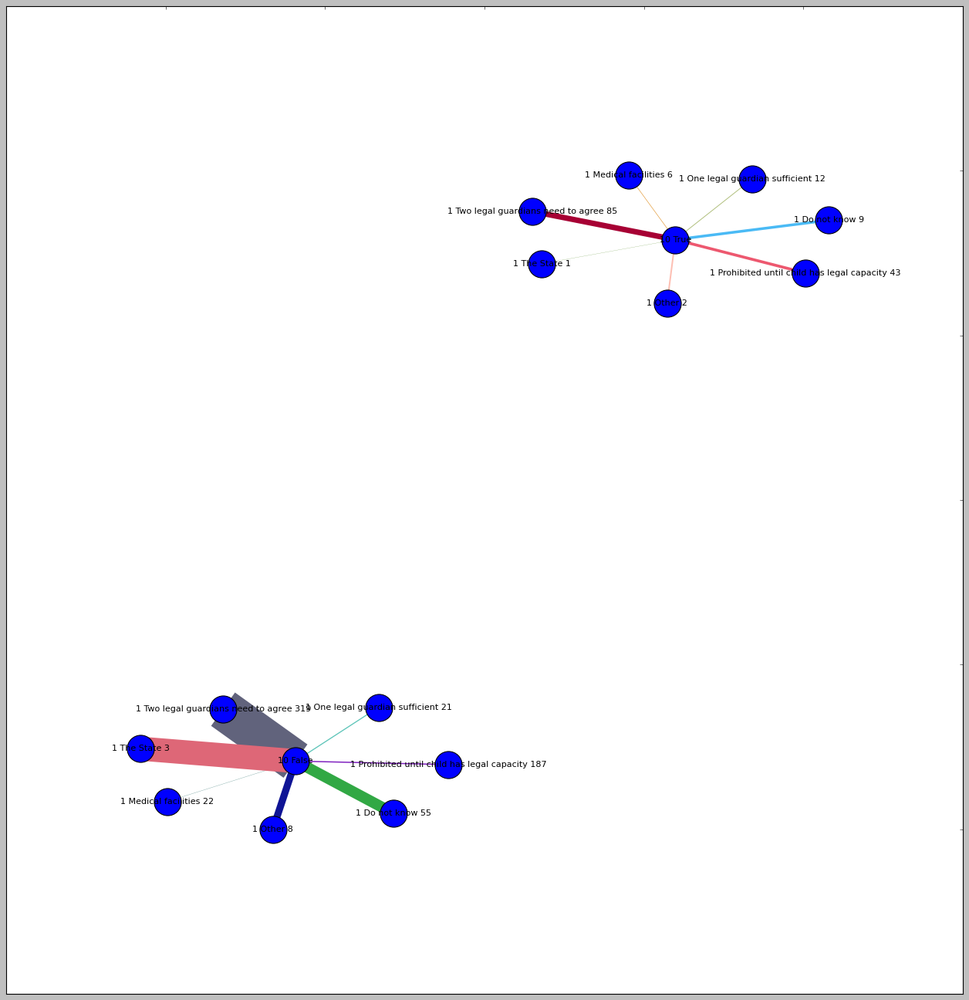

In [241]:

from pyvis.network import Network
from itertools import combinations
import networkx
import nxviz as nv
import matplotlib as mpl
mpl.style.use('classic')

df_graph = fif
df_graph['From'] = df_graph[3].map(str)+' '+ df_graph['counts'].map(str)
df_graph['To'] = df_graph[4]
df_graph['Count'] = df_graph['counts']
colors=cls['colour']
weights = df_graph['counts']



G = networkx.from_pandas_edgelist(
    df_graph, source="From", target="To", edge_attr="Count"
)


#################3333333

# dynamic node sizes

scale=3 # Scaling the size of the nodes by 10*degree
d = dict(G.degree)

#Updating dict
d.update((x, scale*y) for x, y in d.items())

####

plt.figure(figsize=(20,20))
plt.rcParams['figure.facecolor'] = 'white'

graph_pos = networkx.spring_layout(G)

G = networkx.draw_networkx(G, graph_pos, edge_color=colors, node_color='blue',alpha=1, node_size=1000, 
                     width=weights*0.15, arrows= False, with_labels=True, font_size=10, font_family='sans-serif'
                    )

#plt.savefig('true_false_who_should_seq.png', dpi=300)


In [242]:
fif = fif.sort_values(by='counts', ascending=False)
fif.head(n=20)

,1,2,counts,3,4,label,connections,colour,From,To,Count
0,774,781,319,1 Two legal guardians need to agree,10 False,1 Two legal guardians need to agree 10 False,774 781,#61637c,1 Two legal guardians need to agree 319,10 False,319
6,777,781,187,1 Prohibited until child has legal capacity,10 False,1 Prohibited until child has legal capacity 10...,777 781,#de6777,1 Prohibited until child has legal capacity 187,10 False,187
1,774,782,85,1 Two legal guardians need to agree,10 True,1 Two legal guardians need to agree 10 True,774 782,#31a844,1 Two legal guardians need to agree 85,10 True,85
2,775,781,55,1 Do not know,10 False,1 Do not know 10 False,775 781,#0f1495,1 Do not know 55,10 False,55
7,777,782,43,1 Prohibited until child has legal capacity,10 True,1 Prohibited until child has legal capacity 10...,777 782,#a70034,1 Prohibited until child has legal capacity 43,10 True,43
10,779,781,22,1 Medical facilities,10 False,1 Medical facilities 10 False,779 781,#ed586f,1 Medical facilities 22,10 False,22
8,778,781,21,1 One legal guardian sufficient,10 False,1 One legal guardian sufficient 10 False,778 781,#4abaf5,1 One legal guardian sufficient 21,10 False,21
9,778,782,12,1 One legal guardian sufficient,10 True,1 One legal guardian sufficient 10 True,778 782,#fdbfb3,1 One legal guardian sufficient 12,10 True,12
3,775,782,9,1 Do not know,10 True,1 Do not know 10 True,775 782,#7f20bf,1 Do not know 9,10 True,9
4,776,781,8,1 Other,10 False,1 Other 10 False,776 781,#5ec5b9,1 Other 8,10 False,8


# New graphs and sankey (show) - for likert items with curious students with opinions

#### all initial filters here

In [243]:
nndf = pd.concat([cps ,ndf_23, ndf_65, ndf_66, ndf_67]).reset_index() 

options = nndf.Group.unique()
ranges = list(range(0, len(options)))
# get categorical codes
categories = dict(zip(options,ranges))
categories
## map categories onto Groups
nndf['Group'] = nndf['Group'].map(str)
nndf['Group'] = nndf['Group'].map(categories)
nndf

nndf['Group'] = nndf['Group'].map(str)
nndf['Option'] = nndf['Option'].map(str)
nndf['Option'] = nndf['Group'] + ' ' + nndf['Option']
nndf

,level_0,id,Description,Option,Variable,Group,index
0,0,0,Scoring_profile,0 Low Scoring_profile,Class_X,0,NaN
1,1,1,Scoring_profile,0 High Scoring_profile,Class_X,0,NaN
2,2,3,Scoring_profile,0 High Scoring_profile,Class_X,0,NaN
3,3,5,Scoring_profile,0 Low Scoring_profile,Class_X,0,NaN
4,4,14,Scoring_profile,0 Low Scoring_profile,Class_X,0,NaN
...,...,...,...,...,...,...,...
9200,7450,1875,Revising and updating ethical guidelines conce...,4 Strongly agree to Revising and Updating,LE3.201,4,59691.0
9201,7460,1885,Revising and updating ethical guidelines conce...,4 Agree to Revising and Updating,LE3.201,4,59751.0
9202,7471,1886,Revising and updating ethical guidelines conce...,4 Strongly agree to Revising and Updating,LE3.201,4,59814.0
9203,7482,1887,Revising and updating ethical guidelines conce...,4 Strongly agree to Revising and Updating,LE3.201,4,59876.0


In [244]:
select = ['0 Low Scoring_profile', '0 High Scoring_profile',
       '0 Older Age Profile', '0 Younger Age Profile',
       '0 Low confidence Confidence profile',
       '0 High confident Confidence profile', '0 Non law Legal',
       '0 Law Legal', '0 Student student', '0 Not student student',
       '0 Other branch branch', '0 Not a student branch',
       '0 Law branch branch', '0 Low concern', '0 Medium concern',
       '0 High concern'] # only keep curious tag


nndf['Option'] = nndf['Option'].map(str)
nndf = nndf[~nndf['Option'].isin(select)]

In [245]:
nndf

,level_0,id,Description,Option,Variable,Group,index
5411,5411,0,curiosity,0 High curiosity,Class_X,0,NaN
5412,5412,1,curiosity,0 Low curiosity,Class_X,0,NaN
5413,5413,3,curiosity,0 High curiosity,Class_X,0,NaN
5414,5414,5,curiosity,0 Low curiosity,Class_X,0,NaN
5415,5415,14,curiosity,0 Low curiosity,Class_X,0,NaN
...,...,...,...,...,...,...,...
9200,7450,1875,Revising and updating ethical guidelines conce...,4 Strongly agree to Revising and Updating,LE3.201,4,59691.0
9201,7460,1885,Revising and updating ethical guidelines conce...,4 Agree to Revising and Updating,LE3.201,4,59751.0
9202,7471,1886,Revising and updating ethical guidelines conce...,4 Strongly agree to Revising and Updating,LE3.201,4,59814.0
9203,7482,1887,Revising and updating ethical guidelines conce...,4 Strongly agree to Revising and Updating,LE3.201,4,59876.0


#### All steps before until plot

In [246]:
sources = nndf[['id', 'Option']].copy()

len_options = len(nndf.Option.unique())
len_options

len_ids = len(nndf.id.unique()) +1
len_ids

ranges = list(range(len_ids, len_ids+len_options))

len(ranges) == len(nndf.Option.unique())

options = nndf.Option.unique()
options

# get categorical codes
categories = dict(zip(options,ranges))
categories

sources['codes'] = sources['Option'].map(categories)
xtt=pd.DataFrame()
xtt = sources[['Option', 'codes']].copy()
# get source codes and counts
sources['codes'] = sources['codes'].map(str)
counts = sources.groupby(["id"])["codes"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+counts['codes'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
counts['xcodes'] = nx.iloc[:,2]
gcounts = sources.groupby(["id"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+gcounts['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
gcounts['xoption'] = nx.iloc[:,2]
gcounts
lel = pd.merge(counts, gcounts, on='id')
del lel['codes']
del lel['Option']
lel

# writing operations
wo = []
for i in range(len(counts['xcodes'])) : 
    wo.append(pd.Series(counts.iloc[i, 2]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())
# value counts df
vc = pd.DataFrame(wo)
# counts
cxounts = pd.concat([lel, vc], axis=1)

lex = cxounts.set_index(['id','xcodes', 'xoption']).stack().reset_index()
lex['counts'] = lex[0]
lex['codes'] = lex['level_3']
del lex[0]
del lex['level_3']

# paths
lex['path'] = """'""" + lex["id"].astype(str)+"',"+lex["xcodes"]
lex['label'] = """'""" + lex["id"].astype(str)+"',"+lex["xoption"]
lex['path'] = lex['path'].str.replace("""'""", '')
lex['label'] = lex['label'].str.replace("""'""", '')
lex.head(2)

lex["counts"] = lex["counts"].map(int)
## paths and sources

path_list = list(lex.path.unique())
label_list = list(lex.xoption.unique())

############################################## corrected code
def zigzag(seq):
    """Return two sequences with alternating elements from `seq`"""
    seq_int = [list(map(int, x)) for x in seq]
    x = []
    y = []
    for i in seq_int:
        for j, k in zip(i, i[1:]):
            x.append(j)
            y.append(k)
    return list(zip(x, y))
                

# get a path graph
y = []
for i in range(len(path_list)):
    y.append(list(path_list[i].split(',')))
    
    
big_list = zigzag(y)

#### MOST COMMON PATH

c_path = pd.DataFrame(big_list)
c_path = c_path[c_path[0].isin(ranges)] #remove the participant id initials
c_path[2] = c_path[0]
c_path[0] = '1'
c_path

########################## edit here 
tagged = c_path.groupby([1, 2])[0].agg(lambda x: """','""".join(x[x != ''])).reset_index()
xtagged= ("""'"""+tagged[0].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
xtagged['counts'] = [len(x.split(',')) for x in xtagged[0].tolist()]
ztagged = pd.concat([tagged, xtagged], axis=1)
ztagged

####

inv_map = {str(v): str(k) for k, v in categories.items()}

fif = ztagged[[1, 2, 0, 'counts']]
fif[1] = fif[1].map(str)
fif[3] = fif[1].map(inv_map)
fif[2] = fif[2].map(str)
fif[4] = fif[2].map(inv_map)
del fif[0]

fif['label'] = fif[3] + ' ' + fif[4]
fif[1] = fif[1].map(int)
fif[2] = fif[2].map(int)

fif


,1,2,counts,3,4,label
0,774,776,1,0 High curiosity,0 Medium curiosity,0 High curiosity 0 Medium curiosity
1,774,786,1,0 High curiosity,2 Strongly agree to dissemination of GK,0 High curiosity 2 Strongly agree to dissemina...
2,775,777,1,0 Low curiosity,1 Two legal guardians need to agree,0 Low curiosity 1 Two legal guardians need to ...
3,775,780,1,0 Low curiosity,1 Prohibited until child has legal capacity,0 Low curiosity 1 Prohibited until child has l...
4,775,784,1,0 Low curiosity,2 Strongly disagree to dissemination of GK,0 Low curiosity 2 Strongly disagree to dissemi...
...,...,...,...,...,...,...
117,798,787,1,4 Neutral towards to Revising and Updating,2 Neutral towards to dissemination of GK,4 Neutral towards to Revising and Updating 2 N...
118,798,790,12,4 Neutral towards to Revising and Updating,3 Strongly agree to Policymaking,4 Neutral towards to Revising and Updating 3 S...
119,798,791,30,4 Neutral towards to Revising and Updating,3 Agree to Policymaking,4 Neutral towards to Revising and Updating 3 A...
120,798,792,32,4 Neutral towards to Revising and Updating,3 Neutral towards to Policymaking,4 Neutral towards to Revising and Updating 3 N...


In [247]:
fif['connections'] = fif.iloc[:,0].astype(str)+" "+fif.iloc[:,1].astype(str)

colour = ['#57a97b',
 '#15b09e',
 '#de4e4d',
 '#300a81',
 '#9bae33',
 '#a3051c',
 '#a5d7fe',
 '#ec99a2',
 '#a9c1d0',
 '#bc4121',
 '#8ccc34',
 '#fefb32',
 '#9ab1d5',
 '#9866d9',
 '#3ac6d6',
 '#b6eef3',
 '#b0078d',
 '#b256d5',
 '#f8c2f4',
 '#28bd96',
 '#c14e68',
 '#b686bd',
 '#174f0c',
 '#debe11',
 '#259ba4',
 '#9920a9',
 '#649230',
 '#7adfa5',
 '#bcb496',
 '#966e80',
 '#fe6606',
 '#908b8a',
 '#4a4b6e',
 '#7e7950',
 '#1b231f',
 '#a4bc8c',
 '#be132a',
 '#b7ed89',
 '#24192a',
 '#8810e0',
 '#4da865',
 '#ede1e3',
 '#c27af8',
 '#212880',
 '#01bc2c',
 '#0becf2',
 '#d760f7',
 '#eb607f',
 '#1e4bfe',
 '#c91c31',
 '#852fc3',
 '#cc56d1',
 '#fbfa8a',
 '#1f2255',
 '#7abf28',
 '#ca7e64',
 '#35e871',
 '#a25bc1',
 '#0091a8',
 '#3ef19b',
 '#013619',
 '#217d81',
 '#7bfab3',
 '#85214b',
 '#350608',
 '#06a283',
 '#eeb772',
 '#159992',
 '#579ace',
 '#a553b2',
 '#f3f49e',
 '#65ee27',
 '#4ffd02',
 '#97c4f4',
 '#38b68e',
 '#d0bdad',
 '#16bc17',
 '#d5fd08',
 '#d70855',
 '#7d50a2',
 '#3cf0ce',
 '#54173e',
 '#9e23cf',
 '#0daca2',
 '#db83d5',
 '#2b1232',
 '#33c399',
 '#9cfddb',
 '#dfe9cf',
 '#38360f',
 '#67805d',
 '#9b94cc',
 '#ae00df',
 '#f94f9a',
 '#6897e3',
 '#fc74ca',
 '#d271fc',
 '#8cb26d',
 '#ea3cd6',
 '#c20e04',
 '#273058',
 '#6119f9',
 '#286dbf',
 '#e7f2f6',
 '#5c6ef5',
 '#0d72bc',
 '#29952a',
 '#c9c558',
 '#51c6f3',
 '#663f8b',
 '#322e53',
 '#5d0979',
 '#74737b',
 '#3dd1d1',
 '#b2a82a',
 '#81c8de',
 '#5c4e1f',
 '#925a84',
 '#cee7f9',
 '#c58658',
 '#f88c84',
 '#9811d9']
cls = pd.DataFrame()

cls['connections'] = pd.DataFrame(fif['connections'].unique())

cls['colour'] = pd.DataFrame(colour)

fif = pd.merge(fif, cls, on='connections')
fif


,1,2,counts,3,4,label,connections,colour
0,774,776,1,0 High curiosity,0 Medium curiosity,0 High curiosity 0 Medium curiosity,774 776,#57a97b
1,774,786,1,0 High curiosity,2 Strongly agree to dissemination of GK,0 High curiosity 2 Strongly agree to dissemina...,774 786,#15b09e
2,775,777,1,0 Low curiosity,1 Two legal guardians need to agree,0 Low curiosity 1 Two legal guardians need to ...,775 777,#de4e4d
3,775,780,1,0 Low curiosity,1 Prohibited until child has legal capacity,0 Low curiosity 1 Prohibited until child has l...,775 780,#300a81
4,775,784,1,0 Low curiosity,2 Strongly disagree to dissemination of GK,0 Low curiosity 2 Strongly disagree to dissemi...,775 784,#9bae33
...,...,...,...,...,...,...,...,...
117,798,787,1,4 Neutral towards to Revising and Updating,2 Neutral towards to dissemination of GK,4 Neutral towards to Revising and Updating 2 N...,798 787,#925a84
118,798,790,12,4 Neutral towards to Revising and Updating,3 Strongly agree to Policymaking,4 Neutral towards to Revising and Updating 3 S...,798 790,#cee7f9
119,798,791,30,4 Neutral towards to Revising and Updating,3 Agree to Policymaking,4 Neutral towards to Revising and Updating 3 A...,798 791,#c58658
120,798,792,32,4 Neutral towards to Revising and Updating,3 Neutral towards to Policymaking,4 Neutral towards to Revising and Updating 3 N...,798 792,#f88c84


In [248]:


def nodify(node_names):
    node_names = unique_list
    # uniqe name begginings
    
    ends = sorted(list(set([e[0] for e in node_names]))) 
    
    # intervals
    steps = 1/4

    # x-values for each unique name ending
    # for input as node position
    nodes_x = {}
    xVal = 0
    for e in ends:
        nodes_x[str(e)] = xVal
        xVal += steps

    # x and y values in list form
    x_values = [nodes_x[n[0]] for n in node_names]
    y_values = [x*0.03 for x in range(1, len(x_values))]
    
    return x_values, y_values

sources = list(fif[1])
targets = list(fif[2])
values = list(fif['counts'])
labels = list(fif['label'])
colours = list(fif['colour'])

unique_list = fif['label'].unique()
sources = sources
targets = targets
values = values

nodified = nodify(node_names=unique_list)
nodified


fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 20,
      thickness = 5,
      line = dict(color = 'red', width = 1),
      label = unique_list,
      customdata = labels,
      hovertemplate='Source has total value %{value}<extra></extra>',
      color = 'blue',
        x= nodified[0],
        y= nodified[1]
    ),
    link = dict(
      source = sources, # indices correspond to labels, eg A1, A2, A2, B1, ...
      target = targets,
      value = values,
      customdata = labels,
        color = colours,
      hovertemplate='Percent: %{value}'+
        '<br />Option: %{customdata}<extra></extra>'
  ))])

go.Layout(title='Sankey plot',
          #other options for the plot
           hoverlabel=dict(font=dict(family='sans-serif', size=100)))


fig = fig.update_layout(margin=dict(t=100))

fig.write_html("/home/mrinalmanu/Documents/iglas_le/opinion_curious_sankey.html")


fig.show()

In [249]:
### filter here for single counts
fif['counts'] = fif['counts'].map(int)
nfif = fif[fif['counts'] > 1]

### new plot

sources = list(nfif[1])
targets = list(nfif[2])
values = list(nfif['counts'])
labels = list(nfif['label'])
colours = list(nfif['colour'])

unique_list = nfif['label'].unique()
sources = sources
targets = targets
values = values

nodified = nodify(node_names=unique_list)
nodified

### 

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 20,
      thickness = 5,
      line = dict(color = 'red', width = 1),
      label = labels,
      customdata = labels,
      hovertemplate='Source has total value %{value}<extra></extra>',
      color = 'blue',

    ),
    link = dict(
      source = sources, # indices correspond to labels, eg A1, A2, A2, B1, ...
      target = targets,
      value = values,
      customdata = labels,
        color = colours,
      hovertemplate='Absolute count: %{value}'+
        '<br />Option: %{customdata}<extra></extra>'
  ))])

go.Layout(title='Sankey plot',
          #other options for the plot
           hoverlabel=dict(font=dict(family='sans-serif', size=100)))


fig = fig.update_layout(margin=dict(t=100))

fig.show()
#fig.write_html("/home/mrinalmanu/Documents/iglas_le/opinon_curious_clean_sankey.html")

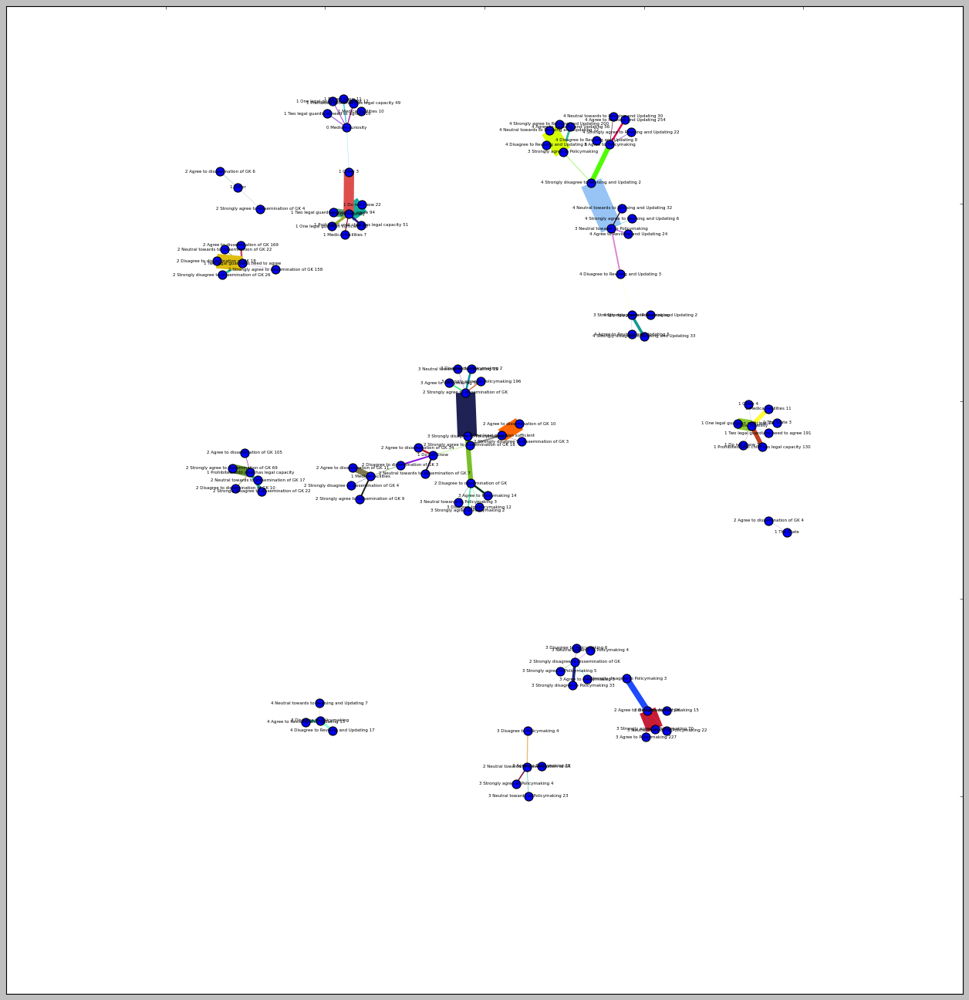

In [250]:
from pyvis.network import Network
from itertools import combinations
import networkx
import nxviz as nv
import matplotlib as mpl
mpl.style.use('classic')

df_graph = nfif
df_graph['From'] = df_graph[3].map(str)+' '+ df_graph['counts'].map(str)
df_graph['To'] = df_graph[4]
df_graph['Count'] = df_graph['counts']
colors=cls['colour']
weights = df_graph['counts']



G = networkx.from_pandas_edgelist(
    df_graph, source="From", target="To", edge_attr="Count"
)


#################3333333

# dynamic node sizes

scale=3 # Scaling the size of the nodes by 10*degree
d = dict(G.degree)

#Updating dict
d.update((x, scale*y) for x, y in d.items())

####

plt.figure(figsize=(20,20))
plt.rcParams['figure.facecolor'] = 'white'


G = networkx.draw_networkx(G, edge_color=colors, node_color='blue',alpha=1, node_size=100, 
                     width=weights*0.1, arrows= False, with_labels=True, font_size=5, font_family='sans-serif'
                    )

#plt.savefig('opinion_curious.png', dpi=300)


In [251]:
inv_map

{'774': '0 High curiosity',
 '775': '0 Low curiosity',
 '776': '0 Medium curiosity',
 '777': '1 Two legal guardians need to agree',
 '778': '1 Do not know',
 '779': '1 Other',
 '780': '1 Prohibited until child has legal capacity',
 '781': '1 One legal guardian sufficient',
 '782': '1 Medical facilities',
 '783': '1 The State',
 '784': '2 Strongly disagree to dissemination of GK',
 '785': '2 Agree to dissemination of GK',
 '786': '2 Strongly agree to dissemination of GK',
 '787': '2 Neutral towards to dissemination of GK',
 '788': '2 Disagree to dissemination of GK',
 '789': '3 Strongly disagree to Policymaking',
 '790': '3 Strongly agree to Policymaking',
 '791': '3 Agree to Policymaking',
 '792': '3 Neutral towards to Policymaking',
 '793': '3 Disagree to Policymaking',
 '794': '4 Strongly disagree to Revising and Updating',
 '795': '4 Agree to Revising and Updating',
 '796': '4 Strongly agree to Revising and Updating',
 '797': '4 Disagree to Revising and Updating',
 '798': '4 Neutral

In [252]:
#### Top paths

paths = pd.DataFrame(y)
#paths = paths.drop(0, axis=1)
paths[0] = 1
paths.fillna(value='', inplace = True)

paths['path'] = paths[paths.columns[2:]].apply(
    lambda x: ','.join(x.dropna().astype(str)),
    axis=1
)

inv_map = {str(v): str(k) for k, v in categories.items()}
paths['name'] = paths[paths.columns[2:]].apply(
    lambda x: ','.join(x.map(inv_map).dropna().astype(str)),
    axis=1
)


paths['source'] = paths[1].map(inv_map)
npaths = paths.groupby(['source', 'path', 'name'])[0].sum().reset_index()
npaths = npaths[npaths[0] >5]
npaths['count'] = npaths[0]
npaths = npaths.sort_values(by='count', ascending=False)
npaths.head(n=20)


,source,path,name,0,count
81,0 Low curiosity,"777,785,791,795","1 Two legal guardians need to agree,2 Agree to...",49,49
15,0 High curiosity,"777,786,790,796","1 Two legal guardians need to agree,2 Strongly...",31,31
95,0 Low curiosity,"777,786,790,796","1 Two legal guardians need to agree,2 Strongly...",28,28
208,0 Medium curiosity,"777,785,791,795","1 Two legal guardians need to agree,2 Agree to...",26,26
154,0 Low curiosity,"780,785,791,795","1 Prohibited until child has legal capacity,2 ...",25,25
217,0 Medium curiosity,"777,786,790,796","1 Two legal guardians need to agree,2 Strongly...",22,22
163,0 Low curiosity,"780,786,790,796","1 Prohibited until child has legal capacity,2 ...",22,22
7,0 High curiosity,"777,785,791,795","1 Two legal guardians need to agree,2 Agree to...",18,18
243,0 Medium curiosity,"780,785,791,795","1 Prohibited until child has legal capacity,2 ...",17,17
97,0 Low curiosity,"777,786,791,795","1 Two legal guardians need to agree,2 Strongly...",13,13


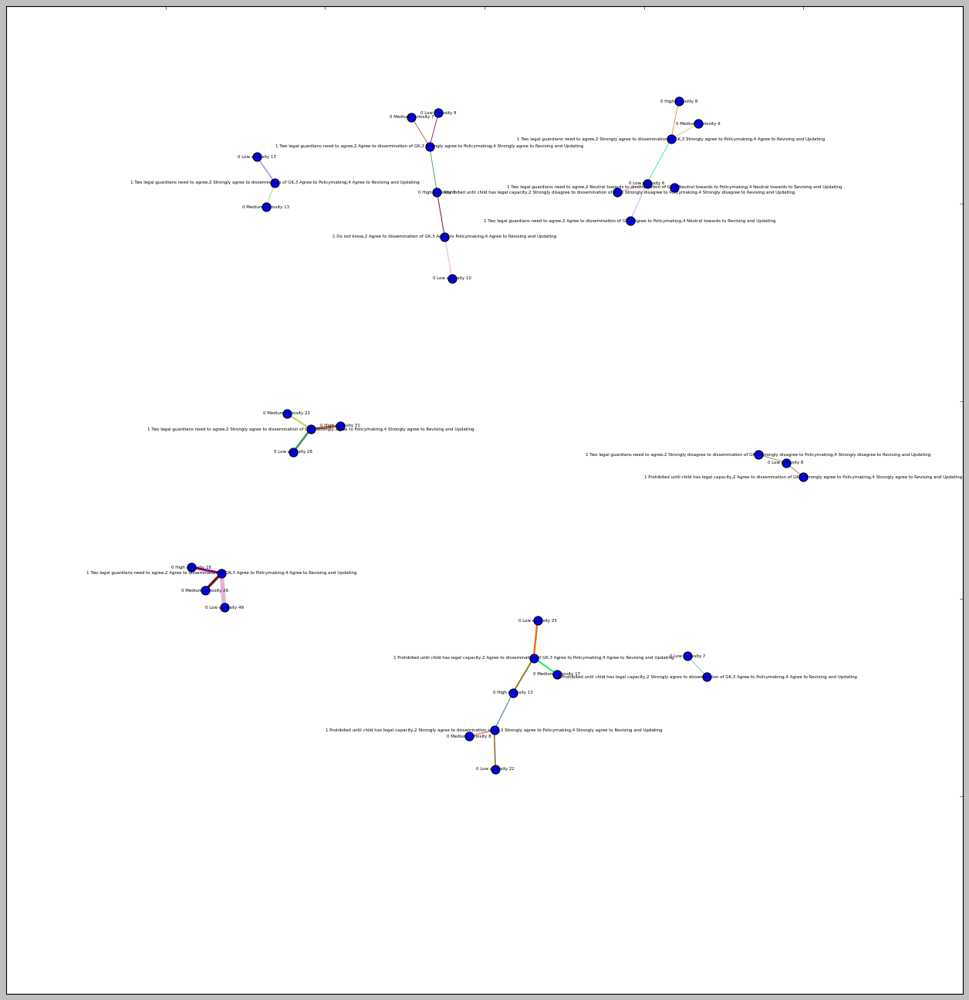

In [253]:
colour = ['#e7afde',
 '#6a1a1c',
 '#970c80',
 '#c15536',
 '#509565',
 '#c4d373',
 '#ec7217',
 '#0df26b',
 '#907a1d',
 '#835c22',
 '#7897ad',
 '#e47478',
 '#b184ec',
 '#b8db81']

from pyvis.network import Network
from itertools import combinations
import networkx
import nxviz as nv
import matplotlib as mpl
mpl.style.use('classic')

df_graph = npaths
df_graph['From'] = df_graph['source'].map(str)+' '+ df_graph['count'].map(str)
df_graph['To'] = df_graph['name']
df_graph['Count'] = df_graph['count']
colors=colour
weights = df_graph['count']



G = networkx.from_pandas_edgelist(
    df_graph, source="From", target="To", edge_attr="Count"
)


#################3333333

# dynamic node sizes

scale=3 # Scaling the size of the nodes by 10*degree
d = dict(G.degree)

#Updating dict
d.update((x, scale*y) for x, y in d.items())

####

plt.figure(figsize=(20,20))
plt.rcParams['figure.facecolor'] = 'white'


G = networkx.draw_networkx(G, edge_color=colors, node_color='blue',alpha=1, node_size=100, 
                     width=weights*0.1, arrows= False, with_labels=True, font_size=5, font_family='sans-serif'
                    )

#plt.savefig('PATHS_opinion_curious.png', dpi=300)


In [254]:
fif = fif.sort_values(by='counts', ascending=False)
fif.head(n=20)

,1,2,counts,3,4,label,connections,colour
102,795,791,254,4 Agree to Revising and Updating,3 Agree to Policymaking,4 Agree to Revising and Updating 3 Agree to Po...,795 791,#286dbf
78,791,785,227,3 Agree to Policymaking,2 Agree to dissemination of GK,3 Agree to Policymaking 2 Agree to disseminati...,791 785,#d70855
106,796,790,200,4 Strongly agree to Revising and Updating,3 Strongly agree to Policymaking,4 Strongly agree to Revising and Updating 3 St...,796 790,#29952a
73,790,786,196,3 Strongly agree to Policymaking,2 Strongly agree to dissemination of GK,3 Strongly agree to Policymaking 2 Strongly ag...,790 786,#97c4f4
18,777,775,191,1 Two legal guardians need to agree,0 Low curiosity,1 Two legal guardians need to agree 0 Low curi...,777 775,#f8c2f4
42,785,777,169,2 Agree to dissemination of GK,1 Two legal guardians need to agree,2 Agree to dissemination of GK 1 Two legal gua...,785 777,#c27af8
49,786,777,158,2 Strongly agree to dissemination of GK,1 Two legal guardians need to agree,2 Strongly agree to dissemination of GK 1 Two ...,786 777,#c91c31
27,780,775,130,1 Prohibited until child has legal capacity,0 Low curiosity,1 Prohibited until child has legal capacity 0 ...,780 775,#7adfa5
19,777,776,119,1 Two legal guardians need to agree,0 Medium curiosity,1 Two legal guardians need to agree 0 Medium c...,777 776,#28bd96
45,785,780,105,2 Agree to dissemination of GK,1 Prohibited until child has legal capacity,2 Agree to dissemination of GK 1 Prohibited un...,785 780,#0becf2


In [255]:
#### Top paths 'Strongly' replaced with nothing

paths = pd.DataFrame(y)
#paths = paths.drop(0, axis=1)
paths[0] = 1
paths.fillna(value='', inplace = True)

paths['path'] = paths[paths.columns[2:]].apply(
    lambda x: ','.join(x.dropna().astype(str)),
    axis=1
)

inv_map = {str(v): str(k) for k, v in categories.items()}
paths['name'] = paths[paths.columns[2:]].apply(
    lambda x: ','.join(x.map(inv_map).dropna().astype(str)),
    axis=1
)


paths['source'] = paths[1].map(inv_map)

paths['name']= paths['name'].str.replace('Strongly agree', 'Agree')
paths['name']= paths['name'].str.replace('Strongly disagree', 'Disagree')
npaths = paths.groupby(['source', 'name'])[0].sum().reset_index()
npaths = npaths[npaths[0] >5]
npaths['count'] = npaths[0]
npaths = npaths.sort_values(by='count', ascending=False)
npaths.head(n=20)


,source,name,0,count
91,0 Low curiosity,"1 Two legal guardians need to agree,2 Agree to...",111,111
138,0 Medium curiosity,"1 Two legal guardians need to agree,2 Agree to...",83,83
66,0 Low curiosity,"1 Prohibited until child has legal capacity,2 ...",71,71
31,0 High curiosity,"1 Two legal guardians need to agree,2 Agree to...",69,69
18,0 High curiosity,"1 Prohibited until child has legal capacity,2 ...",36,36
127,0 Medium curiosity,"1 Prohibited until child has legal capacity,2 ...",33,33
43,0 Low curiosity,"1 Do not know,2 Agree to dissemination of GK,3...",18,18
104,0 Low curiosity,"1 Two legal guardians need to agree,2 Disagree...",13,13
0,0 High curiosity,"1 Do not know,2 Agree to dissemination of GK,3...",12,12
123,0 Medium curiosity,"1 One legal guardian sufficient,2 Agree to dis...",11,11


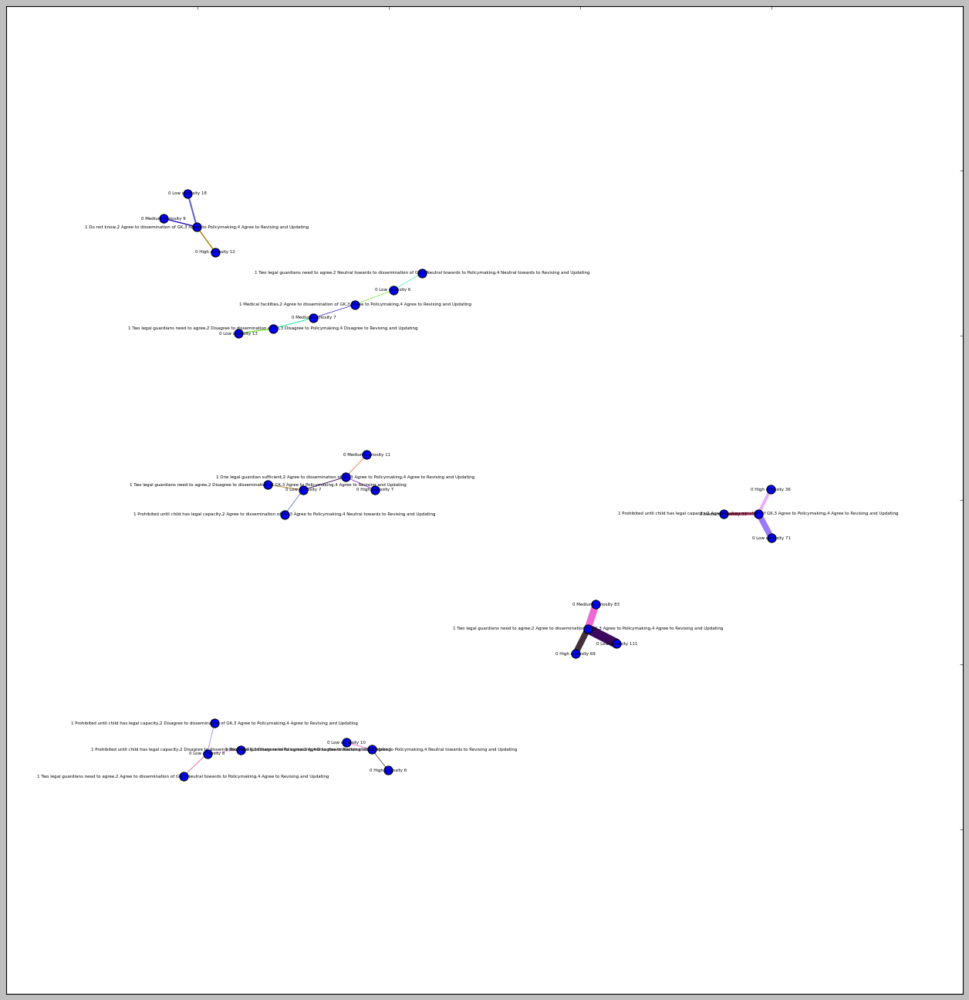

In [256]:
colour =['#3b095e',
 '#f06ad5',
 '#443039',
 '#987afa',
 '#e6acff',
 '#dd4a78',
 '#5961cc',
 '#af7b01',
 '#1b00c2',
 '#68dd25',
 '#28eda1',
 '#f5835e',
 '#9b33d8']

from pyvis.network import Network
from itertools import combinations
import networkx
import nxviz as nv
import matplotlib as mpl
mpl.style.use('classic')

df_graph = npaths
df_graph['From'] = df_graph['source'].map(str)+' '+ df_graph['count'].map(str)
df_graph['To'] = df_graph['name']
df_graph['Count'] = df_graph['count']
colors=colour
weights = df_graph['count']



G = networkx.from_pandas_edgelist(
    df_graph, source="From", target="To", edge_attr="Count"
)


#################3333333

# dynamic node sizes

scale=3 # Scaling the size of the nodes by 10*degree
d = dict(G.degree)

#Updating dict
d.update((x, scale*y) for x, y in d.items())

####

plt.figure(figsize=(20,20))
plt.rcParams['figure.facecolor'] = 'white'


G = networkx.draw_networkx(G, edge_color=colors, node_color='blue',alpha=1, node_size=100, 
                     width=weights*0.1, arrows= False, with_labels=True, font_size=5, font_family='sans-serif'
                    )

#plt.savefig('PATHS_strongly_replaced_opinion_curious.png', dpi=300)


# New graphs and sankey (show) - who answered right, with opinions

In [257]:
select = ['3', '4', '5', '10']
nndf = BNdf[BNdf['Group'].isin(select)]


#####
sources = nndf[['id', 'Option']].copy()

len_options = len(nndf.Option.unique())
len_options

len_ids = len(nndf.id.unique()) +1
len_ids

ranges = list(range(len_ids, len_ids+len_options))

len(ranges) == len(nndf.Option.unique())

options = nndf.Option.unique()
options

# get categorical codes
categories = dict(zip(options,ranges))
categories

sources['codes'] = sources['Option'].map(categories)
xtt=pd.DataFrame()
xtt = sources[['Option', 'codes']].copy()
# get source codes and counts
sources['codes'] = sources['codes'].map(str)
counts = sources.groupby(["id"])["codes"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+counts['codes'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
counts['xcodes'] = nx.iloc[:,2]
gcounts = sources.groupby(["id"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+gcounts['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
gcounts['xoption'] = nx.iloc[:,2]
gcounts
lel = pd.merge(counts, gcounts, on='id')
del lel['codes']
del lel['Option']
lel

# writing operations
wo = []
for i in range(len(counts['xcodes'])) : 
    wo.append(pd.Series(counts.iloc[i, 2]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())
# value counts df
vc = pd.DataFrame(wo)
# counts
cxounts = pd.concat([lel, vc], axis=1)

lex = cxounts.set_index(['id','xcodes', 'xoption']).stack().reset_index()
lex['counts'] = lex[0]
lex['codes'] = lex['level_3']
del lex[0]
del lex['level_3']

# paths
lex['path'] = """'""" + lex["id"].astype(str)+"',"+lex["xcodes"]
lex['label'] = """'""" + lex["id"].astype(str)+"',"+lex["xoption"]
lex['path'] = lex['path'].str.replace("""'""", '')
lex['label'] = lex['label'].str.replace("""'""", '')
lex.head(2)

lex["counts"] = lex["counts"].map(int)
## paths and sources

path_list = list(lex.path.unique())
label_list = list(lex.xoption.unique())

############################################## corrected code
def zigzag(seq):
    """Return two sequences with alternating elements from `seq`"""
    seq_int = [list(map(int, x)) for x in seq]
    x = []
    y = []
    for i in seq_int:
        for j, k in zip(i, i[1:]):
            x.append(j)
            y.append(k)
    return list(zip(x, y))
                

# get a path graph
y = []
for i in range(len(path_list)):
    y.append(list(path_list[i].split(',')))
    
    
big_list = zigzag(y)

#### MOST COMMON PATH

c_path = pd.DataFrame(big_list)
c_path = c_path[c_path[0].isin(ranges)] #remove the participant id initials
c_path[2] = c_path[0]
c_path[0] = '1'
c_path

########################## edit here 
tagged = c_path.groupby([1, 2])[0].agg(lambda x: """','""".join(x[x != ''])).reset_index()
xtagged= ("""'"""+tagged[0].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
xtagged['counts'] = [len(x.split(',')) for x in xtagged[0].tolist()]
ztagged = pd.concat([tagged, xtagged], axis=1)
ztagged

####

inv_map = {str(v): str(k) for k, v in categories.items()}

fif = ztagged[[1, 2, 0, 'counts']]
fif[1] = fif[1].map(str)
fif[3] = fif[1].map(inv_map)
fif[2] = fif[2].map(str)
fif[4] = fif[2].map(inv_map)
del fif[0]

fif['label'] = fif[3] + ' ' + fif[4]
fif[1] = fif[1].map(int)
fif[2] = fif[2].map(int)

fif



,1,2,counts,3,4,label
0,774,776,1,3 Strongly disagree to dissemination of GK,3 Strongly agree to dissemination of GK,3 Strongly disagree to dissemination of GK 3 S...
1,775,777,1,3 Agree to dissemination of GK,3 Neutral towards to dissemination of GK,3 Agree to dissemination of GK 3 Neutral towar...
2,775,780,1,3 Agree to dissemination of GK,4 Strongly agree to Policymaking,3 Agree to dissemination of GK 4 Strongly agre...
3,775,783,1,3 Agree to dissemination of GK,4 Disagree to Policymaking,3 Agree to dissemination of GK 4 Disagree to P...
4,775,784,1,3 Agree to dissemination of GK,5 Strongly disagree to Revising and Updating,3 Agree to dissemination of GK 5 Strongly disa...
...,...,...,...,...,...,...
76,790,784,7,10 True,5 Strongly disagree to Revising and Updating,10 True 5 Strongly disagree to Revising and Up...
77,790,785,61,10 True,5 Agree to Revising and Updating,10 True 5 Agree to Revising and Updating
78,790,786,75,10 True,5 Strongly agree to Revising and Updating,10 True 5 Strongly agree to Revising and Updating
79,790,787,8,10 True,5 Disagree to Revising and Updating,10 True 5 Disagree to Revising and Updating


In [258]:
fif['connections'] = fif.iloc[:,0].astype(str)+" "+fif.iloc[:,1].astype(str)

colour = ['#60b189',
 '#997175',
 '#cf792f',
 '#b0e1ef',
 '#3ea9d5',
 '#2fde19',
 '#f3619e',
 '#74be34',
 '#d4766c',
 '#1741c9',
 '#d67128',
 '#792b58',
 '#88f53e',
 '#5c416e',
 '#7039e8',
 '#63260b',
 '#afa927',
 '#0e1f0c',
 '#a81bfe',
 '#1e09df',
 '#09704b',
 '#aa99e1',
 '#4a26e5',
 '#0ff920',
 '#f1d234',
 '#d7fb2c',
 '#632826',
 '#ae4252',
 '#1c99f1',
 '#2dda48',
 '#3d9cab',
 '#e870dd',
 '#48e822',
 '#d78102',
 '#b095ce',
 '#59ecc2',
 '#619004',
 '#772b2a',
 '#eb6ee5',
 '#8dd4a5',
 '#608af2',
 '#c0acc4',
 '#18c6d5',
 '#1b8fc6',
 '#b9e073',
 '#a8c23b',
 '#e1a1fa',
 '#58961c',
 '#308351',
 '#40ff8b',
 '#75d0c4',
 '#46abc3',
 '#d383ae',
 '#31573e',
 '#ffa307',
 '#ff59e2',
 '#4e343f',
 '#4631f5',
 '#aa0b4a',
 '#eb741c',
 '#83995d',
 '#ed3267',
 '#2d8b05',
 '#007f1e',
 '#f97194',
 '#94581a',
 '#468dd1',
 '#ee18a7',
 '#fc4df2',
 '#edb1b9',
 '#6a85d7',
 '#4c57c3',
 '#d8994c',
 '#610981',
 '#5b3e9a',
 '#1e8462',
 '#551d1b',
 '#481e35',
 '#e9716f',
 '#4d9b6e',
 '#413bdc']
cls = pd.DataFrame()

cls['connections'] = pd.DataFrame(fif['connections'].unique())

cls['colour'] = pd.DataFrame(colour)

fif = pd.merge(fif, cls, on='connections')



def nodify(node_names):
    node_names = unique_list
    # uniqe name begginings
    
    ends = sorted(list(set([e[0] for e in node_names]))) 
    
    # intervals
    steps = 1/4

    # x-values for each unique name ending
    # for input as node position
    nodes_x = {}
    xVal = 0
    for e in ends:
        nodes_x[str(e)] = xVal
        xVal += steps

    # x and y values in list form
    x_values = [nodes_x[n[0]] for n in node_names]
    y_values = [x*0.03 for x in range(1, len(x_values))]
    
    return x_values, y_values

sources = list(fif[1])
targets = list(fif[2])
values = list(fif['counts'])
labels = list(fif['label'])
colours = list(fif['colour'])

unique_list = fif['label'].unique()
sources = sources
targets = targets
values = values

nodified = nodify(node_names=unique_list)



In [259]:

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 20,
      thickness = 5,
      line = dict(color = 'red', width = 1),
      label = unique_list,
      customdata = labels,
      hovertemplate='Source has total value %{value}<extra></extra>',
      color = 'blue',
        x= nodified[0],
        y= nodified[1]
    ),
    link = dict(
      source = sources, # indices correspond to labels, eg A1, A2, A2, B1, ...
      target = targets,
      value = values,
      customdata = labels,
        color = colours,
      hovertemplate='Percent: %{value}'+
        '<br />Option: %{customdata}<extra></extra>'
  ))])

go.Layout(title='Sankey plot',
          #other options for the plot
           hoverlabel=dict(font=dict(family='sans-serif', size=100)))


fig = fig.update_layout(margin=dict(t=100))

#fig.write_html("/home/mrinalmanu/Documents/iglas_le/opinion_correct_sankey.html")


fig.show()

In [260]:
### filter here for single counts
fif['counts'] = fif['counts'].map(int)
nfif = fif[fif['counts'] > 1]

### new plot

sources = list(nfif[1])
targets = list(nfif[2])
values = list(nfif['counts'])
labels = list(nfif['label'])
colours = list(nfif['colour'])

unique_list = nfif['label'].unique()
sources = sources
targets = targets
values = values

nodified = nodify(node_names=unique_list)
nodified

### 

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 20,
      thickness = 5,
      line = dict(color = 'red', width = 1),
      label = labels,
      customdata = labels,
      hovertemplate='Source has total value %{value}<extra></extra>',
      color = 'blue',

    ),
    link = dict(
      source = sources, # indices correspond to labels, eg A1, A2, A2, B1, ...
      target = targets,
      value = values,
      customdata = labels,
        color = colours,
      hovertemplate='Absolute count: %{value}'+
        '<br />Option: %{customdata}<extra></extra>'
  ))])

go.Layout(title='Sankey plot',
          #other options for the plot
           hoverlabel=dict(font=dict(family='sans-serif', size=100)))


fig = fig.update_layout(margin=dict(t=100))

fig.show()
#fig.write_html("/home/mrinalmanu/Documents/iglas_le/opinion_correct_clean_sankey.html")

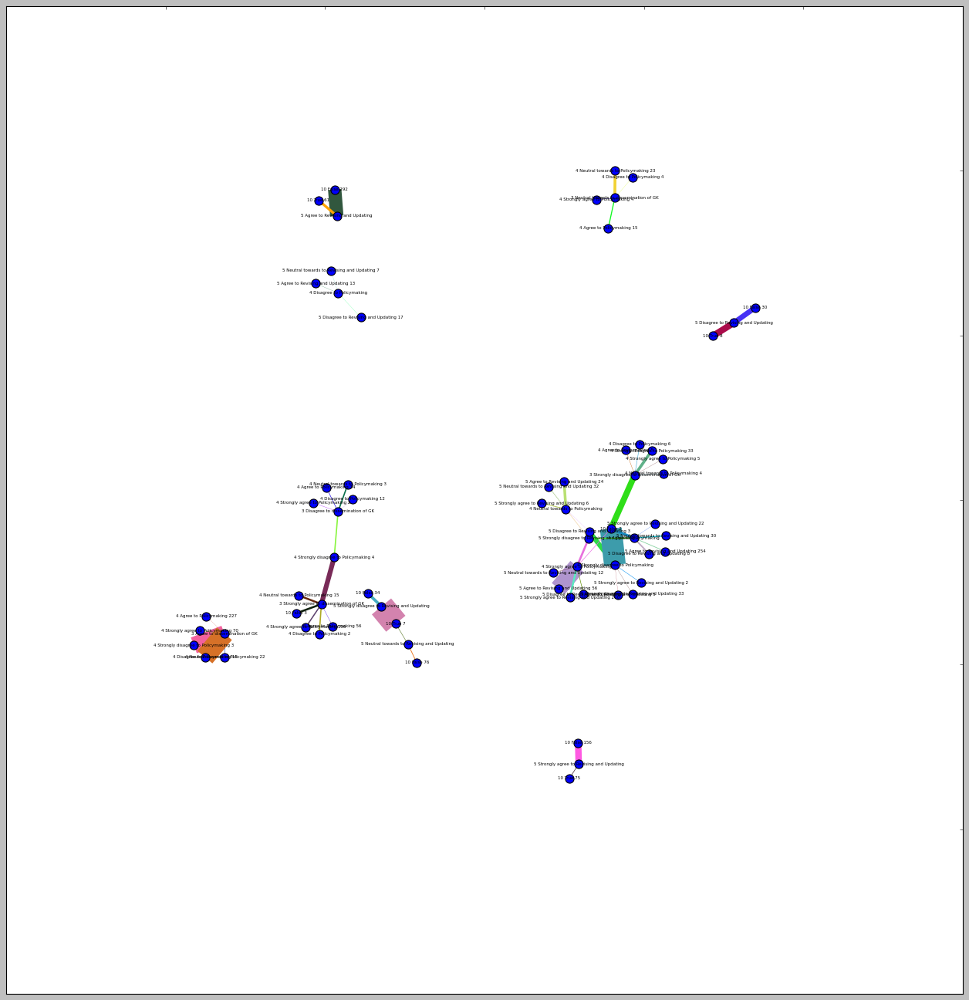

In [261]:
from pyvis.network import Network
from itertools import combinations
import networkx
import nxviz as nv
import matplotlib as mpl
mpl.style.use('classic')

df_graph = nfif
df_graph['From'] = df_graph[3].map(str)+' '+ df_graph['counts'].map(str)
df_graph['To'] = df_graph[4]
df_graph['Count'] = df_graph['counts']
colors=cls['colour']
weights = df_graph['counts']



G = networkx.from_pandas_edgelist(
    df_graph, source="From", target="To", edge_attr="Count"
)


#################3333333

# dynamic node sizes

scale=3 # Scaling the size of the nodes by 10*degree
d = dict(G.degree)

#Updating dict
d.update((x, scale*y) for x, y in d.items())

####

plt.figure(figsize=(20,20))
plt.rcParams['figure.facecolor'] = 'white'

graph_pos = networkx.spring_layout(G)

G = networkx.draw_networkx(G, graph_pos, edge_color=colors, node_color='blue',alpha=1, node_size=100, 
                     width=weights*0.1, arrows= False, with_labels=True, font_size=5, font_family='sans-serif'
                    )

#plt.savefig('opinion_correct.png', dpi=300)


In [262]:
fif = fif.sort_values(by='counts', ascending=False)
fif.head(n=20)

,1,2,counts,3,4,label,connections,colour
72,789,785,292,10 False,5 Agree to Revising and Updating,10 False 5 Agree to Revising and Updating,789 785,#d8994c
44,785,781,254,5 Agree to Revising and Updating,4 Agree to Policymaking,5 Agree to Revising and Updating 4 Agree to Po...,785 781,#b9e073
22,781,775,227,4 Agree to Policymaking,3 Agree to dissemination of GK,4 Agree to Policymaking 3 Agree to disseminati...,781 775,#4a26e5
48,786,780,200,5 Strongly agree to Revising and Updating,4 Strongly agree to Policymaking,5 Strongly agree to Revising and Updating 4 St...,786 780,#308351
18,780,776,196,4 Strongly agree to Policymaking,3 Strongly agree to dissemination of GK,4 Strongly agree to Policymaking 3 Strongly ag...,780 776,#a81bfe
73,789,786,156,10 False,5 Strongly agree to Revising and Updating,10 False 5 Strongly agree to Revising and Upda...,789 786,#610981
75,789,788,76,10 False,5 Neutral towards to Revising and Updating,10 False 5 Neutral towards to Revising and Upd...,789 788,#1e8462
78,790,786,75,10 True,5 Strongly agree to Revising and Updating,10 True 5 Strongly agree to Revising and Updating,790 786,#e9716f
17,780,775,70,4 Strongly agree to Policymaking,3 Agree to dissemination of GK,4 Strongly agree to Policymaking 3 Agree to di...,780 775,#0e1f0c
77,790,785,61,10 True,5 Agree to Revising and Updating,10 True 5 Agree to Revising and Updating,790 785,#481e35


In [263]:
#### Top paths

paths = pd.DataFrame(y)
#paths = paths.drop(0, axis=1)
paths[0] = 1
paths.fillna(value='', inplace = True)

paths[5] = paths[1]
paths[6] = paths[4]
paths[1] = paths[6]
paths[4] = paths[5]
del paths[5]
del paths[6]

paths

,0,1,2,3,4
0,1,789,779,784,774
1,1,789,780,785,775
2,1,,,,789
3,1,789,781,785,775
4,1,789,779,784,774
...,...,...,...,...,...
768,1,790,780,786,775
769,1,789,781,785,775
770,1,790,780,786,776
771,1,789,780,786,775


In [264]:
paths['path'] = paths[paths.columns[2:]].apply(
    lambda x: ','.join(x.dropna().astype(str)),
    axis=1
)

inv_map = {str(v): str(k) for k, v in categories.items()}
paths['name'] = paths[paths.columns[2:]].apply(
    lambda x: ','.join(x.map(inv_map).dropna().astype(str)),
    axis=1
)


paths['source'] = paths[1].map(inv_map)
npaths = paths.groupby(['source', 'path', 'name'])[0].sum().reset_index()
npaths = npaths[npaths[0] >5]
npaths['count'] = npaths[0]
npaths = npaths.sort_values(by='count', ascending=False)
npaths.head(n=20)



,source,path,name,0,count
27,10 False,"781,785,775","4 Agree to Policymaking,5 Agree to Revising an...",161,161
16,10 False,"780,786,776","4 Strongly agree to Policymaking,5 Strongly ag...",98,98
77,10 True,"780,786,776","4 Strongly agree to Policymaking,5 Strongly ag...",51,51
15,10 False,"780,786,775","4 Strongly agree to Policymaking,5 Strongly ag...",35,35
28,10 False,"781,785,776","4 Agree to Policymaking,5 Agree to Revising an...",31,31
12,10 False,"780,785,776","4 Strongly agree to Policymaking,5 Agree to Re...",24,24
83,10 True,"781,785,775","4 Agree to Policymaking,5 Agree to Revising an...",24,24
0,10 False,"779,784,774","4 Strongly disagree to Policymaking,5 Strongly...",23,23
37,10 False,"781,788,775","4 Agree to Policymaking,5 Neutral towards to R...",23,23
54,10 False,"782,788,777","4 Neutral towards to Policymaking,5 Neutral to...",18,18


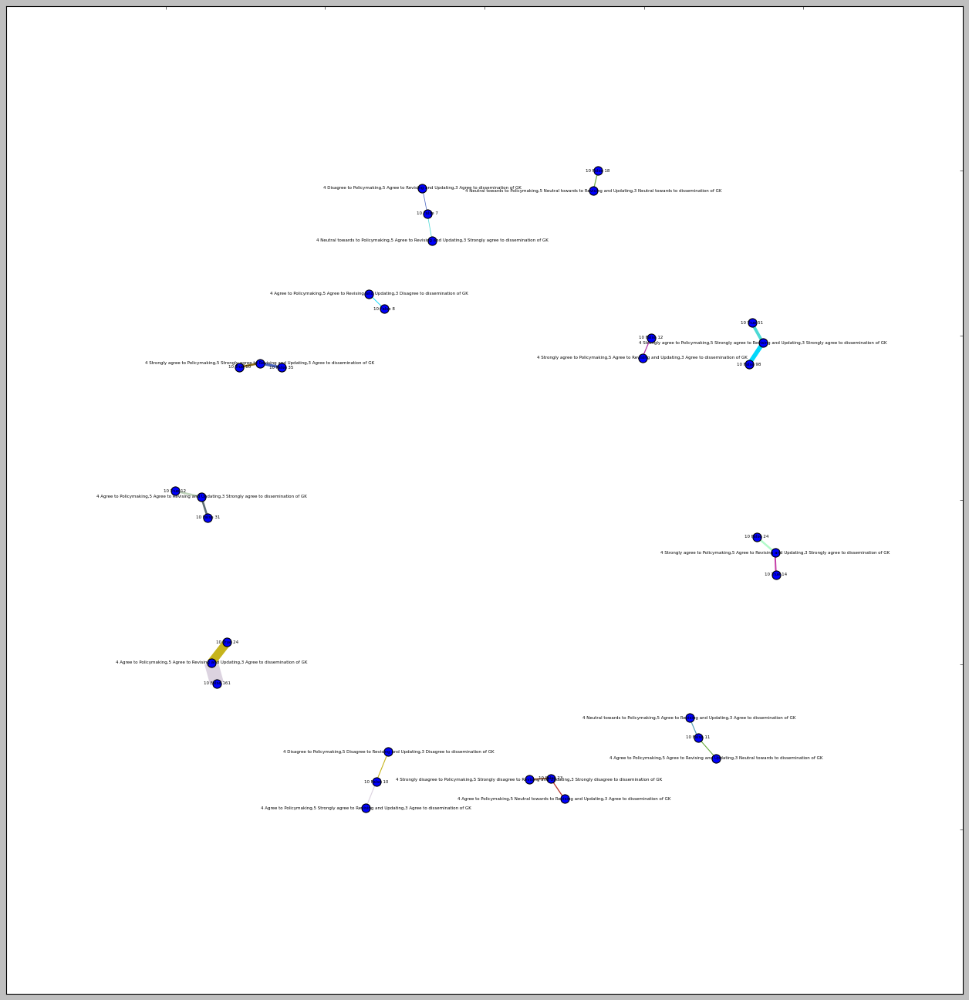

In [265]:
colour = ['#dcd3e0',
 '#c6b41c',
 '#02d7fb',
 '#4cd9d5',
 '#4e68c2',
 '#8c6f1a',
 '#5f6e75',
 '#bfd3bb',
 '#b2fbca',
 '#c53fa7',
 '#a7511e',
 '#b9392e',
 '#77b249',
 '#b22ea6',
 '#5aa0b9',
 '#67a83b']

from pyvis.network import Network
from itertools import combinations
import networkx
import nxviz as nv
import matplotlib as mpl
mpl.style.use('classic')

df_graph = npaths
df_graph['From'] = df_graph['source'].map(str)+' '+ df_graph['count'].map(str)
df_graph['To'] = df_graph['name']
df_graph['Count'] = df_graph['count']
colors=colour
weights = df_graph['count']



G = networkx.from_pandas_edgelist(
    df_graph, source="From", target="To", edge_attr="Count"
)


#################3333333

# dynamic node sizes

scale=3 # Scaling the size of the nodes by 10*degree
d = dict(G.degree)

#Updating dict
d.update((x, scale*y) for x, y in d.items())

####

plt.figure(figsize=(20,20))
plt.rcParams['figure.facecolor'] = 'white'


G = networkx.draw_networkx(G, edge_color=colors, node_color='blue',alpha=1, node_size=100, 
                     width=weights*0.1, arrows= False, with_labels=True, font_size=5, font_family='sans-serif'
                    )

#plt.savefig('PATHS_opinion_correct.png', dpi=300)



In [266]:
#### Top paths 'Strongly' replaced with nothing

paths = pd.DataFrame(y)
#paths = paths.drop(0, axis=1)
paths[0] = 1
paths.fillna(value='', inplace = True)

paths = pd.DataFrame(y)
#paths = paths.drop(0, axis=1)
paths[0] = 1
paths.fillna(value='', inplace = True)

paths[5] = paths[1]
paths[6] = paths[4]
paths[1] = paths[6]
paths[4] = paths[5]
del paths[5]
del paths[6]

paths['path'] = paths[paths.columns[2:]].apply(
    lambda x: ','.join(x.dropna().astype(str)),
    axis=1
)

inv_map = {str(v): str(k) for k, v in categories.items()}
paths['name'] = paths[paths.columns[2:]].apply(
    lambda x: ','.join(x.map(inv_map).dropna().astype(str)),
    axis=1
)



paths['source'] = paths[1].map(inv_map)

paths['name']= paths['name'].str.replace('Strongly agree', 'Agree')
paths['name']= paths['name'].str.replace('Strongly disagree', 'Disagree')
npaths = paths.groupby(['source', 'name'])[0].sum().reset_index()
npaths = npaths[npaths[0] >5]
npaths['count'] = npaths[0]
npaths = npaths.sort_values(by='count', ascending=False)
npaths.head(n=20)




,source,name,0,count
0,10 False,"4 Agree to Policymaking,5 Agree to Revising an...",373,373
25,10 True,"4 Agree to Policymaking,5 Agree to Revising an...",123,123
12,10 False,"4 Disagree to Policymaking,5 Disagree to Revis...",37,37
5,10 False,"4 Agree to Policymaking,5 Neutral towards to R...",34,34
16,10 False,"4 Neutral towards to Policymaking,5 Agree to R...",22,22
24,10 False,"4 Neutral towards to Policymaking,5 Neutral to...",18,18
1,10 False,"4 Agree to Policymaking,5 Agree to Revising an...",16,16
2,10 False,"4 Agree to Policymaking,5 Agree to Revising an...",13,13
8,10 False,"4 Disagree to Policymaking,5 Agree to Revising...",11,11
3,10 False,"4 Agree to Policymaking,5 Disagree to Revising...",9,9


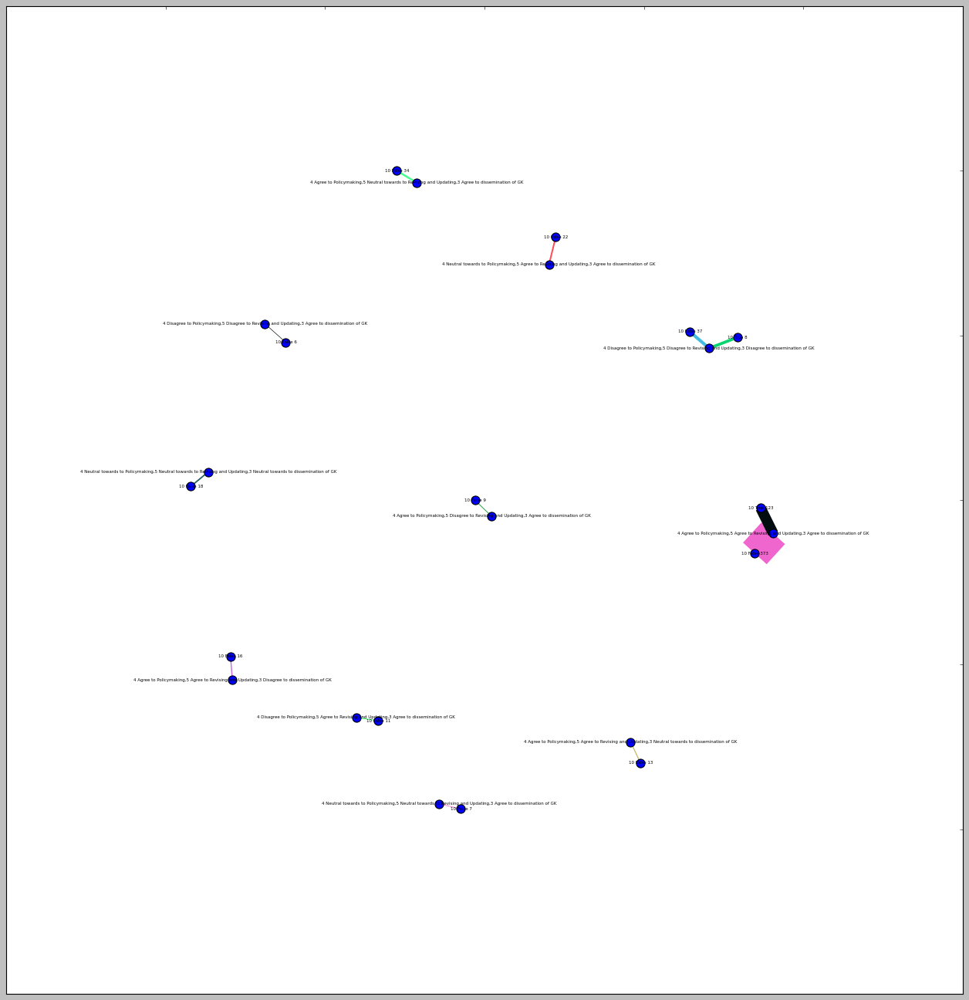

In [267]:
colour = ['#ef66cf',
 '#010c0f',
 '#44bce2',
 '#09d46d',
 '#45fe8b',
 '#ff4d56',
 '#295f5f',
 '#c66fe3',
 '#beb463',
 '#37fe74',
 '#159a35']

from pyvis.network import Network
from itertools import combinations
import networkx
import nxviz as nv
import matplotlib as mpl
mpl.style.use('classic')

df_graph = npaths
df_graph['From'] = df_graph['source'].map(str)+' '+ df_graph['count'].map(str)
df_graph['To'] = df_graph['name']
df_graph['Count'] = df_graph['count']
colors=colour
weights = df_graph['count']



G = networkx.from_pandas_edgelist(
    df_graph, source="From", target="To", edge_attr="Count"
)


#################3333333

# dynamic node sizes

scale=3 # Scaling the size of the nodes by 10*degree
d = dict(G.degree)

#Updating dict
d.update((x, scale*y) for x, y in d.items())

####

plt.figure(figsize=(20,20))
plt.rcParams['figure.facecolor'] = 'white'


G = networkx.draw_networkx(G, edge_color=colors, node_color='blue',alpha=1, node_size=100, 
                     width=weights*0.1, arrows= False, with_labels=True, font_size=5, font_family='sans-serif'
                    )

#plt.savefig('PATHS_strongly_replaced_opinion_correct.png', dpi=300)




# New graphs and sankey (show) - for likert items with who should decide + opinions


In [268]:
select = ['1', '3', '4', '5']
nndf = BNdf[BNdf['Group'].isin(select)]


#####
sources = nndf[['id', 'Option']].copy()

len_options = len(nndf.Option.unique())
len_options

len_ids = len(nndf.id.unique()) +1
len_ids

ranges = list(range(len_ids, len_ids+len_options))

len(ranges) == len(nndf.Option.unique())

options = nndf.Option.unique()
options

# get categorical codes
categories = dict(zip(options,ranges))
categories

sources['codes'] = sources['Option'].map(categories)
xtt=pd.DataFrame()
xtt = sources[['Option', 'codes']].copy()
# get source codes and counts
sources['codes'] = sources['codes'].map(str)
counts = sources.groupby(["id"])["codes"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+counts['codes'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
counts['xcodes'] = nx.iloc[:,2]
gcounts = sources.groupby(["id"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+gcounts['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
gcounts['xoption'] = nx.iloc[:,2]
gcounts
lel = pd.merge(counts, gcounts, on='id')
del lel['codes']
del lel['Option']
lel

# writing operations
wo = []
for i in range(len(counts['xcodes'])) : 
    wo.append(pd.Series(counts.iloc[i, 2]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())
# value counts df
vc = pd.DataFrame(wo)
# counts
cxounts = pd.concat([lel, vc], axis=1)

lex = cxounts.set_index(['id','xcodes', 'xoption']).stack().reset_index()
lex['counts'] = lex[0]
lex['codes'] = lex['level_3']
del lex[0]
del lex['level_3']

# paths
lex['path'] = """'""" + lex["id"].astype(str)+"',"+lex["xcodes"]
lex['label'] = """'""" + lex["id"].astype(str)+"',"+lex["xoption"]
lex['path'] = lex['path'].str.replace("""'""", '')
lex['label'] = lex['label'].str.replace("""'""", '')
lex.head(2)

lex["counts"] = lex["counts"].map(int)
## paths and sources

path_list = list(lex.path.unique())
label_list = list(lex.xoption.unique())

############################################## corrected code
def zigzag(seq):
    """Return two sequences with alternating elements from `seq`"""
    seq_int = [list(map(int, x)) for x in seq]
    x = []
    y = []
    for i in seq_int:
        for j, k in zip(i, i[1:]):
            x.append(j)
            y.append(k)
    return list(zip(x, y))
                

# get a path graph
y = []
for i in range(len(path_list)):
    y.append(list(path_list[i].split(',')))
    
    
big_list = zigzag(y)

#### MOST COMMON PATH

c_path = pd.DataFrame(big_list)
c_path = c_path[c_path[0].isin(ranges)] #remove the participant id initials
c_path[2] = c_path[0]
c_path[0] = '1'
c_path

########################## edit here 
tagged = c_path.groupby([1, 2])[0].agg(lambda x: """','""".join(x[x != ''])).reset_index()
xtagged= ("""'"""+tagged[0].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
xtagged['counts'] = [len(x.split(',')) for x in xtagged[0].tolist()]
ztagged = pd.concat([tagged, xtagged], axis=1)
ztagged

####

inv_map = {str(v): str(k) for k, v in categories.items()}

fif = ztagged[[1, 2, 0, 'counts']]
fif[1] = fif[1].map(str)
fif[3] = fif[1].map(inv_map)
fif[2] = fif[2].map(str)
fif[4] = fif[2].map(inv_map)
del fif[0]

fif['label'] = fif[3] + ' ' + fif[4]
fif[1] = fif[1].map(int)
fif[2] = fif[2].map(int)

fif



,1,2,counts,3,4,label
0,774,776,1,1 Two legal guardians need to agree,1 Other,1 Two legal guardians need to agree 1 Other
1,774,777,1,1 Two legal guardians need to agree,1 Prohibited until child has legal capacity,1 Two legal guardians need to agree 1 Prohibit...
2,774,781,1,1 Two legal guardians need to agree,3 Strongly disagree to dissemination of GK,1 Two legal guardians need to agree 3 Strongly...
3,774,782,1,1 Two legal guardians need to agree,3 Agree to dissemination of GK,1 Two legal guardians need to agree 3 Agree to...
4,774,785,1,1 Two legal guardians need to agree,3 Disagree to dissemination of GK,1 Two legal guardians need to agree 3 Disagree...
...,...,...,...,...,...,...
94,795,784,1,5 Neutral towards to Revising and Updating,3 Neutral towards to dissemination of GK,5 Neutral towards to Revising and Updating 3 N...
95,795,787,12,5 Neutral towards to Revising and Updating,4 Strongly agree to Policymaking,5 Neutral towards to Revising and Updating 4 S...
96,795,788,30,5 Neutral towards to Revising and Updating,4 Agree to Policymaking,5 Neutral towards to Revising and Updating 4 A...
97,795,789,32,5 Neutral towards to Revising and Updating,4 Neutral towards to Policymaking,5 Neutral towards to Revising and Updating 4 N...


In [269]:
fif['connections'] = fif.iloc[:,0].astype(str)+" "+fif.iloc[:,1].astype(str)

colour = ['#656635',
 '#511744',
 '#431384',
 '#cc9284',
 '#f3f39a',
 '#9fa156',
 '#4977f1',
 '#7b8ea9',
 '#dfe10b',
 '#e62354',
 '#607dce',
 '#4147a7',
 '#c94b93',
 '#bcc43c',
 '#612c92',
 '#5d5922',
 '#d1c6f4',
 '#7fd3d7',
 '#4d4224',
 '#76da47',
 '#6d7bfc',
 '#d76092',
 '#ca4eee',
 '#71fefb',
 '#3a74d6',
 '#ff42e0',
 '#a45474',
 '#56cf71',
 '#cfcc39',
 '#075e28',
 '#3f22d5',
 '#5be19a',
 '#32940a',
 '#395e23',
 '#09e736',
 '#1162c9',
 '#3702be',
 '#7ae7ff',
 '#39281f',
 '#90bb34',
 '#ad41ab',
 '#ddffb4',
 '#30ffc3',
 '#e9e618',
 '#47b791',
 '#0f4954',
 '#5127f7',
 '#130bf9',
 '#4258ff',
 '#751979',
 '#e9a3ba',
 '#5bc01d',
 '#cf2b00',
 '#804b82',
 '#158cee',
 '#bc30a4',
 '#92864a',
 '#9f6950',
 '#f11caf',
 '#fc4e77',
 '#cd26a7',
 '#b58a65',
 '#054652',
 '#5b4467',
 '#2ef864',
 '#9bf5dc',
 '#43543d',
 '#177a8a',
 '#cb5141',
 '#429a26',
 '#e1dc00',
 '#c4549f',
 '#e7646f',
 '#05d859',
 '#a00867',
 '#621b1c',
 '#b75c65',
 '#98cb44',
 '#e50859',
 '#43bb87',
 '#b15da9',
 '#46234e',
 '#f8c951',
 '#06fe07',
 '#7ac241',
 '#57cceb',
 '#c6760e',
 '#5a74d3',
 '#42c3a0',
 '#ba6e5f',
 '#f34fc2',
 '#2fa046',
 '#2b613b',
 '#3fafd5',
 '#439443',
 '#6ba9f8',
 '#e11050',
 '#65ef86',
 '#8a5d1d']
cls = pd.DataFrame()

cls['connections'] = pd.DataFrame(fif['connections'].unique())

cls['colour'] = pd.DataFrame(colour)

fif = pd.merge(fif, cls, on='connections')
fif


,1,2,counts,3,4,label,connections,colour
0,774,776,1,1 Two legal guardians need to agree,1 Other,1 Two legal guardians need to agree 1 Other,774 776,#656635
1,774,777,1,1 Two legal guardians need to agree,1 Prohibited until child has legal capacity,1 Two legal guardians need to agree 1 Prohibit...,774 777,#511744
2,774,781,1,1 Two legal guardians need to agree,3 Strongly disagree to dissemination of GK,1 Two legal guardians need to agree 3 Strongly...,774 781,#431384
3,774,782,1,1 Two legal guardians need to agree,3 Agree to dissemination of GK,1 Two legal guardians need to agree 3 Agree to...,774 782,#cc9284
4,774,785,1,1 Two legal guardians need to agree,3 Disagree to dissemination of GK,1 Two legal guardians need to agree 3 Disagree...,774 785,#f3f39a
...,...,...,...,...,...,...,...,...
94,795,784,1,5 Neutral towards to Revising and Updating,3 Neutral towards to dissemination of GK,5 Neutral towards to Revising and Updating 3 N...,795 784,#439443
95,795,787,12,5 Neutral towards to Revising and Updating,4 Strongly agree to Policymaking,5 Neutral towards to Revising and Updating 4 S...,795 787,#6ba9f8
96,795,788,30,5 Neutral towards to Revising and Updating,4 Agree to Policymaking,5 Neutral towards to Revising and Updating 4 A...,795 788,#e11050
97,795,789,32,5 Neutral towards to Revising and Updating,4 Neutral towards to Policymaking,5 Neutral towards to Revising and Updating 4 N...,795 789,#65ef86


In [270]:



def nodify(node_names):
    node_names = unique_list
    # uniqe name begginings
    
    ends = sorted(list(set([e[0] for e in node_names]))) 
    
    # intervals
    steps = 1/4

    # x-values for each unique name ending
    # for input as node position
    nodes_x = {}
    xVal = 0
    for e in ends:
        nodes_x[str(e)] = xVal
        xVal += steps

    # x and y values in list form
    x_values = [nodes_x[n[0]] for n in node_names]
    y_values = [x*0.03 for x in range(1, len(x_values))]
    
    return x_values, y_values

sources = list(fif[1])
targets = list(fif[2])
values = list(fif['counts'])
labels = list(fif['label'])
colours = list(fif['colour'])

unique_list = fif['label'].unique()
sources = sources
targets = targets
values = values

nodified = nodify(node_names=unique_list)



In [271]:
fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 20,
      thickness = 5,
      line = dict(color = 'red', width = 1),
      label = unique_list,
      customdata = labels,
      hovertemplate='Source has total value %{value}<extra></extra>',
      color = 'blue',
        x= nodified[0],
        y= nodified[1]
    ),
    link = dict(
      source = sources, # indices correspond to labels, eg A1, A2, A2, B1, ...
      target = targets,
      value = values,
      customdata = labels,
        color = colours,
      hovertemplate='Percent: %{value}'+
        '<br />Option: %{customdata}<extra></extra>'
  ))])

go.Layout(title='Sankey plot',
          #other options for the plot
           hoverlabel=dict(font=dict(family='sans-serif', size=100)))


fig = fig.update_layout(margin=dict(t=100))

#fig.write_html("/home/mrinalmanu/Documents/iglas_le/opinion_who_should_decide_sankey.html")


fig.show()

In [272]:
### filter here for single counts
fif['counts'] = fif['counts'].map(int)
nfif = fif[fif['counts'] > 1]

### new plot

sources = list(nfif[1])
targets = list(nfif[2])
values = list(nfif['counts'])
labels = list(nfif['label'])
colours = list(nfif['colour'])

unique_list = nfif['label'].unique()
sources = sources
targets = targets
values = values

nodified = nodify(node_names=unique_list)
nodified

### 

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 20,
      thickness = 5,
      line = dict(color = 'red', width = 1),
      label = labels,
      customdata = labels,
      hovertemplate='Source has total value %{value}<extra></extra>',
      color = 'blue',

    ),
    link = dict(
      source = sources, # indices correspond to labels, eg A1, A2, A2, B1, ...
      target = targets,
      value = values,
      customdata = labels,
        color = colours,
      hovertemplate='Absolute count: %{value}'+
        '<br />Option: %{customdata}<extra></extra>'
  ))])

go.Layout(title='Sankey plot',
          #other options for the plot
           hoverlabel=dict(font=dict(family='sans-serif', size=100)))


fig = fig.update_layout(margin=dict(t=100))

fig.show()
#fig.write_html("/home/mrinalmanu/Documents/iglas_le/opinion_who_should_decide_clean_sankey.html")

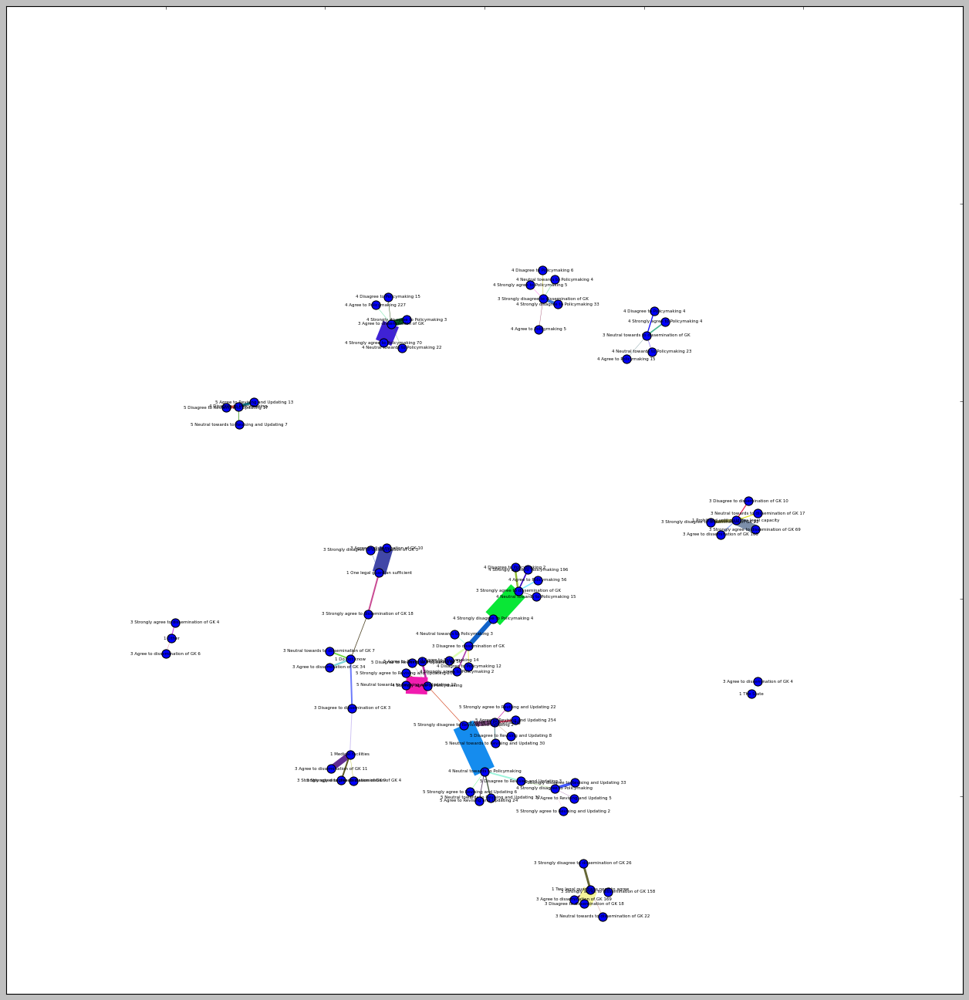

In [273]:
from pyvis.network import Network
from itertools import combinations
import networkx
import nxviz as nv
import matplotlib as mpl
mpl.style.use('classic')

df_graph = nfif
df_graph['From'] = df_graph[3].map(str)+' '+ df_graph['counts'].map(str)
df_graph['To'] = df_graph[4]
df_graph['Count'] = df_graph['counts']
colors=cls['colour']
weights = df_graph['counts']



G = networkx.from_pandas_edgelist(
    df_graph, source="From", target="To", edge_attr="Count"
)


#################3333333

# dynamic node sizes

scale=3 # Scaling the size of the nodes by 10*degree
d = dict(G.degree)

#Updating dict
d.update((x, scale*y) for x, y in d.items())

####

plt.figure(figsize=(20,20))
plt.rcParams['figure.facecolor'] = 'white'

graph_pos = networkx.spring_layout(G)

G = networkx.draw_networkx(G, graph_pos, edge_color=colors, node_color='blue',alpha=1, node_size=100, 
                     width=weights*0.1, arrows= False, with_labels=True, font_size=5, font_family='sans-serif'
                    )

#plt.savefig('opinion_who_should_decide.png', dpi=300)


In [274]:
fif = fif.sort_values(by='counts', ascending=False)
fif.head(n=20)

,1,2,counts,3,4,label,connections,colour
79,792,788,254,5 Agree to Revising and Updating,4 Agree to Policymaking,5 Agree to Revising and Updating 4 Agree to Po...,792 788,#43bb87
55,788,782,227,4 Agree to Policymaking,3 Agree to dissemination of GK,4 Agree to Policymaking 3 Agree to disseminati...,788 782,#bc30a4
83,793,787,200,5 Strongly agree to Revising and Updating,4 Strongly agree to Policymaking,5 Strongly agree to Revising and Updating 4 St...,793 787,#06fe07
50,787,783,196,4 Strongly agree to Policymaking,3 Strongly agree to dissemination of GK,4 Strongly agree to Policymaking 3 Strongly ag...,787 783,#e9a3ba
19,782,774,169,3 Agree to dissemination of GK,1 Two legal guardians need to agree,3 Agree to dissemination of GK 1 Two legal gua...,782 774,#76da47
26,783,774,158,3 Strongly agree to dissemination of GK,1 Two legal guardians need to agree,3 Strongly agree to dissemination of GK 1 Two ...,783 774,#a45474
22,782,777,105,3 Agree to dissemination of GK,1 Prohibited until child has legal capacity,3 Agree to dissemination of GK 1 Prohibited un...,782 777,#ca4eee
49,787,782,70,4 Strongly agree to Policymaking,3 Agree to dissemination of GK,4 Strongly agree to Policymaking 3 Agree to di...,787 782,#751979
29,783,777,69,3 Strongly agree to dissemination of GK,1 Prohibited until child has legal capacity,3 Strongly agree to dissemination of GK 1 Proh...,783 777,#075e28
56,788,783,56,4 Agree to Policymaking,3 Strongly agree to dissemination of GK,4 Agree to Policymaking 3 Strongly agree to di...,788 783,#92864a


In [275]:
#### Top paths

paths = pd.DataFrame(y)
#paths = paths.drop(0, axis=1)
paths[0] = 1
paths.fillna(value='', inplace = True)

paths

,0,1,2,3,4
0,1,774,781,786,791
1,1,775,782,787,792
2,1,774,,,
3,1,774,782,788,792
4,1,774,781,786,791
...,...,...,...,...,...
768,1,779,782,787,793
769,1,777,782,788,792
770,1,774,783,787,793
771,1,777,782,787,793


In [276]:

paths['path'] = paths[paths.columns[2:]].apply(
    lambda x: ','.join(x.dropna().astype(str)),
    axis=1
)

inv_map = {str(v): str(k) for k, v in categories.items()}
paths['name'] = paths[paths.columns[2:]].apply(
    lambda x: ','.join(x.map(inv_map).dropna().astype(str)),
    axis=1
)


paths['source'] = paths[1].map(inv_map)
npaths = paths.groupby(['source', 'path', 'name'])[0].sum().reset_index()
npaths = npaths[npaths[0] >5]
npaths['count'] = npaths[0]
npaths = npaths.sort_values(by='count', ascending=False)
npaths.head(n=20)



,source,path,name,0,count
123,1 Two legal guardians need to agree,"782,788,792","3 Agree to dissemination of GK,4 Agree to Poli...",93,93
138,1 Two legal guardians need to agree,"783,787,793","3 Strongly agree to dissemination of GK,4 Stro...",81,81
77,1 Prohibited until child has legal capacity,"782,788,792","3 Agree to dissemination of GK,4 Agree to Poli...",55,55
87,1 Prohibited until child has legal capacity,"783,787,793","3 Strongly agree to dissemination of GK,4 Stro...",43,43
141,1 Two legal guardians need to agree,"783,788,792","3 Strongly agree to dissemination of GK,4 Agre...",27,27
137,1 Two legal guardians need to agree,"783,787,792","3 Strongly agree to dissemination of GK,4 Stro...",23,23
119,1 Two legal guardians need to agree,"782,787,793","3 Agree to dissemination of GK,4 Strongly agre...",23,23
4,1 Do not know,"782,788,792","3 Agree to dissemination of GK,4 Agree to Poli...",22,22
110,1 Two legal guardians need to agree,"781,786,791","3 Strongly disagree to dissemination of GK,4 S...",15,15
75,1 Prohibited until child has legal capacity,"782,787,793","3 Agree to dissemination of GK,4 Strongly agre...",13,13


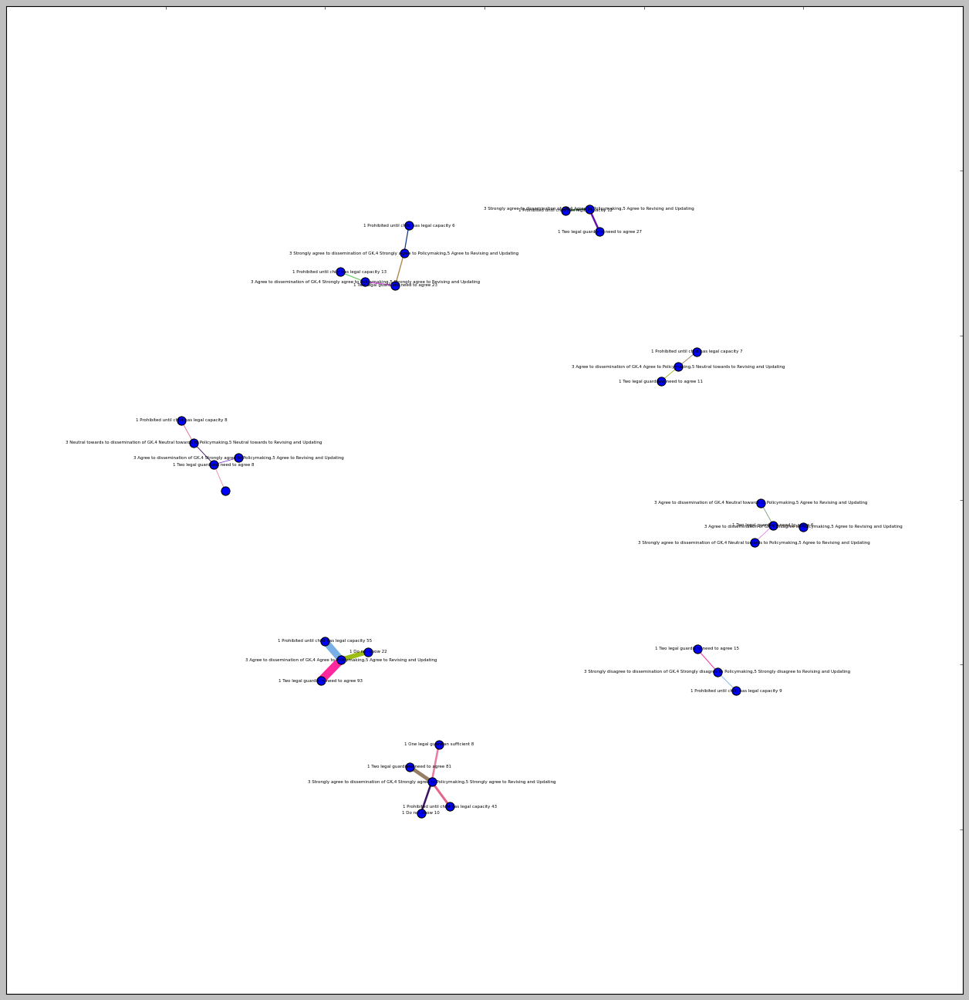

In [277]:


colour = ['#fe299c',
 '#78afe6',
 '#9cbd13',
 '#977d64',
 '#e66588',
 '#3e1260',
 '#e97ca2',
 '#670caf',
 '#4f8458',
 '#b68a51',
 '#e15bef',
 '#0a348f',
 '#5ec85d']

from pyvis.network import Network
from itertools import combinations
import networkx
import nxviz as nv
import matplotlib as mpl
mpl.style.use('classic')

df_graph = npaths
df_graph['From'] = df_graph['source'].map(str)+' '+ df_graph['count'].map(str)
df_graph['To'] = df_graph['name']
df_graph['Count'] = df_graph['count']
colors=colour
weights = df_graph['count']



G = networkx.from_pandas_edgelist(
    df_graph, source="From", target="To", edge_attr="Count"
)


#################3333333

# dynamic node sizes

scale=3 # Scaling the size of the nodes by 10*degree
d = dict(G.degree)

#Updating dict
d.update((x, scale*y) for x, y in d.items())

####

plt.figure(figsize=(20,20))
plt.rcParams['figure.facecolor'] = 'white'


G = networkx.draw_networkx(G, edge_color=colors, node_color='blue',alpha=1, node_size=100, 
                     width=weights*0.1, arrows= False, with_labels=True, font_size=5, font_family='sans-serif'
                    )

#plt.savefig('PATHS_opinion_who_should_decide.png', dpi=300)



In [278]:
#### Top paths 'Strongly' replaced with nothing


paths = pd.DataFrame(y)
#paths = paths.drop(0, axis=1)
paths[0] = 1
paths.fillna(value='', inplace = True)

paths['path'] = paths[paths.columns[2:]].apply(
    lambda x: ','.join(x.dropna().astype(str)),
    axis=1
)

inv_map = {str(v): str(k) for k, v in categories.items()}
paths['name'] = paths[paths.columns[2:]].apply(
    lambda x: ','.join(x.map(inv_map).dropna().astype(str)),
    axis=1
)



paths['source'] = paths[1].map(inv_map)

paths['name']= paths['name'].str.replace('Strongly agree', 'Agree')
paths['name']= paths['name'].str.replace('Strongly disagree', 'Disagree')
npaths = paths.groupby(['source', 'name'])[0].sum().reset_index()
npaths = npaths[npaths[0] >5]
npaths['count'] = npaths[0]
npaths = npaths.sort_values(by='count', ascending=False)
npaths.head(n=20)




,source,name,0,count
59,1 Two legal guardians need to agree,"3 Agree to dissemination of GK,4 Agree to Poli...",263,263
32,1 Prohibited until child has legal capacity,"3 Agree to dissemination of GK,4 Agree to Poli...",140,140
1,1 Do not know,"3 Agree to dissemination of GK,4 Agree to Poli...",39,39
23,1 One legal guardian sufficient,"3 Agree to dissemination of GK,4 Agree to Poli...",25,25
73,1 Two legal guardians need to agree,"3 Disagree to dissemination of GK,4 Disagree t...",23,23
61,1 Two legal guardians need to agree,"3 Agree to dissemination of GK,4 Agree to Poli...",19,19
15,1 Medical facilities,"3 Agree to dissemination of GK,4 Agree to Poli...",16,16
65,1 Two legal guardians need to agree,"3 Agree to dissemination of GK,4 Neutral towar...",16,16
45,1 Prohibited until child has legal capacity,"3 Disagree to dissemination of GK,4 Disagree t...",14,14
34,1 Prohibited until child has legal capacity,"3 Agree to dissemination of GK,4 Agree to Poli...",11,11


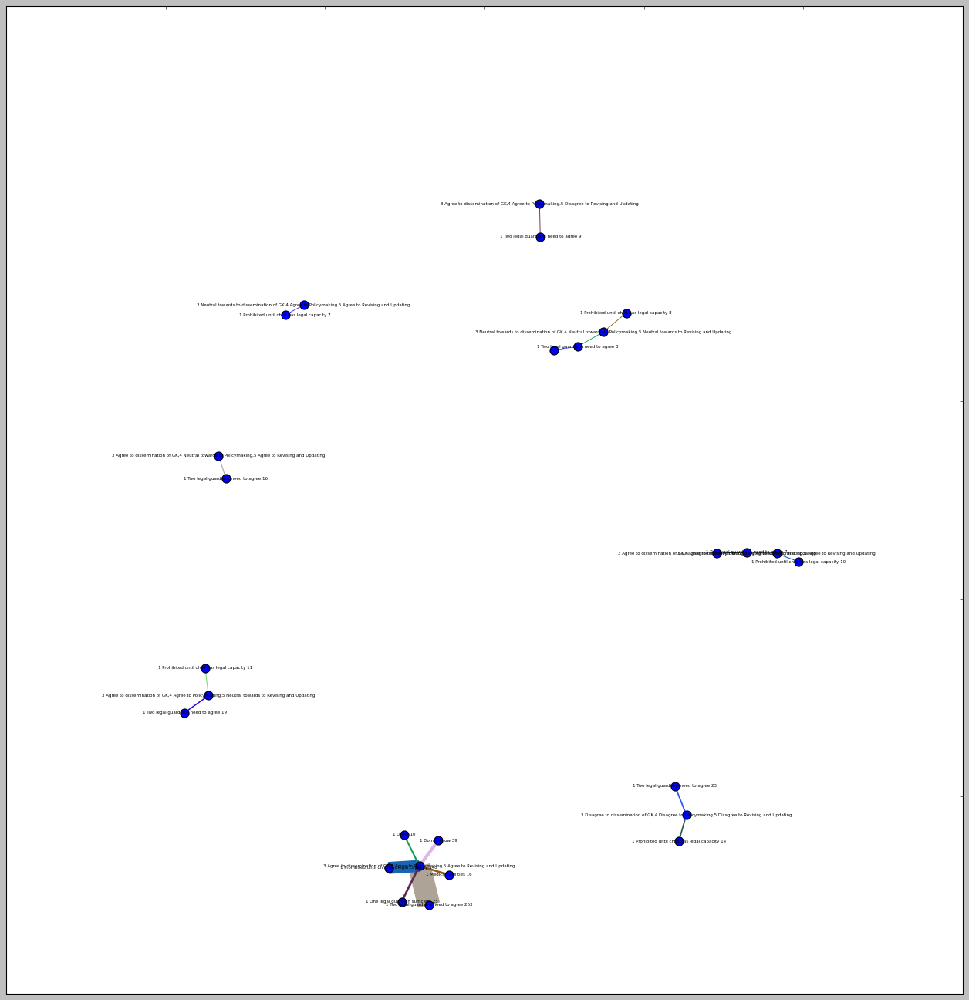

In [279]:
colour =['#aea397',
 '#1865b4',
 '#deb8e6',
 '#622754',
 '#8e5b13',
 '#169d53',
 '#2e51f7',
 '#2e5d4d',
 '#1a0ce2',
 '#82e36b']

from pyvis.network import Network
from itertools import combinations
import networkx
import nxviz as nv
import matplotlib as mpl
mpl.style.use('classic')

df_graph = npaths
df_graph['From'] = df_graph['source'].map(str)+' '+ df_graph['count'].map(str)
df_graph['To'] = df_graph['name']
df_graph['Count'] = df_graph['count']
colors=colour
weights = df_graph['count']



G = networkx.from_pandas_edgelist(
    df_graph, source="From", target="To", edge_attr="Count"
)


#################3333333

# dynamic node sizes

scale=3 # Scaling the size of the nodes by 10*degree
d = dict(G.degree)

#Updating dict
d.update((x, scale*y) for x, y in d.items())

####

plt.figure(figsize=(20,20))
plt.rcParams['figure.facecolor'] = 'white'


G = networkx.draw_networkx(G, edge_color=colors, node_color='blue',alpha=1, node_size=100, 
                     width=weights*0.1, arrows= False, with_labels=True, font_size=5, font_family='sans-serif'
                    )

#plt.savefig('PATHS_strongly_replaced_opinion_who_should_decide.png', dpi=300)




# which participants are answering the question wrong, how are they related

In [280]:
select = ['10']
cnndf = BNdf[BNdf['Group'].isin(select)]
cnndf

,id,Description,Option,Variable,Group
19144,0,"On average, how much of their total DNA is the...",10 False,LE5.017,10
19145,1,"On average, how much of their total DNA is the...",10 False,LE5.017,10
19146,3,"On average, how much of their total DNA is the...",10 False,LE5.017,10
19147,5,"On average, how much of their total DNA is the...",10 False,LE5.017,10
19148,14,"On average, how much of their total DNA is the...",10 False,LE5.017,10
...,...,...,...,...,...
19912,1875,"On average, how much of their total DNA is the...",10 True,LE5.017,10
19913,1885,"On average, how much of their total DNA is the...",10 False,LE5.017,10
19914,1886,"On average, how much of their total DNA is the...",10 True,LE5.017,10
19915,1887,"On average, how much of their total DNA is the...",10 False,LE5.017,10


In [281]:
nndf = pd.concat([cps, cnndf])

In [282]:
nndf

,id,Description,Option,Variable,Group
0,0,Scoring_profile,Low Scoring_profile,Class_X,77
1,1,Scoring_profile,High Scoring_profile,Class_X,77
2,3,Scoring_profile,High Scoring_profile,Class_X,77
3,5,Scoring_profile,Low Scoring_profile,Class_X,77
4,14,Scoring_profile,Low Scoring_profile,Class_X,77
...,...,...,...,...,...
19912,1875,"On average, how much of their total DNA is the...",10 True,LE5.017,10
19913,1885,"On average, how much of their total DNA is the...",10 False,LE5.017,10
19914,1886,"On average, how much of their total DNA is the...",10 True,LE5.017,10
19915,1887,"On average, how much of their total DNA is the...",10 False,LE5.017,10


In [283]:

nndf['Option'] = nndf['Option'].map(str)
nndf = nndf[~nndf['Option'].isin(select)]

sources = nndf[['id', 'Option']].copy()

len_options = len(nndf.Option.unique())
len_options

len_ids = len(nndf.id.unique()) +1
len_ids

ranges = list(range(len_ids, len_ids+len_options))

len(ranges) == len(nndf.Option.unique())

options = nndf.Option.unique()
options

# get categorical codes
categories = dict(zip(options,ranges))
categories

sources['codes'] = sources['Option'].map(categories)
xtt=pd.DataFrame()
xtt = sources[['Option', 'codes']].copy()
# get source codes and counts
sources['codes'] = sources['codes'].map(str)
counts = sources.groupby(["id"])["codes"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+counts['codes'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
counts['xcodes'] = nx.iloc[:,2]
gcounts = sources.groupby(["id"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+gcounts['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
gcounts['xoption'] = nx.iloc[:,2]
gcounts
lel = pd.merge(counts, gcounts, on='id')
del lel['codes']
del lel['Option']
lel

# writing operations
wo = []
for i in range(len(counts['xcodes'])) : 
    wo.append(pd.Series(counts.iloc[i, 2]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())
# value counts df
vc = pd.DataFrame(wo)
# counts
cxounts = pd.concat([lel, vc], axis=1)

lex = cxounts.set_index(['id','xcodes', 'xoption']).stack().reset_index()
lex['counts'] = lex[0]
lex['codes'] = lex['level_3']
del lex[0]
del lex['level_3']

# paths
lex['path'] = """'""" + lex["id"].astype(str)+"',"+lex["xcodes"]
lex['label'] = """'""" + lex["id"].astype(str)+"',"+lex["xoption"]
lex['path'] = lex['path'].str.replace("""'""", '')
lex['label'] = lex['label'].str.replace("""'""", '')
lex.head(2)

lex["counts"] = lex["counts"].map(int)
## paths and sources

path_list = list(lex.path.unique())
label_list = list(lex.xoption.unique())

############################################## corrected code
def zigzag(seq):
    """Return two sequences with alternating elements from `seq`"""
    seq_int = [list(map(int, x)) for x in seq]
    x = []
    y = []
    for i in seq_int:
        for j, k in zip(i, i[1:]):
            x.append(j)
            y.append(k)
    return list(zip(x, y))
                

# get a path graph
y = []
for i in range(len(path_list)):
    y.append(list(path_list[i].split(',')))
    
    
big_list = zigzag(y)

#### MOST COMMON PATH

c_path = pd.DataFrame(big_list)
c_path = c_path[c_path[0].isin(ranges)] #remove the participant id initials
c_path[2] = c_path[0]
c_path[0] = '1'
c_path

########################## edit here 
tagged = c_path.groupby([1, 2])[0].agg(lambda x: """','""".join(x[x != ''])).reset_index()
xtagged= ("""'"""+tagged[0].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
xtagged['counts'] = [len(x.split(',')) for x in xtagged[0].tolist()]
ztagged = pd.concat([tagged, xtagged], axis=1)
ztagged

####

inv_map = {str(v): str(k) for k, v in categories.items()}

fif = ztagged[[1, 2, 0, 'counts']]
fif[1] = fif[1].map(str)
fif[3] = fif[1].map(inv_map)
fif[2] = fif[2].map(str)
fif[4] = fif[2].map(inv_map)
del fif[0]

fif['label'] = fif[3] + ' ' + fif[4]
fif[1] = fif[1].map(int)
fif[2] = fif[2].map(int)

fif




,1,2,counts,3,4,label
0,774,776,1,Low Scoring_profile,Older Age Profile,Low Scoring_profile Older Age Profile
1,774,780,1,Low Scoring_profile,Non law Legal,Low Scoring_profile Non law Legal
2,774,781,1,Low Scoring_profile,Law Legal,Low Scoring_profile Law Legal
3,774,782,1,Low Scoring_profile,Student student,Low Scoring_profile Student student
4,774,783,1,Low Scoring_profile,Not student student,Low Scoring_profile Not student student
5,774,784,1,Low Scoring_profile,Other branch branch,Low Scoring_profile Other branch branch
6,774,785,1,Low Scoring_profile,Not a student branch,Low Scoring_profile Not a student branch
7,774,786,1,Low Scoring_profile,Law branch branch,Low Scoring_profile Law branch branch
8,774,787,1,Low Scoring_profile,Low concern,Low Scoring_profile Low concern
9,774,789,1,Low Scoring_profile,High concern,Low Scoring_profile High concern


In [284]:
fif['connections'] = fif.iloc[:,0].astype(str)+" "+fif.iloc[:,1].astype(str)

colour = ['#4d722d',
 '#bdd2d3',
 '#946295',
 '#377809',
 '#558714',
 '#fb0485',
 '#a0b05b',
 '#3fc3bc',
 '#8463d6',
 '#141a1b',
 '#65fc8d',
 '#a7602e',
 '#9d5cfe',
 '#021811',
 '#b439d0',
 '#2e5571',
 '#59865b',
 '#5d3961',
 '#b873a6',
 '#164865',
 '#b96bc5',
 '#08631c',
 '#e882e3',
 '#6a6e3c',
 '#c55f73',
 '#678ebb',
 '#f9cabf',
 '#855ea7',
 '#8ddeca',
 '#f1a3e9',
 '#d8acd9',
 '#638e85',
 '#cdb6b1',
 '#8d5d17',
 '#1ec395',
 '#c859d8',
 '#cca0e6',
 '#c48d43',
 '#4c0d27',
 '#f83ff9',
 '#f016d1',
 '#2621fd',
 '#5b667f',
 '#2ac438',
 '#88c3c1',
 '#e31a52',
 '#9be77a',
 '#9754c9',
 '#891df4',
 '#de0eb4',
 '#cf0a7c',
 '#075a8e',
 '#8ae2bd',
 '#b2b872',
 '#6e4f5a',
 '#d5ed36',
 '#3e2e27']
cls = pd.DataFrame()

cls['connections'] = pd.DataFrame(fif['connections'].unique())

cls['colour'] = pd.DataFrame(colour)

fif = pd.merge(fif, cls, on='connections')
fif


,1,2,counts,3,4,label,connections,colour
0,774,776,1,Low Scoring_profile,Older Age Profile,Low Scoring_profile Older Age Profile,774 776,#4d722d
1,774,780,1,Low Scoring_profile,Non law Legal,Low Scoring_profile Non law Legal,774 780,#bdd2d3
2,774,781,1,Low Scoring_profile,Law Legal,Low Scoring_profile Law Legal,774 781,#946295
3,774,782,1,Low Scoring_profile,Student student,Low Scoring_profile Student student,774 782,#377809
4,774,783,1,Low Scoring_profile,Not student student,Low Scoring_profile Not student student,774 783,#558714
5,774,784,1,Low Scoring_profile,Other branch branch,Low Scoring_profile Other branch branch,774 784,#fb0485
6,774,785,1,Low Scoring_profile,Not a student branch,Low Scoring_profile Not a student branch,774 785,#a0b05b
7,774,786,1,Low Scoring_profile,Law branch branch,Low Scoring_profile Law branch branch,774 786,#3fc3bc
8,774,787,1,Low Scoring_profile,Low concern,Low Scoring_profile Low concern,774 787,#8463d6
9,774,789,1,Low Scoring_profile,High concern,Low Scoring_profile High concern,774 789,#141a1b


In [285]:
def nodify(node_names):
    node_names = unique_list
    # uniqe name begginings
    
    ends = sorted(list(set([e[0] for e in node_names]))) 
    
    # intervals
    steps = 1/4

    # x-values for each unique name ending
    # for input as node position
    nodes_x = {}
    xVal = 0
    for e in ends:
        nodes_x[str(e)] = xVal
        xVal += steps

    # x and y values in list form
    x_values = [nodes_x[n[0]] for n in node_names]
    y_values = [x*0.03 for x in range(1, len(x_values))]
    
    return x_values, y_values

sources = list(fif[1])
targets = list(fif[2])
values = list(fif['counts'])
labels = list(fif['label'])
colours = list(fif['colour'])

unique_list = fif['label'].unique()
sources = sources
targets = targets
values = values

nodified = nodify(node_names=unique_list)
nodified


fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 20,
      thickness = 5,
      line = dict(color = 'red', width = 1),
      label = unique_list,
      customdata = labels,
      hovertemplate='Source has total value %{value}<extra></extra>',
      color = 'blue',
        x= nodified[0],
        y= nodified[1]
    ),
    link = dict(
      source = sources, # indices correspond to labels, eg A1, A2, A2, B1, ...
      target = targets,
      value = values,
      customdata = labels,
        color = colours,
      hovertemplate='Percent: %{value}'+
        '<br />Option: %{customdata}<extra></extra>'
  ))])

go.Layout(title='Sankey plot',
          #other options for the plot
           hoverlabel=dict(font=dict(family='sans-serif', size=100)))


fig = fig.update_layout(margin=dict(t=100))

#fig.write_html("/home/mrinalmanu/Documents/iglas_le/categories_sankey.html")


fig.show()


In [286]:

### filter here for single counts
fif['counts'] = fif['counts'].map(int)
nfif = fif[fif['counts'] > 1]

### new plot

sources = list(nfif[1])
targets = list(nfif[2])
values = list(nfif['counts'])
labels = list(nfif['label'])
colours = list(nfif['colour'])

unique_list = nfif['label'].unique()
sources = sources
targets = targets
values = values

nodified = nodify(node_names=unique_list)
nodified

### 

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 50,
      thickness = 5,
      line = dict(color = 'red', width = 1),
      label = labels,
      customdata = labels,
      hovertemplate='Source has total value %{value}<extra></extra>',
      color = 'blue',

    ),
    link = dict(
      source = sources, # indices correspond to labels, eg A1, A2, A2, B1, ...
      target = targets,
      value = values,
      customdata = labels,
        color = colours,
      hovertemplate='Absolute count: %{value}'+
        '<br />Option: %{customdata}<extra></extra>'
  ))])

go.Layout(title='Sankey plot',
          #other options for the plot
           hoverlabel=dict(font=dict(family='sans-serif', size=100)))


fig = fig.update_layout(margin=dict(t=100))

fig.show()
#fig.write_html("/home/mrinalmanu/Documents/iglas_le/categories_clean_sankey.html")


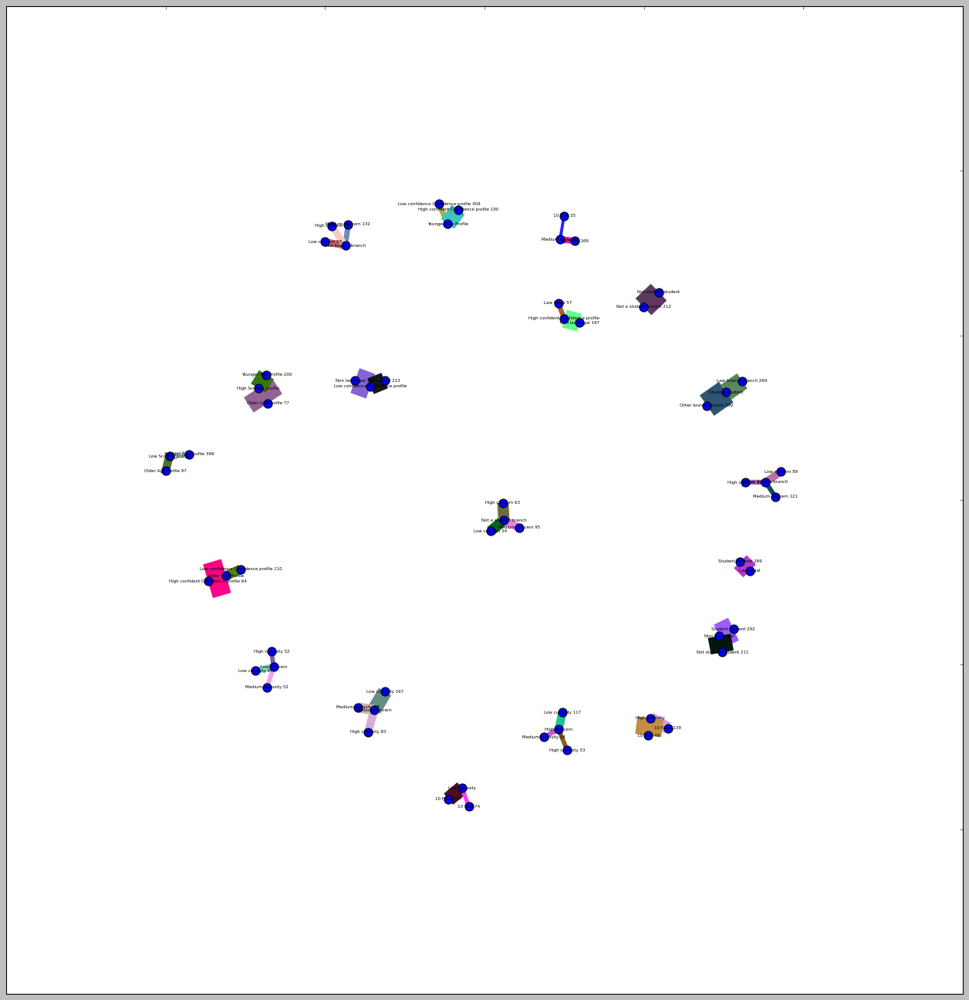

In [287]:

from pyvis.network import Network
from itertools import combinations
import networkx
import nxviz as nv
import matplotlib as mpl
mpl.style.use('classic')

df_graph = nfif
df_graph['From'] = df_graph[3].map(str)+' '+ df_graph['counts'].map(str)
df_graph['To'] = df_graph[4]
df_graph['Count'] = df_graph['counts']
colors=cls['colour']
weights = df_graph['counts']



G = networkx.from_pandas_edgelist(
    df_graph, source="From", target="To", edge_attr="Count"
)


#################3333333

# dynamic node sizes

scale=3 # Scaling the size of the nodes by 10*degree
d = dict(G.degree)

#Updating dict
d.update((x, scale*y) for x, y in d.items())

####

plt.figure(figsize=(20,20))
plt.rcParams['figure.facecolor'] = 'white'


G = networkx.draw_networkx(G, edge_color=colors, node_color='blue',alpha=1, node_size=100, 
                     width=weights*0.1, arrows= False, with_labels=True, font_size=5, font_family='sans-serif'
                    )

#plt.savefig('allx_categories_network.png', dpi=300)


In [288]:
#### Top paths 'Strongly' replaced with nothing


paths = pd.DataFrame(y)
#paths = paths.drop(0, axis=1)
paths[0] = 1
paths.fillna(value='', inplace = True)

paths


,0,1,2,3,4,5,6,7,8,9
0,1,774,776,778,780,782,784,787,790,793
1,1,775,777,778,780,782,784,788,791,793
2,1,775,777,779,780,782,784,788,790,793
3,1,774,776,779,780,783,785,788,791,793
4,1,774,777,778,780,782,784,789,791,793
...,...,...,...,...,...,...,...,...,...,...
768,1,775,776,778,780,783,785,787,791,794
769,1,774,776,778,780,783,785,788,792,793
770,1,775,776,778,780,783,785,788,792,794
771,1,774,776,779,780,783,785,788,791,793


In [289]:
paths[10] = paths[1]
paths[11] = paths[9]

paths[1] = paths[11]
paths[9] = paths[10]

del paths[11]
del paths[10]

In [290]:
paths['path'] = paths[paths.columns[2:]].apply(
    lambda x: ','.join(x.dropna().astype(str)),
    axis=1
)

inv_map = {str(v): str(k) for k, v in categories.items()}
paths['name'] = paths[paths.columns[2:]].apply(
    lambda x: ','.join(x.map(inv_map).dropna().astype(str)),
    axis=1
)



paths['source'] = paths[1].map(inv_map)

paths['name']= paths['name'].str.replace('Strongly agree', 'Agree')
paths['name']= paths['name'].str.replace('Strongly disagree', 'Disagree')
npaths = paths.groupby(['source', 'name'])[0].sum().reset_index()
npaths = npaths[npaths[0] >5]
npaths['count'] = npaths[0]
npaths = npaths.sort_values(by='count', ascending=False)
npaths.head(n=20)



,source,name,0,count
97,10 False,"Younger Age Profile,Low confidence Confidence ...",39,39
95,10 False,"Younger Age Profile,Low confidence Confidence ...",24,24
86,10 False,"Younger Age Profile,Low confidence Confidence ...",20,20
92,10 False,"Younger Age Profile,Low confidence Confidence ...",20,20
128,10 False,"Younger Age Profile,Low confidence Confidence ...",19,19
120,10 False,"Younger Age Profile,Low confidence Confidence ...",18,18
30,10 False,"Older Age Profile,Low confidence Confidence pr...",16,16
88,10 False,"Younger Age Profile,Low confidence Confidence ...",16,16
24,10 False,"Older Age Profile,Low confidence Confidence pr...",15,15
99,10 False,"Younger Age Profile,Low confidence Confidence ...",15,15


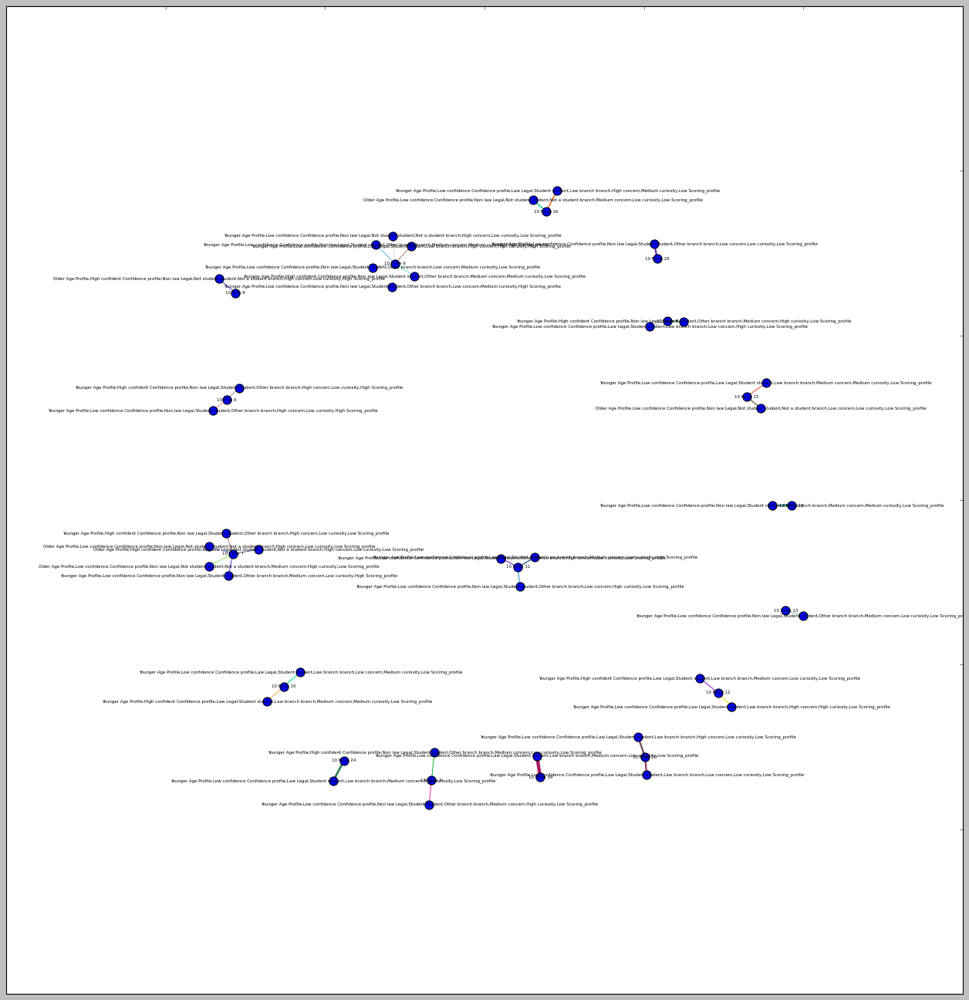

In [291]:
colour = ['#ad1562',
 '#278250',
 '#6e4758',
 '#9c3568',
 '#48c4b9',
 '#6509bf',
 '#28d49c',
 '#f87931',
 '#7d7f65',
 '#e78b73',
 '#99d5ca',
 '#edee37',
 '#b34cd3',
 '#3ca9ce',
 '#0e4781',
 '#8234bd',
 '#07e393',
 '#eab252',
 '#06b530',
 '#eb299e',
 '#a0c7c3',
 '#3ed850',
 '#322afe',
 '#3805b6',
 '#4b457d',
 '#648dfa',
 '#ab586f',
 '#6be237',
 '#c9cbe2',
 '#bcefed',
 '#98c8c8',
 '#a5361a',
 '#1dd7a6',
 '#0f98cd',
 '#894550',
 '#fc5254']

from pyvis.network import Network
from itertools import combinations
import networkx
import nxviz as nv
import matplotlib as mpl
mpl.style.use('classic')

df_graph = npaths
df_graph['From'] = df_graph['source'].map(str)+' '+ df_graph['count'].map(str)
df_graph['To'] = df_graph['name']
df_graph['Count'] = df_graph['count']
colors=colour
weights = df_graph['count']



G = networkx.from_pandas_edgelist(
    df_graph, source="From", target="To", edge_attr="Count"
)


#################3333333

# dynamic node sizes

scale=3 # Scaling the size of the nodes by 10*degree
d = dict(G.degree)

#Updating dict
d.update((x, scale*y) for x, y in d.items())

####

plt.figure(figsize=(20,20))
plt.rcParams['figure.facecolor'] = 'white'


G = networkx.draw_networkx(G, edge_color=colors, node_color='blue',alpha=1, node_size=100, 
                     width=weights*0.1, arrows= False, with_labels=True, font_size=5, font_family='sans-serif'
                    )

#plt.savefig('PATHS_category_relationships.png', dpi=300)


# Overall Network (directed, no path)

In [292]:
nndf = pd.concat([cps ,ndf_23, ndf_24, ndf_65, ndf_66, ndf_67]).reset_index() 

options = nndf.Group.unique()
ranges = list(range(0, len(options)))
# get categorical codes
categories = dict(zip(options,ranges))
categories
## map categories onto Groups
nndf['Group'] = nndf['Group'].map(str)
nndf['Group'] = nndf['Group'].map(categories)
nndf

nndf['Group'] = nndf['Group'].map(str)
nndf['Option'] = nndf['Option'].map(str)
nndf['Option'] = nndf['Group'] + ' ' + nndf['Option']
nndf

,level_0,id,Description,Option,Variable,Group,index
0,0,0,Scoring_profile,0 Low Scoring_profile,Class_X,0,NaN
1,1,1,Scoring_profile,0 High Scoring_profile,Class_X,0,NaN
2,2,3,Scoring_profile,0 High Scoring_profile,Class_X,0,NaN
3,3,5,Scoring_profile,0 Low Scoring_profile,Class_X,0,NaN
4,4,14,Scoring_profile,0 Low Scoring_profile,Class_X,0,NaN
...,...,...,...,...,...,...,...
13668,7450,1875,Revising and updating ethical guidelines conce...,5 Strongly agree to Revising and Updating,LE3.201,5,59691.0
13669,7460,1885,Revising and updating ethical guidelines conce...,5 Agree to Revising and Updating,LE3.201,5,59751.0
13670,7471,1886,Revising and updating ethical guidelines conce...,5 Strongly agree to Revising and Updating,LE3.201,5,59814.0
13671,7482,1887,Revising and updating ethical guidelines conce...,5 Strongly agree to Revising and Updating,LE3.201,5,59876.0


In [293]:
from pyvis.network import Network
from itertools import combinations
import networkx
import nxviz as nv

In [294]:
cdf = nndf
#cdf['Option'] = cdf['Option'].str.replace('Other as Text', '')
#cdf['Option'] = cdf['Option'].str.replace('Other', '')

cdf = cdf.groupby(["Description", "Variable"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nxx = ("""'"""+cdf['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series


cdf['rating'] = nxx.iloc[:,2]


In [295]:
cdf

,Description,Variable,Option,rating
0,Age Profile,Class_X,"0 Older Age Profile','0 Younger Age Profile','...","'0 Older Age Profile','0 Younger Age Profile',..."
1,Confidence profile,Class_X,"0 Low confidence Confidence profile','0 Low co...","'0 Low confidence Confidence profile','0 Low c..."
2,Dissemination of genetic knowledge to the gene...,LE3.199,"3 Strongly disagree to dissemination of GK','3...","'3 Strongly disagree to dissemination of GK','..."
3,"In most instances, and assuming two parents wi...",LE3.087,"1 Two legal guardians need to agree','1 Do not...","'1 Two legal guardians need to agree','1 Do no..."
4,Legal,Class_X,"0 Non law Legal','0 Non law Legal','0 Non law ...","'0 Non law Legal','0 Non law Legal','0 Non law..."
5,Policymaking – Contributing to working groups ...,LE3.200,"4 Strongly disagree to Policymaking','4 Strong...","'4 Strongly disagree to Policymaking','4 Stron..."
6,Revising and updating ethical guidelines conce...,LE3.201,"5 Strongly disagree to Revising and Updating',...",'5 Strongly disagree to Revising and Updating'...
7,Scoring_profile,Class_X,"0 Low Scoring_profile','0 High Scoring_profile...","'0 Low Scoring_profile','0 High Scoring_profil..."
8,Would you be interested in finding out about g...,LE3.101,"2 Future spouse or partner','2 Future spouse o...","'2 Future spouse or partner','2 Future spouse ..."
9,Would you be interested in finding out about g...,LE3.102,"2 Spouse or partner','2 Spouse or partner','2 ...","'2 Spouse or partner','2 Spouse or partner','2..."


In [296]:
# network visualization

# return a list of ratings

split_rating = lambda rank : [[str(y.strip()) for y in x.split('''","''')] for x in rank]

selections = split_rating(cdf['rating'])
new_list = [item[0].split(",") for item in selections]

# flatten list function

def flatten_list(_2d_list):
    flat_list = []
    # Iterate through the outer list
    for element in _2d_list:
        if type(element) is list:
            # If the element is of type list, iterate through the sublist
            for item in element:
                flat_list.append(item)
        else:
            flat_list.append(element)
    return flat_list

# Extract rating connections
rating_connections = list(
    map(lambda x: list(combinations(x[::-1], 2)), new_list)
)

flat_connections = flatten_list(rating_connections)

df_graph = pd.DataFrame.from_records(flat_connections, columns=["From", "To"])

df_graph = df_graph.groupby(["From", "To"]).size().reset_index()
df_graph.columns = ["From", "To", "Count"]
#####




In [297]:
nxdf = nndf
nxdf = nxdf.groupby(["id", "Option"])["Description"].agg(lambda x: """','""".join(x[x != ''])).reset_index()

nxdf = nxdf.drop_duplicates(subset='Option', keep="first")

df_graph['From'] = df_graph['From'].str.replace("""'""", '')
df_graph['To'] = df_graph['To'].str.replace("""'""", '')


n_df_graph = pd.merge(df_graph, nxdf, left_on="From", right_on="Option")
n_df_graph

,From,To,Count,id,Option,Description
0,0 High Scoring_profile,0 High Scoring_profile,38226,1,0 High Scoring_profile,Scoring_profile
1,0 High Scoring_profile,0 Low Scoring_profile,51981,1,0 High Scoring_profile,Scoring_profile
2,0 High concern,0 High concern,24976,14,0 High concern,concern
3,0 High concern,0 Low concern,23655,14,0 High concern,concern
4,0 High concern,0 Medium concern,38594,14,0 High concern,concern
...,...,...,...,...,...,...
173,5 Strongly disagree to Revising and Updating,5 Agree to Revising and Updating,7020,0,5 Strongly disagree to Revising and Updating,Revising and updating ethical guidelines conce...
174,5 Strongly disagree to Revising and Updating,5 Disagree to Revising and Updating,612,0,5 Strongly disagree to Revising and Updating,Revising and updating ethical guidelines conce...
175,5 Strongly disagree to Revising and Updating,5 Neutral towards to Revising and Updating,1303,0,5 Strongly disagree to Revising and Updating,Revising and updating ethical guidelines conce...
176,5 Strongly disagree to Revising and Updating,5 Strongly agree to Revising and Updating,5306,0,5 Strongly disagree to Revising and Updating,Revising and updating ethical guidelines conce...


In [298]:
n_df_graph.drop_duplicates(subset=['From', 'To'])

,From,To,Count,id,Option,Description
0,0 High Scoring_profile,0 High Scoring_profile,38226,1,0 High Scoring_profile,Scoring_profile
1,0 High Scoring_profile,0 Low Scoring_profile,51981,1,0 High Scoring_profile,Scoring_profile
2,0 High concern,0 High concern,24976,14,0 High concern,concern
3,0 High concern,0 Low concern,23655,14,0 High concern,concern
4,0 High concern,0 Medium concern,38594,14,0 High concern,concern
...,...,...,...,...,...,...
173,5 Strongly disagree to Revising and Updating,5 Agree to Revising and Updating,7020,0,5 Strongly disagree to Revising and Updating,Revising and updating ethical guidelines conce...
174,5 Strongly disagree to Revising and Updating,5 Disagree to Revising and Updating,612,0,5 Strongly disagree to Revising and Updating,Revising and updating ethical guidelines conce...
175,5 Strongly disagree to Revising and Updating,5 Neutral towards to Revising and Updating,1303,0,5 Strongly disagree to Revising and Updating,Revising and updating ethical guidelines conce...
176,5 Strongly disagree to Revising and Updating,5 Strongly agree to Revising and Updating,5306,0,5 Strongly disagree to Revising and Updating,Revising and updating ethical guidelines conce...


# New summary plots (SHOW)

### All participants (information about GK scores is available)

In [299]:
pdx = nndf
pdx

,level_0,id,Description,Option,Variable,Group,index
0,0,0,Scoring_profile,0 Low Scoring_profile,Class_X,0,NaN
1,1,1,Scoring_profile,0 High Scoring_profile,Class_X,0,NaN
2,2,3,Scoring_profile,0 High Scoring_profile,Class_X,0,NaN
3,3,5,Scoring_profile,0 Low Scoring_profile,Class_X,0,NaN
4,4,14,Scoring_profile,0 Low Scoring_profile,Class_X,0,NaN
...,...,...,...,...,...,...,...
13668,7450,1875,Revising and updating ethical guidelines conce...,5 Strongly agree to Revising and Updating,LE3.201,5,59691.0
13669,7460,1885,Revising and updating ethical guidelines conce...,5 Agree to Revising and Updating,LE3.201,5,59751.0
13670,7471,1886,Revising and updating ethical guidelines conce...,5 Strongly agree to Revising and Updating,LE3.201,5,59814.0
13671,7482,1887,Revising and updating ethical guidelines conce...,5 Strongly agree to Revising and Updating,LE3.201,5,59876.0


In [300]:
cdf = pdx.groupby(["Group", "Description", "Variable"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
cdf['rating'] = nx.iloc[:,2]

wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 4]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

    
vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)
del ndfx['rating']
del ndfx['Option']


lex = ndfx.set_index(['Group','Description', 'Variable']).stack().reset_index()
# rename columns 2 and 3



lex["Option"] = lex['level_3']
lex["Count"] = lex[0]

del lex['level_3']
del lex[0]


snorlex = lex
xn = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2).reset_index()
x = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2)
xf = x.groupby(level=[0, 1]).apply(lambda g: g / g.sum()).round(2).reset_index()


In [301]:
xn.head(2)

,Group,Description,Option,Count
0,0,Age Profile,0 Older Age Profile,174.0
1,0,Age Profile,0 Younger Age Profile,599.0


In [302]:
xn['Group'] = xn['Group'].map(str)
gxn = xn[xn['Group'] == '0']
xf['Group'] = xf['Group'].map(str)
fxn = xf[xf['Group'] != '0']

In [303]:
fig = px.bar(gxn, x="Description", color="Option",
             y='Count',
             title="A Grouped Bar Chart With Plotly Express in Python",
             barmode='group',
             height=1080,
             text="Option"
            )
fig.update_layout(
    title="Number of participants across various groupings (N=773)",
    xaxis_title="Size",
    yaxis_title="",
    legend_title="Groupings",
    font=dict(
        family="Courier New, monospace",
        size=14,
        color="RebeccaPurple"
    ),
barmode="stack",
)

fig.update_traces(showlegend=False)
fig.update_traces(marker_showscale=False)

fig.update_xaxes(
    showgrid=True,
    ticks="outside",
    tickson="boundaries",
    ticklen=1,
    tickmode='linear'
)



In [304]:
fig.show()

In [305]:
fig = px.bar(fxn, x="Group", color="Option",
             y='Count',
             title="A Grouped Bar Chart With Plotly Express in Python",
             barmode='group',
             height=1080,
             text_auto=True
            )
fig.update_layout(
    title="Proportion of responses",
    xaxis_title="Item",
    yaxis_title="Proportion of response",
    legend_title="Options",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="RebeccaPurple"
    ),
barmode="stack",
)

fig.update_traces(showlegend=False)
fig.update_traces(marker_showscale=False)

fig.update_xaxes(
    showgrid=True,
    ticks="outside",
    tickson="boundaries",
    ticklen=1,
    tickmode='linear'
)

fig.show()

## Large summary (no show)

In [306]:


pdx = large_df

cdf = pdx.groupby(["Group", "Description", "Variable"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
cdf['rating'] = nx.iloc[:,2]

wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 4]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

    
vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)
del ndfx['rating']
del ndfx['Option']


lex = ndfx.set_index(['Group','Description', 'Variable']).stack().reset_index()
# rename columns 2 and 3



lex["Option"] = lex['level_3']
lex["Count"] = lex[0]

del lex['level_3']
del lex[0]


snorlex = lex
xn = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2).reset_index()
x = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2)
xf = x.groupby(level=[0, 1]).apply(lambda g: g / g.sum()).round(2).reset_index()


In [307]:
fig = px.bar(xf, x="Group", color="Option",
             y='Count',
             title="A Grouped Bar Chart With Plotly Express in Python",
             barmode='group',
             height=1080,
             text_auto=True
            )
fig.update_layout(
    title="Proportion of responses",
    xaxis_title="Item",
    yaxis_title="Proportion of response",
    legend_title="Options",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="RebeccaPurple"
    ),
barmode="stack",
)

fig.update_traces(showlegend=False)
fig.update_traces(marker_showscale=False)

fig.update_xaxes(
    showgrid=True,
    ticks="outside",
    tickson="boundaries",
    ticklen=1,
    tickmode='linear'
)

fig.show()

## Division for high and low GK

In [308]:
nndf['Option'] = nndf['Option'].map(str)
nndf['Option'].replace('0 Law branch branch', '0 Law branch', inplace=True)
nndf['Option'].replace('0 Other branch branch', '0 Other branch', inplace=True)
nndf['Option'].replace('0 Not a student branch', '0 Not student', inplace=True)
nndf.Option.unique()

array(['0 Low Scoring_profile', '0 High Scoring_profile',
       '0 Older Age Profile', '0 Younger Age Profile',
       '0 Low confidence Confidence profile',
       '0 High confident Confidence profile', '0 Non law Legal',
       '0 Law Legal', '0 Student student', '0 Not student student',
       '0 Other branch', '0 Not student', '0 Law branch', '0 Low concern',
       '0 Medium concern', '0 High concern', '0 High curiosity',
       '0 Low curiosity', '0 Medium curiosity',
       '1 Two legal guardians need to agree', '1 Do not know', '1 Other',
       '1 Prohibited until child has legal capacity',
       '1 One legal guardian sufficient', '1 Medical facilities',
       '1 The State', '2 Future spouse or partner', '2 Spouse or partner',
       '2 Children', '2 Siblings', '2 Other relatives', '2 Friends',
       '2 Other', '3 Strongly disagree to dissemination of GK',
       '3 Agree to dissemination of GK',
       '3 Strongly agree to dissemination of GK',
       '3 Neutral towards t

In [309]:
div_pdx = nndf

list_low = list(div_pdx[div_pdx['Option'] == '0 Low Scoring_profile']['id'])
list_high = list(div_pdx[div_pdx['Option'] == '0 High Scoring_profile']['id'])

In [310]:
low_pdx = div_pdx[div_pdx['id'].isin(list_low)]
low_pdx = low_pdx[low_pdx['Group'] != '0']
low_pdx

,level_0,id,Description,Option,Variable,Group,index
6184,0,0,"In most instances, and assuming two parents wi...",1 Two legal guardians need to agree,LE3.087,1,11.0
6187,27,5,"In most instances, and assuming two parents wi...",1 Two legal guardians need to agree,LE3.087,1,236.0
6188,37,14,"In most instances, and assuming two parents wi...",1 Two legal guardians need to agree,LE3.087,1,936.0
6190,56,47,"In most instances, and assuming two parents wi...",1 Prohibited until child has legal capacity,LE3.087,1,2777.0
6192,76,55,"In most instances, and assuming two parents wi...",1 Prohibited until child has legal capacity,LE3.087,1,3073.0
...,...,...,...,...,...,...,...
13665,7425,1870,Revising and updating ethical guidelines conce...,5 Agree to Revising and Updating,LE3.201,5,59501.0
13666,7434,1871,Revising and updating ethical guidelines conce...,5 Strongly agree to Revising and Updating,LE3.201,5,59551.0
13669,7460,1885,Revising and updating ethical guidelines conce...,5 Agree to Revising and Updating,LE3.201,5,59751.0
13671,7482,1887,Revising and updating ethical guidelines conce...,5 Strongly agree to Revising and Updating,LE3.201,5,59876.0


In [311]:
high_pdx = div_pdx[div_pdx['id'].isin(list_high)]
high_pdx = high_pdx[high_pdx['Group'] != '0']
high_pdx

,level_0,id,Description,Option,Variable,Group,index
6185,10,1,"In most instances, and assuming two parents wi...",1 Do not know,LE3.087,1,93.0
6186,20,3,"In most instances, and assuming two parents wi...",1 Two legal guardians need to agree,LE3.087,1,172.0
6189,46,29,"In most instances, and assuming two parents wi...",1 Other,LE3.087,1,1842.0
6191,66,53,"In most instances, and assuming two parents wi...",1 Prohibited until child has legal capacity,LE3.087,1,2978.0
6194,96,64,"In most instances, and assuming two parents wi...",1 Other,LE3.087,1,3271.0
...,...,...,...,...,...,...,...
13651,7282,1833,Revising and updating ethical guidelines conce...,5 Agree to Revising and Updating,LE3.201,5,58631.0
13655,7322,1845,Revising and updating ethical guidelines conce...,5 Agree to Revising and Updating,LE3.201,5,58860.0
13667,7442,1873,Revising and updating ethical guidelines conce...,5 Agree to Revising and Updating,LE3.201,5,59633.0
13668,7450,1875,Revising and updating ethical guidelines conce...,5 Strongly agree to Revising and Updating,LE3.201,5,59691.0


In [312]:

pdx = low_pdx

cdf = pdx.groupby(["Group", "Description", "Variable"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
cdf['rating'] = nx.iloc[:,2]

wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 4]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

    
vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)
del ndfx['rating']
del ndfx['Option']


lex = ndfx.set_index(['Group','Description', 'Variable']).stack().reset_index()
# rename columns 2 and 3



lex["Option"] = lex['level_3']
lex["Count"] = lex[0]

del lex['level_3']
del lex[0]


snorlex = lex
low_xn = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2).reset_index()
x = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2)
low_xf = x.groupby(level=[0, 1]).apply(lambda g: g / g.sum()).round(2).reset_index()


In [313]:

pdx = high_pdx

cdf = pdx.groupby(["Group", "Description", "Variable"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
cdf['rating'] = nx.iloc[:,2]

wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 4]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

    
vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)
del ndfx['rating']
del ndfx['Option']


lex = ndfx.set_index(['Group','Description', 'Variable']).stack().reset_index()
# rename columns 2 and 3



lex["Option"] = lex['level_3']
lex["Count"] = lex[0]

del lex['level_3']
del lex[0]


snorlex = lex
high_xn = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2).reset_index()
x = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2)
high_xf = x.groupby(level=[0, 1]).apply(lambda g: g / g.sum()).round(2).reset_index()


In [314]:
high_xn = high_xn[high_xn['Group'] != '2']
low_xn = low_xn[low_xn['Group'] != '2']

high_xn['Group'] = high_xn['Group']+' '+'High'
low_xn['Group'] = low_xn['Group']+' '+'Low'

cb_xn = pd.concat([high_xn, low_xn])

In [315]:
high_xf = high_xf[high_xf['Group'] != '2']
low_xf = low_xf[low_xf['Group'] != '2']

high_xf['Group'] = high_xf['Group']+' '+'High'
low_xf['Group'] = low_xf['Group']+' '+'Low'

cb_xf = pd.concat([high_xf, low_xf])

In [316]:
fig_high = px.bar(cb_xn, x="Group", color="Option",
             y='Count',
             title="Opinion: High GK Participants",
             barmode='group',
             height=1080,
             text_auto=True
            )
fig_high.update_layout(
    title="Opinion: High and Low GK Participants N_high = {}, N_low = {}".format(len(list_high), len(list_low)),
    xaxis_title="Item",
    yaxis_title="Proportion of response",
    legend_title="Options",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="RebeccaPurple"
    ),
barmode="stack",
)

fig_high.update_traces(showlegend=False)
fig_high.update_traces(marker_showscale=False)

fig_high.update_xaxes(
    showgrid=True,
    ticks="outside",
    tickson="boundaries",
    ticklen=1,
    tickmode='linear'
)

fig_high.show()

In [317]:
fig_high = px.bar(cb_xf, x="Group", color="Option",
             y='Count',
             title="Opinion: High GK Participants",
             barmode='group',
             height=1080,
             text='Option'
            )
fig_high.update_layout(
    title="Opinion proportionalised: High and Low GK Participants N_high = {}, N_low = {}".format(len(list_high), len(list_low)),
    xaxis_title="Item",
    yaxis_title="Proportion of response",
    legend_title="Options",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="RebeccaPurple"
    ),
barmode="stack",
)

fig_high.update_traces(showlegend=False)
fig_high.update_traces(marker_showscale=False)

fig_high.update_xaxes(
    showgrid=True,
    ticks="outside",
    tickson="boundaries",
    ticklen=1,
    tickmode='linear'
)



In [318]:
fig_high.show()

## Division for branches

In [319]:

div_pdx = nndf

list_law = list(div_pdx[div_pdx['Option'] == '0 Law branch']['id'])
list_other = list(div_pdx[div_pdx['Option'] == '0 Other branch']['id'])
list_not = list(div_pdx[div_pdx['Option'] == '0 Not student']['id'])


law_pdx = div_pdx[div_pdx['id'].isin(list_law)]
law_pdx = law_pdx[law_pdx['Group'] != '0']

other_pdx = div_pdx[div_pdx['id'].isin(list_other)]
other_pdx = other_pdx[other_pdx['Group'] != '0']

not_pdx = div_pdx[div_pdx['id'].isin(list_not)]
not_pdx = not_pdx[not_pdx['Group'] != '0']

### law

pdx = law_pdx

cdf = pdx.groupby(["Group", "Description", "Variable"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
cdf['rating'] = nx.iloc[:,2]

wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 4]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

    
vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)
del ndfx['rating']
del ndfx['Option']


lex = ndfx.set_index(['Group','Description', 'Variable']).stack().reset_index()
# rename columns 2 and 3



lex["Option"] = lex['level_3']
lex["Count"] = lex[0]

del lex['level_3']
del lex[0]


snorlex = lex
law_xn = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2).reset_index()
x = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2)
law_xf = x.groupby(level=[0, 1]).apply(lambda g: g / g.sum()).round(2).reset_index()


### other


pdx = other_pdx

cdf = pdx.groupby(["Group", "Description", "Variable"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
cdf['rating'] = nx.iloc[:,2]

wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 4]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

    
vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)
del ndfx['rating']
del ndfx['Option']


lex = ndfx.set_index(['Group','Description', 'Variable']).stack().reset_index()
# rename columns 2 and 3



lex["Option"] = lex['level_3']
lex["Count"] = lex[0]

del lex['level_3']
del lex[0]


snorlex = lex
other_xn = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2).reset_index()
x = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2)
other_xf = x.groupby(level=[0, 1]).apply(lambda g: g / g.sum()).round(2).reset_index()

### not


pdx = not_pdx

cdf = pdx.groupby(["Group", "Description", "Variable"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
cdf['rating'] = nx.iloc[:,2]

wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 4]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

    
vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)
del ndfx['rating']
del ndfx['Option']


lex = ndfx.set_index(['Group','Description', 'Variable']).stack().reset_index()
# rename columns 2 and 3



lex["Option"] = lex['level_3']
lex["Count"] = lex[0]

del lex['level_3']
del lex[0]


snorlex = lex
not_xn = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2).reset_index()
x = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2)
not_xf = x.groupby(level=[0, 1]).apply(lambda g: g / g.sum()).round(2).reset_index()


#### xn

law_xn = law_xn[law_xn['Group'] != '2']
other_xn = other_xn[other_xn['Group'] != '2']
not_xn = not_xn[not_xn['Group'] != '2']

law_xn['Group'] = law_xn['Group']+' '+'Law'
other_xn['Group'] = other_xn['Group']+' '+'Other'
not_xn['Group'] = not_xn['Group']+' '+'Not student'

cb_xn = pd.concat([law_xn, other_xn, not_xn])

#### xf

law_xf = law_xf[law_xf['Group'] != '2']
other_xf = other_xf[other_xf['Group'] != '2']
not_xf = not_xf[not_xf['Group'] != '2']

law_xf['Group'] = law_xf['Group']+' '+'Law'
other_xf['Group'] = other_xf['Group']+' '+'Other'
not_xf['Group'] = not_xf['Group']+' '+'Not student'

cb_xf = pd.concat([law_xf, other_xf, not_xf])


In [320]:
fig_high = px.bar(cb_xn, x="Group", color="Option",
             y='Count',
             title="Opinion: Law, Non Law, and Not Students",
             barmode='group',
             height=1080,
             text='Option'
            )
fig_high.update_layout(
    title="Opinion: Law (N={}), Non Law (N={}), and Not Students (N={})".format(len(list_law), len(list_other), len(list_not)),
    xaxis_title="Item",
    yaxis_title="Proportion of response",
    legend_title="Options",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="RebeccaPurple"
    ),
barmode="stack",
)

fig_high.update_traces(showlegend=False)
fig_high.update_traces(marker_showscale=False)

fig_high.update_xaxes(
    showgrid=True,
    ticks="outside",
    tickson="boundaries",
    ticklen=1,
    tickmode='linear'
)

fig_high.show()

In [321]:
fig_high = px.bar(cb_xf, x="Group", color="Option",
             y='Count',
             title="Opinion: Law, Non Law, and Not Students",
             barmode='group',
             height=1080,
             text='Option'
            )
fig_high.update_layout(
    title="Opinion Proportionalised: Law (N={}), Non Law (N={}), and Not Students (N={})".format(len(list_law), len(list_other), len(list_not)),
    xaxis_title="Item",
    yaxis_title="Proportion of response",
    legend_title="Options",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="RebeccaPurple"
    ),
barmode="stack",
)

fig_high.update_traces(showlegend=False)
fig_high.update_traces(marker_showscale=False)

fig_high.update_xaxes(
    showgrid=True,
    ticks="outside",
    tickson="boundaries",
    ticklen=1,
    tickmode='linear'
)



In [322]:
fig_high.show()

# Quick venn plot, heatmap and mca plot

In [323]:
set_law = set(div_pdx[div_pdx['Option'] == '0 Law branch']['id'])
set_other = set(div_pdx[div_pdx['Option'] == '0 Other branch']['id'])
set_not = set(div_pdx[div_pdx['Option'] == '0 Not student']['id'])
set_low_gk = set(div_pdx[div_pdx['Option'] == '0 Low Scoring_profile']['id'])
set_high_gk = set(div_pdx[div_pdx['Option'] == '0 High Scoring_profile']['id'])
set_high_conf = set(div_pdx[div_pdx['Option'] == '0 High confidence Confidence profile']['id'])
set_low_conf = set(div_pdx[div_pdx['Option'] == '0 Low confidence Confidence profile']['id'])
set_old = set(div_pdx[div_pdx['Option'] == '0 Older Age Profile']['id'])
set_young = set(div_pdx[div_pdx['Option'] == '0 Younger Age Profile']['id'])
set_high_conc = set(div_pdx[div_pdx['Option'] == '0 High concern']['id'])
set_medium_conc = set(div_pdx[div_pdx['Option'] == '0 Medium concern']['id'])
set_low_conc = set(div_pdx[div_pdx['Option'] == '0 Low concern']['id'])
set_high_cu = set(div_pdx[div_pdx['Option'] == '0 High curiosity']['id'])
set_medium_cu = set(div_pdx[div_pdx['Option'] == '0 Medium curiosity']['id'])
set_low_cu = set(div_pdx[div_pdx['Option'] == '0 Low curiosity']['id'])

In [324]:
# VENN

from venn import venn

<AxesSubplot:>

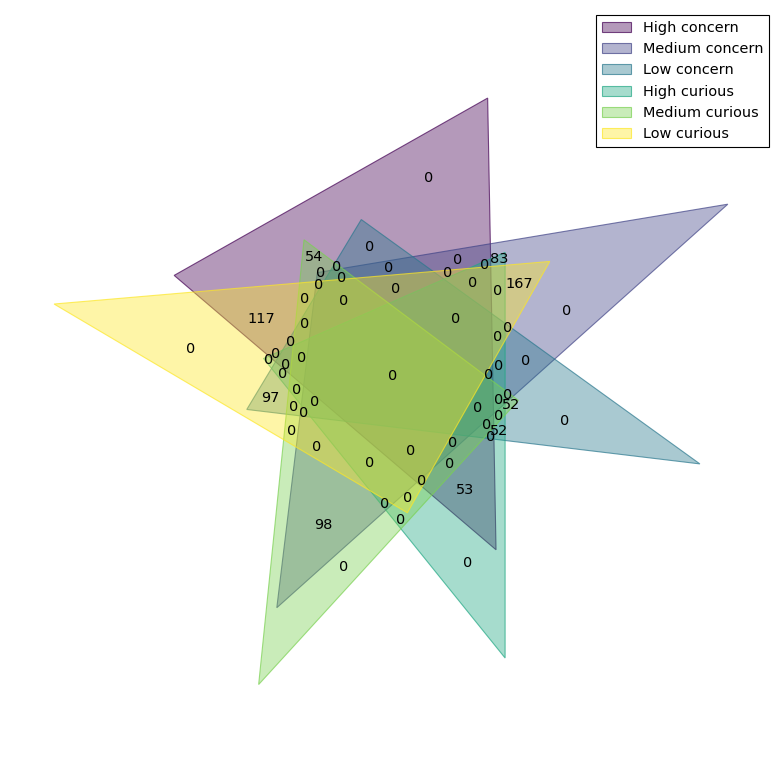

In [325]:
labels = ['High concern','Medium concern','Low concern','High curious','Medium curious','Low curious']
sets = {
    labels[0]: set_high_conc,
    labels[1]: set_medium_conc,
    labels[2]: set_low_conc,
    labels[3]: set_high_cu,
    labels[4]: set_medium_cu,
    labels[5]: set_low_cu
}

fig, ax = plt.subplots(1, figsize=(16,12))
venn(sets, ax=ax)
#plt.legend(labels)

<AxesSubplot:>

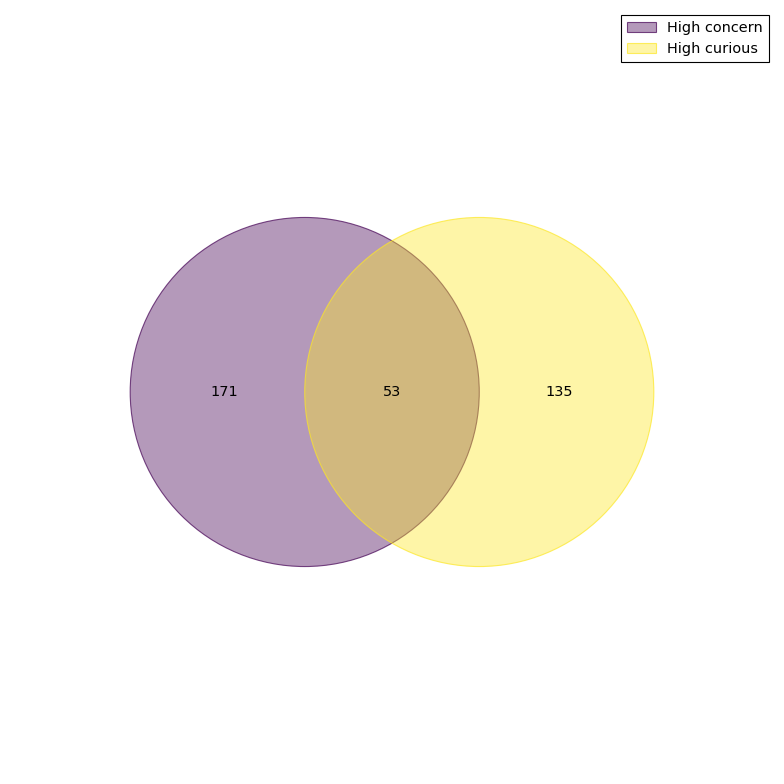

In [326]:
labels = ['High concern','Medium concern','Low concern','High curious','Medium curious','Low curious']
sets = {
    labels[0]: set_high_conc,
    labels[3]: set_high_cu
}

fig, ax = plt.subplots(1, figsize=(16,12))
venn(sets, ax=ax)
#plt.legend(labels)

<AxesSubplot:>

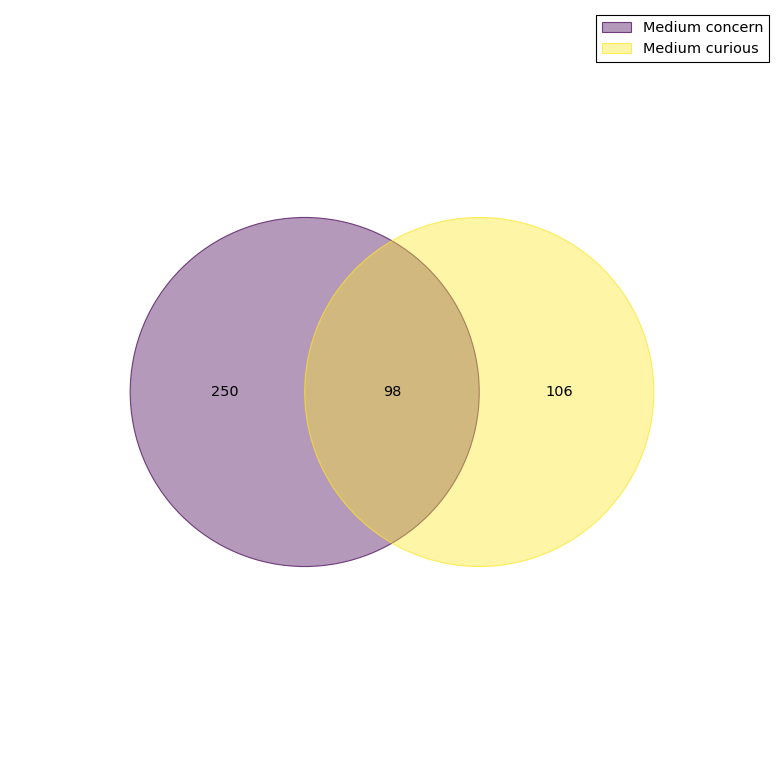

In [327]:
labels = ['High concern','Medium concern','Low concern','High curious','Medium curious','Low curious']
sets = {
    labels[1]: set_medium_conc,
    labels[4]: set_medium_cu
}

fig, ax = plt.subplots(1, figsize=(16,12))
venn(sets, ax=ax)
#plt.legend(labels)

<AxesSubplot:>

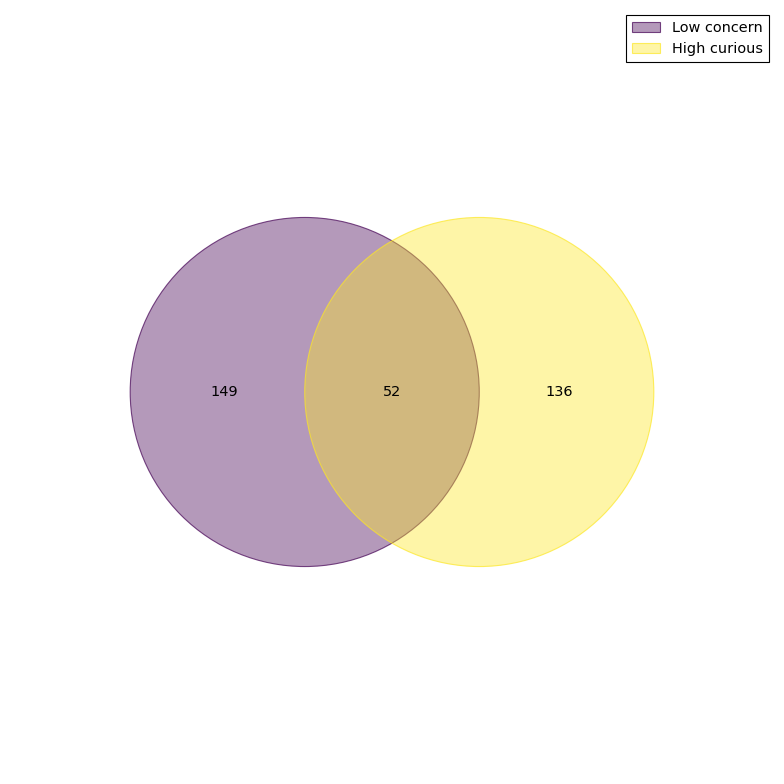

In [328]:
labels = ['High concern','Medium concern','Low concern','High curious','Medium curious','Low curious']
sets = {

    labels[2]: set_low_conc,
    labels[3]: set_high_cu,

}

fig, ax = plt.subplots(1, figsize=(16,12))
venn(sets, ax=ax)
#plt.legend(labels)

<AxesSubplot:>

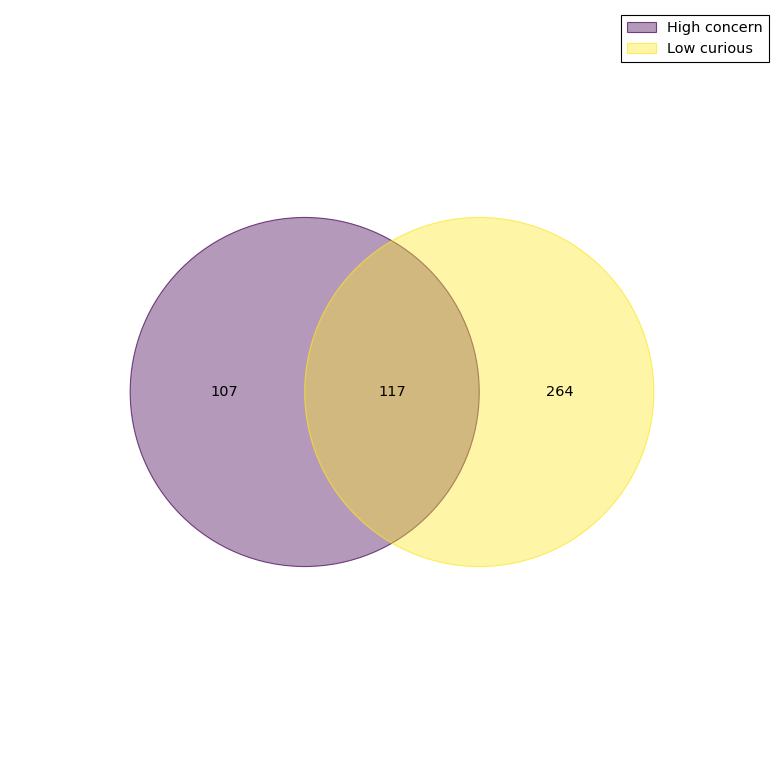

In [329]:
labels = ['High concern','Medium concern','Low concern','High curious','Medium curious','Low curious']
sets = {
    labels[0]: set_high_conc,
    labels[5]: set_low_cu
}

fig, ax = plt.subplots(1, figsize=(16,12))
venn(sets, ax=ax)
#plt.legend(labels)

<AxesSubplot:>

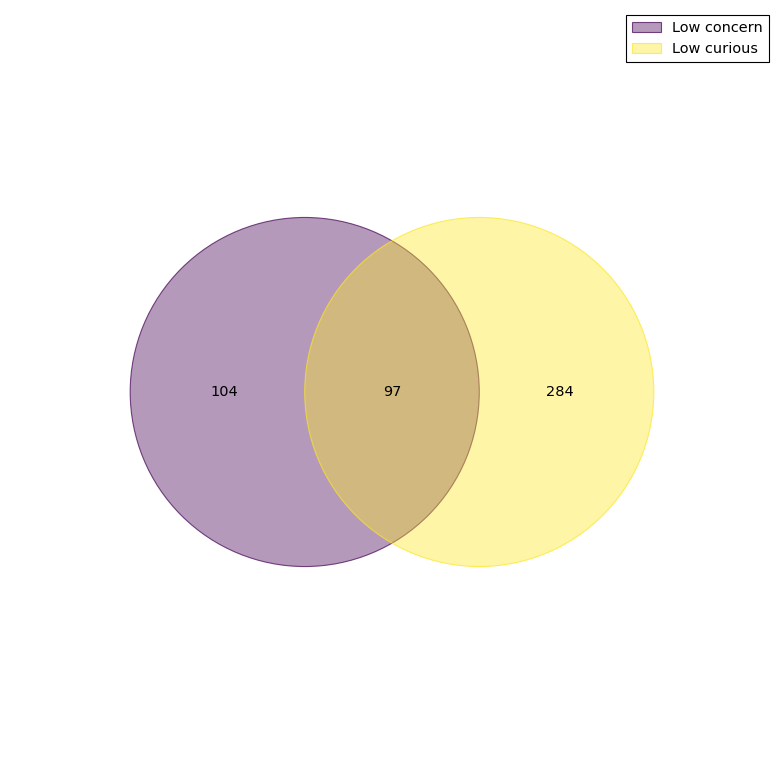

In [330]:
labels = ['High concern','Medium concern','Low concern','High curious','Medium curious','Low curious']
sets = {
    labels[2]: set_low_conc,
    labels[5]: set_low_cu
}

fig, ax = plt.subplots(1, figsize=(16,12))
venn(sets, ax=ax)
#plt.legend(labels)




In [331]:
giv = div_pdx[div_pdx['Variable'] == 'Class_X']
del giv['level_0']
del giv['Description']
del giv['Variable']
del giv['Group']
del giv['index']
giv

,id,Option
0,0,0 Low Scoring_profile
1,1,0 High Scoring_profile
2,3,0 High Scoring_profile
3,5,0 Low Scoring_profile
4,14,0 Low Scoring_profile
...,...,...
6179,1875,0 Low curiosity
6180,1885,0 Medium curiosity
6181,1886,0 Medium curiosity
6182,1887,0 Low curiosity


In [332]:
giv = pd.get_dummies(data=giv, columns=['Option'])

In [333]:
len(giv.columns)

20

In [334]:
giv

,id,Option_0 High Scoring_profile,Option_0 High concern,Option_0 High confident Confidence profile,Option_0 High curiosity,Option_0 Law Legal,Option_0 Law branch,Option_0 Low Scoring_profile,Option_0 Low concern,Option_0 Low confidence Confidence profile,Option_0 Low curiosity,Option_0 Medium concern,Option_0 Medium curiosity,Option_0 Non law Legal,Option_0 Not student,Option_0 Not student student,Option_0 Older Age Profile,Option_0 Other branch,Option_0 Student student,Option_0 Younger Age Profile
0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,5,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
4,14,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6179,1875,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
6180,1885,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
6181,1886,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
6182,1887,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [335]:
liv = giv.groupby(['id']).sum().reset_index()
liv

,id,Option_0 High Scoring_profile,Option_0 High concern,Option_0 High confident Confidence profile,Option_0 High curiosity,Option_0 Law Legal,Option_0 Law branch,Option_0 Low Scoring_profile,Option_0 Low concern,Option_0 Low confidence Confidence profile,Option_0 Low curiosity,Option_0 Medium concern,Option_0 Medium curiosity,Option_0 Non law Legal,Option_0 Not student,Option_0 Not student student,Option_0 Older Age Profile,Option_0 Other branch,Option_0 Student student,Option_0 Younger Age Profile
0,0,0,0,0,1,0,0,1,1,1,0,0,0,1,0,0,1,1,1,0
1,1,1,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,1,1,1
2,3,1,0,1,1,0,0,0,0,0,0,1,0,1,0,0,0,1,1,1
3,5,0,0,1,0,0,0,1,0,0,1,1,0,1,1,1,1,0,0,0
4,14,0,1,0,0,0,0,1,0,1,1,0,0,1,0,0,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
768,1875,1,0,0,0,0,0,0,1,1,1,0,0,1,1,1,1,0,0,0
769,1885,0,0,0,0,0,0,1,0,1,0,1,1,1,1,1,1,0,0,0
770,1886,1,0,0,0,0,0,0,0,1,0,1,1,1,1,1,1,0,0,0
771,1887,0,0,1,0,0,0,1,0,0,1,1,0,1,1,1,1,0,0,0


In [336]:
import dash_bio

In [337]:
#liv = liv.apply(lambda x: x.sort_values().values)
#del liv['id']

liv1 = liv.sort_values(['Option_0 High concern', 
                        'Option_0 Medium concern',
                       'Option_0 Low concern',
                       'Option_0 High curiosity',
                       'Option_0 Medium curiosity',
                       'Option_0 Low curiosity'])


fig = px.imshow(liv, text_auto=True, aspect="auto")

#fig.show()
#fig.write_html("/home/mrinalmanu/Documents/iglas_le/heatmap.html")

In [338]:
df = liv
fig = dash_bio.Clustergram(
    data=df,
    column_labels=list(df.columns.values),
    row_labels=list(df.index),
    height=1080,
    width=1080
)

for template in ["plotly_white"]:
    fig.update_layout(template=template)
    
#fig.write_html("/home/mrinalmanu/Documents/iglas_le/cluster.html")

In [339]:

cliv = megadf
cliv.drop('Variable', axis=1)
cliv.drop('Group', axis=1)

cliv

,id,Description,Option,Variable,Group
0,0,Scoring_profile,0 Low Scoring_profile,Class_X,0
1,1,Scoring_profile,0 High Scoring_profile,Class_X,0
2,3,Scoring_profile,0 High Scoring_profile,Class_X,0
3,5,Scoring_profile,0 Low Scoring_profile,Class_X,0
4,14,Scoring_profile,0 Low Scoring_profile,Class_X,0
...,...,...,...,...,...
19912,1875,"On average, how much of their total DNA is the...",10 True,LE5.017,10
19913,1885,"On average, how much of their total DNA is the...",10 False,LE5.017,10
19914,1886,"On average, how much of their total DNA is the...",10 True,LE5.017,10
19915,1887,"On average, how much of their total DNA is the...",10 False,LE5.017,10


In [340]:
cgiv = pd.get_dummies(data=cliv, columns=['Option'])
cgiv

,id,Description,Variable,Group,Option_0 High Scoring_profile,Option_0 High concern,Option_0 High confident Confidence profile,Option_0 High curiosity,Option_0 Law Legal,Option_0 Law branch branch,Option_0 Low Scoring_profile,Option_0 Low concern,Option_0 Low confidence Confidence profile,Option_0 Low curiosity,Option_0 Medium concern,Option_0 Medium curiosity,Option_0 Non law Legal,Option_0 Not a student branch,Option_0 Not student student,Option_0 Older Age Profile,Option_0 Other branch branch,Option_0 Student student,Option_0 Younger Age Profile,Option_1 Do not know,Option_1 Medical facilities,Option_1 One legal guardian sufficient,Option_1 Other,Option_1 Prohibited until child has legal capacity,Option_1 The State,Option_1 Two legal guardians need to agree,Option_10 False,Option_10 True,Option_2 Children,Option_2 Friends,Option_2 Future spouse or partner,Option_2 Other,Option_2 Other relatives,Option_2 Siblings,Option_2 Spouse or partner,Option_3 Agree to dissemination of GK,Option_3 Disagree to dissemination of GK,Option_3 Neutral towards to dissemination of GK,Option_3 Strongly agree to dissemination of GK,Option_3 Strongly disagree to dissemination of GK,Option_4 Agree to Policymaking,Option_4 Disagree to Policymaking,Option_4 Neutral towards to Policymaking,Option_4 Strongly agree to Policymaking,Option_4 Strongly disagree to Policymaking,Option_5 Agree to Revising and Updating,Option_5 Disagree to Revising and Updating,Option_5 Neutral towards to Revising and Updating,Option_5 Strongly agree to Revising and Updating,Option_5 Strongly disagree to Revising and Updating,Option_6 Do not know1,Option_6 No there should not be a law,Option_6 Yes there should be a law,Option_7 Do not know whether the data will be stored securely,Option_7 Do not know who will have access to that information,Option_7 I am concerned my data will be used for other purposes without my knowledge,Option_7 I am not interested,Option_7 I am worried some information about my physical or mental health could be used against me for example employment; legal matters; obtaining insurance,Option_7 I am worried that I might find out something about myself I would rather not know,Option_7 I would not want to be labelled as having any deficiency,Option_7 I would rather not know of any potential debilitating diseases that I may develop in the future,Option_7 Other,Option_8 Ancestry testing - Compulsory by a court or law enforcement,Option_8 Ancestry testing - Recommended by doctor,Option_8 Ancestry testing - Self-initiated,Option_8 As part of a research project as Compulsory for example by a court or law enforcement,Option_8 General interest - Compulsory by a court or law enforcement,Option_8 General interest - Recommended by doctor,Option_8 General interest - Self-initiated,Option_8 Health and diet - Compulsory by a court or law enforcement,Option_8 Health and diet - Recommended by doctor,Option_8 Health and diet - Self-initiated,Option_8 Medical testing - Compulsory by a court or law enforcement,Option_8 Medical testing - Recommended by doctor,Option_8 Medical testing - Self-initiated,Option_8 No,Option_8 Other - Compulsory by a court or law enforcement,Option_8 Other - Recommended by doctor,Option_8 Other - Self-initiated,Option_8 Paternity testing - Compulsory by a court or law enforcement,Option_8 Paternity testing - Recommended by doctor,Option_8 Paternity testing - Self-initiated,Option_8 Research project - Recommended by doctor,Option_8 Research project - Self-initiated,Option_9 23andMe,Option_9 23mofang,Option_9 24 genetics
0,0,Scoring_profile,Class_X,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,Scoring_profile,Class_X,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,3,Scoring_profile,Class_X,0,

In [341]:
ggive = cgiv.groupby(['id']).sum().reset_index()

In [342]:
del ggive['id']

In [343]:
df = ggive
#del df['id']
fig = dash_bio.Clustergram(
    data=df,
    column_labels=list(df.columns.values),
    row_labels=list(df.index),
    height=2080,
    width=1500
)
for template in ["plotly_white"]:
    fig.update_layout(template=template)
fig.write_html("/home/mrinalmanu/Documents/iglas_le/giant_cluster.html")

In [344]:
groups = ['0', '6', '8', '9']

tgiv = megadf[megadf['Group'].isin(groups)]

tgiv = tgiv.drop('Description', axis=1) 
tgiv = tgiv.drop('Variable', axis=1) 
tgiv = tgiv.drop('Group', axis=1) 

dtgiv = pd.get_dummies(data=tgiv, columns=['Option'])
dtgive = dtgiv.groupby(['id']).sum().reset_index()
dtgive = dtgive.drop('id', axis=1) 
df = dtgive
#del df['id']
fig = dash_bio.Clustergram(
    data=df,
    column_labels=list(df.columns.values),
    row_labels=list(df.index),
    height=1080,
    width=1080
)

for template in ["plotly_white"]:
    fig.update_layout(template=template)
    
fig.write_html("/home/mrinalmanu/Documents/iglas_le/181_cluster.html")

In [345]:
# MCA
import prince

In [346]:
gxf = nndf
#del gxf['level_0']
#del gxf['index']
gxf.head(2)

,level_0,id,Description,Option,Variable,Group,index
0,0,0,Scoring_profile,0 Low Scoring_profile,Class_X,0,NaN
1,1,1,Scoring_profile,0 High Scoring_profile,Class_X,0,NaN


In [347]:
gxf['Group'] = gxf['Group'].map(str)
nlarge_df = gxf[gxf['Group'] == '0']
selected_columns = nlarge_df[['Option']]
nlex = selected_columns.copy()
annot = nlarge_df[['id', 'Description']]
selected_columns = nlex[['Option']]
nlex = selected_columns.copy()
onehotnlex =  pd.get_dummies(nlex,drop_first=True)
onehotnlex = onehotnlex.dropna()
onehotnlex.replace({0: "False", 1: "True"}, inplace = True)
newx = pd.concat([annot, onehotnlex], axis=1)
##
newx

,id,Description,Option_0 High concern,Option_0 High confident Confidence profile,Option_0 High curiosity,Option_0 Law Legal,Option_0 Law branch,Option_0 Low Scoring_profile,Option_0 Low concern,Option_0 Low confidence Confidence profile,Option_0 Low curiosity,Option_0 Medium concern,Option_0 Medium curiosity,Option_0 Non law Legal,Option_0 Not student,Option_0 Not student student,Option_0 Older Age Profile,Option_0 Other branch,Option_0 Student student,Option_0 Younger Age Profile
0,0,Scoring_profile,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False
1,1,Scoring_profile,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,3,Scoring_profile,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,5,Scoring_profile,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False
4,14,Scoring_profile,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6179,1875,curiosity,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False
6180,1885,curiosity,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False
6181,1886,curiosity,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False
6182,1887,curiosity,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False


In [348]:
mca = prince.MCA(random_state=42)
ca = mca.fit(newx.iloc[:,2:20])

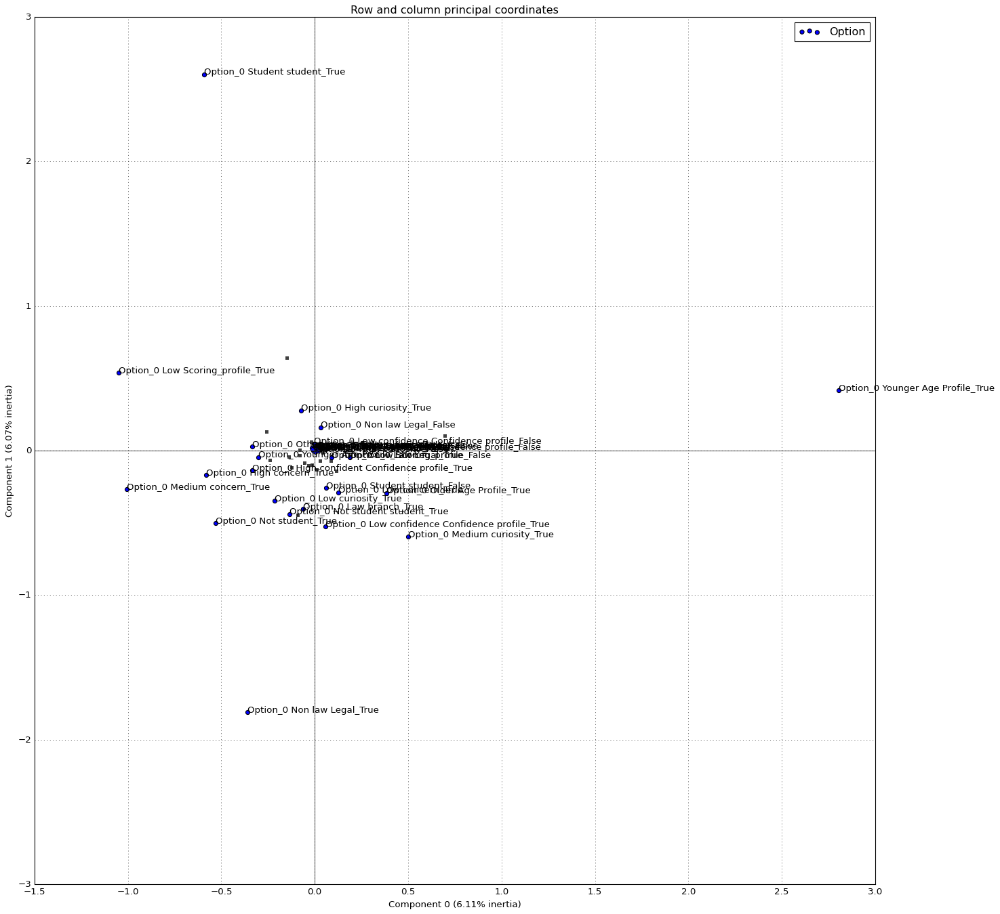

In [349]:
ax = mca.plot_coordinates(newx.iloc[:,2:20],
                     row_points_alpha=1,
                     figsize=(20, 20),
                     show_column_labels=True
                    );

# Additional patterns gk items (show)

In [350]:
# concern df

ccdf = megadf
ccdf.shape

(19917, 5)

In [351]:
rugk = gk_df[gk_df['UserLanguage'] == 'RU']
rugk = rugk[['id', 'Description', 'Option', 'Variable', 'Group']].copy()
rugk.head(2)

,id,Description,Option,Variable,Group
0,0,What is a genome?,All the genes in the DNA,LE5.012,58
1,1,What is a genome?,Correct - The entire sequence of DNA of an ind...,LE5.012,58


In [352]:
list_ru = list(gk_df[gk_df['UserLanguage'] == 'RU']['id'])

In [353]:
ncdf = ccdf[ccdf['id'].isin(list_ru)]
ncdf.shape

(18008, 5)

In [354]:
ngk = pd.concat([ncdf, rugk]).reset_index()
ngk

,index,id,Description,Option,Variable,Group
0,0,0,Scoring_profile,0 Low Scoring_profile,Class_X,0
1,1,1,Scoring_profile,0 High Scoring_profile,Class_X,0
2,2,3,Scoring_profile,0 High Scoring_profile,Class_X,0
3,3,5,Scoring_profile,0 Low Scoring_profile,Class_X,0
4,4,14,Scoring_profile,0 Low Scoring_profile,Class_X,0
...,...,...,...,...,...,...
24902,13377,1875,If a report states ‘the heritability of insomn...,There is an approximately 30 percent chance th...,LE5.031,64
24903,13387,1885,If a report states ‘the heritability of insomn...,If someone has insomnia this is approximately ...,LE5.031,64
24904,13388,1886,If a report states ‘the heritability of insomn...,If someone has insomnia this is approximately ...,LE5.031,64
24905,13389,1887,If a report states ‘the heritability of insomn...,There is an approximately 30 percent chance th...,LE5.031,64


#### Genetic familiarity is item 59 - preparation (no show)

In [355]:
gp0 = ngk[ngk['Group'] == '0'] #RU participants + filter of gp 0

# gk item 59
ngk.Group = ngk.Group.map(str)
gk59 = ngk[ngk['Group'] == '59']

In [356]:
gp0['Option'] = gp0['Option'].map(str)
gp0['Option'].replace('0 Law branch branch', '0 Law branch', inplace=True)
gp0['Option'].replace('0 Other branch branch', '0 Other branch', inplace=True)
gp0['Option'].replace('0 Not a student branch', '0 Not student', inplace=True)
gp0.Option.unique()

array(['0 Low Scoring_profile', '0 High Scoring_profile',
       '0 Older Age Profile', '0 Younger Age Profile',
       '0 Low confidence Confidence profile',
       '0 High confident Confidence profile', '0 Non law Legal',
       '0 Law Legal', '0 Student student', '0 Not student student',
       '0 Other branch', '0 Not student', '0 Law branch', '0 Low concern',
       '0 Medium concern', '0 High concern', '0 High curiosity',
       '0 Low curiosity', '0 Medium curiosity'], dtype=object)

In [357]:


# law_nonlaw

list_law = list(gp0[gp0['Option'] == '0 Law branch']['id'])
list_other = list(gp0[gp0['Option'] == '0 Other branch']['id'])
list_not = list(gp0[gp0['Option'] == '0 Not student']['id'])

law_pdx = gk59[gk59['id'].isin(list_law)]
law_pdx = law_pdx[law_pdx['Group'] != '0']

other_pdx = gk59[gk59['id'].isin(list_other)]
other_pdx = other_pdx[other_pdx['Group'] != '0']

not_pdx = gk59[gk59['id'].isin(list_not)]
not_pdx = not_pdx[not_pdx['Group'] != '0']

# low_high gk scores

list_highgk = list(gp0[gp0['Option'] == '0 High Scoring_profile']['id'])
list_lowgk = list(gp0[gp0['Option'] == '0 Low Scoring_profile']['id'])

lowgk_pdx = gk59[gk59['id'].isin(list_lowgk)]
lowgk_pdx = lowgk_pdx[lowgk_pdx['Group'] != '0']

highgk_pdx = gk59[gk59['id'].isin(list_highgk)]
highgk_pdx = highgk_pdx[highgk_pdx['Group'] != '0']

# low_high curiosity

list_highcurious = list(gp0[gp0['Option'] == '0 High curiosity']['id'])
list_lowcurious = list(gp0[gp0['Option'] == '0 Low curiosity']['id'])

lowcurious_pdx = gk59[gk59['id'].isin(list_lowcurious)]
lowcurious_pdx = lowcurious_pdx[lowcurious_pdx['Group'] != '0']

highcurious_pdx = gk59[gk59['id'].isin(list_highcurious)]
highcurious_pdx = highcurious_pdx[highcurious_pdx['Group'] != '0']



In [358]:
################# counting

################################## PDXS
### law

pdx = law_pdx

cdf = pdx.groupby(["Group", "Description", "Variable"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
cdf['rating'] = nx.iloc[:,2]

wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 4]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

    
vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)
del ndfx['rating']
del ndfx['Option']


lex = ndfx.set_index(['Group','Description', 'Variable']).stack().reset_index()
# rename columns 2 and 3



lex["Option"] = lex['level_3']
lex["Count"] = lex[0]

del lex['level_3']
del lex[0]


snorlex = lex
law_xn = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2).reset_index()
x = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2)
law_xf = x.groupby(level=[0, 1]).apply(lambda g: g / g.sum()).round(2).reset_index()


### other


pdx = other_pdx

cdf = pdx.groupby(["Group", "Description", "Variable"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
cdf['rating'] = nx.iloc[:,2]

wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 4]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

    
vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)
del ndfx['rating']
del ndfx['Option']


lex = ndfx.set_index(['Group','Description', 'Variable']).stack().reset_index()
# rename columns 2 and 3



lex["Option"] = lex['level_3']
lex["Count"] = lex[0]

del lex['level_3']
del lex[0]


snorlex = lex
other_xn = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2).reset_index()
x = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2)
other_xf = x.groupby(level=[0, 1]).apply(lambda g: g / g.sum()).round(2).reset_index()

### not


pdx = not_pdx

cdf = pdx.groupby(["Group", "Description", "Variable"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
cdf['rating'] = nx.iloc[:,2]

wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 4]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

    
vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)
del ndfx['rating']
del ndfx['Option']


lex = ndfx.set_index(['Group','Description', 'Variable']).stack().reset_index()
# rename columns 2 and 3



lex["Option"] = lex['level_3']
lex["Count"] = lex[0]

del lex['level_3']
del lex[0]


snorlex = lex
not_xn = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2).reset_index()
x = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2)
not_xf = x.groupby(level=[0, 1]).apply(lambda g: g / g.sum()).round(2).reset_index()

### high gk

pdx = highgk_pdx

cdf = pdx.groupby(["Group", "Description", "Variable"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
cdf['rating'] = nx.iloc[:,2]

wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 4]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

    
vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)
del ndfx['rating']
del ndfx['Option']


lex = ndfx.set_index(['Group','Description', 'Variable']).stack().reset_index()
# rename columns 2 and 3



lex["Option"] = lex['level_3']
lex["Count"] = lex[0]

del lex['level_3']
del lex[0]


snorlex = lex
highgk_xn = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2).reset_index()
x = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2)
highgk_xf = x.groupby(level=[0, 1]).apply(lambda g: g / g.sum()).round(2).reset_index()

### low gk

pdx = lowgk_pdx

cdf = pdx.groupby(["Group", "Description", "Variable"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
cdf['rating'] = nx.iloc[:,2]

wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 4]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

    
vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)
del ndfx['rating']
del ndfx['Option']


lex = ndfx.set_index(['Group','Description', 'Variable']).stack().reset_index()
# rename columns 2 and 3



lex["Option"] = lex['level_3']
lex["Count"] = lex[0]

del lex['level_3']
del lex[0]


snorlex = lex
lowgk_xn = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2).reset_index()
x = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2)
lowgk_xf = x.groupby(level=[0, 1]).apply(lambda g: g / g.sum()).round(2).reset_index()

### low curious
pdx = lowcurious_pdx

cdf = pdx.groupby(["Group", "Description", "Variable"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
cdf['rating'] = nx.iloc[:,2]

wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 4]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

    
vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)
del ndfx['rating']
del ndfx['Option']


lex = ndfx.set_index(['Group','Description', 'Variable']).stack().reset_index()
# rename columns 2 and 3



lex["Option"] = lex['level_3']
lex["Count"] = lex[0]

del lex['level_3']
del lex[0]


snorlex = lex
lowcurious_xn = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2).reset_index()
x = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2)
lowcurious_xf = x.groupby(level=[0, 1]).apply(lambda g: g / g.sum()).round(2).reset_index()


### high curious

pdx = highcurious_pdx

cdf = pdx.groupby(["Group", "Description", "Variable"])["Option"].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['Option'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series
cdf['rating'] = nx.iloc[:,2]

wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 4]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

    
vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)
del ndfx['rating']
del ndfx['Option']


lex = ndfx.set_index(['Group','Description', 'Variable']).stack().reset_index()
# rename columns 2 and 3



lex["Option"] = lex['level_3']
lex["Count"] = lex[0]

del lex['level_3']
del lex[0]


snorlex = lex
highcurious_xn = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2).reset_index()
x = snorlex.groupby(['Group','Description', 'Option'])['Count'].mean().round(2)
highcurious_xf = x.groupby(level=[0, 1]).apply(lambda g: g / g.sum()).round(2).reset_index()



In [359]:
law_xn['Group'] = law_xn['Group']+' '+'Law'
other_xn['Group'] = other_xn['Group']+' '+'Other'
not_xn['Group'] = not_xn['Group']+' '+'Not student'

highgk_xn['Group'] = highgk_xn['Group']+' '+'High GK'
lowgk_xn['Group'] = lowgk_xn['Group']+' '+'Low GK'

lowcurious_xn['Group'] = lowcurious_xn['Group']+' '+'Low Curious'
highcurious_xn['Group'] = highcurious_xn['Group']+' '+'High Curious'

law_xf['Group'] = law_xf['Group']+' '+'Law'
other_xf['Group'] = other_xf['Group']+' '+'Other'
not_xf['Group'] = not_xf['Group']+' '+'Not student'

highgk_xf['Group'] = highgk_xf['Group']+' '+'High GK'
lowgk_xf['Group'] = lowgk_xf['Group']+' '+'Low GK'

lowcurious_xf['Group'] = lowcurious_xf['Group']+' '+'Low Curious'
highcurious_xf['Group'] = highcurious_xf['Group']+' '+'High Curious'


In [360]:
############## combined
cb_xf = pd.concat([law_xf, other_xf, not_xf, highgk_xf, lowgk_xf, highcurious_xf, lowcurious_xf])
cb_xn = pd.concat([law_xn, other_xn, not_xn, highgk_xn, lowgk_xn, highcurious_xn, lowcurious_xn])

#### plots item 59 (Show)

In [361]:
cb_xf['Valid'] = cb_xf['Option'].apply(lambda x: int('Correct' in x) if isinstance('Correct', str) else 0)
cb_xn['Valid'] = cb_xn['Option'].apply(lambda x: int('Correct' in x) if isinstance('Correct', str) else 0)
cb_xf.head(2)

,Group,Description,Option,Count,Valid
0,59 Law,"On average, how much of their total DNA is the...",75 percent,0.29,0
1,59 Law,"On average, how much of their total DNA is the...",90 percent,0.10,0


In [362]:
cb_xf.head(2)

,Group,Description,Option,Count,Valid
0,59 Law,"On average, how much of their total DNA is the...",75 percent,0.29,0
1,59 Law,"On average, how much of their total DNA is the...",90 percent,0.10,0


In [363]:
fig_high = px.bar(cb_xn, x="Group", color="Valid",
             y='Count',
             title="Item 59 Grouped",
             barmode='group',
             height=1080,
             text='Option'
            )
fig_high.update_layout(
    title="""Item 59: Law (N={}), Non Law (N={}), Not Students (N={}), High GK (N={}), Low GK (N={}), High Curiousity (N={}), and Low Curiousity (N={})
    """.format(len(list_law), len(list_other), len(list_not), len(list_highgk), len(list_lowgk), len(list_highcurious), len(list_lowcurious)),
    xaxis_title="Item",
    yaxis_title="Proportion of response",
    legend_title="Options",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="RebeccaPurple"
    ),
barmode="stack",
)

fig_high.update_traces(showlegend=False)
fig_high.update_traces(marker_showscale=False)

fig_high.update_xaxes(
    showgrid=True,
    ticks="outside",
    tickson="boundaries",
    ticklen=1,
    tickmode='linear'
)



In [364]:
fig_high.show()

In [365]:
fig_high = px.bar(cb_xf, x="Group", color="Valid",
             y='Count',
             title="Item 59 Grouped",
             barmode='group',
             height=1080,
             text='Option'
            )
fig_high.update_layout(
    title="""Item 59: Law (N={}), Non Law (N={}), Not Students (N={}), High GK (N={}), Low GK (N={}), High Curiousity (N={}), and Low Curiousity (N={})
    """.format(len(list_law), len(list_other), len(list_not), len(list_highgk), len(list_lowgk), len(list_highcurious), len(list_lowcurious)),
    xaxis_title="Item",
    yaxis_title="Proportion of response",
    legend_title="Options",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="RebeccaPurple"
    ),
barmode="stack",
)

fig_high.update_traces(showlegend=False)
fig_high.update_traces(marker_showscale=False)

fig_high.update_xaxes(
    showgrid=True,
    ticks="outside",
    tickson="boundaries",
    ticklen=1,
    tickmode='linear'
)



In [366]:
fig_high.show()

In [367]:
fig_high = px.bar(cb_xn, x="Option", color="Valid",
             y='Count',
             title="Item 59 Grouped",
             barmode='group',
             height=1080,
             text='Group'
            )
fig_high.update_layout(
    title="""Item 59: Law (N={}), Non Law (N={}), Not Students (N={}), High GK (N={}), Low GK (N={}), High Curiousity (N={}), and Low Curiousity (N={})
    """.format(len(list_law), len(list_other), len(list_not), len(list_highgk), len(list_lowgk), len(list_highcurious), len(list_lowcurious)),
    xaxis_title="Item",
    yaxis_title="Absolute Proportion of response",
    legend_title="Options",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="RebeccaPurple"
    ),
barmode="stack",
)

fig_high.update_traces(showlegend=False)
fig_high.update_traces(marker_showscale=False)

fig_high.update_xaxes(
    showgrid=True,
    ticks="outside",
    tickson="boundaries",
    ticklen=1,
    tickmode='linear'
)



In [368]:
fig_high.show()

In [369]:
fig_high = px.bar(cb_xf, x="Option", color="Valid",
             y='Count',
             title="Item 59 Grouped",
             barmode='group',
             height=1080,
             text='Group'
            )
fig_high.update_layout(
    title="""Item 59: Law (N={}), Non Law (N={}), Not Students (N={}), High GK (N={}), Low GK (N={}), High Curiousity (N={}), and Low Curiousity (N={})
    """.format(len(list_law), len(list_other), len(list_not), len(list_highgk), len(list_lowgk), len(list_highcurious), len(list_lowcurious)),
    xaxis_title="Item",
    yaxis_title="Cumulative Proportion of response",
    legend_title="Options",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="RebeccaPurple"
    ),
barmode="stack",
)

fig_high.update_traces(showlegend=False)
fig_high.update_traces(marker_showscale=False)

fig_high.update_xaxes(
    showgrid=True,
    ticks="outside",
    tickson="boundaries",
    ticklen=1,
    tickmode='linear'
)



In [370]:
fig_high.show()

In [371]:
del gk59['index']
gk59.head(2)

,id,Description,Option,Variable,Group
19985,0,"On average, how much of their total DNA is the...",90 percent,LE5.017,59
19986,1,"On average, how much of their total DNA is the...",90 percent,LE5.017,59


In [372]:
decisiondf = megadf[megadf['Group'] == '1']

comp_df = pd.concat([gk59, decisiondf])
#comp_df['Group'] = comp_df['Group']+' '+comp_df['Option']

In [373]:
nndf = comp_df
nndf.head(2)

,id,Description,Option,Variable,Group
19985,0,"On average, how much of their total DNA is the...",90 percent,LE5.017,59
19986,1,"On average, how much of their total DNA is the...",90 percent,LE5.017,59


In [374]:
mergedf = pd.merge(gk59, nndf, on='id')
#mergedf.drop_duplicates(subset=['Option_x', 'Option_y'], inplace=True)
vdf = mergedf[mergedf['Option_x'] != mergedf['Option_y']]
vdf['Option'] = vdf['Option_x']+' + '+vdf['Option_y']
del vdf['Option_x']
del vdf['Option_y']

vdf['Count'] = vdf['Option']
vdf['Count'] = 1

cdf = vdf[['Option', 'Count']].copy()
cdf = cdf.groupby(['Option'])['Count'].sum().reset_index()

cdf['Valid'] = cdf['Option'].apply(lambda x: int('Correct' in x) if isinstance('Correct', str) else 0)
cdf.head(2)

,Option,Count,Valid
0,75 percent + 1 Do not know,12,0
1,75 percent + 1 Medical facilities,7,0


In [375]:
cdf[['Relatedness', 'Decision']] = cdf['Option'].str.split('+', 1, expand=True)
cdf

,Option,Count,Valid,Relatedness,Decision
0,75 percent + 1 Do not know,12,0,75 percent,1 Do not know
1,75 percent + 1 Medical facilities,7,0,75 percent,1 Medical facilities
2,75 percent + 1 One legal guardian sufficient,4,0,75 percent,1 One legal guardian sufficient
3,75 percent + 1 Other,3,0,75 percent,1 Other
4,75 percent + 1 Prohibited until child has lega...,62,0,75 percent,1 Prohibited until child has legal capacity
5,75 percent + 1 The State,1,0,75 percent,1 The State
6,75 percent + 1 Two legal guardians need to agree,90,0,75 percent,1 Two legal guardians need to agree
7,90 percent + 1 Do not know,6,0,90 percent,1 Do not know
8,90 percent + 1 Medical facilities,7,0,90 percent,1 Medical facilities
9,90 percent + 1 One legal guardian sufficient,4,0,90 percent,1 One legal guardian sufficient


In [376]:
cdf = cdf.sort_values('Count')

In [377]:
fig_high = px.bar(cdf, x="Decision", color="Valid",
             y='Count',
             title="Relatedness X Newborn Screening Decision",
             barmode='group',
             height=1080,
             text_auto=True,
                  facet_col='Relatedness'
            )
fig_high.update_layout(
    title="Relatedness X Newborn Screening Decision (N{})".format(len(vdf)),
    xaxis_title="Item",
    yaxis_title="Count of response",
    legend_title="Options",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="RebeccaPurple"
    ),
barmode="stack",
)

fig_high.update_traces(showlegend=False)
fig_high.update_traces(marker_showscale=False)

fig_high.update_xaxes(
    showgrid=True,
    ticks="outside",
    tickson="boundaries",
    ticklen=1,
    tickmode='linear'
)



In [378]:
fig_high.show()

# Everything with everything

23
24
25
27
65
66
67

In [379]:
from functools import reduce

In [380]:
ncps = cps[['id', 'Option']].copy()
nndf_23 = ndf_23[['id', 'Option']].copy()
nndf_24 = ndf_24[['id', 'Option']].copy() # unselec
nndf_65 = ndf_65[['id', 'Option']].copy()
nndf_66 = ndf_66[['id', 'Option']].copy()
nndf_67 = ndf_67[['id', 'Option']].copy()
nndf_25 = ndf_25[['id', 'Option']].copy()
nndf_27 = ndf_27[['id', 'Option']].copy()
nndf_29_new = ndf_29_new[['id', 'Option']].copy() # unselect
nndf_30 = ndf_30[['id', 'Option']].copy() # unselect

In [381]:
nnmegadf = reduce(lambda x,y: pd.merge(x,y, on='id', how='outer'), [ncps ,nndf_23, nndf_65, nndf_66, nndf_67, nndf_25, nndf_27])
nnmegadf

/tmp/ipykernel_2972/2300915396.py:1: FutureWarning:

Passing 'suffixes' which cause duplicate columns {'Option_x'} in the result is deprecated and will raise a MergeError in a future version.

/tmp/ipykernel_2972/2300915396.py:1: FutureWarning:

Passing 'suffixes' which cause duplicate columns {'Option_x'} in the result is deprecated and will raise a MergeError in a future version.



,id,Option_x,Option_y,Option_x,Option_y,Option_x,Option_y,Option
0,0,Low Scoring_profile,Two legal guardians need to agree,Strongly disagree to dissemination of GK,Strongly disagree to Policymaking,Strongly disagree to Revising and Updating,Yes there should be a law,Other
1,0,Older Age Profile,Two legal guardians need to agree,Strongly disagree to dissemination of GK,Strongly disagree to Policymaking,Strongly disagree to Revising and Updating,Yes there should be a law,Other
2,0,Low confidence Confidence profile,Two legal guardians need to agree,Strongly disagree to dissemination of GK,Strongly disagree to Policymaking,Strongly disagree to Revising and Updating,Yes there should be a law,Other
3,0,Non law Legal,Two legal guardians need to agree,Strongly disagree to dissemination of GK,Strongly disagree to Policymaking,Strongly disagree to Revising and Updating,Yes there should be a law,Other
4,0,Student student,Two legal guardians need to agree,Strongly disagree to dissemination of GK,Strongly disagree to Policymaking,Strongly disagree to Revising and Updating,Yes there should be a law,Other
...,...,...,...,...,...,...,...,...
18519,1203,NaN,NaN,NaN,NaN,NaN,NaN,Other
18520,1296,NaN,NaN,NaN,NaN,NaN,NaN,Other
18521,1374,NaN,NaN,NaN,NaN,NaN,NaN,Other
18522,1812,NaN,NaN,NaN,NaN,NaN,NaN,Other


In [382]:
len(nnmegadf['id'].unique())

1520

In [383]:
nnmegadf.columns = ['id', 'class', 'q23', 'q65', 'q66', 'q67', 'q25', 'q27']

In [384]:
#nnmegadf['div'] = nnmegadf['gender']+' '+nnmegadf['class']

In [385]:
gxdf = nnmegadf[['class', 'q23', 'q65', 'q66', 'q67', 'q25', 'q27']].copy()
nxdf = gxdf.melt(id_vars=gxdf.columns[0])
nxdf = nxdf.drop(labels=['variable'], axis=1)
nxdf.columns = ['variable', 'value']
nxdf = nxdf.sort_values(by='variable')
nxdf = nxdf.reset_index(drop=True)

In [386]:
nxdf.dropna(inplace= True)
nxdf

,variable,value
0,High Scoring_profile,Agree to Policymaking
1,High Scoring_profile,Two legal guardians need to agree
2,High Scoring_profile,Two legal guardians need to agree
3,High Scoring_profile,Two legal guardians need to agree
4,High Scoring_profile,Two legal guardians need to agree
...,...,...
100215,Younger Age Profile,Strongly agree to Revising and Updating
100220,Younger Age Profile,Strongly agree to Revising and Updating
100221,Younger Age Profile,Two legal guardians need to agree
100222,Younger Age Profile,Two legal guardians need to agree


In [387]:
vdf = nxdf
vdf['count'] = vdf['value']
vdf['count'] = 1
vdf = vdf.groupby(['variable', 'value'])['count'].sum().reset_index()
vdf['value'].replace('I am worried some information about my physical or mental health could be used against me for example employment; legal matters; obtaining insurance',
                    'Worry about discrimination...', inplace=True)
vdf

,variable,value,count
0,High Scoring_profile,Agree to Policymaking,298
1,High Scoring_profile,Agree to Revising and Updating,351
2,High Scoring_profile,Agree to dissemination of GK,316
3,High Scoring_profile,Disagree to Policymaking,12
4,High Scoring_profile,Disagree to Revising and Updating,32
...,...,...,...
607,Younger Age Profile,Strongly disagree to Revising and Updating,80
608,Younger Age Profile,Strongly disagree to dissemination of GK,127
609,Younger Age Profile,The State,5
610,Younger Age Profile,Two legal guardians need to agree,839


In [388]:
cvdf = vdf
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler(feature_range=(0,100))

cvdf['count_scaled'] =  scaler.fit_transform(cvdf[["count"]]).round(2)

cvdf = cvdf[cvdf['count_scaled'] > 5] # at 5%
cvdf = cvdf.sort_values('count_scaled')
cvdf

,variable,value,count,count_scaled
81,High confident Confidence profile,Neutral towards to Policymaking,43,5.01
347,Medium concern,Strongly disagree to Revising and Updating,43,5.01
163,Law branch branch,Disagree to dissemination of GK,43,5.01
162,Law branch branch,Disagree to Revising and Updating,43,5.01
132,Law Legal,Disagree to Revising and Updating,43,5.01
...,...,...,...,...
581,Younger Age Profile,Agree to dissemination of GK,754,89.86
285,Low confidence Confidence profile,Two legal guardians need to agree,756,90.10
577,Student student,Two legal guardians need to agree,767,91.41
580,Younger Age Profile,Agree to Revising and Updating,804,95.82


In [389]:
megadf

,id,Description,Option,Variable,Group
0,0,Scoring_profile,0 Low Scoring_profile,Class_X,0
1,1,Scoring_profile,0 High Scoring_profile,Class_X,0
2,3,Scoring_profile,0 High Scoring_profile,Class_X,0
3,5,Scoring_profile,0 Low Scoring_profile,Class_X,0
4,14,Scoring_profile,0 Low Scoring_profile,Class_X,0
...,...,...,...,...,...
19912,1875,"On average, how much of their total DNA is the...",10 True,LE5.017,10
19913,1885,"On average, how much of their total DNA is the...",10 False,LE5.017,10
19914,1886,"On average, how much of their total DNA is the...",10 True,LE5.017,10
19915,1887,"On average, how much of their total DNA is the...",10 False,LE5.017,10


In [390]:
# plot the data
fig = px.scatter(cvdf, x="value", y="count_scaled", color='variable')

fig.update_layout(
    margin=dict(l=40, r=40, t=40, b=40),
    paper_bgcolor="LightSteelBlue",
)


#fig.write_html("/home/mrinalmanu/Documents/iglas_le/patternsx.html")


In [391]:
fig.show()

In [392]:
fig = px.scatter_3d(cvdf, x='variable', y='value', z='count_scaled',
              color='variable')

fig.update_layout(
    margin=dict(l=30, r=40, t=40, b=40),
    paper_bgcolor="LightSteelBlue"
)

#fig.write_html("/home/mrinalmanu/Documents/iglas_le/patterns.html")


In [393]:
fig.show()

In [394]:
cvdf.columns = ['Option', 'Value', 'Count', 'Scaled Count']
cvdf

,Option,Value,Count,Scaled Count
81,High confident Confidence profile,Neutral towards to Policymaking,43,5.01
347,Medium concern,Strongly disagree to Revising and Updating,43,5.01
163,Law branch branch,Disagree to dissemination of GK,43,5.01
162,Law branch branch,Disagree to Revising and Updating,43,5.01
132,Law Legal,Disagree to Revising and Updating,43,5.01
...,...,...,...,...
581,Younger Age Profile,Agree to dissemination of GK,754,89.86
285,Low confidence Confidence profile,Two legal guardians need to agree,756,90.10
577,Student student,Two legal guardians need to agree,767,91.41
580,Younger Age Profile,Agree to Revising and Updating,804,95.82


In [395]:
ncps = cps[['Description', 'Option']].copy()
ncps.drop_duplicates(inplace = True)


In [396]:
ncps.Option.unique

<bound method Series.unique of 0                     Low Scoring_profile
1                    High Scoring_profile
773                     Older Age Profile
774                   Younger Age Profile
1546    Low confidence Confidence profile
1548    High confident Confidence profile
2319                        Non law Legal
2372                            Law Legal
3092                      Student student
3095                  Not student student
3865                  Other branch branch
3868                 Not a student branch
3918                    Law branch branch
4638                          Low concern
4639                       Medium concern
4642                         High concern
5411                       High curiosity
5412                        Low curiosity
5422                     Medium curiosity
Name: Option, dtype: object>

In [397]:
ncvdf = pd.merge(cvdf, ncps, on='Option')

In [398]:
select = ['High curiosity', 'Medium curiosity', 'Low curiosity', 'High concern', 'Medium concern', 'Low concern']
ncvdf = ncvdf[ncvdf['Option'].isin(select)]
ncvdf

,Option,Value,Count,Scaled Count,Description
18,Medium concern,Strongly disagree to Revising and Updating,43,5.01,concern
19,Medium concern,Disagree to Revising and Updating,44,5.13,concern
20,Medium concern,Disagree to dissemination of GK,50,5.85,concern
21,Medium concern,Strongly disagree to Policymaking,51,5.97,concern
22,Medium concern,I would not want to be labelled as having any ...,53,6.21,concern
...,...,...,...,...,...
350,High curiosity,Agree to Revising and Updating,202,23.99,curiosity
351,High curiosity,Strongly agree to dissemination of GK,212,25.18,curiosity
352,High curiosity,Agree to dissemination of GK,215,25.54,curiosity
353,High curiosity,Strongly agree to Policymaking,230,27.33,curiosity


In [399]:
ncvdf = ncvdf.sort_values('Count', ascending=False)
ncvdf['Options'] = ncvdf['Value'].str.slice(0,20)+'...'

In [400]:
ncvdf

,Option,Value,Count,Scaled Count,Description,Options
191,Low curiosity,Two legal guardians need to agree,527,62.77,curiosity,Two legal guardians ...
295,High concern,Two legal guardians need to agree,525,62.53,concern,Two legal guardians ...
190,Low curiosity,Agree to Revising and Updating,488,58.11,curiosity,Agree to Revising an...
294,High concern,Agree to Revising and Updating,468,55.73,concern,Agree to Revising an...
189,Low curiosity,Agree to dissemination of GK,454,54.06,curiosity,Agree to disseminati...
...,...,...,...,...,...,...
167,Low curiosity,I am worried that I might find out something a...,47,5.49,curiosity,I am worried that I ...
258,Medium curiosity,Neutral towards to Revising and Updating,47,5.49,curiosity,Neutral towards to R...
166,Low curiosity,I would rather not know of any potential debil...,46,5.37,curiosity,I would rather not k...
19,Medium concern,Disagree to Revising and Updating,44,5.13,concern,Disagree to Revising...


In [401]:

fig = px.scatter(ncvdf, x="Options", y="Scaled Count", color='Option')

fig.update_layout(
    margin=dict(l=40, r=40, t=40, b=40),
    paper_bgcolor="LightSteelBlue"
)

fig.update_xaxes(showticklabels=True)

for template in ["plotly_white"]:
    fig.update_layout(template=template)
    fig.show()

fig.write_html("/home/mrinalmanu/Documents/iglas_le/ipatternsx.html")

In [402]:
fig.show()

#

EON